In [ ]:
#importing required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sn
from sklearn.metrics import confusion_matrix
import xlrd
import csv
# Import a scoring metric to compare methods
from sklearn.metrics import r2_score
%matplotlib inline
import time
%matplotlib inline
#for HD images
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('retina')

#ignore warning
import warnings
warnings.filterwarnings('ignore')

In [ ]:
import pandas as pd
df1= pd.read_csv('urbantraining.csv')

df1.head()

,class,BrdIndx,Area,Round,Bright,Compact,ShpIndx,Mean_NIR,Mean_R,Mean_G,...,SD_G_140,LW_140,GLCM1_140,Rect_140,GLCM2_140,Dens_140,Assym_140,NDVI_140,BordLngth_140,GLCM3_140
0,car,1.27,91,0.97,231.38,1.39,1.47,207.92,241.74,244.48,...,26.18,2.00,0.50,0.85,6.29,1.67,0.70,-0.08,56,3806.36
1,concrete,2.36,241,1.56,216.15,2.46,2.51,187.85,229.39,231.20,...,22.29,2.25,0.79,0.55,8.42,1.38,0.81,-0.09,1746,1450.14
2,concrete,2.12,266,1.47,232.18,2.07,2.21,206.54,244.22,245.79,...,15.59,2.19,0.76,0.74,7.24,1.68,0.81,-0.07,566,1094.04
3,concrete,2.42,399,1.28,230.40,2.49,2.73,204.60,243.27,243.32,...,13.51,3.34,0.82,0.74,7.44,1.36,0.92,-0.09,1178,1125.38
4,concrete,2.15,944,1.73,193.18,2.28,4.10,165.98,205.55,208.00,...,15.65,50.08,0.85,0.49,8.15,0.23,1.00,-0.08,6232,1146.38


In [ ]:
df2= pd.read_csv('urbantesting.csv')

df2.head()

,class,BrdIndx,Area,Round,Bright,Compact,ShpIndx,Mean_NIR,Mean_R,Mean_G,...,SD_G_140,LW_140,GLCM1_140,Rect_140,GLCM2_140,Dens_140,Assym_140,NDVI_140,BordLngth_140,GLCM3_140
0,concrete,1.32,131,0.81,222.74,1.66,2.18,192.94,235.11,240.15,...,31.15,5.04,0.80,0.58,8.56,0.82,0.98,-0.10,1512,1287.52
1,shadow,1.59,864,0.94,47.56,1.41,1.87,36.82,48.78,57.09,...,12.01,3.70,0.52,0.96,7.01,1.69,0.86,-0.14,196,2659.74
2,shadow,1.41,409,1.00,51.38,1.37,1.53,41.72,51.96,60.48,...,18.75,3.09,0.90,0.63,8.32,1.38,0.84,0.10,1198,720.38
3,tree,2.58,187,1.91,70.08,3.41,3.11,93.13,55.20,61.92,...,27.67,6.33,0.89,0.70,8.56,1.10,0.96,0.20,524,891.36
4,asphalt,2.60,116,2.05,89.57,3.06,3.02,73.17,94.89,100.64,...,32.05,1.01,0.83,0.75,8.62,2.08,0.08,-0.10,496,1194.76


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder


# Preparing features (X) and target (y) for the training dataset
X_train_full = df1.drop(columns=['class'])  # Assuming 'class' is the target column
y_train_full = df1['class']

# Encoding the target labels for the training dataset
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train_full)

# Creating a validation split from the training dataset
X_train, X_val, y_train, y_val = train_test_split(
    X_train_full, y_train_encoded, test_size=0.1, random_state=None
)

# Preparing features (X) and target (y) for the testing dataset
X_test = df2.drop(columns=['class'])  # Testing dataset features
y_test = label_encoder.transform(df2['class'])  # Transforming test labels using the same encoder

# Displaying the shapes of the datasets
print("X_train shape:", X_train.shape)
print("X_val shape:", X_val.shape)
print("X_test shape:", X_test.shape)
print("y_train length:", len(y_train))
print("y_val length:", len(y_val))
print("y_test length:", len(y_test))

# Optional: Display the mapping of class labels for reference
label_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))
print("Label Mapping:", label_mapping)

X_train shape: (151, 147)
X_val shape: (17, 147)
X_test shape: (507, 147)
y_train length: 151
y_val length: 17
y_test length: 507
Label Mapping: {'asphalt ': 0, 'building ': 1, 'car ': 2, 'concrete ': 3, 'grass ': 4, 'pool ': 5, 'shadow ': 6, 'soil ': 7, 'tree ': 8}


In [ ]:
from scipy.stats import zscore
import pandas as pd

# Applying z-score normalization and converting to DataFrames
X_train_scaled = pd.DataFrame(X_train.apply(zscore, axis=0), columns=X_train.columns)
X_val_scaled = pd.DataFrame(X_val.apply(zscore, axis=0), columns=X_val.columns)
X_test_scaled = pd.DataFrame(X_test.apply(zscore, axis=0), columns=X_test.columns)

# Displaying the shapes of the scaled datasets
print("X_train_scaled shape:", X_train_scaled.shape)
print("X_val_scaled shape:", X_val_scaled.shape)
print("X_test_scaled shape:", X_test_scaled.shape)

X_train_scaled shape: (151, 147)
X_val_scaled shape: (17, 147)
X_test_scaled shape: (507, 147)


In [ ]:
# ----- imports -----
import time

import numpy as np
import pandas as pd
import torch
import optuna

from sklearn.model_selection import StratifiedKFold

from zayan import ZAYAN  # from zayan.py file


# ----- (1) Load / prepare your data -----
# You need:
#   X_train_scaled: 2D (n_samples, n_features), either DataFrame or ndarray
#   y_train:        1D labels (n_samples,)
#
# Example (placeholder):
# X_train_scaled = ...
# y_train        = ...

# Make sure labels are integers for multiclass
# y_train = y_train.astype(int)


# ----- (2) Define the Optuna objective -----
def objective(trial):
    # Hyperparameter search space
    cl_lr           = trial.suggest_float("cl_lr",           1e-4, 1e-2, log=True)
    cl_weight_decay = trial.suggest_float("cl_weight_decay", 1e-5, 1e-3, log=True)
    t_lr            = trial.suggest_float("t_lr",            1e-5, 1e-3, log=True)
    t_weight_decay  = trial.suggest_float("t_weight_decay",  1e-5, 1e-3, log=True)

    emb_dim         = trial.suggest_categorical("emb_dim",    [64, 128, 256])
    hidden_dim      = trial.suggest_categorical("hidden_dim", [256, 512, 1024])
    tau             = trial.suggest_float("tau",       0.05, 0.2)
    lambd           = trial.suggest_float("lambd",     0.1,  2.0)
    sigma           = trial.suggest_float("sigma",     0.0,  0.2)
    mask_prob       = trial.suggest_float("mask_prob", 0.0,  0.3)
    cl_dropout      = trial.suggest_float("cl_dropout", 0.0, 0.5)
    t_dropout       = trial.suggest_float("t_dropout",  0.0, 0.5)
    gamma           = trial.suggest_float("gamma",      0.0, 1.0)
    batch_size      = trial.suggest_categorical("batch_size", [32, 64])
    nhead           = trial.suggest_categorical("nhead", [4, 8])
    num_layers      = trial.suggest_int("num_layers", 2, 6)

    device = 'cuda' if torch.cuda.is_available() else 'cpu'

    # 5-fold Stratified CV
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    acc_scores = []

    start_time = time.time()

    for train_index, val_index in skf.split(X_train_scaled, y_train):
        # Handle DataFrame vs ndarray
        if isinstance(X_train_scaled, pd.DataFrame):
            X_train_cv = X_train_scaled.iloc[train_index]
            X_val_cv   = X_train_scaled.iloc[val_index]
        else:
            X_train_cv = X_train_scaled[train_index]
            X_val_cv   = X_train_scaled[val_index]

        if isinstance(y_train, pd.Series):
            y_train_cv = y_train.iloc[train_index]
            y_val_cv   = y_train.iloc[val_index]
        else:
            y_train_cv = y_train[train_index]
            y_val_cv   = y_train[val_index]

        # Instantiate ZAYAN model
        model = ZAYAN(
            cl_params={
                'emb_dim':    emb_dim,
                'hidden_dim': hidden_dim,
                'tau':        tau,
                'lambd':      lambd,
                'sigma':      sigma,
                'mask_prob':  mask_prob,
                'dropout':    cl_dropout
            },
            t_params={
                'nhead':      nhead,
                'num_layers': num_layers,
                'gamma':      gamma,
                'dropout':    t_dropout
            },
            classification_type='multiclass',
            num_classes=9,  #  change this to your actual #classes
            device=device
        )

        # Fit the model on this fold
        results = model.fit(
            X_train_cv, y_train_cv,
            X_val=X_val_cv, y_val=y_val_cv,
            X_test=None, y_test=None,
            cl_epochs=100,
            cl_lr=cl_lr,
            cl_weight_decay=cl_weight_decay,
            t_epochs=100,
            t_lr=t_lr,
            t_weight_decay=t_weight_decay,
            batch_size=batch_size
        )

        # Collect validation accuracy
        val_acc = results['validation']['accuracy']
        acc_scores.append(val_acc)

    end_time = time.time()
    acc_scores = np.array(acc_scores, dtype=float)
    avg_acc   = float(np.mean(acc_scores))
    std_acc   = float(np.std(acc_scores))

    # Store extra info in trial
    trial.set_user_attr("fold_acc", acc_scores.tolist())
    trial.set_user_attr("cv_accuracy", avg_acc)
    trial.set_user_attr("cv_accuracy_std", std_acc)
    trial.set_user_attr("runtime_sec", end_time - start_time)

    return avg_acc


# ----- (3) Run the optimization -----
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=150)

# ----- (4) Report best trial -----
best_trial = study.best_trial

print("\nBest Hyperparameters:")
for key, val in best_trial.params.items():
    print(f"  {key}: {val}")

fold_accs = np.array(best_trial.user_attrs["fold_acc"], dtype=float)
mean_acc  = float(fold_accs.mean())
std_acc   = float(fold_accs.std())

print("\nBest trial 5-fold accuracies:")
for i, a in enumerate(fold_accs, 1):
    print(f"  Fold {i}: {a:.4f}")

print(f"\nBest 5-Fold CV Accuracy: {mean_acc:.4f} ± {std_acc:.4f}")
print(f"Total Runtime (best trial): {best_trial.user_attrs['runtime_sec']:.2f} seconds")

[I 2025-12-12 03:47:25,667] A new study created in memory with name: no-name-10e4624d-03c4-400d-9b73-c6e5cd1418cf


[ZAYAN-CL] Epoch 1/100 | Loss: 2789.3098
[ZAYAN-CL] Epoch 2/100 | Loss: 1261.7836
[ZAYAN-CL] Epoch 3/100 | Loss: 1123.7352
[ZAYAN-CL] Epoch 4/100 | Loss: 1088.7585
[ZAYAN-CL] Epoch 5/100 | Loss: 1139.3408
[ZAYAN-CL] Epoch 6/100 | Loss: 1036.1349
[ZAYAN-CL] Epoch 7/100 | Loss: 877.0821
[ZAYAN-CL] Epoch 8/100 | Loss: 867.8013
[ZAYAN-CL] Epoch 9/100 | Loss: 833.4951
[ZAYAN-CL] Epoch 10/100 | Loss: 795.8882
[ZAYAN-CL] Epoch 11/100 | Loss: 773.4192
[ZAYAN-CL] Epoch 12/100 | Loss: 716.8101
[ZAYAN-CL] Epoch 13/100 | Loss: 715.9692
[ZAYAN-CL] Epoch 14/100 | Loss: 728.8712
[ZAYAN-CL] Epoch 15/100 | Loss: 732.3466
[ZAYAN-CL] Epoch 16/100 | Loss: 700.7755
[ZAYAN-CL] Epoch 17/100 | Loss: 707.9964
[ZAYAN-CL] Epoch 18/100 | Loss: 673.1401
[ZAYAN-CL] Epoch 19/100 | Loss: 673.2373
[ZAYAN-CL] Epoch 20/100 | Loss: 652.1622
[ZAYAN-CL] Epoch 21/100 | Loss: 635.4517
[ZAYAN-CL] Epoch 22/100 | Loss: 631.3326
[ZAYAN-CL] Epoch 23/100 | Loss: 624.8862
[ZAYAN-CL] Epoch 24/100 | Loss: 596.3359
[ZAYAN-CL] Epoch 25

[I 2025-12-12 03:48:39,980] Trial 0 finished with value: 0.6881720430107527 and parameters: {'cl_lr': 0.000520327167756747, 'cl_weight_decay': 0.0007520192156263034, 't_lr': 0.00031567677686381804, 't_weight_decay': 2.140764743271205e-05, 'emb_dim': 64, 'hidden_dim': 1024, 'tau': 0.17877590013030537, 'lambd': 1.6176240912432172, 'sigma': 0.015959346197365498, 'mask_prob': 0.22239458207047536, 'cl_dropout': 0.44716514110492933, 't_dropout': 0.17837072342985116, 'gamma': 0.14230345491772445, 'batch_size': 32, 'nhead': 4, 'num_layers': 4}. Best is trial 0 with value: 0.6881720430107527.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.1853
[ZAYAN-CL] Epoch 1/100 | Loss: 2503.5171
[ZAYAN-CL] Epoch 2/100 | Loss: 39283.3711
[ZAYAN-CL] Epoch 3/100 | Loss: 37686.6875
[ZAYAN-CL] Epoch 4/100 | Loss: 33527.5781
[ZAYAN-CL] Epoch 5/100 | Loss: 27572.1035
[ZAYAN-CL] Epoch 6/100 | Loss: 21152.8008
[ZAYAN-CL] Epoch 7/100 | Loss: 15995.3730
[ZAYAN-CL] Epoch 8/100 | Loss: 13135.4395
[ZAYAN-CL] Epoch 9/100 | Loss: 12480.9062
[ZAYAN-CL] Epoch 10/100 | Loss: 11995.6621
[ZAYAN-CL] Epoch 11/100 | Loss: 11801.2969
[ZAYAN-CL] Epoch 12/100 | Loss: 11615.8711
[ZAYAN-CL] Epoch 13/100 | Loss: 11348.7334
[ZAYAN-CL] Epoch 14/100 | Loss: 11088.8428
[ZAYAN-CL] Epoch 15/100 | Loss: 10877.2109
[ZAYAN-CL] Epoch 16/100 | Loss: 10641.0664
[ZAYAN-CL] Epoch 17/100 | Loss: 10455.6416
[ZAYAN-CL] Epoch 18/100 | Loss: 10121.8467
[ZAYAN-CL] Epoch 19/100 | Loss: 9899.0547
[ZAYAN-CL] Epoch 20/100 | Loss: 9615.8027
[ZAYAN-CL] Epoch 21/100 | Loss: 9500.1309
[ZAYAN-CL] Epoch 22/100 | Loss: 9402.5020
[ZAYAN-CL] Epoch 23/100 |

[I 2025-12-12 03:50:01,355] Trial 1 finished with value: 0.7741935483870968 and parameters: {'cl_lr': 0.007010061600126869, 'cl_weight_decay': 1.0471133649356132e-05, 't_lr': 1.839722284176752e-05, 't_weight_decay': 0.0003475090631854918, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.1559892568859662, 'lambd': 1.977927728659262, 'sigma': 0.03510245606753313, 'mask_prob': 0.12153312843961367, 'cl_dropout': 0.4049230256356385, 't_dropout': 0.20974506666328313, 'gamma': 0.16493652785644697, 'batch_size': 32, 'nhead': 8, 'num_layers': 5}. Best is trial 1 with value: 0.7741935483870968.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.9497
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.8811
[ZAYAN-CL] Epoch 1/100 | Loss: 1028.1385
[ZAYAN-CL] Epoch 2/100 | Loss: 894.6066
[ZAYAN-CL] Epoch 3/100 | Loss: 725.6215
[ZAYAN-CL] Epoch 4/100 | Loss: 658.4905
[ZAYAN-CL] Epoch 5/100 | Loss: 579.2332
[ZAYAN-CL] Epoch 6/100 | Loss: 501.9173
[ZAYAN-CL] Epoch 7/100 | Loss: 448.0758
[ZAYAN-CL] Epoch 8/100 | Loss: 430.8916
[ZAYAN-CL] Epoch 9/100 | Loss: 407.7706
[ZAYAN-CL] Epoch 10/100 | Loss: 382.2648
[ZAYAN-CL] Epoch 11/100 | Loss: 348.2530
[ZAYAN-CL] Epoch 12/100 | Loss: 339.9740
[ZAYAN-CL] Epoch 13/100 | Loss: 328.2708
[ZAYAN-CL] Epoch 14/100 | Loss: 317.1842
[ZAYAN-CL] Epoch 15/100 | Loss: 301.5022
[ZAYAN-CL] Epoch 16/100 | Loss: 287.5431
[ZAYAN-CL] Epoch 17/100 | Loss: 292.3513
[ZAYAN-CL] Epoch 18/100 | Loss: 260.3346
[ZAYAN-CL] Epoch 19/100 | Loss: 262.4051
[ZAYAN-CL] Epoch 20/100 | Loss: 261.6099
[ZAYAN-CL] Epoch 21/100 | Loss: 242.6664
[ZAYAN-CL] Epoch 22/100 | Loss: 236.6804
[ZAYAN-CL] Epoch 23/1

[I 2025-12-12 03:51:19,246] Trial 2 finished with value: 0.39161290322580644 and parameters: {'cl_lr': 0.000209529749589882, 'cl_weight_decay': 6.254827675151463e-05, 't_lr': 0.0009300270879414527, 't_weight_decay': 3.4108156871901034e-05, 'emb_dim': 128, 'hidden_dim': 256, 'tau': 0.09033027337535549, 'lambd': 0.4726543753016228, 'sigma': 0.049899344588753475, 'mask_prob': 0.20615673842733215, 'cl_dropout': 0.24915354865391154, 't_dropout': 0.17168699896705236, 'gamma': 0.39908550669817466, 'batch_size': 32, 'nhead': 8, 'num_layers': 5}. Best is trial 1 with value: 0.7741935483870968.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.4349
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.4350
[ZAYAN-CL] Epoch 1/100 | Loss: 3282.0603
[ZAYAN-CL] Epoch 2/100 | Loss: 2005.8381
[ZAYAN-CL] Epoch 3/100 | Loss: 1422.3113
[ZAYAN-CL] Epoch 4/100 | Loss: 1146.3430
[ZAYAN-CL] Epoch 5/100 | Loss: 972.8003
[ZAYAN-CL] Epoch 6/100 | Loss: 860.8522
[ZAYAN-CL] Epoch 7/100 | Loss: 830.9652
[ZAYAN-CL] Epoch 8/100 | Loss: 761.1109
[ZAYAN-CL] Epoch 9/100 | Loss: 698.1454
[ZAYAN-CL] Epoch 10/100 | Loss: 665.6676
[ZAYAN-CL] Epoch 11/100 | Loss: 651.8199
[ZAYAN-CL] Epoch 12/100 | Loss: 600.7314
[ZAYAN-CL] Epoch 13/100 | Loss: 594.5168
[ZAYAN-CL] Epoch 14/100 | Loss: 562.2299
[ZAYAN-CL] Epoch 15/100 | Loss: 516.4368
[ZAYAN-CL] Epoch 16/100 | Loss: 502.4711
[ZAYAN-CL] Epoch 17/100 | Loss: 495.0908
[ZAYAN-CL] Epoch 18/100 | Loss: 458.3720
[ZAYAN-CL] Epoch 19/100 | Loss: 464.6259
[ZAYAN-CL] Epoch 20/100 | Loss: 459.5834
[ZAYAN-CL] Epoch 21/100 | Loss: 435.9631
[ZAYAN-CL] Epoch 22/100 | Loss: 432.6399
[ZAYAN-CL] Epoch 2

[I 2025-12-12 03:52:09,854] Trial 3 finished with value: 0.7683870967741936 and parameters: {'cl_lr': 0.0006233888257001551, 'cl_weight_decay': 7.671899438163475e-05, 't_lr': 0.00011864080743585879, 't_weight_decay': 0.00032179022082814404, 'emb_dim': 256, 'hidden_dim': 256, 'tau': 0.11680957078869166, 'lambd': 1.681933807311546, 'sigma': 0.19621981326737306, 'mask_prob': 0.2822017217539664, 'cl_dropout': 0.32486596336045864, 't_dropout': 0.34895509438786976, 'gamma': 0.10344062736750581, 'batch_size': 64, 'nhead': 8, 'num_layers': 4}. Best is trial 1 with value: 0.7741935483870968.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.1327
[ZAYAN-CL] Epoch 1/100 | Loss: 2407.0505
[ZAYAN-CL] Epoch 2/100 | Loss: 1600.4983
[ZAYAN-CL] Epoch 3/100 | Loss: 1341.1598
[ZAYAN-CL] Epoch 4/100 | Loss: 1133.5193
[ZAYAN-CL] Epoch 5/100 | Loss: 995.2737
[ZAYAN-CL] Epoch 6/100 | Loss: 936.1796
[ZAYAN-CL] Epoch 7/100 | Loss: 883.7353
[ZAYAN-CL] Epoch 8/100 | Loss: 828.3712
[ZAYAN-CL] Epoch 9/100 | Loss: 758.7726
[ZAYAN-CL] Epoch 10/100 | Loss: 713.1902
[ZAYAN-CL] Epoch 11/100 | Loss: 681.6407
[ZAYAN-CL] Epoch 12/100 | Loss: 645.6451
[ZAYAN-CL] Epoch 13/100 | Loss: 654.2654
[ZAYAN-CL] Epoch 14/100 | Loss: 652.3846
[ZAYAN-CL] Epoch 15/100 | Loss: 613.5880
[ZAYAN-CL] Epoch 16/100 | Loss: 581.6829
[ZAYAN-CL] Epoch 17/100 | Loss: 562.4083
[ZAYAN-CL] Epoch 18/100 | Loss: 557.9023
[ZAYAN-CL] Epoch 19/100 | Loss: 547.5258
[ZAYAN-CL] Epoch 20/100 | Loss: 525.2294
[ZAYAN-CL] Epoch 21/100 | Loss: 516.5364
[ZAYAN-CL] Epoch 22/100 | Loss: 510.6141
[ZAYAN-CL] Epoch 23/100 | Loss: 503.9918
[ZAYAN-CL] Epoch 24

[I 2025-12-12 03:53:35,479] Trial 4 finished with value: 0.7421505376344086 and parameters: {'cl_lr': 0.00041348756368995315, 'cl_weight_decay': 0.00034782457185810904, 't_lr': 0.00035539646834269027, 't_weight_decay': 0.0001781185668582736, 'emb_dim': 64, 'hidden_dim': 512, 'tau': 0.18647994831590275, 'lambd': 0.8764264555990411, 'sigma': 0.18192280036320904, 'mask_prob': 0.05941076016519098, 'cl_dropout': 0.04363158269598627, 't_dropout': 0.15098367169075155, 'gamma': 0.24045776903277105, 'batch_size': 32, 'nhead': 4, 'num_layers': 6}. Best is trial 1 with value: 0.7741935483870968.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.2959
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.2860
[ZAYAN-CL] Epoch 1/100 | Loss: 4745.4790
[ZAYAN-CL] Epoch 2/100 | Loss: 2941.7388
[ZAYAN-CL] Epoch 3/100 | Loss: 3929.6792
[ZAYAN-CL] Epoch 4/100 | Loss: 2882.7114
[ZAYAN-CL] Epoch 5/100 | Loss: 2365.4800
[ZAYAN-CL] Epoch 6/100 | Loss: 2261.2683
[ZAYAN-CL] Epoch 7/100 | Loss: 2160.7522
[ZAYAN-CL] Epoch 8/100 | Loss: 2123.7349
[ZAYAN-CL] Epoch 9/100 | Loss: 2036.3389
[ZAYAN-CL] Epoch 10/100 | Loss: 1909.0283
[ZAYAN-CL] Epoch 11/100 | Loss: 1773.0044
[ZAYAN-CL] Epoch 12/100 | Loss: 1688.5851
[ZAYAN-CL] Epoch 13/100 | Loss: 1636.4608
[ZAYAN-CL] Epoch 14/100 | Loss: 1561.6578
[ZAYAN-CL] Epoch 15/100 | Loss: 1515.8513
[ZAYAN-CL] Epoch 16/100 | Loss: 1446.4182
[ZAYAN-CL] Epoch 17/100 | Loss: 1406.6929
[ZAYAN-CL] Epoch 18/100 | Loss: 1354.3813
[ZAYAN-CL] Epoch 19/100 | Loss: 1281.9369
[ZAYAN-CL] Epoch 20/100 | Loss: 1224.1011
[ZAYAN-CL] Epoch 21/100 | Loss: 1163.5887
[ZAYAN-CL] Epoch 22/100 | Loss: 1118.0297


[I 2025-12-12 03:54:06,090] Trial 5 finished with value: 0.7688172043010753 and parameters: {'cl_lr': 0.003526381878114173, 'cl_weight_decay': 0.00012787736049902956, 't_lr': 4.556901004949752e-05, 't_weight_decay': 9.307972430124043e-05, 'emb_dim': 128, 'hidden_dim': 256, 'tau': 0.07510214498985521, 'lambd': 1.1936606249765147, 'sigma': 0.09396650724656008, 'mask_prob': 0.20349311096922648, 'cl_dropout': 0.040119131866933166, 't_dropout': 0.2702787324132561, 'gamma': 0.6505695005043356, 'batch_size': 64, 'nhead': 8, 'num_layers': 3}. Best is trial 1 with value: 0.7741935483870968.


[ZAYAN-T] Epoch 97/100 | Avg Loss: 1.4785
[ZAYAN-T] Epoch 98/100 | Avg Loss: 1.4397
[ZAYAN-T] Epoch 99/100 | Avg Loss: 1.4262
[ZAYAN-T] Epoch 100/100 | Avg Loss: 1.4173
[ZAYAN-CL] Epoch 1/100 | Loss: 3680.7915
[ZAYAN-CL] Epoch 2/100 | Loss: 1384.6958
[ZAYAN-CL] Epoch 3/100 | Loss: 1206.2109
[ZAYAN-CL] Epoch 4/100 | Loss: 1163.9303
[ZAYAN-CL] Epoch 5/100 | Loss: 1107.4563
[ZAYAN-CL] Epoch 6/100 | Loss: 999.7130
[ZAYAN-CL] Epoch 7/100 | Loss: 886.3517
[ZAYAN-CL] Epoch 8/100 | Loss: 845.9423
[ZAYAN-CL] Epoch 9/100 | Loss: 771.5059
[ZAYAN-CL] Epoch 10/100 | Loss: 717.1180
[ZAYAN-CL] Epoch 11/100 | Loss: 692.7861
[ZAYAN-CL] Epoch 12/100 | Loss: 678.4927
[ZAYAN-CL] Epoch 13/100 | Loss: 620.9653
[ZAYAN-CL] Epoch 14/100 | Loss: 575.0870
[ZAYAN-CL] Epoch 15/100 | Loss: 553.2835
[ZAYAN-CL] Epoch 16/100 | Loss: 549.5722
[ZAYAN-CL] Epoch 17/100 | Loss: 511.2848
[ZAYAN-CL] Epoch 18/100 | Loss: 499.6491
[ZAYAN-CL] Epoch 19/100 | Loss: 519.3453
[ZAYAN-CL] Epoch 20/100 | Loss: 469.6102
[ZAYAN-CL] Epoc

[I 2025-12-12 03:54:44,144] Trial 6 finished with value: 0.7486021505376345 and parameters: {'cl_lr': 0.0018200477737242398, 'cl_weight_decay': 4.1449209182868085e-05, 't_lr': 0.00021678283145960256, 't_weight_decay': 8.044564761281764e-05, 'emb_dim': 256, 'hidden_dim': 256, 'tau': 0.1614939371273667, 'lambd': 1.855895251203722, 'sigma': 0.08669118640897244, 'mask_prob': 0.014222831106573608, 'cl_dropout': 0.35299455665955826, 't_dropout': 0.06677676272236766, 'gamma': 0.3385785263675605, 'batch_size': 64, 'nhead': 4, 'num_layers': 3}. Best is trial 1 with value: 0.7741935483870968.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.3083
[ZAYAN-CL] Epoch 1/100 | Loss: 4637.8457
[ZAYAN-CL] Epoch 2/100 | Loss: 8347.9590
[ZAYAN-CL] Epoch 3/100 | Loss: 4335.2510
[ZAYAN-CL] Epoch 4/100 | Loss: 3908.0811
[ZAYAN-CL] Epoch 5/100 | Loss: 4332.0737
[ZAYAN-CL] Epoch 6/100 | Loss: 4172.7642
[ZAYAN-CL] Epoch 7/100 | Loss: 3691.1746
[ZAYAN-CL] Epoch 8/100 | Loss: 3385.9607
[ZAYAN-CL] Epoch 9/100 | Loss: 3183.4373
[ZAYAN-CL] Epoch 10/100 | Loss: 3029.8003
[ZAYAN-CL] Epoch 11/100 | Loss: 2932.5781
[ZAYAN-CL] Epoch 12/100 | Loss: 2845.3435
[ZAYAN-CL] Epoch 13/100 | Loss: 2774.9326
[ZAYAN-CL] Epoch 14/100 | Loss: 2685.6724
[ZAYAN-CL] Epoch 15/100 | Loss: 2573.5388
[ZAYAN-CL] Epoch 16/100 | Loss: 2476.0920
[ZAYAN-CL] Epoch 17/100 | Loss: 2380.8279
[ZAYAN-CL] Epoch 18/100 | Loss: 2307.4604
[ZAYAN-CL] Epoch 19/100 | Loss: 2198.7114
[ZAYAN-CL] Epoch 20/100 | Loss: 2100.7664
[ZAYAN-CL] Epoch 21/100 | Loss: 2000.6655
[ZAYAN-CL] Epoch 22/100 | Loss: 1865.9183
[ZAYAN-CL] Epoch 23/100 | Loss: 1800.6586


[I 2025-12-12 03:55:20,267] Trial 7 finished with value: 0.8010752688172044 and parameters: {'cl_lr': 0.00120008510090011, 'cl_weight_decay': 0.00018010983729212246, 't_lr': 0.00014711459573930335, 't_weight_decay': 0.0002750727944573102, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.134309425993328, 'lambd': 1.9893349233160285, 'sigma': 0.14550127004766153, 'mask_prob': 0.1697400072714326, 'cl_dropout': 0.11111117852251612, 't_dropout': 0.4829965424494911, 'gamma': 0.17692712903192231, 'batch_size': 64, 'nhead': 8, 'num_layers': 4}. Best is trial 7 with value: 0.8010752688172044.


[ZAYAN-CL] Epoch 1/100 | Loss: 6574.0884
[ZAYAN-CL] Epoch 2/100 | Loss: 4961.6865
[ZAYAN-CL] Epoch 3/100 | Loss: 3911.7668
[ZAYAN-CL] Epoch 4/100 | Loss: 3305.1758
[ZAYAN-CL] Epoch 5/100 | Loss: 3021.3916
[ZAYAN-CL] Epoch 6/100 | Loss: 2834.8486
[ZAYAN-CL] Epoch 7/100 | Loss: 2705.3413
[ZAYAN-CL] Epoch 8/100 | Loss: 2597.9602
[ZAYAN-CL] Epoch 9/100 | Loss: 2445.0557
[ZAYAN-CL] Epoch 10/100 | Loss: 2348.4290
[ZAYAN-CL] Epoch 11/100 | Loss: 2247.5051
[ZAYAN-CL] Epoch 12/100 | Loss: 2139.1604
[ZAYAN-CL] Epoch 13/100 | Loss: 2087.8394
[ZAYAN-CL] Epoch 14/100 | Loss: 2033.3696
[ZAYAN-CL] Epoch 15/100 | Loss: 1942.6348
[ZAYAN-CL] Epoch 16/100 | Loss: 1870.8859
[ZAYAN-CL] Epoch 17/100 | Loss: 1772.5786
[ZAYAN-CL] Epoch 18/100 | Loss: 1706.2014
[ZAYAN-CL] Epoch 19/100 | Loss: 1642.5413
[ZAYAN-CL] Epoch 20/100 | Loss: 1555.3866
[ZAYAN-CL] Epoch 21/100 | Loss: 1519.2697
[ZAYAN-CL] Epoch 22/100 | Loss: 1453.1807
[ZAYAN-CL] Epoch 23/100 | Loss: 1419.1809
[ZAYAN-CL] Epoch 24/100 | Loss: 1365.4329
[

[I 2025-12-12 03:55:59,965] Trial 8 finished with value: 0.741720430107527 and parameters: {'cl_lr': 0.0003816694188967369, 'cl_weight_decay': 5.5305904969800865e-05, 't_lr': 1.7775742419780613e-05, 't_weight_decay': 0.0005866465996717508, 'emb_dim': 128, 'hidden_dim': 256, 'tau': 0.0893797563520842, 'lambd': 1.6730065524415705, 'sigma': 0.1475988170287476, 'mask_prob': 0.049131809089120425, 'cl_dropout': 0.0005013483711514, 't_dropout': 0.40935651911743465, 'gamma': 0.2687533772042413, 'batch_size': 64, 'nhead': 4, 'num_layers': 5}. Best is trial 7 with value: 0.8010752688172044.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 1.5983
[ZAYAN-CL] Epoch 1/100 | Loss: 2409.4780
[ZAYAN-CL] Epoch 2/100 | Loss: 10344.8467
[ZAYAN-CL] Epoch 3/100 | Loss: 7234.4805
[ZAYAN-CL] Epoch 4/100 | Loss: 4156.9521
[ZAYAN-CL] Epoch 5/100 | Loss: 3177.5769
[ZAYAN-CL] Epoch 6/100 | Loss: 3036.6228
[ZAYAN-CL] Epoch 7/100 | Loss: 2860.0715
[ZAYAN-CL] Epoch 8/100 | Loss: 2668.1235
[ZAYAN-CL] Epoch 9/100 | Loss: 2587.0977
[ZAYAN-CL] Epoch 10/100 | Loss: 2536.0444
[ZAYAN-CL] Epoch 11/100 | Loss: 2497.9990
[ZAYAN-CL] Epoch 12/100 | Loss: 2475.7739
[ZAYAN-CL] Epoch 13/100 | Loss: 2443.4414
[ZAYAN-CL] Epoch 14/100 | Loss: 2413.1699
[ZAYAN-CL] Epoch 15/100 | Loss: 2399.0027
[ZAYAN-CL] Epoch 16/100 | Loss: 2373.4419
[ZAYAN-CL] Epoch 17/100 | Loss: 2345.2405
[ZAYAN-CL] Epoch 18/100 | Loss: 2315.3440
[ZAYAN-CL] Epoch 19/100 | Loss: 2292.5261
[ZAYAN-CL] Epoch 20/100 | Loss: 2262.4028
[ZAYAN-CL] Epoch 21/100 | Loss: 2229.9863
[ZAYAN-CL] Epoch 22/100 | Loss: 2200.4641
[ZAYAN-CL] Epoch 23/100 | Loss: 2175.5808

[I 2025-12-12 03:56:41,284] Trial 9 finished with value: 0.7875268817204301 and parameters: {'cl_lr': 0.0027307208845836783, 'cl_weight_decay': 0.0008540241992592092, 't_lr': 2.233914431329245e-05, 't_weight_decay': 0.0008743066091843829, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.1352257682174391, 'lambd': 0.7880909733401799, 'sigma': 0.05345085278096624, 'mask_prob': 0.17517827931120836, 'cl_dropout': 0.11016850956691238, 't_dropout': 0.01751386672116828, 'gamma': 0.3559779395512025, 'batch_size': 64, 'nhead': 4, 'num_layers': 5}. Best is trial 7 with value: 0.8010752688172044.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 1.0612
[ZAYAN-CL] Epoch 1/100 | Loss: 2897.8967
[ZAYAN-CL] Epoch 2/100 | Loss: 2249.0830
[ZAYAN-CL] Epoch 3/100 | Loss: 1874.9369
[ZAYAN-CL] Epoch 4/100 | Loss: 1585.2246
[ZAYAN-CL] Epoch 5/100 | Loss: 1394.8236
[ZAYAN-CL] Epoch 6/100 | Loss: 1268.6740
[ZAYAN-CL] Epoch 7/100 | Loss: 1253.4769
[ZAYAN-CL] Epoch 8/100 | Loss: 1135.5618
[ZAYAN-CL] Epoch 9/100 | Loss: 1031.6919
[ZAYAN-CL] Epoch 10/100 | Loss: 1014.3489
[ZAYAN-CL] Epoch 11/100 | Loss: 971.0879
[ZAYAN-CL] Epoch 12/100 | Loss: 925.9603
[ZAYAN-CL] Epoch 13/100 | Loss: 899.8534
[ZAYAN-CL] Epoch 14/100 | Loss: 848.7663
[ZAYAN-CL] Epoch 15/100 | Loss: 837.7959
[ZAYAN-CL] Epoch 16/100 | Loss: 776.2092
[ZAYAN-CL] Epoch 17/100 | Loss: 777.3201
[ZAYAN-CL] Epoch 18/100 | Loss: 757.5363
[ZAYAN-CL] Epoch 19/100 | Loss: 726.4387
[ZAYAN-CL] Epoch 20/100 | Loss: 753.9769
[ZAYAN-CL] Epoch 21/100 | Loss: 715.2551
[ZAYAN-CL] Epoch 22/100 | Loss: 706.9167
[ZAYAN-CL] Epoch 23/100 | Loss: 702.3857
[ZAYAN-CL] Ep

[I 2025-12-12 03:57:05,958] Trial 10 finished with value: 0.609247311827957 and parameters: {'cl_lr': 0.0001395405118238516, 'cl_weight_decay': 0.0001894169724003371, 't_lr': 6.695086695783674e-05, 't_weight_decay': 4.002235393688473e-05, 'emb_dim': 64, 'hidden_dim': 512, 'tau': 0.050949491914837525, 'lambd': 1.288728869774065, 'sigma': 0.13688730858941853, 'mask_prob': 0.10574311589460508, 'cl_dropout': 0.1946995066105775, 't_dropout': 0.45265040911472426, 'gamma': 0.95964076942895, 'batch_size': 64, 'nhead': 8, 'num_layers': 2}. Best is trial 7 with value: 0.8010752688172044.


[ZAYAN-T] Epoch 96/100 | Avg Loss: 2.6410
[ZAYAN-T] Epoch 97/100 | Avg Loss: 2.6260
[ZAYAN-T] Epoch 98/100 | Avg Loss: 2.5780
[ZAYAN-T] Epoch 99/100 | Avg Loss: 2.6018
[ZAYAN-T] Epoch 100/100 | Avg Loss: 2.6142
[ZAYAN-CL] Epoch 1/100 | Loss: 1776.3915
[ZAYAN-CL] Epoch 2/100 | Loss: 3925.7339
[ZAYAN-CL] Epoch 3/100 | Loss: 2101.3621
[ZAYAN-CL] Epoch 4/100 | Loss: 1620.9747
[ZAYAN-CL] Epoch 5/100 | Loss: 1600.5494
[ZAYAN-CL] Epoch 6/100 | Loss: 1686.7474
[ZAYAN-CL] Epoch 7/100 | Loss: 1656.3104
[ZAYAN-CL] Epoch 8/100 | Loss: 1538.6265
[ZAYAN-CL] Epoch 9/100 | Loss: 1435.5062
[ZAYAN-CL] Epoch 10/100 | Loss: 1379.5941
[ZAYAN-CL] Epoch 11/100 | Loss: 1338.7974
[ZAYAN-CL] Epoch 12/100 | Loss: 1291.4675
[ZAYAN-CL] Epoch 13/100 | Loss: 1251.9131
[ZAYAN-CL] Epoch 14/100 | Loss: 1206.5356
[ZAYAN-CL] Epoch 15/100 | Loss: 1159.4828
[ZAYAN-CL] Epoch 16/100 | Loss: 1131.0979
[ZAYAN-CL] Epoch 17/100 | Loss: 1094.0780
[ZAYAN-CL] Epoch 18/100 | Loss: 1065.9644
[ZAYAN-CL] Epoch 19/100 | Loss: 1035.1675


[I 2025-12-12 03:57:52,922] Trial 11 finished with value: 0.8208602150537635 and parameters: {'cl_lr': 0.0016248269140943996, 'cl_weight_decay': 0.0009822374935184218, 't_lr': 3.618274934093129e-05, 't_weight_decay': 0.0009916853273923797, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.1314804140692888, 'lambd': 0.6260746234556845, 'sigma': 0.06576924359589208, 'mask_prob': 0.16324754491663337, 'cl_dropout': 0.14825096679775834, 't_dropout': 0.017737647470129958, 'gamma': 0.5838122632846366, 'batch_size': 64, 'nhead': 4, 'num_layers': 6}. Best is trial 11 with value: 0.8208602150537635.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.9652
[ZAYAN-CL] Epoch 1/100 | Loss: 582.4404
[ZAYAN-CL] Epoch 2/100 | Loss: 413.4289
[ZAYAN-CL] Epoch 3/100 | Loss: 443.6038
[ZAYAN-CL] Epoch 4/100 | Loss: 394.5104
[ZAYAN-CL] Epoch 5/100 | Loss: 360.2714
[ZAYAN-CL] Epoch 6/100 | Loss: 328.0296
[ZAYAN-CL] Epoch 7/100 | Loss: 298.5060
[ZAYAN-CL] Epoch 8/100 | Loss: 280.1683
[ZAYAN-CL] Epoch 9/100 | Loss: 265.1372
[ZAYAN-CL] Epoch 10/100 | Loss: 250.4600
[ZAYAN-CL] Epoch 11/100 | Loss: 239.1414
[ZAYAN-CL] Epoch 12/100 | Loss: 223.9003
[ZAYAN-CL] Epoch 13/100 | Loss: 208.3989
[ZAYAN-CL] Epoch 14/100 | Loss: 196.1874
[ZAYAN-CL] Epoch 15/100 | Loss: 182.7097
[ZAYAN-CL] Epoch 16/100 | Loss: 178.0047
[ZAYAN-CL] Epoch 17/100 | Loss: 169.0585
[ZAYAN-CL] Epoch 18/100 | Loss: 160.4040
[ZAYAN-CL] Epoch 19/100 | Loss: 153.5329
[ZAYAN-CL] Epoch 20/100 | Loss: 145.1165
[ZAYAN-CL] Epoch 21/100 | Loss: 142.2732
[ZAYAN-CL] Epoch 22/100 | Loss: 135.4640
[ZAYAN-CL] Epoch 23/100 | Loss: 130.0799
[ZAYAN-CL] Epoch 24/100

[I 2025-12-12 03:58:39,963] Trial 12 finished with value: 0.761505376344086 and parameters: {'cl_lr': 0.0010321867831728003, 'cl_weight_decay': 0.000324846232052742, 't_lr': 4.429287035328884e-05, 't_weight_decay': 0.0009398831274965636, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.12811308893095869, 'lambd': 0.20570364942041158, 'sigma': 0.12466167210547675, 'mask_prob': 0.14825184158938579, 'cl_dropout': 0.16228141335513038, 't_dropout': 0.31291143166651036, 'gamma': 0.6020265144348711, 'batch_size': 64, 'nhead': 4, 'num_layers': 6}. Best is trial 11 with value: 0.8208602150537635.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 1.1668
[ZAYAN-CL] Epoch 1/100 | Loss: 1847.6465
[ZAYAN-CL] Epoch 2/100 | Loss: 4804.3115
[ZAYAN-CL] Epoch 3/100 | Loss: 2366.2419
[ZAYAN-CL] Epoch 4/100 | Loss: 1780.0690
[ZAYAN-CL] Epoch 5/100 | Loss: 1746.8566
[ZAYAN-CL] Epoch 6/100 | Loss: 1815.0149
[ZAYAN-CL] Epoch 7/100 | Loss: 1806.1219
[ZAYAN-CL] Epoch 8/100 | Loss: 1680.4462
[ZAYAN-CL] Epoch 9/100 | Loss: 1546.0636
[ZAYAN-CL] Epoch 10/100 | Loss: 1465.0028
[ZAYAN-CL] Epoch 11/100 | Loss: 1443.7777
[ZAYAN-CL] Epoch 12/100 | Loss: 1423.4186
[ZAYAN-CL] Epoch 13/100 | Loss: 1385.3112
[ZAYAN-CL] Epoch 14/100 | Loss: 1337.2699
[ZAYAN-CL] Epoch 15/100 | Loss: 1297.2063
[ZAYAN-CL] Epoch 16/100 | Loss: 1259.6180
[ZAYAN-CL] Epoch 17/100 | Loss: 1224.3528
[ZAYAN-CL] Epoch 18/100 | Loss: 1194.2775
[ZAYAN-CL] Epoch 19/100 | Loss: 1168.3287
[ZAYAN-CL] Epoch 20/100 | Loss: 1126.6030
[ZAYAN-CL] Epoch 21/100 | Loss: 1089.3796
[ZAYAN-CL] Epoch 22/100 | Loss: 1060.2928
[ZAYAN-CL] Epoch 23/100 | Loss: 1033.1355


[I 2025-12-12 03:59:10,048] Trial 13 finished with value: 0.45763440860215054 and parameters: {'cl_lr': 0.001724547081547884, 'cl_weight_decay': 2.3004879705991963e-05, 't_lr': 1.0263375004106526e-05, 't_weight_decay': 0.00025853714126724777, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.11075458034414085, 'lambd': 0.6461791826363938, 'sigma': 0.0760473612626064, 'mask_prob': 0.26353861535894335, 'cl_dropout': 0.11901910751835626, 't_dropout': 0.4912886393316559, 'gamma': 0.00011029890261671227, 'batch_size': 64, 'nhead': 8, 'num_layers': 3}. Best is trial 11 with value: 0.8208602150537635.


[ZAYAN-T] Epoch 97/100 | Avg Loss: 1.9071
[ZAYAN-T] Epoch 98/100 | Avg Loss: 1.9043
[ZAYAN-T] Epoch 99/100 | Avg Loss: 1.8916
[ZAYAN-T] Epoch 100/100 | Avg Loss: 1.9059
[ZAYAN-CL] Epoch 1/100 | Loss: 427.0852
[ZAYAN-CL] Epoch 2/100 | Loss: 3888.5049
[ZAYAN-CL] Epoch 3/100 | Loss: 3704.5176
[ZAYAN-CL] Epoch 4/100 | Loss: 3315.4109
[ZAYAN-CL] Epoch 5/100 | Loss: 2820.7566
[ZAYAN-CL] Epoch 6/100 | Loss: 2320.7253
[ZAYAN-CL] Epoch 7/100 | Loss: 1913.1766
[ZAYAN-CL] Epoch 8/100 | Loss: 1615.8906
[ZAYAN-CL] Epoch 9/100 | Loss: 1502.4954
[ZAYAN-CL] Epoch 10/100 | Loss: 1398.7061
[ZAYAN-CL] Epoch 11/100 | Loss: 1305.9619
[ZAYAN-CL] Epoch 12/100 | Loss: 1226.7170
[ZAYAN-CL] Epoch 13/100 | Loss: 1147.1692
[ZAYAN-CL] Epoch 14/100 | Loss: 1090.5353
[ZAYAN-CL] Epoch 15/100 | Loss: 1061.5984
[ZAYAN-CL] Epoch 16/100 | Loss: 1033.2687
[ZAYAN-CL] Epoch 17/100 | Loss: 1010.4676
[ZAYAN-CL] Epoch 18/100 | Loss: 991.2858
[ZAYAN-CL] Epoch 19/100 | Loss: 968.6968
[ZAYAN-CL] Epoch 20/100 | Loss: 951.2075
[ZAY

[I 2025-12-12 04:00:20,189] Trial 14 finished with value: 0.7348387096774193 and parameters: {'cl_lr': 0.009064153867653557, 'cl_weight_decay': 0.0004044234379550143, 't_lr': 0.000132275115037436, 't_weight_decay': 0.0005028938473263406, 'emb_dim': 256, 'hidden_dim': 1024, 'tau': 0.15172625048931335, 'lambd': 0.1937764375995351, 'sigma': 0.16241353278959897, 'mask_prob': 0.10798194350871332, 'cl_dropout': 0.22816408442401537, 't_dropout': 0.10946565705232925, 'gamma': 0.7942202411985434, 'batch_size': 64, 'nhead': 4, 'num_layers': 6}. Best is trial 11 with value: 0.8208602150537635.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.7368
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.7367
[ZAYAN-CL] Epoch 1/100 | Loss: 3548.9875
[ZAYAN-CL] Epoch 2/100 | Loss: 4640.6489
[ZAYAN-CL] Epoch 3/100 | Loss: 3047.9316
[ZAYAN-CL] Epoch 4/100 | Loss: 2767.2129
[ZAYAN-CL] Epoch 5/100 | Loss: 2840.4133
[ZAYAN-CL] Epoch 6/100 | Loss: 2696.6812
[ZAYAN-CL] Epoch 7/100 | Loss: 2423.7412
[ZAYAN-CL] Epoch 8/100 | Loss: 2281.6458
[ZAYAN-CL] Epoch 9/100 | Loss: 2186.5298
[ZAYAN-CL] Epoch 10/100 | Loss: 2084.4944
[ZAYAN-CL] Epoch 11/100 | Loss: 2011.7673
[ZAYAN-CL] Epoch 12/100 | Loss: 1945.7468
[ZAYAN-CL] Epoch 13/100 | Loss: 1876.0000
[ZAYAN-CL] Epoch 14/100 | Loss: 1792.1348
[ZAYAN-CL] Epoch 15/100 | Loss: 1707.0822
[ZAYAN-CL] Epoch 16/100 | Loss: 1640.0111
[ZAYAN-CL] Epoch 17/100 | Loss: 1589.2106
[ZAYAN-CL] Epoch 18/100 | Loss: 1523.1417
[ZAYAN-CL] Epoch 19/100 | Loss: 1459.6869
[ZAYAN-CL] Epoch 20/100 | Loss: 1364.1753
[ZAYAN-CL] Epoch 21/100 | Loss: 1310.7119
[ZAYAN-CL] Epoch 22/100 | Loss: 1246.7169


[I 2025-12-12 04:00:53,825] Trial 15 finished with value: 0.781505376344086 and parameters: {'cl_lr': 0.0011380712882578174, 'cl_weight_decay': 0.00016611011135905096, 't_lr': 6.277949228872419e-05, 't_weight_decay': 0.00015461537996288368, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.14167799519292723, 'lambd': 1.3622565185303217, 'sigma': 0.11645421374060896, 'mask_prob': 0.16338934359989996, 'cl_dropout': 0.11439139556810793, 't_dropout': 0.37199428209674307, 'gamma': 0.5151534211666765, 'batch_size': 64, 'nhead': 8, 'num_layers': 4}. Best is trial 11 with value: 0.8208602150537635.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 1.0968
[ZAYAN-T] Epoch 100/100 | Avg Loss: 1.0835
[ZAYAN-CL] Epoch 1/100 | Loss: 2334.4053
[ZAYAN-CL] Epoch 2/100 | Loss: 11960.2051
[ZAYAN-CL] Epoch 3/100 | Loss: 6298.2773
[ZAYAN-CL] Epoch 4/100 | Loss: 3237.4346
[ZAYAN-CL] Epoch 5/100 | Loss: 2920.6560
[ZAYAN-CL] Epoch 6/100 | Loss: 2823.5828
[ZAYAN-CL] Epoch 7/100 | Loss: 2993.1169
[ZAYAN-CL] Epoch 8/100 | Loss: 2972.5034
[ZAYAN-CL] Epoch 9/100 | Loss: 2856.9192
[ZAYAN-CL] Epoch 10/100 | Loss: 2703.1567
[ZAYAN-CL] Epoch 11/100 | Loss: 2592.9705
[ZAYAN-CL] Epoch 12/100 | Loss: 2509.6184
[ZAYAN-CL] Epoch 13/100 | Loss: 2462.5957
[ZAYAN-CL] Epoch 14/100 | Loss: 2434.4141
[ZAYAN-CL] Epoch 15/100 | Loss: 2401.3850
[ZAYAN-CL] Epoch 16/100 | Loss: 2386.6365
[ZAYAN-CL] Epoch 17/100 | Loss: 2369.8813
[ZAYAN-CL] Epoch 18/100 | Loss: 2317.7664
[ZAYAN-CL] Epoch 19/100 | Loss: 2273.8689
[ZAYAN-CL] Epoch 20/100 | Loss: 2253.0300
[ZAYAN-CL] Epoch 21/100 | Loss: 2227.8879
[ZAYAN-CL] Epoch 22/100 | Loss: 2191.0122

[I 2025-12-12 04:01:14,853] Trial 16 finished with value: 0.7481720430107527 and parameters: {'cl_lr': 0.004449469447820871, 'cl_weight_decay': 0.0004970809206187868, 't_lr': 0.0006582879052800457, 't_weight_decay': 1.1613985850852656e-05, 'emb_dim': 128, 'hidden_dim': 512, 'tau': 0.10945075582837213, 'lambd': 0.9933653717574247, 'sigma': 0.007107326766151556, 'mask_prob': 0.24877172401179043, 'cl_dropout': 0.14882289365339216, 't_dropout': 0.00827319800243309, 'gamma': 0.7284024404991811, 'batch_size': 64, 'nhead': 4, 'num_layers': 2}. Best is trial 11 with value: 0.8208602150537635.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.4545
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.4513
[ZAYAN-CL] Epoch 1/100 | Loss: 848.4510
[ZAYAN-CL] Epoch 2/100 | Loss: 2919.9319
[ZAYAN-CL] Epoch 3/100 | Loss: 1013.5212
[ZAYAN-CL] Epoch 4/100 | Loss: 776.5762
[ZAYAN-CL] Epoch 5/100 | Loss: 1033.4778
[ZAYAN-CL] Epoch 6/100 | Loss: 1126.8527
[ZAYAN-CL] Epoch 7/100 | Loss: 927.1905
[ZAYAN-CL] Epoch 8/100 | Loss: 826.9801
[ZAYAN-CL] Epoch 9/100 | Loss: 802.3127
[ZAYAN-CL] Epoch 10/100 | Loss: 778.9247
[ZAYAN-CL] Epoch 11/100 | Loss: 759.6298
[ZAYAN-CL] Epoch 12/100 | Loss: 732.6909
[ZAYAN-CL] Epoch 13/100 | Loss: 726.2228
[ZAYAN-CL] Epoch 14/100 | Loss: 688.3924
[ZAYAN-CL] Epoch 15/100 | Loss: 670.7147
[ZAYAN-CL] Epoch 16/100 | Loss: 644.2440
[ZAYAN-CL] Epoch 17/100 | Loss: 618.9065
[ZAYAN-CL] Epoch 18/100 | Loss: 584.6100
[ZAYAN-CL] Epoch 19/100 | Loss: 560.2518
[ZAYAN-CL] Epoch 20/100 | Loss: 532.4756
[ZAYAN-CL] Epoch 21/100 | Loss: 512.4705
[ZAYAN-CL] Epoch 22/100 | Loss: 477.7858
[ZAYAN-CL] Epoch 2

[I 2025-12-12 04:01:44,424] Trial 17 finished with value: 0.7281720430107528 and parameters: {'cl_lr': 0.0017069422221408744, 'cl_weight_decay': 0.00022022695843967356, 't_lr': 0.00017667383649313246, 't_weight_decay': 0.0005727435839270021, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.1726443267807815, 'lambd': 0.44938309034862445, 'sigma': 0.06371033165702059, 'mask_prob': 0.13884225056061544, 'cl_dropout': 0.3105513549920558, 't_dropout': 0.2588607472294627, 'gamma': 0.44873337977132494, 'batch_size': 64, 'nhead': 8, 'num_layers': 3}. Best is trial 11 with value: 0.8208602150537635.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.4992
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.4914
[ZAYAN-CL] Epoch 1/100 | Loss: 3689.0405
[ZAYAN-CL] Epoch 2/100 | Loss: 1842.9365
[ZAYAN-CL] Epoch 3/100 | Loss: 2067.6436
[ZAYAN-CL] Epoch 4/100 | Loss: 1862.8990
[ZAYAN-CL] Epoch 5/100 | Loss: 1726.7234
[ZAYAN-CL] Epoch 6/100 | Loss: 1532.4028
[ZAYAN-CL] Epoch 7/100 | Loss: 1327.3926
[ZAYAN-CL] Epoch 8/100 | Loss: 1211.3274
[ZAYAN-CL] Epoch 9/100 | Loss: 1103.1903
[ZAYAN-CL] Epoch 10/100 | Loss: 1038.1697
[ZAYAN-CL] Epoch 11/100 | Loss: 957.6179
[ZAYAN-CL] Epoch 12/100 | Loss: 874.8856
[ZAYAN-CL] Epoch 13/100 | Loss: 827.3688
[ZAYAN-CL] Epoch 14/100 | Loss: 788.8618
[ZAYAN-CL] Epoch 15/100 | Loss: 707.9850
[ZAYAN-CL] Epoch 16/100 | Loss: 684.3555
[ZAYAN-CL] Epoch 17/100 | Loss: 655.0704
[ZAYAN-CL] Epoch 18/100 | Loss: 624.6149
[ZAYAN-CL] Epoch 19/100 | Loss: 600.3295
[ZAYAN-CL] Epoch 20/100 | Loss: 566.3715
[ZAYAN-CL] Epoch 21/100 | Loss: 529.9080
[ZAYAN-CL] Epoch 22/100 | Loss: 520.2777
[ZAYAN-CL] E

[I 2025-12-12 04:02:52,628] Trial 18 finished with value: 0.7283870967741936 and parameters: {'cl_lr': 0.0007640954441837641, 'cl_weight_decay': 2.6229861628912437e-05, 't_lr': 2.7158414382780056e-05, 't_weight_decay': 0.0001811168574029832, 'emb_dim': 256, 'hidden_dim': 1024, 'tau': 0.19691364596064787, 'lambd': 1.4540396096468937, 'sigma': 0.100665677563915, 'mask_prob': 0.088095797808417, 'cl_dropout': 0.19767683691377813, 't_dropout': 0.08668401680431889, 'gamma': 0.8800529598318794, 'batch_size': 32, 'nhead': 4, 'num_layers': 4}. Best is trial 11 with value: 0.8208602150537635.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.9205
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.9197
[ZAYAN-CL] Epoch 1/100 | Loss: 2018.2034
[ZAYAN-CL] Epoch 2/100 | Loss: 6226.7773
[ZAYAN-CL] Epoch 3/100 | Loss: 3709.3748
[ZAYAN-CL] Epoch 4/100 | Loss: 2459.0608
[ZAYAN-CL] Epoch 5/100 | Loss: 2215.3875
[ZAYAN-CL] Epoch 6/100 | Loss: 2060.6841
[ZAYAN-CL] Epoch 7/100 | Loss: 1977.9849
[ZAYAN-CL] Epoch 8/100 | Loss: 1945.9430
[ZAYAN-CL] Epoch 9/100 | Loss: 1914.1858
[ZAYAN-CL] Epoch 10/100 | Loss: 1864.0852
[ZAYAN-CL] Epoch 11/100 | Loss: 1807.8843
[ZAYAN-CL] Epoch 12/100 | Loss: 1761.3286
[ZAYAN-CL] Epoch 13/100 | Loss: 1715.2858
[ZAYAN-CL] Epoch 14/100 | Loss: 1686.6658
[ZAYAN-CL] Epoch 15/100 | Loss: 1650.6500
[ZAYAN-CL] Epoch 16/100 | Loss: 1609.6132
[ZAYAN-CL] Epoch 17/100 | Loss: 1579.7113
[ZAYAN-CL] Epoch 18/100 | Loss: 1543.0710
[ZAYAN-CL] Epoch 19/100 | Loss: 1503.6218
[ZAYAN-CL] Epoch 20/100 | Loss: 1473.5352
[ZAYAN-CL] Epoch 21/100 | Loss: 1440.3035
[ZAYAN-CL] Epoch 22/100 | Loss: 1421.5469


[I 2025-12-12 04:03:34,234] Trial 19 finished with value: 0.8081720430107527 and parameters: {'cl_lr': 0.002412607001575782, 'cl_weight_decay': 0.0006256826780354444, 't_lr': 7.880431084215151e-05, 't_weight_decay': 6.43179957968428e-05, 'emb_dim': 64, 'hidden_dim': 1024, 'tau': 0.09513211606656716, 'lambd': 0.6056209825269369, 'sigma': 0.15643636379333534, 'mask_prob': 0.17396264090202665, 'cl_dropout': 0.07263074046099782, 't_dropout': 0.4257624055210938, 'gamma': 0.5350153157685151, 'batch_size': 64, 'nhead': 8, 'num_layers': 5}. Best is trial 11 with value: 0.8208602150537635.


[ZAYAN-T] Epoch 98/100 | Avg Loss: 1.6186
[ZAYAN-T] Epoch 99/100 | Avg Loss: 1.6030
[ZAYAN-T] Epoch 100/100 | Avg Loss: 1.6657
[ZAYAN-CL] Epoch 1/100 | Loss: 1879.3818
[ZAYAN-CL] Epoch 2/100 | Loss: 5658.1133
[ZAYAN-CL] Epoch 3/100 | Loss: 3564.7825
[ZAYAN-CL] Epoch 4/100 | Loss: 2442.3333
[ZAYAN-CL] Epoch 5/100 | Loss: 2169.2251
[ZAYAN-CL] Epoch 6/100 | Loss: 2004.3149
[ZAYAN-CL] Epoch 7/100 | Loss: 1856.7919
[ZAYAN-CL] Epoch 8/100 | Loss: 1755.3571
[ZAYAN-CL] Epoch 9/100 | Loss: 1699.8478
[ZAYAN-CL] Epoch 10/100 | Loss: 1696.8479
[ZAYAN-CL] Epoch 11/100 | Loss: 1703.6055
[ZAYAN-CL] Epoch 12/100 | Loss: 1695.1991
[ZAYAN-CL] Epoch 13/100 | Loss: 1669.6278
[ZAYAN-CL] Epoch 14/100 | Loss: 1625.8940
[ZAYAN-CL] Epoch 15/100 | Loss: 1587.7299
[ZAYAN-CL] Epoch 16/100 | Loss: 1546.3364
[ZAYAN-CL] Epoch 17/100 | Loss: 1508.7198
[ZAYAN-CL] Epoch 18/100 | Loss: 1478.3959
[ZAYAN-CL] Epoch 19/100 | Loss: 1457.8413
[ZAYAN-CL] Epoch 20/100 | Loss: 1436.0573
[ZAYAN-CL] Epoch 21/100 | Loss: 1423.2889


[I 2025-12-12 04:04:20,693] Trial 20 finished with value: 0.781505376344086 and parameters: {'cl_lr': 0.005688735910256347, 'cl_weight_decay': 0.0006132846980242175, 't_lr': 7.796318544881201e-05, 't_weight_decay': 7.448612860155289e-05, 'emb_dim': 64, 'hidden_dim': 512, 'tau': 0.0968740071768367, 'lambd': 0.5073175276284225, 'sigma': 0.16927388219799633, 'mask_prob': 0.22450383033081664, 'cl_dropout': 0.05169779766840654, 't_dropout': 0.4159290965039838, 'gamma': 0.544517276068217, 'batch_size': 64, 'nhead': 4, 'num_layers': 6}. Best is trial 11 with value: 0.8208602150537635.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 1.5407
[ZAYAN-CL] Epoch 1/100 | Loss: 2735.2214
[ZAYAN-CL] Epoch 2/100 | Loss: 9080.8379
[ZAYAN-CL] Epoch 3/100 | Loss: 6124.1372
[ZAYAN-CL] Epoch 4/100 | Loss: 3921.9065
[ZAYAN-CL] Epoch 5/100 | Loss: 3211.1479
[ZAYAN-CL] Epoch 6/100 | Loss: 2959.6812
[ZAYAN-CL] Epoch 7/100 | Loss: 2809.4265
[ZAYAN-CL] Epoch 8/100 | Loss: 2664.9690
[ZAYAN-CL] Epoch 9/100 | Loss: 2602.8914
[ZAYAN-CL] Epoch 10/100 | Loss: 2558.2085
[ZAYAN-CL] Epoch 11/100 | Loss: 2514.6125
[ZAYAN-CL] Epoch 12/100 | Loss: 2480.0159
[ZAYAN-CL] Epoch 13/100 | Loss: 2439.6558
[ZAYAN-CL] Epoch 14/100 | Loss: 2415.3030
[ZAYAN-CL] Epoch 15/100 | Loss: 2389.8076
[ZAYAN-CL] Epoch 16/100 | Loss: 2360.6360
[ZAYAN-CL] Epoch 17/100 | Loss: 2334.7500
[ZAYAN-CL] Epoch 18/100 | Loss: 2302.9031
[ZAYAN-CL] Epoch 19/100 | Loss: 2272.4592
[ZAYAN-CL] Epoch 20/100 | Loss: 2247.0613
[ZAYAN-CL] Epoch 21/100 | Loss: 2213.2854
[ZAYAN-CL] Epoch 22/100 | Loss: 2184.1733
[ZAYAN-CL] Epoch 23/100 | Loss: 2151.6814


[I 2025-12-12 04:05:01,454] Trial 21 finished with value: 0.6290322580645161 and parameters: {'cl_lr': 0.002674856514316954, 'cl_weight_decay': 0.0009792532005302053, 't_lr': 3.6001467098985457e-05, 't_weight_decay': 4.476975140268374e-05, 'emb_dim': 64, 'hidden_dim': 1024, 'tau': 0.0682211268051403, 'lambd': 0.7465369814728371, 'sigma': 0.15353633146516515, 'mask_prob': 0.18373699224055048, 'cl_dropout': 0.07655775570410367, 't_dropout': 0.4935026865164664, 'gamma': 0.6780529636826744, 'batch_size': 64, 'nhead': 8, 'num_layers': 5}. Best is trial 11 with value: 0.8208602150537635.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 2.2129
[ZAYAN-CL] Epoch 1/100 | Loss: 3415.3518
[ZAYAN-CL] Epoch 2/100 | Loss: 2775.3193
[ZAYAN-CL] Epoch 3/100 | Loss: 2607.8169
[ZAYAN-CL] Epoch 4/100 | Loss: 2326.2300
[ZAYAN-CL] Epoch 5/100 | Loss: 2127.6165
[ZAYAN-CL] Epoch 6/100 | Loss: 1952.6218
[ZAYAN-CL] Epoch 7/100 | Loss: 1866.1107
[ZAYAN-CL] Epoch 8/100 | Loss: 1767.5579
[ZAYAN-CL] Epoch 9/100 | Loss: 1669.2762
[ZAYAN-CL] Epoch 10/100 | Loss: 1576.0773
[ZAYAN-CL] Epoch 11/100 | Loss: 1522.3209
[ZAYAN-CL] Epoch 12/100 | Loss: 1465.2103
[ZAYAN-CL] Epoch 13/100 | Loss: 1408.9438
[ZAYAN-CL] Epoch 14/100 | Loss: 1347.1417
[ZAYAN-CL] Epoch 15/100 | Loss: 1284.5187
[ZAYAN-CL] Epoch 16/100 | Loss: 1235.8096
[ZAYAN-CL] Epoch 17/100 | Loss: 1204.1042
[ZAYAN-CL] Epoch 18/100 | Loss: 1137.3943
[ZAYAN-CL] Epoch 19/100 | Loss: 1088.9993
[ZAYAN-CL] Epoch 20/100 | Loss: 1048.1840
[ZAYAN-CL] Epoch 21/100 | Loss: 1031.4357
[ZAYAN-CL] Epoch 22/100 | Loss: 998.8307
[ZAYAN-CL] Epoch 23/100 | Loss: 974.5493
[Z

[I 2025-12-12 04:05:43,173] Trial 22 finished with value: 0.7419354838709677 and parameters: {'cl_lr': 0.001110971097075622, 'cl_weight_decay': 0.00024786573473314195, 't_lr': 9.512255632123425e-05, 't_weight_decay': 0.00012934809812085933, 'emb_dim': 64, 'hidden_dim': 1024, 'tau': 0.12385996255052048, 'lambd': 1.0419495070531146, 'sigma': 0.119699762609061, 'mask_prob': 0.19008555668374202, 'cl_dropout': 0.08554961579749248, 't_dropout': 0.43821214178404627, 'gamma': 0.5728823212625681, 'batch_size': 64, 'nhead': 8, 'num_layers': 5}. Best is trial 11 with value: 0.8208602150537635.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 1.6499
[ZAYAN-CL] Epoch 1/100 | Loss: 794.4947
[ZAYAN-CL] Epoch 2/100 | Loss: 2174.8367
[ZAYAN-CL] Epoch 3/100 | Loss: 920.9006
[ZAYAN-CL] Epoch 4/100 | Loss: 746.2170
[ZAYAN-CL] Epoch 5/100 | Loss: 856.1664
[ZAYAN-CL] Epoch 6/100 | Loss: 911.8189
[ZAYAN-CL] Epoch 7/100 | Loss: 832.0718
[ZAYAN-CL] Epoch 8/100 | Loss: 745.7720
[ZAYAN-CL] Epoch 9/100 | Loss: 712.1923
[ZAYAN-CL] Epoch 10/100 | Loss: 690.9805
[ZAYAN-CL] Epoch 11/100 | Loss: 684.0668
[ZAYAN-CL] Epoch 12/100 | Loss: 667.1002
[ZAYAN-CL] Epoch 13/100 | Loss: 656.8123
[ZAYAN-CL] Epoch 14/100 | Loss: 636.8990
[ZAYAN-CL] Epoch 15/100 | Loss: 619.5260
[ZAYAN-CL] Epoch 16/100 | Loss: 603.2930
[ZAYAN-CL] Epoch 17/100 | Loss: 591.2228
[ZAYAN-CL] Epoch 18/100 | Loss: 569.4980
[ZAYAN-CL] Epoch 19/100 | Loss: 548.7795
[ZAYAN-CL] Epoch 20/100 | Loss: 537.0292
[ZAYAN-CL] Epoch 21/100 | Loss: 525.2822
[ZAYAN-CL] Epoch 22/100 | Loss: 513.9126
[ZAYAN-CL] Epoch 23/100 | Loss: 502.3200
[ZAYAN-CL] Epoch 24/10

[I 2025-12-12 04:06:29,203] Trial 23 finished with value: 0.8012903225806453 and parameters: {'cl_lr': 0.001475731202792198, 'cl_weight_decay': 0.0005525371982277807, 't_lr': 0.00019884750194007746, 't_weight_decay': 5.4721208520893105e-05, 'emb_dim': 64, 'hidden_dim': 1024, 'tau': 0.1433561471417093, 'lambd': 0.3423871804109052, 'sigma': 0.13963414756941256, 'mask_prob': 0.13189326926354655, 'cl_dropout': 0.1591045046827598, 't_dropout': 0.3154533912029152, 'gamma': 0.4990905174554595, 'batch_size': 64, 'nhead': 8, 'num_layers': 6}. Best is trial 11 with value: 0.8208602150537635.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.7859
[ZAYAN-CL] Epoch 1/100 | Loss: 1080.6920
[ZAYAN-CL] Epoch 2/100 | Loss: 3196.2979
[ZAYAN-CL] Epoch 3/100 | Loss: 2138.9487
[ZAYAN-CL] Epoch 4/100 | Loss: 1394.5602
[ZAYAN-CL] Epoch 5/100 | Loss: 1213.5536
[ZAYAN-CL] Epoch 6/100 | Loss: 1154.9792
[ZAYAN-CL] Epoch 7/100 | Loss: 1075.4386
[ZAYAN-CL] Epoch 8/100 | Loss: 996.7629
[ZAYAN-CL] Epoch 9/100 | Loss: 946.4371
[ZAYAN-CL] Epoch 10/100 | Loss: 922.5845
[ZAYAN-CL] Epoch 11/100 | Loss: 904.2695
[ZAYAN-CL] Epoch 12/100 | Loss: 891.1716
[ZAYAN-CL] Epoch 13/100 | Loss: 868.4459
[ZAYAN-CL] Epoch 14/100 | Loss: 851.8805
[ZAYAN-CL] Epoch 15/100 | Loss: 837.5493
[ZAYAN-CL] Epoch 16/100 | Loss: 823.7474
[ZAYAN-CL] Epoch 17/100 | Loss: 811.5024
[ZAYAN-CL] Epoch 18/100 | Loss: 792.9470
[ZAYAN-CL] Epoch 19/100 | Loss: 772.9622
[ZAYAN-CL] Epoch 20/100 | Loss: 750.2583
[ZAYAN-CL] Epoch 21/100 | Loss: 734.0877
[ZAYAN-CL] Epoch 22/100 | Loss: 717.1549
[ZAYAN-CL] Epoch 23/100 | Loss: 705.9036
[ZAYAN-CL] Epoch

[I 2025-12-12 04:07:13,653] Trial 24 finished with value: 0.8144086021505377 and parameters: {'cl_lr': 0.002749299681197347, 'cl_weight_decay': 0.0005518581227265184, 't_lr': 0.00026198280618438256, 't_weight_decay': 5.9192211182285524e-05, 'emb_dim': 64, 'hidden_dim': 1024, 'tau': 0.10382617750452633, 'lambd': 0.27422323327948445, 'sigma': 0.10676866154238035, 'mask_prob': 0.1348984197491412, 'cl_dropout': 0.16964533023457445, 't_dropout': 0.3133908043314229, 'gamma': 0.48152964271139315, 'batch_size': 64, 'nhead': 8, 'num_layers': 6}. Best is trial 11 with value: 0.8208602150537635.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.6707
[ZAYAN-CL] Epoch 1/100 | Loss: 516.1351
[ZAYAN-CL] Epoch 2/100 | Loss: 1779.7214
[ZAYAN-CL] Epoch 3/100 | Loss: 1186.0797
[ZAYAN-CL] Epoch 4/100 | Loss: 741.4208
[ZAYAN-CL] Epoch 5/100 | Loss: 639.2739
[ZAYAN-CL] Epoch 6/100 | Loss: 605.3748
[ZAYAN-CL] Epoch 7/100 | Loss: 561.0921
[ZAYAN-CL] Epoch 8/100 | Loss: 523.3533
[ZAYAN-CL] Epoch 9/100 | Loss: 510.9831
[ZAYAN-CL] Epoch 10/100 | Loss: 502.2831
[ZAYAN-CL] Epoch 11/100 | Loss: 495.9712
[ZAYAN-CL] Epoch 12/100 | Loss: 487.5429
[ZAYAN-CL] Epoch 13/100 | Loss: 480.7920
[ZAYAN-CL] Epoch 14/100 | Loss: 473.6042
[ZAYAN-CL] Epoch 15/100 | Loss: 462.7980
[ZAYAN-CL] Epoch 16/100 | Loss: 456.7456
[ZAYAN-CL] Epoch 17/100 | Loss: 445.4138
[ZAYAN-CL] Epoch 18/100 | Loss: 436.8327
[ZAYAN-CL] Epoch 19/100 | Loss: 426.8774
[ZAYAN-CL] Epoch 20/100 | Loss: 420.8081
[ZAYAN-CL] Epoch 21/100 | Loss: 412.2886
[ZAYAN-CL] Epoch 22/100 | Loss: 408.2142
[ZAYAN-CL] Epoch 23/100 | Loss: 399.4518
[ZAYAN-CL] Epoch 24/1

[I 2025-12-12 04:07:58,179] Trial 25 finished with value: 0.7552688172043011 and parameters: {'cl_lr': 0.0027270572802566956, 'cl_weight_decay': 0.0009874110457640433, 't_lr': 0.0003916338406164836, 't_weight_decay': 2.6868995572314927e-05, 'emb_dim': 64, 'hidden_dim': 1024, 'tau': 0.10077363752476937, 'lambd': 0.1514974092212275, 'sigma': 0.10985946832761903, 'mask_prob': 0.08639081278560842, 'cl_dropout': 0.20036287204119593, 't_dropout': 0.37603767604107213, 'gamma': 0.45071035149033245, 'batch_size': 64, 'nhead': 8, 'num_layers': 6}. Best is trial 11 with value: 0.8208602150537635.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.6568
[ZAYAN-CL] Epoch 1/100 | Loss: 1235.8617
[ZAYAN-CL] Epoch 2/100 | Loss: 10302.7148
[ZAYAN-CL] Epoch 3/100 | Loss: 8111.1504
[ZAYAN-CL] Epoch 4/100 | Loss: 4852.6191
[ZAYAN-CL] Epoch 5/100 | Loss: 3038.2427
[ZAYAN-CL] Epoch 6/100 | Loss: 2762.8406
[ZAYAN-CL] Epoch 7/100 | Loss: 2653.5439
[ZAYAN-CL] Epoch 8/100 | Loss: 2416.2913
[ZAYAN-CL] Epoch 9/100 | Loss: 2319.8252
[ZAYAN-CL] Epoch 10/100 | Loss: 2217.1780
[ZAYAN-CL] Epoch 11/100 | Loss: 2144.7395
[ZAYAN-CL] Epoch 12/100 | Loss: 2104.6519
[ZAYAN-CL] Epoch 13/100 | Loss: 2085.4133
[ZAYAN-CL] Epoch 14/100 | Loss: 2068.2786
[ZAYAN-CL] Epoch 15/100 | Loss: 2062.9065
[ZAYAN-CL] Epoch 16/100 | Loss: 2049.1931
[ZAYAN-CL] Epoch 17/100 | Loss: 2041.4799
[ZAYAN-CL] Epoch 18/100 | Loss: 2011.6127
[ZAYAN-CL] Epoch 19/100 | Loss: 2001.4659
[ZAYAN-CL] Epoch 20/100 | Loss: 1966.1144
[ZAYAN-CL] Epoch 21/100 | Loss: 1957.2780
[ZAYAN-CL] Epoch 22/100 | Loss: 1943.7981
[ZAYAN-CL] Epoch 23/100 | Loss: 1929.3669

[I 2025-12-12 04:08:42,953] Trial 26 finished with value: 0.7554838709677419 and parameters: {'cl_lr': 0.003578021343738628, 'cl_weight_decay': 0.0006145675809544052, 't_lr': 0.0005265605409208178, 't_weight_decay': 5.610514921509344e-05, 'emb_dim': 64, 'hidden_dim': 1024, 'tau': 0.06468578963050815, 'lambd': 0.6247717823227767, 'sigma': 0.08401795312145272, 'mask_prob': 0.1524036108503014, 'cl_dropout': 0.27930532327110297, 't_dropout': 0.22704796237977665, 'gamma': 0.7679593761210078, 'batch_size': 64, 'nhead': 8, 'num_layers': 6}. Best is trial 11 with value: 0.8208602150537635.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.7282
[ZAYAN-CL] Epoch 1/100 | Loss: 908.5803
[ZAYAN-CL] Epoch 2/100 | Loss: 3872.5132
[ZAYAN-CL] Epoch 3/100 | Loss: 2595.0237
[ZAYAN-CL] Epoch 4/100 | Loss: 1482.6923
[ZAYAN-CL] Epoch 5/100 | Loss: 1201.9557
[ZAYAN-CL] Epoch 6/100 | Loss: 1144.2518
[ZAYAN-CL] Epoch 7/100 | Loss: 1067.7516
[ZAYAN-CL] Epoch 8/100 | Loss: 997.5933
[ZAYAN-CL] Epoch 9/100 | Loss: 979.9414
[ZAYAN-CL] Epoch 10/100 | Loss: 966.4658
[ZAYAN-CL] Epoch 11/100 | Loss: 969.7178
[ZAYAN-CL] Epoch 12/100 | Loss: 952.4655
[ZAYAN-CL] Epoch 13/100 | Loss: 937.7599
[ZAYAN-CL] Epoch 14/100 | Loss: 921.9634
[ZAYAN-CL] Epoch 15/100 | Loss: 912.4276
[ZAYAN-CL] Epoch 16/100 | Loss: 903.9670
[ZAYAN-CL] Epoch 17/100 | Loss: 889.3926
[ZAYAN-CL] Epoch 18/100 | Loss: 881.7882
[ZAYAN-CL] Epoch 19/100 | Loss: 869.3277
[ZAYAN-CL] Epoch 20/100 | Loss: 859.6013
[ZAYAN-CL] Epoch 21/100 | Loss: 852.3301
[ZAYAN-CL] Epoch 22/100 | Loss: 845.8923
[ZAYAN-CL] Epoch 23/100 | Loss: 834.0302
[ZAYAN-CL] Epoch 

[I 2025-12-12 04:09:53,217] Trial 27 finished with value: 0.781505376344086 and parameters: {'cl_lr': 0.002510568927767092, 'cl_weight_decay': 0.0002966135496388377, 't_lr': 0.0002776875049380576, 't_weight_decay': 1.8018056590026874e-05, 'emb_dim': 64, 'hidden_dim': 1024, 'tau': 0.07724161882574544, 'lambd': 0.3095231961524628, 'sigma': 0.03170450307772421, 'mask_prob': 0.24052533335494633, 'cl_dropout': 0.15005377029947345, 't_dropout': 0.29658113667726616, 'gamma': 0.6313890312221164, 'batch_size': 32, 'nhead': 8, 'num_layers': 5}. Best is trial 11 with value: 0.8208602150537635.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.6486
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.6556
[ZAYAN-CL] Epoch 1/100 | Loss: 1973.7675
[ZAYAN-CL] Epoch 2/100 | Loss: 10087.2627
[ZAYAN-CL] Epoch 3/100 | Loss: 8734.5078
[ZAYAN-CL] Epoch 4/100 | Loss: 7031.6831
[ZAYAN-CL] Epoch 5/100 | Loss: 5524.2383
[ZAYAN-CL] Epoch 6/100 | Loss: 4449.9668
[ZAYAN-CL] Epoch 7/100 | Loss: 3817.8176
[ZAYAN-CL] Epoch 8/100 | Loss: 3500.9685
[ZAYAN-CL] Epoch 9/100 | Loss: 3418.3621
[ZAYAN-CL] Epoch 10/100 | Loss: 3348.4253
[ZAYAN-CL] Epoch 11/100 | Loss: 3290.1472
[ZAYAN-CL] Epoch 12/100 | Loss: 3229.9341
[ZAYAN-CL] Epoch 13/100 | Loss: 3154.6814
[ZAYAN-CL] Epoch 14/100 | Loss: 3075.6602
[ZAYAN-CL] Epoch 15/100 | Loss: 3031.2004
[ZAYAN-CL] Epoch 16/100 | Loss: 2974.3452
[ZAYAN-CL] Epoch 17/100 | Loss: 2920.8142
[ZAYAN-CL] Epoch 18/100 | Loss: 2863.8081
[ZAYAN-CL] Epoch 19/100 | Loss: 2803.9355
[ZAYAN-CL] Epoch 20/100 | Loss: 2744.6895
[ZAYAN-CL] Epoch 21/100 | Loss: 2715.1526
[ZAYAN-CL] Epoch 22/100 | Loss: 2685.9377

[I 2025-12-12 04:10:37,012] Trial 28 finished with value: 0.741505376344086 and parameters: {'cl_lr': 0.0060784747019254895, 'cl_weight_decay': 0.0005271255218553027, 't_lr': 5.1323327595171716e-05, 't_weight_decay': 0.00012099005234110577, 'emb_dim': 64, 'hidden_dim': 1024, 'tau': 0.10571349045705501, 'lambd': 0.600041764295824, 'sigma': 0.07526509783195923, 'mask_prob': 0.11796773590988074, 'cl_dropout': 0.011732621178363663, 't_dropout': 0.34680393497444195, 'gamma': 0.8423254094137311, 'batch_size': 64, 'nhead': 4, 'num_layers': 6}. Best is trial 11 with value: 0.8208602150537635.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 1.9520
[ZAYAN-CL] Epoch 1/100 | Loss: 1483.5054
[ZAYAN-CL] Epoch 2/100 | Loss: 694.9709
[ZAYAN-CL] Epoch 3/100 | Loss: 611.9288
[ZAYAN-CL] Epoch 4/100 | Loss: 600.6360
[ZAYAN-CL] Epoch 5/100 | Loss: 620.8937
[ZAYAN-CL] Epoch 6/100 | Loss: 566.9683
[ZAYAN-CL] Epoch 7/100 | Loss: 501.7359
[ZAYAN-CL] Epoch 8/100 | Loss: 476.4417
[ZAYAN-CL] Epoch 9/100 | Loss: 448.5320
[ZAYAN-CL] Epoch 10/100 | Loss: 430.4770
[ZAYAN-CL] Epoch 11/100 | Loss: 411.4387
[ZAYAN-CL] Epoch 12/100 | Loss: 394.8238
[ZAYAN-CL] Epoch 13/100 | Loss: 370.2168
[ZAYAN-CL] Epoch 14/100 | Loss: 350.8284
[ZAYAN-CL] Epoch 15/100 | Loss: 334.0253
[ZAYAN-CL] Epoch 16/100 | Loss: 313.9776
[ZAYAN-CL] Epoch 17/100 | Loss: 297.4679
[ZAYAN-CL] Epoch 18/100 | Loss: 288.3840
[ZAYAN-CL] Epoch 19/100 | Loss: 276.9259
[ZAYAN-CL] Epoch 20/100 | Loss: 271.4854
[ZAYAN-CL] Epoch 21/100 | Loss: 258.5443
[ZAYAN-CL] Epoch 22/100 | Loss: 249.8128
[ZAYAN-CL] Epoch 23/100 | Loss: 243.1649
[ZAYAN-CL] Epoch 24/10

[I 2025-12-12 04:11:47,225] Trial 29 finished with value: 0.5898924731182796 and parameters: {'cl_lr': 0.0007846707029243793, 'cl_weight_decay': 0.000731543429968511, 't_lr': 1.0926809153232673e-05, 't_weight_decay': 6.230758497327458e-05, 'emb_dim': 64, 'hidden_dim': 512, 'tau': 0.11929638028518341, 'lambd': 0.35248063298374543, 'sigma': 0.029417794230316374, 'mask_prob': 0.20493623394967267, 'cl_dropout': 0.08020801619397039, 't_dropout': 0.12674533438962068, 'gamma': 0.42982746099943603, 'batch_size': 32, 'nhead': 4, 'num_layers': 5}. Best is trial 11 with value: 0.8208602150537635.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 1.9143
[ZAYAN-T] Epoch 100/100 | Avg Loss: 1.9286
[ZAYAN-CL] Epoch 1/100 | Loss: 2088.1011
[ZAYAN-CL] Epoch 2/100 | Loss: 9678.1660
[ZAYAN-CL] Epoch 3/100 | Loss: 4507.9551
[ZAYAN-CL] Epoch 4/100 | Loss: 2749.4768
[ZAYAN-CL] Epoch 5/100 | Loss: 2738.1409
[ZAYAN-CL] Epoch 6/100 | Loss: 2943.1758
[ZAYAN-CL] Epoch 7/100 | Loss: 2883.1333
[ZAYAN-CL] Epoch 8/100 | Loss: 2640.7827
[ZAYAN-CL] Epoch 9/100 | Loss: 2491.6780
[ZAYAN-CL] Epoch 10/100 | Loss: 2405.1917
[ZAYAN-CL] Epoch 11/100 | Loss: 2355.4524
[ZAYAN-CL] Epoch 12/100 | Loss: 2281.0579
[ZAYAN-CL] Epoch 13/100 | Loss: 2267.7729
[ZAYAN-CL] Epoch 14/100 | Loss: 2197.0784
[ZAYAN-CL] Epoch 15/100 | Loss: 2160.9595
[ZAYAN-CL] Epoch 16/100 | Loss: 2146.6716
[ZAYAN-CL] Epoch 17/100 | Loss: 2122.0708
[ZAYAN-CL] Epoch 18/100 | Loss: 2076.0745
[ZAYAN-CL] Epoch 19/100 | Loss: 2056.6104
[ZAYAN-CL] Epoch 20/100 | Loss: 2013.3931
[ZAYAN-CL] Epoch 21/100 | Loss: 1982.3099
[ZAYAN-CL] Epoch 22/100 | Loss: 1948.9604


[I 2025-12-12 04:12:31,773] Trial 30 finished with value: 0.6950537634408601 and parameters: {'cl_lr': 0.0020786766104283765, 'cl_weight_decay': 0.00045113322844725974, 't_lr': 3.156534500449797e-05, 't_weight_decay': 2.1396927662542814e-05, 'emb_dim': 64, 'hidden_dim': 1024, 'tau': 0.08755274392499013, 'lambd': 0.9195116196079558, 'sigma': 0.1308508183532433, 'mask_prob': 0.08880695836656202, 'cl_dropout': 0.2177486330698618, 't_dropout': 0.22388790353147794, 'gamma': 0.70332233045448, 'batch_size': 64, 'nhead': 8, 'num_layers': 6}. Best is trial 11 with value: 0.8208602150537635.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 1.8770
[ZAYAN-CL] Epoch 1/100 | Loss: 774.3694
[ZAYAN-CL] Epoch 2/100 | Loss: 1975.1204
[ZAYAN-CL] Epoch 3/100 | Loss: 832.8517
[ZAYAN-CL] Epoch 4/100 | Loss: 717.4531
[ZAYAN-CL] Epoch 5/100 | Loss: 839.1743
[ZAYAN-CL] Epoch 6/100 | Loss: 849.2714
[ZAYAN-CL] Epoch 7/100 | Loss: 728.1302
[ZAYAN-CL] Epoch 8/100 | Loss: 650.6855
[ZAYAN-CL] Epoch 9/100 | Loss: 629.6257
[ZAYAN-CL] Epoch 10/100 | Loss: 614.6014
[ZAYAN-CL] Epoch 11/100 | Loss: 601.3839
[ZAYAN-CL] Epoch 12/100 | Loss: 587.9482
[ZAYAN-CL] Epoch 13/100 | Loss: 572.2372
[ZAYAN-CL] Epoch 14/100 | Loss: 556.9097
[ZAYAN-CL] Epoch 15/100 | Loss: 540.1934
[ZAYAN-CL] Epoch 16/100 | Loss: 514.5728
[ZAYAN-CL] Epoch 17/100 | Loss: 493.3654
[ZAYAN-CL] Epoch 18/100 | Loss: 483.3479
[ZAYAN-CL] Epoch 19/100 | Loss: 469.3752
[ZAYAN-CL] Epoch 20/100 | Loss: 457.2500
[ZAYAN-CL] Epoch 21/100 | Loss: 452.9500
[ZAYAN-CL] Epoch 22/100 | Loss: 435.4345
[ZAYAN-CL] Epoch 23/100 | Loss: 424.2959
[ZAYAN-CL] Epoch 24/10

[I 2025-12-12 04:13:16,319] Trial 31 finished with value: 0.8148387096774193 and parameters: {'cl_lr': 0.0014422634047450312, 'cl_weight_decay': 0.0006659588505628109, 't_lr': 0.00023457419978296064, 't_weight_decay': 4.92334146054831e-05, 'emb_dim': 64, 'hidden_dim': 1024, 'tau': 0.14418239024818036, 'lambd': 0.340470867328393, 'sigma': 0.1039842402671169, 'mask_prob': 0.139009732964361, 'cl_dropout': 0.17438852196665447, 't_dropout': 0.30901252992397865, 'gamma': 0.4977910521624776, 'batch_size': 64, 'nhead': 8, 'num_layers': 6}. Best is trial 11 with value: 0.8208602150537635.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.7882
[ZAYAN-CL] Epoch 1/100 | Loss: 165.4637
[ZAYAN-CL] Epoch 2/100 | Loss: 1886.3014
[ZAYAN-CL] Epoch 3/100 | Loss: 1574.7955
[ZAYAN-CL] Epoch 4/100 | Loss: 1007.6747
[ZAYAN-CL] Epoch 5/100 | Loss: 602.1766
[ZAYAN-CL] Epoch 6/100 | Loss: 537.2482
[ZAYAN-CL] Epoch 7/100 | Loss: 526.7897
[ZAYAN-CL] Epoch 8/100 | Loss: 472.9003
[ZAYAN-CL] Epoch 9/100 | Loss: 445.0283
[ZAYAN-CL] Epoch 10/100 | Loss: 423.7514
[ZAYAN-CL] Epoch 11/100 | Loss: 404.7741
[ZAYAN-CL] Epoch 12/100 | Loss: 401.7173
[ZAYAN-CL] Epoch 13/100 | Loss: 396.2625
[ZAYAN-CL] Epoch 14/100 | Loss: 391.6877
[ZAYAN-CL] Epoch 15/100 | Loss: 389.5969
[ZAYAN-CL] Epoch 16/100 | Loss: 388.6597
[ZAYAN-CL] Epoch 17/100 | Loss: 379.6046
[ZAYAN-CL] Epoch 18/100 | Loss: 374.9907
[ZAYAN-CL] Epoch 19/100 | Loss: 367.1343
[ZAYAN-CL] Epoch 20/100 | Loss: 364.6372
[ZAYAN-CL] Epoch 21/100 | Loss: 362.7559
[ZAYAN-CL] Epoch 22/100 | Loss: 360.5848
[ZAYAN-CL] Epoch 23/100 | Loss: 358.6969
[ZAYAN-CL] Epoch 24/

[I 2025-12-12 04:14:00,941] Trial 32 finished with value: 0.7283870967741936 and parameters: {'cl_lr': 0.004275607254202426, 'cl_weight_decay': 0.0007372233565007316, 't_lr': 0.00028609760963398345, 't_weight_decay': 2.9728474020037537e-05, 'emb_dim': 64, 'hidden_dim': 1024, 'tau': 0.1666562131789478, 'lambd': 0.11214551000742479, 'sigma': 0.10434113723250343, 'mask_prob': 0.1534678385126399, 'cl_dropout': 0.47057271578549215, 't_dropout': 0.39323785100013176, 'gamma': 0.49403071975316026, 'batch_size': 64, 'nhead': 8, 'num_layers': 6}. Best is trial 11 with value: 0.8208602150537635.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.7753
[ZAYAN-CL] Epoch 1/100 | Loss: 922.6181
[ZAYAN-CL] Epoch 2/100 | Loss: 2252.7300
[ZAYAN-CL] Epoch 3/100 | Loss: 999.9271
[ZAYAN-CL] Epoch 4/100 | Loss: 838.4531
[ZAYAN-CL] Epoch 5/100 | Loss: 947.0565
[ZAYAN-CL] Epoch 6/100 | Loss: 1004.1941
[ZAYAN-CL] Epoch 7/100 | Loss: 871.6080
[ZAYAN-CL] Epoch 8/100 | Loss: 780.0075
[ZAYAN-CL] Epoch 9/100 | Loss: 753.2094
[ZAYAN-CL] Epoch 10/100 | Loss: 731.2112
[ZAYAN-CL] Epoch 11/100 | Loss: 704.8942
[ZAYAN-CL] Epoch 12/100 | Loss: 690.8375
[ZAYAN-CL] Epoch 13/100 | Loss: 651.3854
[ZAYAN-CL] Epoch 14/100 | Loss: 641.6332
[ZAYAN-CL] Epoch 15/100 | Loss: 597.7742
[ZAYAN-CL] Epoch 16/100 | Loss: 567.1147
[ZAYAN-CL] Epoch 17/100 | Loss: 533.1613
[ZAYAN-CL] Epoch 18/100 | Loss: 509.3512
[ZAYAN-CL] Epoch 19/100 | Loss: 482.5714
[ZAYAN-CL] Epoch 20/100 | Loss: 466.9872
[ZAYAN-CL] Epoch 21/100 | Loss: 439.4362
[ZAYAN-CL] Epoch 22/100 | Loss: 419.6497
[ZAYAN-CL] Epoch 23/100 | Loss: 418.3686
[ZAYAN-CL] Epoch 24/1

[I 2025-12-12 04:14:39,969] Trial 33 finished with value: 0.7881720430107526 and parameters: {'cl_lr': 0.0014253896223415368, 'cl_weight_decay': 0.0007600225694065152, 't_lr': 9.91728363946397e-05, 't_weight_decay': 4.372775897810589e-05, 'emb_dim': 64, 'hidden_dim': 1024, 'tau': 0.14771973019564918, 'lambd': 0.43104087163417315, 'sigma': 0.06330176766150616, 'mask_prob': 0.12427303917219458, 'cl_dropout': 0.2590679103621776, 't_dropout': 0.18675692043445577, 'gamma': 0.3740224980037894, 'batch_size': 64, 'nhead': 8, 'num_layers': 5}. Best is trial 11 with value: 0.8208602150537635.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.9425
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.9285
[ZAYAN-CL] Epoch 1/100 | Loss: 814.4778
[ZAYAN-CL] Epoch 2/100 | Loss: 2747.0239
[ZAYAN-CL] Epoch 3/100 | Loss: 1650.3036
[ZAYAN-CL] Epoch 4/100 | Loss: 1014.4619
[ZAYAN-CL] Epoch 5/100 | Loss: 903.4820
[ZAYAN-CL] Epoch 6/100 | Loss: 844.0102
[ZAYAN-CL] Epoch 7/100 | Loss: 831.6595
[ZAYAN-CL] Epoch 8/100 | Loss: 827.5670
[ZAYAN-CL] Epoch 9/100 | Loss: 822.0773
[ZAYAN-CL] Epoch 10/100 | Loss: 793.7421
[ZAYAN-CL] Epoch 11/100 | Loss: 768.3386
[ZAYAN-CL] Epoch 12/100 | Loss: 743.2437
[ZAYAN-CL] Epoch 13/100 | Loss: 717.9381
[ZAYAN-CL] Epoch 14/100 | Loss: 704.5318
[ZAYAN-CL] Epoch 15/100 | Loss: 697.5374
[ZAYAN-CL] Epoch 16/100 | Loss: 683.9053
[ZAYAN-CL] Epoch 17/100 | Loss: 669.0942
[ZAYAN-CL] Epoch 18/100 | Loss: 658.0289
[ZAYAN-CL] Epoch 19/100 | Loss: 648.1771
[ZAYAN-CL] Epoch 20/100 | Loss: 641.3807
[ZAYAN-CL] Epoch 21/100 | Loss: 624.9684
[ZAYAN-CL] Epoch 22/100 | Loss: 614.5153
[ZAYAN-CL] Epoch 23

[I 2025-12-12 04:16:00,917] Trial 34 finished with value: 0.7554838709677419 and parameters: {'cl_lr': 0.0021830327652339544, 'cl_weight_decay': 0.00041514763690552164, 't_lr': 0.00025188654545960445, 't_weight_decay': 0.00010374472623233822, 'emb_dim': 64, 'hidden_dim': 1024, 'tau': 0.13193905718366505, 'lambd': 0.27433049898428363, 'sigma': 0.1960236516374188, 'mask_prob': 0.19168699273061957, 'cl_dropout': 0.1713236775265054, 't_dropout': 0.34509393450361653, 'gamma': 0.5661345539320483, 'batch_size': 32, 'nhead': 8, 'num_layers': 6}. Best is trial 11 with value: 0.8208602150537635.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.5972
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.6312
[ZAYAN-CL] Epoch 1/100 | Loss: 2014.9590
[ZAYAN-CL] Epoch 2/100 | Loss: 1167.2002
[ZAYAN-CL] Epoch 3/100 | Loss: 1338.1223
[ZAYAN-CL] Epoch 4/100 | Loss: 1070.7103
[ZAYAN-CL] Epoch 5/100 | Loss: 990.5945
[ZAYAN-CL] Epoch 6/100 | Loss: 943.3021
[ZAYAN-CL] Epoch 7/100 | Loss: 885.3938
[ZAYAN-CL] Epoch 8/100 | Loss: 811.5295
[ZAYAN-CL] Epoch 9/100 | Loss: 728.5359
[ZAYAN-CL] Epoch 10/100 | Loss: 666.8048
[ZAYAN-CL] Epoch 11/100 | Loss: 627.3347
[ZAYAN-CL] Epoch 12/100 | Loss: 579.5033
[ZAYAN-CL] Epoch 13/100 | Loss: 551.7759
[ZAYAN-CL] Epoch 14/100 | Loss: 516.0281
[ZAYAN-CL] Epoch 15/100 | Loss: 485.8750
[ZAYAN-CL] Epoch 16/100 | Loss: 466.1123
[ZAYAN-CL] Epoch 17/100 | Loss: 452.4320
[ZAYAN-CL] Epoch 18/100 | Loss: 429.1981
[ZAYAN-CL] Epoch 19/100 | Loss: 412.5368
[ZAYAN-CL] Epoch 20/100 | Loss: 393.9214
[ZAYAN-CL] Epoch 21/100 | Loss: 377.9648
[ZAYAN-CL] Epoch 22/100 | Loss: 356.6725
[ZAYAN-CL] Epoch 2

[I 2025-12-12 04:17:03,048] Trial 35 finished with value: 0.7617204301075269 and parameters: {'cl_lr': 0.0008140852491432914, 'cl_weight_decay': 0.0006776445272827556, 't_lr': 0.0005007684918217955, 't_weight_decay': 7.11814309477708e-05, 'emb_dim': 256, 'hidden_dim': 1024, 'tau': 0.15624127538514648, 'lambd': 0.7077222000070865, 'sigma': 0.04657748265370355, 'mask_prob': 0.22542378890866022, 'cl_dropout': 0.13595772070400045, 't_dropout': 0.2825164928989692, 'gamma': 0.2887161304123471, 'batch_size': 64, 'nhead': 8, 'num_layers': 5}. Best is trial 11 with value: 0.8208602150537635.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.2689
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.2576
[ZAYAN-CL] Epoch 1/100 | Loss: 741.5872
[ZAYAN-CL] Epoch 2/100 | Loss: 511.7566
[ZAYAN-CL] Epoch 3/100 | Loss: 426.9141
[ZAYAN-CL] Epoch 4/100 | Loss: 368.4125
[ZAYAN-CL] Epoch 5/100 | Loss: 325.3467
[ZAYAN-CL] Epoch 6/100 | Loss: 317.1572
[ZAYAN-CL] Epoch 7/100 | Loss: 297.6890
[ZAYAN-CL] Epoch 8/100 | Loss: 280.2068
[ZAYAN-CL] Epoch 9/100 | Loss: 278.8631
[ZAYAN-CL] Epoch 10/100 | Loss: 282.0771
[ZAYAN-CL] Epoch 11/100 | Loss: 272.0461
[ZAYAN-CL] Epoch 12/100 | Loss: 255.3125
[ZAYAN-CL] Epoch 13/100 | Loss: 261.6318
[ZAYAN-CL] Epoch 14/100 | Loss: 264.2500
[ZAYAN-CL] Epoch 15/100 | Loss: 254.1581
[ZAYAN-CL] Epoch 16/100 | Loss: 260.3504
[ZAYAN-CL] Epoch 17/100 | Loss: 244.6711
[ZAYAN-CL] Epoch 18/100 | Loss: 239.5754
[ZAYAN-CL] Epoch 19/100 | Loss: 240.6137
[ZAYAN-CL] Epoch 20/100 | Loss: 244.6001
[ZAYAN-CL] Epoch 21/100 | Loss: 234.9680
[ZAYAN-CL] Epoch 22/100 | Loss: 244.2707
[ZAYAN-CL] Epoch 23/10

[I 2025-12-12 04:18:23,306] Trial 36 finished with value: 0.7481720430107528 and parameters: {'cl_lr': 0.0005117560121520198, 'cl_weight_decay': 1.0492556118856708e-05, 't_lr': 0.00013742480824281453, 't_weight_decay': 1.439717319092669e-05, 'emb_dim': 64, 'hidden_dim': 256, 'tau': 0.11775702434633757, 'lambd': 0.539179962687026, 'sigma': 0.1781626385555068, 'mask_prob': 0.16787074930065096, 'cl_dropout': 0.40462386204234657, 't_dropout': 0.1803100413079775, 'gamma': 0.4956623977854445, 'batch_size': 32, 'nhead': 8, 'num_layers': 6}. Best is trial 11 with value: 0.8208602150537635.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.6396
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.6665
[ZAYAN-CL] Epoch 1/100 | Loss: 2854.9954
[ZAYAN-CL] Epoch 2/100 | Loss: 1435.4496
[ZAYAN-CL] Epoch 3/100 | Loss: 1024.7001
[ZAYAN-CL] Epoch 4/100 | Loss: 888.9013
[ZAYAN-CL] Epoch 5/100 | Loss: 855.5027
[ZAYAN-CL] Epoch 6/100 | Loss: 898.4055
[ZAYAN-CL] Epoch 7/100 | Loss: 857.4253
[ZAYAN-CL] Epoch 8/100 | Loss: 780.4816
[ZAYAN-CL] Epoch 9/100 | Loss: 727.5885
[ZAYAN-CL] Epoch 10/100 | Loss: 661.6921
[ZAYAN-CL] Epoch 11/100 | Loss: 613.3506
[ZAYAN-CL] Epoch 12/100 | Loss: 595.4072
[ZAYAN-CL] Epoch 13/100 | Loss: 580.7109
[ZAYAN-CL] Epoch 14/100 | Loss: 533.9816
[ZAYAN-CL] Epoch 15/100 | Loss: 545.4065
[ZAYAN-CL] Epoch 16/100 | Loss: 507.0139
[ZAYAN-CL] Epoch 17/100 | Loss: 473.5019
[ZAYAN-CL] Epoch 18/100 | Loss: 480.0658
[ZAYAN-CL] Epoch 19/100 | Loss: 471.6926
[ZAYAN-CL] Epoch 20/100 | Loss: 443.5837
[ZAYAN-CL] Epoch 21/100 | Loss: 429.8702
[ZAYAN-CL] Epoch 22/100 | Loss: 437.9728
[ZAYAN-CL] Epoch 23

[I 2025-12-12 04:19:07,686] Trial 37 finished with value: 0.735268817204301 and parameters: {'cl_lr': 0.0002852891538449411, 'cl_weight_decay': 0.00027524156787017614, 't_lr': 8.649216051679187e-05, 't_weight_decay': 3.25383145078288e-05, 'emb_dim': 64, 'hidden_dim': 1024, 'tau': 0.09655087283054767, 'lambd': 0.8044427740614754, 'sigma': 0.0929330673924608, 'mask_prob': 0.14188174923975716, 'cl_dropout': 0.1810111110602223, 't_dropout': 0.24475388753097738, 'gamma': 0.5942530728164231, 'batch_size': 64, 'nhead': 8, 'num_layers': 6}. Best is trial 11 with value: 0.8208602150537635.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 1.3839
[ZAYAN-CL] Epoch 1/100 | Loss: 3175.0505
[ZAYAN-CL] Epoch 2/100 | Loss: 1471.6573
[ZAYAN-CL] Epoch 3/100 | Loss: 1098.6935
[ZAYAN-CL] Epoch 4/100 | Loss: 1024.0651
[ZAYAN-CL] Epoch 5/100 | Loss: 979.0061
[ZAYAN-CL] Epoch 6/100 | Loss: 934.3415
[ZAYAN-CL] Epoch 7/100 | Loss: 804.0806
[ZAYAN-CL] Epoch 8/100 | Loss: 729.9431
[ZAYAN-CL] Epoch 9/100 | Loss: 639.9646
[ZAYAN-CL] Epoch 10/100 | Loss: 618.4547
[ZAYAN-CL] Epoch 11/100 | Loss: 577.4693
[ZAYAN-CL] Epoch 12/100 | Loss: 570.0548
[ZAYAN-CL] Epoch 13/100 | Loss: 555.4662
[ZAYAN-CL] Epoch 14/100 | Loss: 499.3719
[ZAYAN-CL] Epoch 15/100 | Loss: 455.8693
[ZAYAN-CL] Epoch 16/100 | Loss: 437.3973
[ZAYAN-CL] Epoch 17/100 | Loss: 434.2209
[ZAYAN-CL] Epoch 18/100 | Loss: 407.8607
[ZAYAN-CL] Epoch 19/100 | Loss: 390.5557
[ZAYAN-CL] Epoch 20/100 | Loss: 380.3851
[ZAYAN-CL] Epoch 21/100 | Loss: 365.6773
[ZAYAN-CL] Epoch 22/100 | Loss: 360.6963
[ZAYAN-CL] Epoch 23/100 | Loss: 356.2862
[ZAYAN-CL] Epoch 24

[I 2025-12-12 04:20:10,056] Trial 38 finished with value: 0.7552688172043011 and parameters: {'cl_lr': 0.001404972319273438, 'cl_weight_decay': 0.0001356259345410848, 't_lr': 0.0008370620772352116, 't_weight_decay': 0.00020470019423476156, 'emb_dim': 256, 'hidden_dim': 256, 'tau': 0.08233104019797984, 'lambd': 1.1596487190657658, 'sigma': 0.07183715585441228, 'mask_prob': 0.0658299253400354, 'cl_dropout': 0.2322845237647787, 't_dropout': 0.3242596962149775, 'gamma': 0.4014513447618743, 'batch_size': 64, 'nhead': 8, 'num_layers': 5}. Best is trial 11 with value: 0.8208602150537635.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.3529
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.3507
[ZAYAN-CL] Epoch 1/100 | Loss: 943.9295
[ZAYAN-CL] Epoch 2/100 | Loss: 5862.2197
[ZAYAN-CL] Epoch 3/100 | Loss: 4398.0703
[ZAYAN-CL] Epoch 4/100 | Loss: 2624.5618
[ZAYAN-CL] Epoch 5/100 | Loss: 1768.5751
[ZAYAN-CL] Epoch 6/100 | Loss: 1628.7208
[ZAYAN-CL] Epoch 7/100 | Loss: 1593.7247
[ZAYAN-CL] Epoch 8/100 | Loss: 1485.1746
[ZAYAN-CL] Epoch 9/100 | Loss: 1430.3804
[ZAYAN-CL] Epoch 10/100 | Loss: 1378.5859
[ZAYAN-CL] Epoch 11/100 | Loss: 1336.1125
[ZAYAN-CL] Epoch 12/100 | Loss: 1309.4227
[ZAYAN-CL] Epoch 13/100 | Loss: 1297.1744
[ZAYAN-CL] Epoch 14/100 | Loss: 1279.8472
[ZAYAN-CL] Epoch 15/100 | Loss: 1283.0663
[ZAYAN-CL] Epoch 16/100 | Loss: 1268.9509
[ZAYAN-CL] Epoch 17/100 | Loss: 1253.5372
[ZAYAN-CL] Epoch 18/100 | Loss: 1236.2936
[ZAYAN-CL] Epoch 19/100 | Loss: 1227.2402
[ZAYAN-CL] Epoch 20/100 | Loss: 1207.3733
[ZAYAN-CL] Epoch 21/100 | Loss: 1196.6553
[ZAYAN-CL] Epoch 22/100 | Loss: 1194.4843
[

[I 2025-12-12 04:20:53,288] Trial 39 finished with value: 0.7617204301075269 and parameters: {'cl_lr': 0.003238672765318937, 'cl_weight_decay': 0.00037977711529499516, 't_lr': 0.0001812365755317468, 't_weight_decay': 8.995227883577312e-05, 'emb_dim': 64, 'hidden_dim': 1024, 'tau': 0.11449555125612582, 'lambd': 0.39791128145796656, 'sigma': 0.11179216457410698, 'mask_prob': 0.10627432953706106, 'cl_dropout': 0.27098233885152306, 't_dropout': 0.05291263224123841, 'gamma': 0.6425967720187877, 'batch_size': 64, 'nhead': 4, 'num_layers': 6}. Best is trial 11 with value: 0.8208602150537635.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.7508
[ZAYAN-CL] Epoch 1/100 | Loss: 1877.0878
[ZAYAN-CL] Epoch 2/100 | Loss: 6138.5405
[ZAYAN-CL] Epoch 3/100 | Loss: 4114.2188
[ZAYAN-CL] Epoch 4/100 | Loss: 2625.1260
[ZAYAN-CL] Epoch 5/100 | Loss: 2220.5100
[ZAYAN-CL] Epoch 6/100 | Loss: 2100.8936
[ZAYAN-CL] Epoch 7/100 | Loss: 1943.0712
[ZAYAN-CL] Epoch 8/100 | Loss: 1777.4805
[ZAYAN-CL] Epoch 9/100 | Loss: 1716.0337
[ZAYAN-CL] Epoch 10/100 | Loss: 1673.2616
[ZAYAN-CL] Epoch 11/100 | Loss: 1641.5459
[ZAYAN-CL] Epoch 12/100 | Loss: 1627.3906
[ZAYAN-CL] Epoch 13/100 | Loss: 1610.9771
[ZAYAN-CL] Epoch 14/100 | Loss: 1588.3484
[ZAYAN-CL] Epoch 15/100 | Loss: 1565.9094
[ZAYAN-CL] Epoch 16/100 | Loss: 1538.5612
[ZAYAN-CL] Epoch 17/100 | Loss: 1508.3588
[ZAYAN-CL] Epoch 18/100 | Loss: 1475.2482
[ZAYAN-CL] Epoch 19/100 | Loss: 1446.9075
[ZAYAN-CL] Epoch 20/100 | Loss: 1423.7845
[ZAYAN-CL] Epoch 21/100 | Loss: 1395.2987
[ZAYAN-CL] Epoch 22/100 | Loss: 1374.6907
[ZAYAN-CL] Epoch 23/100 | Loss: 1350.2006


[I 2025-12-12 04:22:02,710] Trial 40 finished with value: 0.8079569892473119 and parameters: {'cl_lr': 0.0051835704568660235, 'cl_weight_decay': 7.652500473870085e-05, 't_lr': 0.00011464563728974823, 't_weight_decay': 0.0004128082575938095, 'emb_dim': 128, 'hidden_dim': 512, 'tau': 0.12332384173954299, 'lambd': 0.5001251411796204, 'sigma': 0.04244816888159966, 'mask_prob': 0.2929021832466862, 'cl_dropout': 0.03288477315638011, 't_dropout': 0.4620305489062808, 'gamma': 0.3229866179759715, 'batch_size': 32, 'nhead': 8, 'num_layers': 5}. Best is trial 11 with value: 0.8208602150537635.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.4523
[ZAYAN-CL] Epoch 1/100 | Loss: 1826.9908
[ZAYAN-CL] Epoch 2/100 | Loss: 8158.8477
[ZAYAN-CL] Epoch 3/100 | Loss: 6403.4468
[ZAYAN-CL] Epoch 4/100 | Loss: 4410.9487
[ZAYAN-CL] Epoch 5/100 | Loss: 3242.0957
[ZAYAN-CL] Epoch 6/100 | Loss: 2853.2556
[ZAYAN-CL] Epoch 7/100 | Loss: 2737.9507
[ZAYAN-CL] Epoch 8/100 | Loss: 2628.7273
[ZAYAN-CL] Epoch 9/100 | Loss: 2549.8896
[ZAYAN-CL] Epoch 10/100 | Loss: 2454.3647
[ZAYAN-CL] Epoch 11/100 | Loss: 2350.3936
[ZAYAN-CL] Epoch 12/100 | Loss: 2250.6057
[ZAYAN-CL] Epoch 13/100 | Loss: 2165.7979
[ZAYAN-CL] Epoch 14/100 | Loss: 2098.9673
[ZAYAN-CL] Epoch 15/100 | Loss: 2070.3477
[ZAYAN-CL] Epoch 16/100 | Loss: 2044.7714
[ZAYAN-CL] Epoch 17/100 | Loss: 2021.4465
[ZAYAN-CL] Epoch 18/100 | Loss: 2000.5015
[ZAYAN-CL] Epoch 19/100 | Loss: 1979.8660
[ZAYAN-CL] Epoch 20/100 | Loss: 1963.1345
[ZAYAN-CL] Epoch 21/100 | Loss: 1956.5242
[ZAYAN-CL] Epoch 22/100 | Loss: 1949.8938
[ZAYAN-CL] Epoch 23/100 | Loss: 1939.4314


[I 2025-12-12 04:23:12,070] Trial 41 finished with value: 0.7883870967741935 and parameters: {'cl_lr': 0.008148689953253104, 'cl_weight_decay': 7.062410244165127e-05, 't_lr': 0.00033698826480106604, 't_weight_decay': 0.00039297172181847596, 'emb_dim': 128, 'hidden_dim': 512, 'tau': 0.12434618801313188, 'lambd': 0.5318066282023458, 'sigma': 0.04066260520328411, 'mask_prob': 0.2763836943236751, 'cl_dropout': 0.029949109369762708, 't_dropout': 0.4521556616573115, 'gamma': 0.1974197122657456, 'batch_size': 32, 'nhead': 8, 'num_layers': 5}. Best is trial 11 with value: 0.8208602150537635.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.3708
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.3694
[ZAYAN-CL] Epoch 1/100 | Loss: 960.0939
[ZAYAN-CL] Epoch 2/100 | Loss: 2699.4167
[ZAYAN-CL] Epoch 3/100 | Loss: 1624.4182
[ZAYAN-CL] Epoch 4/100 | Loss: 1125.4680
[ZAYAN-CL] Epoch 5/100 | Loss: 1015.9564
[ZAYAN-CL] Epoch 6/100 | Loss: 925.2003
[ZAYAN-CL] Epoch 7/100 | Loss: 862.8528
[ZAYAN-CL] Epoch 8/100 | Loss: 840.6487
[ZAYAN-CL] Epoch 9/100 | Loss: 843.0329
[ZAYAN-CL] Epoch 10/100 | Loss: 836.9363
[ZAYAN-CL] Epoch 11/100 | Loss: 818.1837
[ZAYAN-CL] Epoch 12/100 | Loss: 789.1409
[ZAYAN-CL] Epoch 13/100 | Loss: 766.6959
[ZAYAN-CL] Epoch 14/100 | Loss: 741.4455
[ZAYAN-CL] Epoch 15/100 | Loss: 721.7488
[ZAYAN-CL] Epoch 16/100 | Loss: 704.6530
[ZAYAN-CL] Epoch 17/100 | Loss: 692.1828
[ZAYAN-CL] Epoch 18/100 | Loss: 684.5752
[ZAYAN-CL] Epoch 19/100 | Loss: 674.9896
[ZAYAN-CL] Epoch 20/100 | Loss: 662.0418
[ZAYAN-CL] Epoch 21/100 | Loss: 644.5865
[ZAYAN-CL] Epoch 22/100 | Loss: 627.9301
[ZAYAN-CL] Epoch 2

[I 2025-12-12 04:24:10,734] Trial 42 finished with value: 0.827741935483871 and parameters: {'cl_lr': 0.004912400306312683, 'cl_weight_decay': 5.151409308117567e-05, 't_lr': 0.00016117819577987898, 't_weight_decay': 0.0004409213139847937, 'emb_dim': 128, 'hidden_dim': 512, 'tau': 0.13876410642854872, 'lambd': 0.2618793378294819, 'sigma': 0.05932226656459169, 'mask_prob': 0.00873000584742234, 'cl_dropout': 0.06831219966319607, 't_dropout': 0.47038149176049665, 'gamma': 0.2974331943142422, 'batch_size': 32, 'nhead': 8, 'num_layers': 4}. Best is trial 42 with value: 0.827741935483871.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.4097
[ZAYAN-CL] Epoch 1/100 | Loss: 879.1138
[ZAYAN-CL] Epoch 2/100 | Loss: 1950.5850
[ZAYAN-CL] Epoch 3/100 | Loss: 1135.1624
[ZAYAN-CL] Epoch 4/100 | Loss: 856.9076
[ZAYAN-CL] Epoch 5/100 | Loss: 795.4176
[ZAYAN-CL] Epoch 6/100 | Loss: 732.0417
[ZAYAN-CL] Epoch 7/100 | Loss: 702.1548
[ZAYAN-CL] Epoch 8/100 | Loss: 696.3898
[ZAYAN-CL] Epoch 9/100 | Loss: 682.5095
[ZAYAN-CL] Epoch 10/100 | Loss: 653.3547
[ZAYAN-CL] Epoch 11/100 | Loss: 627.7566
[ZAYAN-CL] Epoch 12/100 | Loss: 600.3151
[ZAYAN-CL] Epoch 13/100 | Loss: 577.8779
[ZAYAN-CL] Epoch 14/100 | Loss: 561.8215
[ZAYAN-CL] Epoch 15/100 | Loss: 541.6675
[ZAYAN-CL] Epoch 16/100 | Loss: 526.5091
[ZAYAN-CL] Epoch 17/100 | Loss: 514.9669
[ZAYAN-CL] Epoch 18/100 | Loss: 499.5431
[ZAYAN-CL] Epoch 19/100 | Loss: 483.7640
[ZAYAN-CL] Epoch 20/100 | Loss: 467.5384
[ZAYAN-CL] Epoch 21/100 | Loss: 453.8790
[ZAYAN-CL] Epoch 22/100 | Loss: 445.6793
[ZAYAN-CL] Epoch 23/100 | Loss: 437.4833
[ZAYAN-CL] Epoch 24/1

[I 2025-12-12 04:25:09,297] Trial 43 finished with value: 0.7946236559139785 and parameters: {'cl_lr': 0.0037294701472214793, 'cl_weight_decay': 3.793703495827435e-05, 't_lr': 0.00023399578925485933, 't_weight_decay': 0.0008211520567118733, 'emb_dim': 128, 'hidden_dim': 512, 'tau': 0.14028523797591774, 'lambd': 0.23370571825722283, 'sigma': 0.060176814664809966, 'mask_prob': 0.006922401054605981, 'cl_dropout': 0.0667348764241018, 't_dropout': 0.42624356459344365, 'gamma': 0.13747517134748566, 'batch_size': 32, 'nhead': 8, 'num_layers': 4}. Best is trial 42 with value: 0.827741935483871.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.2118
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.2121
[ZAYAN-CL] Epoch 1/100 | Loss: 1005.0720
[ZAYAN-CL] Epoch 2/100 | Loss: 796.6386
[ZAYAN-CL] Epoch 3/100 | Loss: 766.0001
[ZAYAN-CL] Epoch 4/100 | Loss: 651.7090
[ZAYAN-CL] Epoch 5/100 | Loss: 597.6384
[ZAYAN-CL] Epoch 6/100 | Loss: 565.3871
[ZAYAN-CL] Epoch 7/100 | Loss: 532.0444
[ZAYAN-CL] Epoch 8/100 | Loss: 505.2122
[ZAYAN-CL] Epoch 9/100 | Loss: 465.9514
[ZAYAN-CL] Epoch 10/100 | Loss: 446.1577
[ZAYAN-CL] Epoch 11/100 | Loss: 422.0812
[ZAYAN-CL] Epoch 12/100 | Loss: 406.3284
[ZAYAN-CL] Epoch 13/100 | Loss: 384.0948
[ZAYAN-CL] Epoch 14/100 | Loss: 369.6385
[ZAYAN-CL] Epoch 15/100 | Loss: 350.9518
[ZAYAN-CL] Epoch 16/100 | Loss: 330.2389
[ZAYAN-CL] Epoch 17/100 | Loss: 310.7171
[ZAYAN-CL] Epoch 18/100 | Loss: 297.0107
[ZAYAN-CL] Epoch 19/100 | Loss: 267.3213
[ZAYAN-CL] Epoch 20/100 | Loss: 257.5582
[ZAYAN-CL] Epoch 21/100 | Loss: 250.6533
[ZAYAN-CL] Epoch 22/100 | Loss: 243.9151
[ZAYAN-CL] Epoch 23/1

[I 2025-12-12 04:26:08,169] Trial 44 finished with value: 0.8479569892473118 and parameters: {'cl_lr': 0.002062795388850132, 'cl_weight_decay': 0.00010808182153210861, 't_lr': 0.00042300164279540495, 't_weight_decay': 0.0007106887473926091, 'emb_dim': 128, 'hidden_dim': 512, 'tau': 0.16019124326449094, 'lambd': 0.304097405567594, 'sigma': 0.08663772408924625, 'mask_prob': 0.21490848718620753, 'cl_dropout': 0.09503964386793666, 't_dropout': 0.397077498429788, 'gamma': 0.22585403984757402, 'batch_size': 32, 'nhead': 8, 'num_layers': 4}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.3009
[ZAYAN-CL] Epoch 1/100 | Loss: 845.1750
[ZAYAN-CL] Epoch 2/100 | Loss: 4055.1589
[ZAYAN-CL] Epoch 3/100 | Loss: 3038.1841
[ZAYAN-CL] Epoch 4/100 | Loss: 1971.7417
[ZAYAN-CL] Epoch 5/100 | Loss: 1453.2416
[ZAYAN-CL] Epoch 6/100 | Loss: 1314.2198
[ZAYAN-CL] Epoch 7/100 | Loss: 1259.0708
[ZAYAN-CL] Epoch 8/100 | Loss: 1198.4210
[ZAYAN-CL] Epoch 9/100 | Loss: 1159.0834
[ZAYAN-CL] Epoch 10/100 | Loss: 1109.9025
[ZAYAN-CL] Epoch 11/100 | Loss: 1062.5546
[ZAYAN-CL] Epoch 12/100 | Loss: 1026.1005
[ZAYAN-CL] Epoch 13/100 | Loss: 995.3928
[ZAYAN-CL] Epoch 14/100 | Loss: 975.6138
[ZAYAN-CL] Epoch 15/100 | Loss: 967.7253
[ZAYAN-CL] Epoch 16/100 | Loss: 956.9189
[ZAYAN-CL] Epoch 17/100 | Loss: 948.5153
[ZAYAN-CL] Epoch 18/100 | Loss: 940.7586
[ZAYAN-CL] Epoch 19/100 | Loss: 934.5928
[ZAYAN-CL] Epoch 20/100 | Loss: 921.0811
[ZAYAN-CL] Epoch 21/100 | Loss: 919.9293
[ZAYAN-CL] Epoch 22/100 | Loss: 912.3013
[ZAYAN-CL] Epoch 23/100 | Loss: 907.1118
[ZAYAN-CL] E

[I 2025-12-12 04:26:56,431] Trial 45 finished with value: 0.7419354838709677 and parameters: {'cl_lr': 0.0070177134733072355, 'cl_weight_decay': 0.00011242188983748541, 't_lr': 0.0003942310891912617, 't_weight_decay': 0.0006879887463102213, 'emb_dim': 128, 'hidden_dim': 512, 'tau': 0.18151209268836038, 'lambd': 0.2725940270839962, 'sigma': 0.08672050633470284, 'mask_prob': 0.03758970791693232, 'cl_dropout': 0.12262242984705457, 't_dropout': 0.39427647913550967, 'gamma': 0.03671476668369661, 'batch_size': 32, 'nhead': 8, 'num_layers': 3}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.0976
[ZAYAN-CL] Epoch 1/100 | Loss: 460.4944
[ZAYAN-CL] Epoch 2/100 | Loss: 320.4674
[ZAYAN-CL] Epoch 3/100 | Loss: 298.9871
[ZAYAN-CL] Epoch 4/100 | Loss: 275.7056
[ZAYAN-CL] Epoch 5/100 | Loss: 259.2434
[ZAYAN-CL] Epoch 6/100 | Loss: 244.4553
[ZAYAN-CL] Epoch 7/100 | Loss: 231.0323
[ZAYAN-CL] Epoch 8/100 | Loss: 215.8106
[ZAYAN-CL] Epoch 9/100 | Loss: 205.5201
[ZAYAN-CL] Epoch 10/100 | Loss: 193.6768
[ZAYAN-CL] Epoch 11/100 | Loss: 187.2528
[ZAYAN-CL] Epoch 12/100 | Loss: 179.2560
[ZAYAN-CL] Epoch 13/100 | Loss: 171.9615
[ZAYAN-CL] Epoch 14/100 | Loss: 166.3462
[ZAYAN-CL] Epoch 15/100 | Loss: 158.4446
[ZAYAN-CL] Epoch 16/100 | Loss: 150.8947
[ZAYAN-CL] Epoch 17/100 | Loss: 140.0661
[ZAYAN-CL] Epoch 18/100 | Loss: 133.0957
[ZAYAN-CL] Epoch 19/100 | Loss: 124.9958
[ZAYAN-CL] Epoch 20/100 | Loss: 120.3869
[ZAYAN-CL] Epoch 21/100 | Loss: 112.5546
[ZAYAN-CL] Epoch 22/100 | Loss: 108.2850
[ZAYAN-CL] Epoch 23/100 | Loss: 104.1087
[ZAYAN-CL] Epoch 24/100

[I 2025-12-12 04:27:55,210] Trial 46 finished with value: 0.755268817204301 and parameters: {'cl_lr': 0.0020803593752711375, 'cl_weight_decay': 4.623690959108211e-05, 't_lr': 0.000157784584658945, 't_weight_decay': 0.0006926043077119146, 'emb_dim': 128, 'hidden_dim': 512, 'tau': 0.16058645618746462, 'lambd': 0.1279846952544803, 'sigma': 0.09197379743999776, 'mask_prob': 0.021200086184499124, 'cl_dropout': 0.08934715050846323, 't_dropout': 0.28485508132565207, 'gamma': 0.23661669490999057, 'batch_size': 32, 'nhead': 4, 'num_layers': 4}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.2693
[ZAYAN-CL] Epoch 1/100 | Loss: 1213.2314
[ZAYAN-CL] Epoch 2/100 | Loss: 564.5518
[ZAYAN-CL] Epoch 3/100 | Loss: 493.2632
[ZAYAN-CL] Epoch 4/100 | Loss: 533.8500
[ZAYAN-CL] Epoch 5/100 | Loss: 463.4299
[ZAYAN-CL] Epoch 6/100 | Loss: 398.7161
[ZAYAN-CL] Epoch 7/100 | Loss: 358.8130
[ZAYAN-CL] Epoch 8/100 | Loss: 351.2086
[ZAYAN-CL] Epoch 9/100 | Loss: 335.5262
[ZAYAN-CL] Epoch 10/100 | Loss: 322.5928
[ZAYAN-CL] Epoch 11/100 | Loss: 291.6744
[ZAYAN-CL] Epoch 12/100 | Loss: 268.2335
[ZAYAN-CL] Epoch 13/100 | Loss: 256.6244
[ZAYAN-CL] Epoch 14/100 | Loss: 237.0746
[ZAYAN-CL] Epoch 15/100 | Loss: 225.6479
[ZAYAN-CL] Epoch 16/100 | Loss: 213.5635
[ZAYAN-CL] Epoch 17/100 | Loss: 212.6181
[ZAYAN-CL] Epoch 18/100 | Loss: 205.4837
[ZAYAN-CL] Epoch 19/100 | Loss: 196.8229
[ZAYAN-CL] Epoch 20/100 | Loss: 194.4959
[ZAYAN-CL] Epoch 21/100 | Loss: 181.9441
[ZAYAN-CL] Epoch 22/100 | Loss: 176.6872
[ZAYAN-CL] Epoch 23/100 | Loss: 171.2217
[ZAYAN-CL] Epoch 24/10

[I 2025-12-12 04:28:54,354] Trial 47 finished with value: 0.7427956989247312 and parameters: {'cl_lr': 0.000903560234397276, 'cl_weight_decay': 3.046400526034748e-05, 't_lr': 0.0004953394880523438, 't_weight_decay': 0.00044611180293870837, 'emb_dim': 128, 'hidden_dim': 512, 'tau': 0.1698392744857859, 'lambd': 0.37208567815942284, 'sigma': 0.0199361742261948, 'mask_prob': 0.07052552740455639, 'cl_dropout': 0.13252191988243087, 't_dropout': 0.36665644942565634, 'gamma': 0.09267886449176288, 'batch_size': 32, 'nhead': 8, 'num_layers': 4}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.1824
[ZAYAN-CL] Epoch 1/100 | Loss: 1065.2228
[ZAYAN-CL] Epoch 2/100 | Loss: 1316.0302
[ZAYAN-CL] Epoch 3/100 | Loss: 930.8730
[ZAYAN-CL] Epoch 4/100 | Loss: 772.9308
[ZAYAN-CL] Epoch 5/100 | Loss: 719.4119
[ZAYAN-CL] Epoch 6/100 | Loss: 689.4118
[ZAYAN-CL] Epoch 7/100 | Loss: 657.5449
[ZAYAN-CL] Epoch 8/100 | Loss: 621.5834
[ZAYAN-CL] Epoch 9/100 | Loss: 598.9316
[ZAYAN-CL] Epoch 10/100 | Loss: 581.2633
[ZAYAN-CL] Epoch 11/100 | Loss: 560.2631
[ZAYAN-CL] Epoch 12/100 | Loss: 537.6851
[ZAYAN-CL] Epoch 13/100 | Loss: 514.7060
[ZAYAN-CL] Epoch 14/100 | Loss: 499.0495
[ZAYAN-CL] Epoch 15/100 | Loss: 480.5336
[ZAYAN-CL] Epoch 16/100 | Loss: 466.2318
[ZAYAN-CL] Epoch 17/100 | Loss: 451.9533
[ZAYAN-CL] Epoch 18/100 | Loss: 437.3390
[ZAYAN-CL] Epoch 19/100 | Loss: 428.4628
[ZAYAN-CL] Epoch 20/100 | Loss: 414.2716
[ZAYAN-CL] Epoch 21/100 | Loss: 403.4914
[ZAYAN-CL] Epoch 22/100 | Loss: 388.9514
[ZAYAN-CL] Epoch 23/100 | Loss: 380.0970
[ZAYAN-CL] Epoch 24/1

[I 2025-12-12 04:29:42,674] Trial 48 finished with value: 0.761505376344086 and parameters: {'cl_lr': 0.003171007903998758, 'cl_weight_decay': 2.0072446486673947e-05, 't_lr': 0.0006917726006050308, 't_weight_decay': 0.00031771613965109907, 'emb_dim': 128, 'hidden_dim': 512, 'tau': 0.15135040973923763, 'lambd': 0.2730825944140908, 'sigma': 0.05574987796673753, 'mask_prob': 0.21093392102323325, 'cl_dropout': 0.11103508249460274, 't_dropout': 0.3326483441649089, 'gamma': 0.3103178339001932, 'batch_size': 32, 'nhead': 4, 'num_layers': 3}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.2738
[ZAYAN-CL] Epoch 1/100 | Loss: 799.6042
[ZAYAN-CL] Epoch 2/100 | Loss: 499.7471
[ZAYAN-CL] Epoch 3/100 | Loss: 364.3335
[ZAYAN-CL] Epoch 4/100 | Loss: 310.6161
[ZAYAN-CL] Epoch 5/100 | Loss: 279.7113
[ZAYAN-CL] Epoch 6/100 | Loss: 260.0669
[ZAYAN-CL] Epoch 7/100 | Loss: 244.1938
[ZAYAN-CL] Epoch 8/100 | Loss: 234.7245
[ZAYAN-CL] Epoch 9/100 | Loss: 230.8452
[ZAYAN-CL] Epoch 10/100 | Loss: 219.0927
[ZAYAN-CL] Epoch 11/100 | Loss: 211.6326
[ZAYAN-CL] Epoch 12/100 | Loss: 197.6246
[ZAYAN-CL] Epoch 13/100 | Loss: 182.3619
[ZAYAN-CL] Epoch 14/100 | Loss: 179.7338
[ZAYAN-CL] Epoch 15/100 | Loss: 171.4108
[ZAYAN-CL] Epoch 16/100 | Loss: 163.0726
[ZAYAN-CL] Epoch 17/100 | Loss: 155.7408
[ZAYAN-CL] Epoch 18/100 | Loss: 149.0001
[ZAYAN-CL] Epoch 19/100 | Loss: 145.6022
[ZAYAN-CL] Epoch 20/100 | Loss: 138.0326
[ZAYAN-CL] Epoch 21/100 | Loss: 130.2140
[ZAYAN-CL] Epoch 22/100 | Loss: 126.4004
[ZAYAN-CL] Epoch 23/100 | Loss: 120.2935
[ZAYAN-CL] Epoch 24/100

[I 2025-12-12 04:30:41,751] Trial 49 finished with value: 0.5896774193548386 and parameters: {'cl_lr': 0.0006517241785728716, 'cl_weight_decay': 9.33593482556018e-05, 't_lr': 1.3495871268505498e-05, 't_weight_decay': 0.0007168028940060874, 'emb_dim': 128, 'hidden_dim': 256, 'tau': 0.138381519453911, 'lambd': 0.2049477374083562, 'sigma': 0.06966535042514838, 'mask_prob': 0.024022603310119656, 'cl_dropout': 0.09611791180921646, 't_dropout': 0.472598297578558, 'gamma': 0.2562792804859146, 'batch_size': 32, 'nhead': 8, 'num_layers': 4}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 2.0513
[ZAYAN-CL] Epoch 1/100 | Loss: 5493.7285
[ZAYAN-CL] Epoch 2/100 | Loss: 3122.6584
[ZAYAN-CL] Epoch 3/100 | Loss: 3520.9238
[ZAYAN-CL] Epoch 4/100 | Loss: 3070.7756
[ZAYAN-CL] Epoch 5/100 | Loss: 2806.9727
[ZAYAN-CL] Epoch 6/100 | Loss: 2529.2788
[ZAYAN-CL] Epoch 7/100 | Loss: 2414.5833
[ZAYAN-CL] Epoch 8/100 | Loss: 2205.0056
[ZAYAN-CL] Epoch 9/100 | Loss: 2054.2964
[ZAYAN-CL] Epoch 10/100 | Loss: 1926.4895
[ZAYAN-CL] Epoch 11/100 | Loss: 1818.8252
[ZAYAN-CL] Epoch 12/100 | Loss: 1685.8291
[ZAYAN-CL] Epoch 13/100 | Loss: 1577.9431
[ZAYAN-CL] Epoch 14/100 | Loss: 1464.4806
[ZAYAN-CL] Epoch 15/100 | Loss: 1386.9664
[ZAYAN-CL] Epoch 16/100 | Loss: 1279.4220
[ZAYAN-CL] Epoch 17/100 | Loss: 1231.3650
[ZAYAN-CL] Epoch 18/100 | Loss: 1163.4265
[ZAYAN-CL] Epoch 19/100 | Loss: 1138.0565
[ZAYAN-CL] Epoch 20/100 | Loss: 1073.0243
[ZAYAN-CL] Epoch 21/100 | Loss: 1048.2052
[ZAYAN-CL] Epoch 22/100 | Loss: 993.2444
[ZAYAN-CL] Epoch 23/100 | Loss: 957.8468
[Z

[I 2025-12-12 04:31:40,546] Trial 50 finished with value: 0.7152688172043009 and parameters: {'cl_lr': 0.0017308361339413807, 'cl_weight_decay': 5.678413344216304e-05, 't_lr': 0.00033084725366214776, 't_weight_decay': 0.0009909667444649355, 'emb_dim': 128, 'hidden_dim': 512, 'tau': 0.1468836410091259, 'lambd': 1.8291029544283257, 'sigma': 0.08117944038845928, 'mask_prob': 0.2494074192392075, 'cl_dropout': 0.17906402701164612, 't_dropout': 0.14388206909761245, 'gamma': 0.4006516926637623, 'batch_size': 32, 'nhead': 4, 'num_layers': 4}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.3023
[ZAYAN-CL] Epoch 1/100 | Loss: 2043.4968
[ZAYAN-CL] Epoch 2/100 | Loss: 5809.2573
[ZAYAN-CL] Epoch 3/100 | Loss: 3416.9631
[ZAYAN-CL] Epoch 4/100 | Loss: 2255.3301
[ZAYAN-CL] Epoch 5/100 | Loss: 2014.7632
[ZAYAN-CL] Epoch 6/100 | Loss: 1885.7356
[ZAYAN-CL] Epoch 7/100 | Loss: 1776.3163
[ZAYAN-CL] Epoch 8/100 | Loss: 1755.6305
[ZAYAN-CL] Epoch 9/100 | Loss: 1759.8329
[ZAYAN-CL] Epoch 10/100 | Loss: 1727.3771
[ZAYAN-CL] Epoch 11/100 | Loss: 1680.3640
[ZAYAN-CL] Epoch 12/100 | Loss: 1622.3981
[ZAYAN-CL] Epoch 13/100 | Loss: 1565.1896
[ZAYAN-CL] Epoch 14/100 | Loss: 1518.0657
[ZAYAN-CL] Epoch 15/100 | Loss: 1473.2662
[ZAYAN-CL] Epoch 16/100 | Loss: 1441.6182
[ZAYAN-CL] Epoch 17/100 | Loss: 1414.6904
[ZAYAN-CL] Epoch 18/100 | Loss: 1387.2532
[ZAYAN-CL] Epoch 19/100 | Loss: 1363.7708
[ZAYAN-CL] Epoch 20/100 | Loss: 1331.8646
[ZAYAN-CL] Epoch 21/100 | Loss: 1303.0848
[ZAYAN-CL] Epoch 22/100 | Loss: 1271.2040
[ZAYAN-CL] Epoch 23/100 | Loss: 1242.2930


[I 2025-12-12 04:32:16,066] Trial 51 finished with value: 0.7946236559139785 and parameters: {'cl_lr': 0.004441304848163446, 'cl_weight_decay': 0.0008494699703285302, 't_lr': 0.00011398707705556639, 't_weight_decay': 0.0005248243844286682, 'emb_dim': 128, 'hidden_dim': 512, 'tau': 0.13053457928791007, 'lambd': 0.5797021067171859, 'sigma': 0.10013672745722055, 'mask_prob': 0.18387639414418416, 'cl_dropout': 0.061571242898984774, 't_dropout': 0.39125845339801774, 'gamma': 0.20546772142595043, 'batch_size': 64, 'nhead': 8, 'num_layers': 4}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 98/100 | Avg Loss: 0.4778
[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.4391
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.4445
[ZAYAN-CL] Epoch 1/100 | Loss: 1717.8778
[ZAYAN-CL] Epoch 2/100 | Loss: 3727.9185
[ZAYAN-CL] Epoch 3/100 | Loss: 2283.1421
[ZAYAN-CL] Epoch 4/100 | Loss: 1692.3091
[ZAYAN-CL] Epoch 5/100 | Loss: 1567.7744
[ZAYAN-CL] Epoch 6/100 | Loss: 1476.1509
[ZAYAN-CL] Epoch 7/100 | Loss: 1403.5590
[ZAYAN-CL] Epoch 8/100 | Loss: 1374.6571
[ZAYAN-CL] Epoch 9/100 | Loss: 1340.3442
[ZAYAN-CL] Epoch 10/100 | Loss: 1291.5367
[ZAYAN-CL] Epoch 11/100 | Loss: 1240.1219
[ZAYAN-CL] Epoch 12/100 | Loss: 1196.4730
[ZAYAN-CL] Epoch 13/100 | Loss: 1161.7675
[ZAYAN-CL] Epoch 14/100 | Loss: 1129.7101
[ZAYAN-CL] Epoch 15/100 | Loss: 1092.9994
[ZAYAN-CL] Epoch 16/100 | Loss: 1063.7914
[ZAYAN-CL] Epoch 17/100 | Loss: 1030.8427
[ZAYAN-CL] Epoch 18/100 | Loss: 1007.9645
[ZAYAN-CL] Epoch 19/100 | Loss: 987.1334
[ZAYAN-CL] Epoch 20/100 | Loss: 964.5190
[ZAYAN-CL] Epoch 21/100 | Loss: 942.1176
[ZA

[I 2025-12-12 04:32:58,907] Trial 52 finished with value: 0.7681720430107526 and parameters: {'cl_lr': 0.0022495947177361784, 'cl_weight_decay': 1.60351230052159e-05, 't_lr': 6.379350398924251e-05, 't_weight_decay': 3.855922498705367e-05, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.15780485756778898, 'lambd': 0.43929109265623273, 'sigma': 0.12728226547820393, 'mask_prob': 0.16267565678809734, 'cl_dropout': 0.099032730054948, 't_dropout': 0.4460715598335002, 'gamma': 0.5434021111429745, 'batch_size': 64, 'nhead': 8, 'num_layers': 5}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 98/100 | Avg Loss: 1.0424
[ZAYAN-T] Epoch 99/100 | Avg Loss: 1.0515
[ZAYAN-T] Epoch 100/100 | Avg Loss: 1.0636
[ZAYAN-CL] Epoch 1/100 | Loss: 2363.4453
[ZAYAN-CL] Epoch 2/100 | Loss: 2424.9189
[ZAYAN-CL] Epoch 3/100 | Loss: 1824.8831
[ZAYAN-CL] Epoch 4/100 | Loss: 1632.2629
[ZAYAN-CL] Epoch 5/100 | Loss: 1566.5465
[ZAYAN-CL] Epoch 6/100 | Loss: 1487.7615
[ZAYAN-CL] Epoch 7/100 | Loss: 1387.1218
[ZAYAN-CL] Epoch 8/100 | Loss: 1292.2493
[ZAYAN-CL] Epoch 9/100 | Loss: 1241.3491
[ZAYAN-CL] Epoch 10/100 | Loss: 1186.7245
[ZAYAN-CL] Epoch 11/100 | Loss: 1139.2206
[ZAYAN-CL] Epoch 12/100 | Loss: 1099.8177
[ZAYAN-CL] Epoch 13/100 | Loss: 1052.3857
[ZAYAN-CL] Epoch 14/100 | Loss: 1014.6901
[ZAYAN-CL] Epoch 15/100 | Loss: 980.6655
[ZAYAN-CL] Epoch 16/100 | Loss: 952.6106
[ZAYAN-CL] Epoch 17/100 | Loss: 921.9115
[ZAYAN-CL] Epoch 18/100 | Loss: 895.4943
[ZAYAN-CL] Epoch 19/100 | Loss: 870.5674
[ZAYAN-CL] Epoch 20/100 | Loss: 845.7964
[ZAYAN-CL] Epoch 21/100 | Loss: 811.1317
[ZAYAN-

[I 2025-12-12 04:33:38,600] Trial 53 finished with value: 0.7348387096774193 and parameters: {'cl_lr': 0.0012889993277290447, 'cl_weight_decay': 0.0003506021172971227, 't_lr': 0.00021470764225170154, 't_weight_decay': 5.006836938194122e-05, 'emb_dim': 256, 'hidden_dim': 1024, 'tau': 0.10332278391708861, 'lambd': 0.6602876648365877, 'sigma': 0.15500804475442553, 'mask_prob': 0.21294154927866002, 'cl_dropout': 0.05335061010637167, 't_dropout': 0.41694063389290237, 'gamma': 0.4619730598150401, 'batch_size': 64, 'nhead': 8, 'num_layers': 3}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 98/100 | Avg Loss: 0.4575
[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.4568
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.4569
[ZAYAN-CL] Epoch 1/100 | Loss: 2374.8167
[ZAYAN-CL] Epoch 2/100 | Loss: 1089.6874
[ZAYAN-CL] Epoch 3/100 | Loss: 986.4035
[ZAYAN-CL] Epoch 4/100 | Loss: 1014.4654
[ZAYAN-CL] Epoch 5/100 | Loss: 898.2866
[ZAYAN-CL] Epoch 6/100 | Loss: 845.4088
[ZAYAN-CL] Epoch 7/100 | Loss: 771.2138
[ZAYAN-CL] Epoch 8/100 | Loss: 703.5816
[ZAYAN-CL] Epoch 9/100 | Loss: 646.9102
[ZAYAN-CL] Epoch 10/100 | Loss: 603.0619
[ZAYAN-CL] Epoch 11/100 | Loss: 568.8396
[ZAYAN-CL] Epoch 12/100 | Loss: 527.1413
[ZAYAN-CL] Epoch 13/100 | Loss: 526.5129
[ZAYAN-CL] Epoch 14/100 | Loss: 488.9251
[ZAYAN-CL] Epoch 15/100 | Loss: 455.9867
[ZAYAN-CL] Epoch 16/100 | Loss: 448.3157
[ZAYAN-CL] Epoch 17/100 | Loss: 437.3595
[ZAYAN-CL] Epoch 18/100 | Loss: 416.4677
[ZAYAN-CL] Epoch 19/100 | Loss: 404.0475
[ZAYAN-CL] Epoch 20/100 | Loss: 391.8169
[ZAYAN-CL] Epoch 21/100 | Loss: 388.5909
[ZAYAN-CL] Epoch 2

[I 2025-12-12 04:34:14,863] Trial 54 finished with value: 0.7746236559139784 and parameters: {'cl_lr': 0.0017184743492481825, 'cl_weight_decay': 9.606916838484383e-05, 't_lr': 0.00015231978534543128, 't_weight_decay': 0.0007913536796117676, 'emb_dim': 128, 'hidden_dim': 256, 'tau': 0.16577821278251098, 'lambd': 0.8145228070869358, 'sigma': 0.050103052558119573, 'mask_prob': 0.17698744943998018, 'cl_dropout': 0.1425658315663376, 't_dropout': 0.3626488727135444, 'gamma': 0.6115232537176656, 'batch_size': 64, 'nhead': 8, 'num_layers': 4}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 98/100 | Avg Loss: 0.7696
[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.7693
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.8023
[ZAYAN-CL] Epoch 1/100 | Loss: 1055.7456
[ZAYAN-CL] Epoch 2/100 | Loss: 2653.0339
[ZAYAN-CL] Epoch 3/100 | Loss: 1304.8866
[ZAYAN-CL] Epoch 4/100 | Loss: 1050.4668
[ZAYAN-CL] Epoch 5/100 | Loss: 1007.0241
[ZAYAN-CL] Epoch 6/100 | Loss: 1020.5314
[ZAYAN-CL] Epoch 7/100 | Loss: 1029.1980
[ZAYAN-CL] Epoch 8/100 | Loss: 966.0566
[ZAYAN-CL] Epoch 9/100 | Loss: 892.5917
[ZAYAN-CL] Epoch 10/100 | Loss: 860.4158
[ZAYAN-CL] Epoch 11/100 | Loss: 831.1287
[ZAYAN-CL] Epoch 12/100 | Loss: 815.1608
[ZAYAN-CL] Epoch 13/100 | Loss: 794.0255
[ZAYAN-CL] Epoch 14/100 | Loss: 763.3909
[ZAYAN-CL] Epoch 15/100 | Loss: 736.1014
[ZAYAN-CL] Epoch 16/100 | Loss: 703.3394
[ZAYAN-CL] Epoch 17/100 | Loss: 684.3038
[ZAYAN-CL] Epoch 18/100 | Loss: 656.1111
[ZAYAN-CL] Epoch 19/100 | Loss: 634.6218
[ZAYAN-CL] Epoch 20/100 | Loss: 625.0979
[ZAYAN-CL] Epoch 21/100 | Loss: 603.0018
[ZAYAN-CL] Epo

[I 2025-12-12 04:35:35,510] Trial 55 finished with value: 0.5565591397849462 and parameters: {'cl_lr': 0.00314372465470857, 'cl_weight_decay': 0.0004821680608415976, 't_lr': 2.0478718566489415e-05, 't_weight_decay': 6.426618389025034e-05, 'emb_dim': 64, 'hidden_dim': 512, 'tau': 0.13440928550006448, 'lambd': 0.3865057596680242, 'sigma': 0.06672815955102869, 'mask_prob': 0.1975033661220442, 'cl_dropout': 0.20809889927181727, 't_dropout': 0.4729205054687356, 'gamma': 0.3659377077680895, 'batch_size': 32, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 1.8059
[ZAYAN-T] Epoch 100/100 | Avg Loss: 1.9022
[ZAYAN-CL] Epoch 1/100 | Loss: 1105.0332
[ZAYAN-CL] Epoch 2/100 | Loss: 440.2397
[ZAYAN-CL] Epoch 3/100 | Loss: 800.7707
[ZAYAN-CL] Epoch 4/100 | Loss: 566.0132
[ZAYAN-CL] Epoch 5/100 | Loss: 436.7461
[ZAYAN-CL] Epoch 6/100 | Loss: 425.9361
[ZAYAN-CL] Epoch 7/100 | Loss: 425.1782
[ZAYAN-CL] Epoch 8/100 | Loss: 427.5722
[ZAYAN-CL] Epoch 9/100 | Loss: 423.3658
[ZAYAN-CL] Epoch 10/100 | Loss: 403.0654
[ZAYAN-CL] Epoch 11/100 | Loss: 379.7790
[ZAYAN-CL] Epoch 12/100 | Loss: 357.2325
[ZAYAN-CL] Epoch 13/100 | Loss: 341.1751
[ZAYAN-CL] Epoch 14/100 | Loss: 329.2425
[ZAYAN-CL] Epoch 15/100 | Loss: 319.8492
[ZAYAN-CL] Epoch 16/100 | Loss: 310.5942
[ZAYAN-CL] Epoch 17/100 | Loss: 300.6065
[ZAYAN-CL] Epoch 18/100 | Loss: 294.2037
[ZAYAN-CL] Epoch 19/100 | Loss: 288.3846
[ZAYAN-CL] Epoch 20/100 | Loss: 281.4163
[ZAYAN-CL] Epoch 21/100 | Loss: 275.1801
[ZAYAN-CL] Epoch 22/100 | Loss: 267.6753
[ZAYAN-CL] Epoch 23/1

[I 2025-12-12 04:36:11,518] Trial 56 finished with value: 0.7946236559139785 and parameters: {'cl_lr': 0.0009754040491698375, 'cl_weight_decay': 0.0008311809814459428, 't_lr': 4.101382638210446e-05, 't_weight_decay': 0.0006230604796245248, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.17533013932986324, 'lambd': 0.2051278371789436, 'sigma': 0.10840013623320087, 'mask_prob': 0.13138795972042758, 'cl_dropout': 0.0246757608938597, 't_dropout': 0.29621551528692364, 'gamma': 0.6690731341412269, 'batch_size': 64, 'nhead': 8, 'num_layers': 4}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-CL] Epoch 1/100 | Loss: 1366.6332
[ZAYAN-CL] Epoch 2/100 | Loss: 5086.4844
[ZAYAN-CL] Epoch 3/100 | Loss: 3087.4001
[ZAYAN-CL] Epoch 4/100 | Loss: 1942.7045
[ZAYAN-CL] Epoch 5/100 | Loss: 1745.6218
[ZAYAN-CL] Epoch 6/100 | Loss: 1623.7363
[ZAYAN-CL] Epoch 7/100 | Loss: 1509.3087
[ZAYAN-CL] Epoch 8/100 | Loss: 1441.6439
[ZAYAN-CL] Epoch 9/100 | Loss: 1421.7427
[ZAYAN-CL] Epoch 10/100 | Loss: 1395.7249
[ZAYAN-CL] Epoch 11/100 | Loss: 1356.1749
[ZAYAN-CL] Epoch 12/100 | Loss: 1322.0494
[ZAYAN-CL] Epoch 13/100 | Loss: 1291.0361
[ZAYAN-CL] Epoch 14/100 | Loss: 1267.1188
[ZAYAN-CL] Epoch 15/100 | Loss: 1249.0348
[ZAYAN-CL] Epoch 16/100 | Loss: 1225.0613
[ZAYAN-CL] Epoch 17/100 | Loss: 1209.8859
[ZAYAN-CL] Epoch 18/100 | Loss: 1184.4120
[ZAYAN-CL] Epoch 19/100 | Loss: 1167.3099
[ZAYAN-CL] Epoch 20/100 | Loss: 1144.6516
[ZAYAN-CL] Epoch 21/100 | Loss: 1117.8190
[ZAYAN-CL] Epoch 22/100 | Loss: 1101.6960
[ZAYAN-CL] Epoch 23/100 | Loss: 1080.6949
[ZAYAN-CL] Epoch 24/100 | Loss: 1063.0316
[

[I 2025-12-12 04:36:56,005] Trial 57 finished with value: 0.6625806451612902 and parameters: {'cl_lr': 0.0024198719041735386, 'cl_weight_decay': 0.0006032733780057342, 't_lr': 5.2754950453985186e-05, 't_weight_decay': 9.205002983341971e-05, 'emb_dim': 64, 'hidden_dim': 1024, 'tau': 0.09524603513466517, 'lambd': 0.4654592477880458, 'sigma': 0.08013651372093891, 'mask_prob': 0.15962082635337602, 'cl_dropout': 0.16508310530575887, 't_dropout': 0.49892760808333986, 'gamma': 0.5421043487015714, 'batch_size': 64, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 1.9895
[ZAYAN-CL] Epoch 1/100 | Loss: 2255.2410
[ZAYAN-CL] Epoch 2/100 | Loss: 1557.7968
[ZAYAN-CL] Epoch 3/100 | Loss: 1100.1208
[ZAYAN-CL] Epoch 4/100 | Loss: 902.3942
[ZAYAN-CL] Epoch 5/100 | Loss: 759.8856
[ZAYAN-CL] Epoch 6/100 | Loss: 693.4706
[ZAYAN-CL] Epoch 7/100 | Loss: 655.4319
[ZAYAN-CL] Epoch 8/100 | Loss: 587.3804
[ZAYAN-CL] Epoch 9/100 | Loss: 570.8472
[ZAYAN-CL] Epoch 10/100 | Loss: 533.6628
[ZAYAN-CL] Epoch 11/100 | Loss: 534.6566
[ZAYAN-CL] Epoch 12/100 | Loss: 475.4988
[ZAYAN-CL] Epoch 13/100 | Loss: 455.9100
[ZAYAN-CL] Epoch 14/100 | Loss: 427.0225
[ZAYAN-CL] Epoch 15/100 | Loss: 408.2893
[ZAYAN-CL] Epoch 16/100 | Loss: 397.5939
[ZAYAN-CL] Epoch 17/100 | Loss: 370.1223
[ZAYAN-CL] Epoch 18/100 | Loss: 360.6997
[ZAYAN-CL] Epoch 19/100 | Loss: 355.1140
[ZAYAN-CL] Epoch 20/100 | Loss: 341.4353
[ZAYAN-CL] Epoch 21/100 | Loss: 329.7064
[ZAYAN-CL] Epoch 22/100 | Loss: 317.8722
[ZAYAN-CL] Epoch 23/100 | Loss: 311.2038
[ZAYAN-CL] Epoch 24/

[I 2025-12-12 04:37:36,123] Trial 58 finished with value: 0.7086021505376344 and parameters: {'cl_lr': 0.00015080268352212408, 'cl_weight_decay': 0.0009537110970719592, 't_lr': 0.0004170719935372687, 't_weight_decay': 0.00021601793558713838, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.10916603653370824, 'lambd': 0.8990223074546166, 'sigma': 0.09539424624180623, 'mask_prob': 0.1752651583226876, 'cl_dropout': 0.2395951099615869, 't_dropout': 0.4351130721109286, 'gamma': 0.1430083803698071, 'batch_size': 64, 'nhead': 4, 'num_layers': 5}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.2928
[ZAYAN-CL] Epoch 1/100 | Loss: 1408.9432
[ZAYAN-CL] Epoch 2/100 | Loss: 1227.8334
[ZAYAN-CL] Epoch 3/100 | Loss: 1081.6691
[ZAYAN-CL] Epoch 4/100 | Loss: 970.5494
[ZAYAN-CL] Epoch 5/100 | Loss: 888.5417
[ZAYAN-CL] Epoch 6/100 | Loss: 827.4832
[ZAYAN-CL] Epoch 7/100 | Loss: 783.0179
[ZAYAN-CL] Epoch 8/100 | Loss: 741.4296
[ZAYAN-CL] Epoch 9/100 | Loss: 717.0598
[ZAYAN-CL] Epoch 10/100 | Loss: 693.8293
[ZAYAN-CL] Epoch 11/100 | Loss: 671.8803
[ZAYAN-CL] Epoch 12/100 | Loss: 655.1048
[ZAYAN-CL] Epoch 13/100 | Loss: 636.3052
[ZAYAN-CL] Epoch 14/100 | Loss: 611.8195
[ZAYAN-CL] Epoch 15/100 | Loss: 590.8576
[ZAYAN-CL] Epoch 16/100 | Loss: 576.4430
[ZAYAN-CL] Epoch 17/100 | Loss: 559.4727
[ZAYAN-CL] Epoch 18/100 | Loss: 548.1849
[ZAYAN-CL] Epoch 19/100 | Loss: 537.8273
[ZAYAN-CL] Epoch 20/100 | Loss: 525.8954
[ZAYAN-CL] Epoch 21/100 | Loss: 514.5623
[ZAYAN-CL] Epoch 22/100 | Loss: 501.7537
[ZAYAN-CL] Epoch 23/100 | Loss: 488.6637
[ZAYAN-CL] Epoch 24/

[I 2025-12-12 04:38:56,805] Trial 59 finished with value: 0.7812903225806451 and parameters: {'cl_lr': 0.0028588067304633766, 'cl_weight_decay': 0.00021814915286485557, 't_lr': 7.48521773267934e-05, 't_weight_decay': 2.4360052948646417e-05, 'emb_dim': 64, 'hidden_dim': 512, 'tau': 0.1461619791305858, 'lambd': 0.3201968191961107, 'sigma': 0.12282907432910832, 'mask_prob': 0.11803395558239539, 'cl_dropout': 0.10401507590524012, 't_dropout': 0.042950351825799815, 'gamma': 0.7427360076184448, 'batch_size': 32, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 1.0080
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.9893
[ZAYAN-CL] Epoch 1/100 | Loss: 2441.9343
[ZAYAN-CL] Epoch 2/100 | Loss: 4849.3213
[ZAYAN-CL] Epoch 3/100 | Loss: 2718.5903
[ZAYAN-CL] Epoch 4/100 | Loss: 2105.1399
[ZAYAN-CL] Epoch 5/100 | Loss: 1988.1023
[ZAYAN-CL] Epoch 6/100 | Loss: 1973.7622
[ZAYAN-CL] Epoch 7/100 | Loss: 1943.5979
[ZAYAN-CL] Epoch 8/100 | Loss: 1847.8699
[ZAYAN-CL] Epoch 9/100 | Loss: 1745.5491
[ZAYAN-CL] Epoch 10/100 | Loss: 1687.1904
[ZAYAN-CL] Epoch 11/100 | Loss: 1631.9767
[ZAYAN-CL] Epoch 12/100 | Loss: 1590.4648
[ZAYAN-CL] Epoch 13/100 | Loss: 1543.3247
[ZAYAN-CL] Epoch 14/100 | Loss: 1492.7294
[ZAYAN-CL] Epoch 15/100 | Loss: 1440.3749
[ZAYAN-CL] Epoch 16/100 | Loss: 1396.8350
[ZAYAN-CL] Epoch 17/100 | Loss: 1353.8459
[ZAYAN-CL] Epoch 18/100 | Loss: 1315.3711
[ZAYAN-CL] Epoch 19/100 | Loss: 1277.6211
[ZAYAN-CL] Epoch 20/100 | Loss: 1246.1104
[ZAYAN-CL] Epoch 21/100 | Loss: 1209.2303
[ZAYAN-CL] Epoch 22/100 | Loss: 1183.7206


[I 2025-12-12 04:40:10,522] Trial 60 finished with value: 0.7881720430107527 and parameters: {'cl_lr': 0.0018335861922905235, 'cl_weight_decay': 0.00013381388611232576, 't_lr': 0.00026034234917255545, 't_weight_decay': 0.00014101866626306105, 'emb_dim': 256, 'hidden_dim': 1024, 'tau': 0.15235289625638465, 'lambd': 0.6998862991704968, 'sigma': 0.056217904903351636, 'mask_prob': 0.23712230798179584, 'cl_dropout': 0.0716544508889444, 't_dropout': 0.26660593467953886, 'gamma': 0.4690128272180864, 'batch_size': 64, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.4218
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.4194
[ZAYAN-CL] Epoch 1/100 | Loss: 1776.9419
[ZAYAN-CL] Epoch 2/100 | Loss: 5923.3149
[ZAYAN-CL] Epoch 3/100 | Loss: 3865.0964
[ZAYAN-CL] Epoch 4/100 | Loss: 2551.9819
[ZAYAN-CL] Epoch 5/100 | Loss: 2186.6948
[ZAYAN-CL] Epoch 6/100 | Loss: 2021.4993
[ZAYAN-CL] Epoch 7/100 | Loss: 1842.9110
[ZAYAN-CL] Epoch 8/100 | Loss: 1700.3514
[ZAYAN-CL] Epoch 9/100 | Loss: 1659.7911
[ZAYAN-CL] Epoch 10/100 | Loss: 1627.8527
[ZAYAN-CL] Epoch 11/100 | Loss: 1601.7671
[ZAYAN-CL] Epoch 12/100 | Loss: 1571.3115
[ZAYAN-CL] Epoch 13/100 | Loss: 1548.3391
[ZAYAN-CL] Epoch 14/100 | Loss: 1521.4136
[ZAYAN-CL] Epoch 15/100 | Loss: 1491.5077
[ZAYAN-CL] Epoch 16/100 | Loss: 1463.3190
[ZAYAN-CL] Epoch 17/100 | Loss: 1432.2716
[ZAYAN-CL] Epoch 18/100 | Loss: 1402.2792
[ZAYAN-CL] Epoch 19/100 | Loss: 1371.1582
[ZAYAN-CL] Epoch 20/100 | Loss: 1348.5446
[ZAYAN-CL] Epoch 21/100 | Loss: 1325.2804
[ZAYAN-CL] Epoch 22/100 | Loss: 1305.1824


[I 2025-12-12 04:41:20,106] Trial 61 finished with value: 0.8010752688172044 and parameters: {'cl_lr': 0.00539637907511581, 'cl_weight_decay': 7.35570984584276e-05, 't_lr': 0.00011602982269560997, 't_weight_decay': 0.0004865145715536832, 'emb_dim': 128, 'hidden_dim': 512, 'tau': 0.12597139107858282, 'lambd': 0.506174435728262, 'sigma': 0.021394501971712686, 'mask_prob': 0.29729066043639585, 'cl_dropout': 0.04166045627742659, 't_dropout': 0.45561902040051927, 'gamma': 0.31178007824396925, 'batch_size': 32, 'nhead': 8, 'num_layers': 5}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.4600
[ZAYAN-CL] Epoch 1/100 | Loss: 1874.7767
[ZAYAN-CL] Epoch 2/100 | Loss: 5540.0693
[ZAYAN-CL] Epoch 3/100 | Loss: 3056.1331
[ZAYAN-CL] Epoch 4/100 | Loss: 1939.1892
[ZAYAN-CL] Epoch 5/100 | Loss: 1783.2284
[ZAYAN-CL] Epoch 6/100 | Loss: 1632.6564
[ZAYAN-CL] Epoch 7/100 | Loss: 1575.3370
[ZAYAN-CL] Epoch 8/100 | Loss: 1596.0256
[ZAYAN-CL] Epoch 9/100 | Loss: 1577.2711
[ZAYAN-CL] Epoch 10/100 | Loss: 1518.8215
[ZAYAN-CL] Epoch 11/100 | Loss: 1449.8799
[ZAYAN-CL] Epoch 12/100 | Loss: 1395.6702
[ZAYAN-CL] Epoch 13/100 | Loss: 1353.2094
[ZAYAN-CL] Epoch 14/100 | Loss: 1316.3722
[ZAYAN-CL] Epoch 15/100 | Loss: 1274.6511
[ZAYAN-CL] Epoch 16/100 | Loss: 1232.3214
[ZAYAN-CL] Epoch 17/100 | Loss: 1192.4014
[ZAYAN-CL] Epoch 18/100 | Loss: 1155.5841
[ZAYAN-CL] Epoch 19/100 | Loss: 1121.7383
[ZAYAN-CL] Epoch 20/100 | Loss: 1097.2003
[ZAYAN-CL] Epoch 21/100 | Loss: 1075.6311
[ZAYAN-CL] Epoch 22/100 | Loss: 1056.2723
[ZAYAN-CL] Epoch 23/100 | Loss: 1039.8468


[I 2025-12-12 04:42:29,690] Trial 62 finished with value: 0.8279569892473118 and parameters: {'cl_lr': 0.003953664727963764, 'cl_weight_decay': 4.930969123683799e-05, 't_lr': 0.000184396180863259, 't_weight_decay': 0.0003685259842897382, 'emb_dim': 128, 'hidden_dim': 512, 'tau': 0.13627572015299366, 'lambd': 0.5575496632600554, 'sigma': 0.038723537153286344, 'mask_prob': 0.270030214725436, 'cl_dropout': 0.011371963673333763, 't_dropout': 0.4639131270376048, 'gamma': 0.40456762154692205, 'batch_size': 32, 'nhead': 8, 'num_layers': 5}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.5101
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.5160
[ZAYAN-CL] Epoch 1/100 | Loss: 2039.2094
[ZAYAN-CL] Epoch 2/100 | Loss: 4745.1963
[ZAYAN-CL] Epoch 3/100 | Loss: 2702.4629
[ZAYAN-CL] Epoch 4/100 | Loss: 1975.2026
[ZAYAN-CL] Epoch 5/100 | Loss: 1812.0557
[ZAYAN-CL] Epoch 6/100 | Loss: 1692.7684
[ZAYAN-CL] Epoch 7/100 | Loss: 1622.7186
[ZAYAN-CL] Epoch 8/100 | Loss: 1605.5513
[ZAYAN-CL] Epoch 9/100 | Loss: 1575.2490
[ZAYAN-CL] Epoch 10/100 | Loss: 1524.5439
[ZAYAN-CL] Epoch 11/100 | Loss: 1466.4066
[ZAYAN-CL] Epoch 12/100 | Loss: 1409.4170
[ZAYAN-CL] Epoch 13/100 | Loss: 1361.0677
[ZAYAN-CL] Epoch 14/100 | Loss: 1317.4034
[ZAYAN-CL] Epoch 15/100 | Loss: 1277.9272
[ZAYAN-CL] Epoch 16/100 | Loss: 1243.2572
[ZAYAN-CL] Epoch 17/100 | Loss: 1211.6770
[ZAYAN-CL] Epoch 18/100 | Loss: 1175.2537
[ZAYAN-CL] Epoch 19/100 | Loss: 1144.0837
[ZAYAN-CL] Epoch 20/100 | Loss: 1114.6654
[ZAYAN-CL] Epoch 21/100 | Loss: 1084.7689
[ZAYAN-CL] Epoch 22/100 | Loss: 1067.2500


[I 2025-12-12 04:43:28,180] Trial 63 finished with value: 0.7948387096774194 and parameters: {'cl_lr': 0.0038703928589538038, 'cl_weight_decay': 3.7541569705169127e-05, 't_lr': 0.00019140431693129932, 't_weight_decay': 0.0003207877274408488, 'emb_dim': 128, 'hidden_dim': 512, 'tau': 0.13386875312148952, 'lambd': 0.5550668366656633, 'sigma': 0.1359650875882093, 'mask_prob': 0.278512323109607, 'cl_dropout': 0.006722888810215488, 't_dropout': 0.4801123182054543, 'gamma': 0.41855299189448625, 'batch_size': 32, 'nhead': 8, 'num_layers': 4}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.5536
[ZAYAN-CL] Epoch 1/100 | Loss: 394.4324
[ZAYAN-CL] Epoch 2/100 | Loss: 2215.3523
[ZAYAN-CL] Epoch 3/100 | Loss: 1383.4462
[ZAYAN-CL] Epoch 4/100 | Loss: 733.7198
[ZAYAN-CL] Epoch 5/100 | Loss: 562.3247
[ZAYAN-CL] Epoch 6/100 | Loss: 520.7851
[ZAYAN-CL] Epoch 7/100 | Loss: 507.3921
[ZAYAN-CL] Epoch 8/100 | Loss: 512.9554
[ZAYAN-CL] Epoch 9/100 | Loss: 502.8096
[ZAYAN-CL] Epoch 10/100 | Loss: 484.8570
[ZAYAN-CL] Epoch 11/100 | Loss: 462.1046
[ZAYAN-CL] Epoch 12/100 | Loss: 443.7495
[ZAYAN-CL] Epoch 13/100 | Loss: 435.4306
[ZAYAN-CL] Epoch 14/100 | Loss: 426.8641
[ZAYAN-CL] Epoch 15/100 | Loss: 422.6113
[ZAYAN-CL] Epoch 16/100 | Loss: 418.9975
[ZAYAN-CL] Epoch 17/100 | Loss: 415.4532
[ZAYAN-CL] Epoch 18/100 | Loss: 409.6924
[ZAYAN-CL] Epoch 19/100 | Loss: 403.6468
[ZAYAN-CL] Epoch 20/100 | Loss: 395.9083
[ZAYAN-CL] Epoch 21/100 | Loss: 394.9683
[ZAYAN-CL] Epoch 22/100 | Loss: 393.1242
[ZAYAN-CL] Epoch 23/100 | Loss: 388.0996
[ZAYAN-CL] Epoch 24/1

[I 2025-12-12 04:44:26,993] Trial 64 finished with value: 0.7883870967741936 and parameters: {'cl_lr': 0.004836851622365154, 'cl_weight_decay': 4.8198848217637914e-05, 't_lr': 0.0002898846166249856, 't_weight_decay': 0.0008934750129950887, 'emb_dim': 128, 'hidden_dim': 512, 'tau': 0.14163849465688313, 'lambd': 0.16713526305406, 'sigma': 0.03872322469660167, 'mask_prob': 0.25357750120377437, 'cl_dropout': 0.12634497209760548, 't_dropout': 0.39462100864831673, 'gamma': 0.3563731067877851, 'batch_size': 32, 'nhead': 8, 'num_layers': 4}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.3843
[ZAYAN-CL] Epoch 1/100 | Loss: 1668.0117
[ZAYAN-CL] Epoch 2/100 | Loss: 5627.0913
[ZAYAN-CL] Epoch 3/100 | Loss: 4249.8828
[ZAYAN-CL] Epoch 4/100 | Loss: 2893.0134
[ZAYAN-CL] Epoch 5/100 | Loss: 2258.6934
[ZAYAN-CL] Epoch 6/100 | Loss: 2065.2791
[ZAYAN-CL] Epoch 7/100 | Loss: 1987.8334
[ZAYAN-CL] Epoch 8/100 | Loss: 1880.6141
[ZAYAN-CL] Epoch 9/100 | Loss: 1816.4232
[ZAYAN-CL] Epoch 10/100 | Loss: 1741.7164
[ZAYAN-CL] Epoch 11/100 | Loss: 1665.0492
[ZAYAN-CL] Epoch 12/100 | Loss: 1602.6703
[ZAYAN-CL] Epoch 13/100 | Loss: 1552.1628
[ZAYAN-CL] Epoch 14/100 | Loss: 1511.1740
[ZAYAN-CL] Epoch 15/100 | Loss: 1484.2717
[ZAYAN-CL] Epoch 16/100 | Loss: 1467.0382
[ZAYAN-CL] Epoch 17/100 | Loss: 1455.1779
[ZAYAN-CL] Epoch 18/100 | Loss: 1443.2482
[ZAYAN-CL] Epoch 19/100 | Loss: 1429.1222
[ZAYAN-CL] Epoch 20/100 | Loss: 1412.4012
[ZAYAN-CL] Epoch 21/100 | Loss: 1397.8160
[ZAYAN-CL] Epoch 22/100 | Loss: 1379.1868
[ZAYAN-CL] Epoch 23/100 | Loss: 1359.3721


[I 2025-12-12 04:45:46,607] Trial 65 finished with value: 0.821720430107527 and parameters: {'cl_lr': 0.006545004251318545, 'cl_weight_decay': 6.102917798300389e-05, 't_lr': 0.00022667878814558044, 't_weight_decay': 0.0002649761729971788, 'emb_dim': 128, 'hidden_dim': 512, 'tau': 0.13758157081847175, 'lambd': 0.4207820110811423, 'sigma': 0.07626275071533056, 'mask_prob': 0.14405490361968576, 'cl_dropout': 0.05347738390748253, 't_dropout': 0.4296882552622788, 'gamma': 0.5173416541479514, 'batch_size': 32, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.5292
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.5297
[ZAYAN-CL] Epoch 1/100 | Loss: 354.3987
[ZAYAN-CL] Epoch 2/100 | Loss: 1694.4330
[ZAYAN-CL] Epoch 3/100 | Loss: 1392.9036
[ZAYAN-CL] Epoch 4/100 | Loss: 1065.9340
[ZAYAN-CL] Epoch 5/100 | Loss: 838.2308
[ZAYAN-CL] Epoch 6/100 | Loss: 694.6735
[ZAYAN-CL] Epoch 7/100 | Loss: 607.0244
[ZAYAN-CL] Epoch 8/100 | Loss: 558.4783
[ZAYAN-CL] Epoch 9/100 | Loss: 543.8603
[ZAYAN-CL] Epoch 10/100 | Loss: 531.8256
[ZAYAN-CL] Epoch 11/100 | Loss: 521.0165
[ZAYAN-CL] Epoch 12/100 | Loss: 509.4084
[ZAYAN-CL] Epoch 13/100 | Loss: 497.6389
[ZAYAN-CL] Epoch 14/100 | Loss: 484.3878
[ZAYAN-CL] Epoch 15/100 | Loss: 478.0963
[ZAYAN-CL] Epoch 16/100 | Loss: 469.8633
[ZAYAN-CL] Epoch 17/100 | Loss: 462.7663
[ZAYAN-CL] Epoch 18/100 | Loss: 453.9300
[ZAYAN-CL] Epoch 19/100 | Loss: 445.7844
[ZAYAN-CL] Epoch 20/100 | Loss: 437.8351
[ZAYAN-CL] Epoch 21/100 | Loss: 433.8237
[ZAYAN-CL] Epoch 22/100 | Loss: 429.2245
[ZAYAN-CL] Epoch 23

[I 2025-12-12 04:47:06,685] Trial 66 finished with value: 0.7488172043010752 and parameters: {'cl_lr': 0.009625357310793304, 'cl_weight_decay': 5.257144304863276e-05, 't_lr': 0.00016557379382015834, 't_weight_decay': 0.0002585736597854339, 'emb_dim': 128, 'hidden_dim': 512, 'tau': 0.1291489488092629, 'lambd': 0.10153813839397147, 'sigma': 0.0030093634659318913, 'mask_prob': 0.09770231316269076, 'cl_dropout': 0.025857415551487222, 't_dropout': 0.197199102452686, 'gamma': 0.48084981117682324, 'batch_size': 32, 'nhead': 4, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.4277
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.4273
[ZAYAN-CL] Epoch 1/100 | Loss: 1190.2256
[ZAYAN-CL] Epoch 2/100 | Loss: 4347.9526
[ZAYAN-CL] Epoch 3/100 | Loss: 3157.9338
[ZAYAN-CL] Epoch 4/100 | Loss: 2052.6594
[ZAYAN-CL] Epoch 5/100 | Loss: 1597.3319
[ZAYAN-CL] Epoch 6/100 | Loss: 1474.7836
[ZAYAN-CL] Epoch 7/100 | Loss: 1394.3842
[ZAYAN-CL] Epoch 8/100 | Loss: 1291.4882
[ZAYAN-CL] Epoch 9/100 | Loss: 1236.3861
[ZAYAN-CL] Epoch 10/100 | Loss: 1182.1405
[ZAYAN-CL] Epoch 11/100 | Loss: 1134.9335
[ZAYAN-CL] Epoch 12/100 | Loss: 1098.4694
[ZAYAN-CL] Epoch 13/100 | Loss: 1071.3037
[ZAYAN-CL] Epoch 14/100 | Loss: 1055.6837
[ZAYAN-CL] Epoch 15/100 | Loss: 1046.5050
[ZAYAN-CL] Epoch 16/100 | Loss: 1041.7046
[ZAYAN-CL] Epoch 17/100 | Loss: 1034.5621
[ZAYAN-CL] Epoch 18/100 | Loss: 1024.3224
[ZAYAN-CL] Epoch 19/100 | Loss: 1011.3070
[ZAYAN-CL] Epoch 20/100 | Loss: 993.6140
[ZAYAN-CL] Epoch 21/100 | Loss: 976.2388
[ZAYAN-CL] Epoch 22/100 | Loss: 957.5964
[ZA

[I 2025-12-12 04:48:26,738] Trial 67 finished with value: 0.8017204301075269 and parameters: {'cl_lr': 0.006744035542186341, 'cl_weight_decay': 6.17978866891558e-05, 't_lr': 0.00022591460213308292, 't_weight_decay': 0.0003427488802715352, 'emb_dim': 128, 'hidden_dim': 512, 'tau': 0.13907380973221817, 'lambd': 0.30882580267453036, 'sigma': 0.07609771427554039, 'mask_prob': 0.1424184498460966, 'cl_dropout': 0.0012526439878675771, 't_dropout': 0.4034098595219876, 'gamma': 0.4341545203284887, 'batch_size': 32, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.4143
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.4076
[ZAYAN-CL] Epoch 1/100 | Loss: 1094.0581
[ZAYAN-CL] Epoch 2/100 | Loss: 6071.5107
[ZAYAN-CL] Epoch 3/100 | Loss: 4506.4814
[ZAYAN-CL] Epoch 4/100 | Loss: 2711.3809
[ZAYAN-CL] Epoch 5/100 | Loss: 1934.8098
[ZAYAN-CL] Epoch 6/100 | Loss: 1809.6254
[ZAYAN-CL] Epoch 7/100 | Loss: 1722.1272
[ZAYAN-CL] Epoch 8/100 | Loss: 1590.7172
[ZAYAN-CL] Epoch 9/100 | Loss: 1519.1151
[ZAYAN-CL] Epoch 10/100 | Loss: 1452.6328
[ZAYAN-CL] Epoch 11/100 | Loss: 1402.7012
[ZAYAN-CL] Epoch 12/100 | Loss: 1363.6276
[ZAYAN-CL] Epoch 13/100 | Loss: 1343.4386
[ZAYAN-CL] Epoch 14/100 | Loss: 1325.9407
[ZAYAN-CL] Epoch 15/100 | Loss: 1325.4894
[ZAYAN-CL] Epoch 16/100 | Loss: 1314.9426
[ZAYAN-CL] Epoch 17/100 | Loss: 1312.5814
[ZAYAN-CL] Epoch 18/100 | Loss: 1296.0879
[ZAYAN-CL] Epoch 19/100 | Loss: 1294.3517
[ZAYAN-CL] Epoch 20/100 | Loss: 1271.4208
[ZAYAN-CL] Epoch 21/100 | Loss: 1268.1603
[ZAYAN-CL] Epoch 22/100 | Loss: 1266.5583


[I 2025-12-12 04:49:46,935] Trial 68 finished with value: 0.7686021505376345 and parameters: {'cl_lr': 0.00658650862697665, 'cl_weight_decay': 8.56912008414788e-05, 't_lr': 0.0004424996054140166, 't_weight_decay': 0.00037676536841368393, 'emb_dim': 128, 'hidden_dim': 512, 'tau': 0.1525462654495675, 'lambd': 0.40779814527087604, 'sigma': 0.11480305774126191, 'mask_prob': 0.26863343347889346, 'cl_dropout': 0.1888708511135889, 't_dropout': 0.3778365554896398, 'gamma': 0.5122685137986585, 'batch_size': 32, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.4822
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.4846
[ZAYAN-CL] Epoch 1/100 | Loss: 1054.3680
[ZAYAN-CL] Epoch 2/100 | Loss: 3574.4575
[ZAYAN-CL] Epoch 3/100 | Loss: 2738.5173
[ZAYAN-CL] Epoch 4/100 | Loss: 1969.0868
[ZAYAN-CL] Epoch 5/100 | Loss: 1573.8313
[ZAYAN-CL] Epoch 6/100 | Loss: 1420.0886
[ZAYAN-CL] Epoch 7/100 | Loss: 1364.9175
[ZAYAN-CL] Epoch 8/100 | Loss: 1310.7595
[ZAYAN-CL] Epoch 9/100 | Loss: 1273.5742
[ZAYAN-CL] Epoch 10/100 | Loss: 1219.2201
[ZAYAN-CL] Epoch 11/100 | Loss: 1167.4221
[ZAYAN-CL] Epoch 12/100 | Loss: 1111.6998
[ZAYAN-CL] Epoch 13/100 | Loss: 1061.9990
[ZAYAN-CL] Epoch 14/100 | Loss: 1019.5757
[ZAYAN-CL] Epoch 15/100 | Loss: 999.6374
[ZAYAN-CL] Epoch 16/100 | Loss: 987.4005
[ZAYAN-CL] Epoch 17/100 | Loss: 971.6758
[ZAYAN-CL] Epoch 18/100 | Loss: 957.2864
[ZAYAN-CL] Epoch 19/100 | Loss: 946.2449
[ZAYAN-CL] Epoch 20/100 | Loss: 938.5074
[ZAYAN-CL] Epoch 21/100 | Loss: 928.1310
[ZAYAN-CL] Epoch 22/100 | Loss: 919.7429
[ZAYAN-C

[I 2025-12-12 04:51:07,466] Trial 69 finished with value: 0.7819354838709678 and parameters: {'cl_lr': 0.008466908016179673, 'cl_weight_decay': 3.178316165982642e-05, 't_lr': 0.0001290355844793568, 't_weight_decay': 0.000561435069614966, 'emb_dim': 128, 'hidden_dim': 512, 'tau': 0.11933364307630202, 'lambd': 0.24917453130396408, 'sigma': 0.027293803842471598, 'mask_prob': 0.12932301036160085, 'cl_dropout': 0.053440074014775144, 't_dropout': 0.30681476014530595, 'gamma': 0.28333780163664507, 'batch_size': 32, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.3270
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.3237
[ZAYAN-CL] Epoch 1/100 | Loss: 971.6968
[ZAYAN-CL] Epoch 2/100 | Loss: 506.8103
[ZAYAN-CL] Epoch 3/100 | Loss: 574.1375
[ZAYAN-CL] Epoch 4/100 | Loss: 504.3936
[ZAYAN-CL] Epoch 5/100 | Loss: 395.9877
[ZAYAN-CL] Epoch 6/100 | Loss: 360.2834
[ZAYAN-CL] Epoch 7/100 | Loss: 353.1078
[ZAYAN-CL] Epoch 8/100 | Loss: 349.3287
[ZAYAN-CL] Epoch 9/100 | Loss: 309.8611
[ZAYAN-CL] Epoch 10/100 | Loss: 265.1293
[ZAYAN-CL] Epoch 11/100 | Loss: 244.4490
[ZAYAN-CL] Epoch 12/100 | Loss: 227.4980
[ZAYAN-CL] Epoch 13/100 | Loss: 221.8594
[ZAYAN-CL] Epoch 14/100 | Loss: 212.5023
[ZAYAN-CL] Epoch 15/100 | Loss: 208.7689
[ZAYAN-CL] Epoch 16/100 | Loss: 199.2803
[ZAYAN-CL] Epoch 17/100 | Loss: 188.1873
[ZAYAN-CL] Epoch 18/100 | Loss: 182.1853
[ZAYAN-CL] Epoch 19/100 | Loss: 166.4340
[ZAYAN-CL] Epoch 20/100 | Loss: 166.7603
[ZAYAN-CL] Epoch 21/100 | Loss: 161.6199
[ZAYAN-CL] Epoch 22/100 | Loss: 159.6023
[ZAYAN-CL] Epoch 23/10

[I 2025-12-12 04:52:27,714] Trial 70 finished with value: 0.5954838709677419 and parameters: {'cl_lr': 0.001210618791473862, 'cl_weight_decay': 4.1969677836172104e-05, 't_lr': 0.0005960021135825454, 't_weight_decay': 0.00046295667553837474, 'emb_dim': 128, 'hidden_dim': 512, 'tau': 0.13681751365097092, 'lambd': 0.3193052188946164, 'sigma': 0.0862622117636298, 'mask_prob': 0.050601474335893695, 'cl_dropout': 0.1577760694414185, 't_dropout': 0.24046259514827914, 'gamma': 0.5786133832739864, 'batch_size': 32, 'nhead': 4, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 2.6872
[ZAYAN-T] Epoch 100/100 | Avg Loss: 2.6898
[ZAYAN-CL] Epoch 1/100 | Loss: 1797.2197
[ZAYAN-CL] Epoch 2/100 | Loss: 6754.8618
[ZAYAN-CL] Epoch 3/100 | Loss: 5333.0396
[ZAYAN-CL] Epoch 4/100 | Loss: 3847.9060
[ZAYAN-CL] Epoch 5/100 | Loss: 2933.7039
[ZAYAN-CL] Epoch 6/100 | Loss: 2575.3293
[ZAYAN-CL] Epoch 7/100 | Loss: 2458.7568
[ZAYAN-CL] Epoch 8/100 | Loss: 2377.1865
[ZAYAN-CL] Epoch 9/100 | Loss: 2326.9524
[ZAYAN-CL] Epoch 10/100 | Loss: 2238.0847
[ZAYAN-CL] Epoch 11/100 | Loss: 2139.2302
[ZAYAN-CL] Epoch 12/100 | Loss: 2035.5033
[ZAYAN-CL] Epoch 13/100 | Loss: 1931.7888
[ZAYAN-CL] Epoch 14/100 | Loss: 1828.2412
[ZAYAN-CL] Epoch 15/100 | Loss: 1786.6040
[ZAYAN-CL] Epoch 16/100 | Loss: 1745.0511
[ZAYAN-CL] Epoch 17/100 | Loss: 1709.2457
[ZAYAN-CL] Epoch 18/100 | Loss: 1675.1760
[ZAYAN-CL] Epoch 19/100 | Loss: 1647.4111
[ZAYAN-CL] Epoch 20/100 | Loss: 1625.8612
[ZAYAN-CL] Epoch 21/100 | Loss: 1605.4778
[ZAYAN-CL] Epoch 22/100 | Loss: 1590.3094


[I 2025-12-12 04:53:06,206] Trial 71 finished with value: 0.7148387096774194 and parameters: {'cl_lr': 0.004250936543121743, 'cl_weight_decay': 0.0006542641246400327, 't_lr': 0.00021053699416667888, 't_weight_decay': 4.9814434790847356e-05, 'emb_dim': 64, 'hidden_dim': 1024, 'tau': 0.09000208814630986, 'lambd': 0.46698564122637765, 'sigma': 0.04851313378217619, 'mask_prob': 0.14565091111563871, 'cl_dropout': 0.07489706163475669, 't_dropout': 0.426966262629153, 'gamma': 0.5434180879637182, 'batch_size': 64, 'nhead': 8, 'num_layers': 5}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 1.0161
[ZAYAN-T] Epoch 100/100 | Avg Loss: 1.0373
[ZAYAN-CL] Epoch 1/100 | Loss: 2323.5876
[ZAYAN-CL] Epoch 2/100 | Loss: 4884.6660
[ZAYAN-CL] Epoch 3/100 | Loss: 3021.5000
[ZAYAN-CL] Epoch 4/100 | Loss: 2226.4700
[ZAYAN-CL] Epoch 5/100 | Loss: 2066.9805
[ZAYAN-CL] Epoch 6/100 | Loss: 1932.9525
[ZAYAN-CL] Epoch 7/100 | Loss: 1837.7266
[ZAYAN-CL] Epoch 8/100 | Loss: 1806.8184
[ZAYAN-CL] Epoch 9/100 | Loss: 1783.7540
[ZAYAN-CL] Epoch 10/100 | Loss: 1749.1171
[ZAYAN-CL] Epoch 11/100 | Loss: 1706.0417
[ZAYAN-CL] Epoch 12/100 | Loss: 1665.7585
[ZAYAN-CL] Epoch 13/100 | Loss: 1623.4362
[ZAYAN-CL] Epoch 14/100 | Loss: 1594.1459
[ZAYAN-CL] Epoch 15/100 | Loss: 1560.2758
[ZAYAN-CL] Epoch 16/100 | Loss: 1522.3629
[ZAYAN-CL] Epoch 17/100 | Loss: 1485.9561
[ZAYAN-CL] Epoch 18/100 | Loss: 1453.8168
[ZAYAN-CL] Epoch 19/100 | Loss: 1419.7156
[ZAYAN-CL] Epoch 20/100 | Loss: 1385.5508
[ZAYAN-CL] Epoch 21/100 | Loss: 1352.0697
[ZAYAN-CL] Epoch 22/100 | Loss: 1317.4641


[I 2025-12-12 04:53:50,324] Trial 72 finished with value: 0.7948387096774192 and parameters: {'cl_lr': 0.0019262808593265028, 'cl_weight_decay': 0.0005522161623986402, 't_lr': 0.00018169187013864814, 't_weight_decay': 6.960472275464082e-05, 'emb_dim': 64, 'hidden_dim': 1024, 'tau': 0.1469317776473953, 'lambd': 0.6180805509327233, 'sigma': 0.05916520217452155, 'mask_prob': 0.21862486315173094, 'cl_dropout': 0.042747306469272106, 't_dropout': 0.41150094829459033, 'gamma': 0.5200930664297478, 'batch_size': 64, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.9628
[ZAYAN-CL] Epoch 1/100 | Loss: 5332.4307
[ZAYAN-CL] Epoch 2/100 | Loss: 9235.9238
[ZAYAN-CL] Epoch 3/100 | Loss: 5153.7241
[ZAYAN-CL] Epoch 4/100 | Loss: 4484.1113
[ZAYAN-CL] Epoch 5/100 | Loss: 4307.2798
[ZAYAN-CL] Epoch 6/100 | Loss: 4306.7441
[ZAYAN-CL] Epoch 7/100 | Loss: 4150.0000
[ZAYAN-CL] Epoch 8/100 | Loss: 3920.0088
[ZAYAN-CL] Epoch 9/100 | Loss: 3704.5076
[ZAYAN-CL] Epoch 10/100 | Loss: 3573.0269
[ZAYAN-CL] Epoch 11/100 | Loss: 3496.2239
[ZAYAN-CL] Epoch 12/100 | Loss: 3402.6887
[ZAYAN-CL] Epoch 13/100 | Loss: 3311.4753
[ZAYAN-CL] Epoch 14/100 | Loss: 3223.4705
[ZAYAN-CL] Epoch 15/100 | Loss: 3110.8501
[ZAYAN-CL] Epoch 16/100 | Loss: 3033.1155
[ZAYAN-CL] Epoch 17/100 | Loss: 2936.3413
[ZAYAN-CL] Epoch 18/100 | Loss: 2868.3137
[ZAYAN-CL] Epoch 19/100 | Loss: 2775.4800
[ZAYAN-CL] Epoch 20/100 | Loss: 2702.0330
[ZAYAN-CL] Epoch 21/100 | Loss: 2637.0532
[ZAYAN-CL] Epoch 22/100 | Loss: 2563.5376
[ZAYAN-CL] Epoch 23/100 | Loss: 2506.9922


[I 2025-12-12 04:55:10,180] Trial 73 finished with value: 0.6159139784946236 and parameters: {'cl_lr': 0.0015978716192052763, 'cl_weight_decay': 0.00016062319532382226, 't_lr': 2.549558769611843e-05, 't_weight_decay': 3.7115698812577635e-05, 'emb_dim': 64, 'hidden_dim': 1024, 'tau': 0.11175703848305683, 'lambd': 1.5082147746425967, 'sigma': 0.07162453530295784, 'mask_prob': 0.1586634077052394, 'cl_dropout': 0.08647552691603441, 't_dropout': 0.4392982261189782, 'gamma': 0.6006956450943017, 'batch_size': 32, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 2.1774
[ZAYAN-T] Epoch 100/100 | Avg Loss: 2.1455
[ZAYAN-CL] Epoch 1/100 | Loss: 1641.7635
[ZAYAN-CL] Epoch 2/100 | Loss: 787.9016
[ZAYAN-CL] Epoch 3/100 | Loss: 973.2491
[ZAYAN-CL] Epoch 4/100 | Loss: 848.2365
[ZAYAN-CL] Epoch 5/100 | Loss: 675.0929
[ZAYAN-CL] Epoch 6/100 | Loss: 635.1622
[ZAYAN-CL] Epoch 7/100 | Loss: 616.9003
[ZAYAN-CL] Epoch 8/100 | Loss: 598.1755
[ZAYAN-CL] Epoch 9/100 | Loss: 580.3727
[ZAYAN-CL] Epoch 10/100 | Loss: 559.6684
[ZAYAN-CL] Epoch 11/100 | Loss: 531.1951
[ZAYAN-CL] Epoch 12/100 | Loss: 502.8884
[ZAYAN-CL] Epoch 13/100 | Loss: 480.4859
[ZAYAN-CL] Epoch 14/100 | Loss: 456.3864
[ZAYAN-CL] Epoch 15/100 | Loss: 441.2099
[ZAYAN-CL] Epoch 16/100 | Loss: 421.9095
[ZAYAN-CL] Epoch 17/100 | Loss: 402.2173
[ZAYAN-CL] Epoch 18/100 | Loss: 385.4159
[ZAYAN-CL] Epoch 19/100 | Loss: 368.0217
[ZAYAN-CL] Epoch 20/100 | Loss: 348.4943
[ZAYAN-CL] Epoch 21/100 | Loss: 332.7070
[ZAYAN-CL] Epoch 22/100 | Loss: 322.4782
[ZAYAN-CL] Epoch 23/1

[I 2025-12-12 04:55:33,230] Trial 74 finished with value: 0.7681720430107527 and parameters: {'cl_lr': 0.0027124854535288496, 'cl_weight_decay': 0.00011057208752266002, 't_lr': 0.0003141677872045651, 't_weight_decay': 7.907475922937575e-05, 'emb_dim': 128, 'hidden_dim': 256, 'tau': 0.12145601841089576, 'lambd': 0.363881669563899, 'sigma': 0.10370744539378382, 'mask_prob': 0.19639655441074927, 'cl_dropout': 0.016777485748981184, 't_dropout': 0.47082443589470263, 'gamma': 0.22875373994847192, 'batch_size': 64, 'nhead': 8, 'num_layers': 2}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-CL] Epoch 1/100 | Loss: 2827.6233
[ZAYAN-CL] Epoch 2/100 | Loss: 2273.1772
[ZAYAN-CL] Epoch 3/100 | Loss: 2183.9746
[ZAYAN-CL] Epoch 4/100 | Loss: 1850.9716
[ZAYAN-CL] Epoch 5/100 | Loss: 1679.3507
[ZAYAN-CL] Epoch 6/100 | Loss: 1592.6665
[ZAYAN-CL] Epoch 7/100 | Loss: 1534.7108
[ZAYAN-CL] Epoch 8/100 | Loss: 1469.7131
[ZAYAN-CL] Epoch 9/100 | Loss: 1411.1725
[ZAYAN-CL] Epoch 10/100 | Loss: 1353.2216
[ZAYAN-CL] Epoch 11/100 | Loss: 1308.5428
[ZAYAN-CL] Epoch 12/100 | Loss: 1257.8501
[ZAYAN-CL] Epoch 13/100 | Loss: 1209.0397
[ZAYAN-CL] Epoch 14/100 | Loss: 1166.2643
[ZAYAN-CL] Epoch 15/100 | Loss: 1143.4443
[ZAYAN-CL] Epoch 16/100 | Loss: 1117.6595
[ZAYAN-CL] Epoch 17/100 | Loss: 1100.2714
[ZAYAN-CL] Epoch 18/100 | Loss: 1080.2997
[ZAYAN-CL] Epoch 19/100 | Loss: 1057.3754
[ZAYAN-CL] Epoch 20/100 | Loss: 1022.6219
[ZAYAN-CL] Epoch 21/100 | Loss: 992.2501
[ZAYAN-CL] Epoch 22/100 | Loss: 963.7484
[ZAYAN-CL] Epoch 23/100 | Loss: 929.9390
[ZAYAN-CL] Epoch 24/100 | Loss: 905.5551
[ZAYA

[I 2025-12-12 04:56:43,022] Trial 75 finished with value: 0.8012903225806453 and parameters: {'cl_lr': 0.0023375131506467063, 'cl_weight_decay': 6.693921174954444e-05, 't_lr': 0.0002439887228218338, 't_weight_decay': 5.897157494150994e-05, 'emb_dim': 64, 'hidden_dim': 512, 'tau': 0.1436360454359006, 'lambd': 0.7483480584152387, 'sigma': 0.06518966493790473, 'mask_prob': 0.15323711017367442, 'cl_dropout': 0.0639961015637854, 't_dropout': 0.09186067482895743, 'gamma': 0.37680664734812075, 'batch_size': 32, 'nhead': 8, 'num_layers': 5}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.3895
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.3875
[ZAYAN-CL] Epoch 1/100 | Loss: 1169.6233
[ZAYAN-CL] Epoch 2/100 | Loss: 6907.1025
[ZAYAN-CL] Epoch 3/100 | Loss: 5733.2476
[ZAYAN-CL] Epoch 4/100 | Loss: 4006.7920
[ZAYAN-CL] Epoch 5/100 | Loss: 2785.1802
[ZAYAN-CL] Epoch 6/100 | Loss: 2298.0942
[ZAYAN-CL] Epoch 7/100 | Loss: 2053.5227
[ZAYAN-CL] Epoch 8/100 | Loss: 1866.6301
[ZAYAN-CL] Epoch 9/100 | Loss: 1788.3497
[ZAYAN-CL] Epoch 10/100 | Loss: 1700.7285
[ZAYAN-CL] Epoch 11/100 | Loss: 1638.8146
[ZAYAN-CL] Epoch 12/100 | Loss: 1574.3181
[ZAYAN-CL] Epoch 13/100 | Loss: 1544.3519
[ZAYAN-CL] Epoch 14/100 | Loss: 1518.1830
[ZAYAN-CL] Epoch 15/100 | Loss: 1508.1539
[ZAYAN-CL] Epoch 16/100 | Loss: 1497.2219
[ZAYAN-CL] Epoch 17/100 | Loss: 1487.5795
[ZAYAN-CL] Epoch 18/100 | Loss: 1472.1143
[ZAYAN-CL] Epoch 19/100 | Loss: 1464.0830
[ZAYAN-CL] Epoch 20/100 | Loss: 1446.6864
[ZAYAN-CL] Epoch 21/100 | Loss: 1439.1793
[ZAYAN-CL] Epoch 22/100 | Loss: 1432.8551


[I 2025-12-12 04:57:18,937] Trial 76 finished with value: 0.741505376344086 and parameters: {'cl_lr': 0.003675785850886438, 'cl_weight_decay': 0.0007565218148115076, 't_lr': 0.00014967707019683665, 't_weight_decay': 0.00028728071796588103, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.12717997137556789, 'lambd': 0.41794095514211604, 'sigma': 0.17202395331445708, 'mask_prob': 0.23777986892591596, 'cl_dropout': 0.11414810715774446, 't_dropout': 0.3545046794133366, 'gamma': 0.45272775839752377, 'batch_size': 64, 'nhead': 8, 'num_layers': 4}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-CL] Epoch 1/100 | Loss: 1539.5696
[ZAYAN-CL] Epoch 2/100 | Loss: 8361.6143
[ZAYAN-CL] Epoch 3/100 | Loss: 6388.3608
[ZAYAN-CL] Epoch 4/100 | Loss: 3851.3167
[ZAYAN-CL] Epoch 5/100 | Loss: 2628.9961
[ZAYAN-CL] Epoch 6/100 | Loss: 2393.3745
[ZAYAN-CL] Epoch 7/100 | Loss: 2268.1262
[ZAYAN-CL] Epoch 8/100 | Loss: 2082.2930
[ZAYAN-CL] Epoch 9/100 | Loss: 1982.3108
[ZAYAN-CL] Epoch 10/100 | Loss: 1910.0170
[ZAYAN-CL] Epoch 11/100 | Loss: 1862.0027
[ZAYAN-CL] Epoch 12/100 | Loss: 1832.7692
[ZAYAN-CL] Epoch 13/100 | Loss: 1814.8177
[ZAYAN-CL] Epoch 14/100 | Loss: 1816.0382
[ZAYAN-CL] Epoch 15/100 | Loss: 1809.2987
[ZAYAN-CL] Epoch 16/100 | Loss: 1808.4324
[ZAYAN-CL] Epoch 17/100 | Loss: 1788.8894
[ZAYAN-CL] Epoch 18/100 | Loss: 1764.5758
[ZAYAN-CL] Epoch 19/100 | Loss: 1740.7928
[ZAYAN-CL] Epoch 20/100 | Loss: 1719.8154
[ZAYAN-CL] Epoch 21/100 | Loss: 1705.2115
[ZAYAN-CL] Epoch 22/100 | Loss: 1696.1614
[ZAYAN-CL] Epoch 23/100 | Loss: 1684.1420
[ZAYAN-CL] Epoch 24/100 | Loss: 1670.0366
[

[I 2025-12-12 04:58:33,810] Trial 77 finished with value: 0.7617204301075269 and parameters: {'cl_lr': 0.003120463602081517, 'cl_weight_decay': 0.0004230784234452064, 't_lr': 8.614388662611932e-05, 't_weight_decay': 0.0006222031645215825, 'emb_dim': 256, 'hidden_dim': 1024, 'tau': 0.08273415383265602, 'lambd': 0.5729823647806467, 'sigma': 0.08999330066875125, 'mask_prob': 0.13680919609752076, 'cl_dropout': 0.14382614197585533, 't_dropout': 0.3365814020216519, 'gamma': 0.62862211176861, 'batch_size': 32, 'nhead': 8, 'num_layers': 5}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.5997
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.5987
[ZAYAN-CL] Epoch 1/100 | Loss: 2112.5752
[ZAYAN-CL] Epoch 2/100 | Loss: 10254.7363
[ZAYAN-CL] Epoch 3/100 | Loss: 8082.7822
[ZAYAN-CL] Epoch 4/100 | Loss: 5795.5361
[ZAYAN-CL] Epoch 5/100 | Loss: 4297.6577
[ZAYAN-CL] Epoch 6/100 | Loss: 3655.8335
[ZAYAN-CL] Epoch 7/100 | Loss: 3474.8723
[ZAYAN-CL] Epoch 8/100 | Loss: 3390.4863
[ZAYAN-CL] Epoch 9/100 | Loss: 3325.1504
[ZAYAN-CL] Epoch 10/100 | Loss: 3238.7478
[ZAYAN-CL] Epoch 11/100 | Loss: 3111.7783
[ZAYAN-CL] Epoch 12/100 | Loss: 2985.8506
[ZAYAN-CL] Epoch 13/100 | Loss: 2858.0767
[ZAYAN-CL] Epoch 14/100 | Loss: 2728.9326
[ZAYAN-CL] Epoch 15/100 | Loss: 2665.9104
[ZAYAN-CL] Epoch 16/100 | Loss: 2611.0664
[ZAYAN-CL] Epoch 17/100 | Loss: 2560.3716
[ZAYAN-CL] Epoch 18/100 | Loss: 2518.5774
[ZAYAN-CL] Epoch 19/100 | Loss: 2476.8752
[ZAYAN-CL] Epoch 20/100 | Loss: 2442.7927
[ZAYAN-CL] Epoch 21/100 | Loss: 2422.5139
[ZAYAN-CL] Epoch 22/100 | Loss: 2411.6035

[I 2025-12-12 04:59:18,264] Trial 78 finished with value: 0.6754838709677419 and parameters: {'cl_lr': 0.007503619002327616, 'cl_weight_decay': 5.9021649219360234e-05, 't_lr': 0.000303332261428999, 't_weight_decay': 0.0007672590750843639, 'emb_dim': 64, 'hidden_dim': 512, 'tau': 0.16367913370038295, 'lambd': 0.6637061098862823, 'sigma': 0.09609246195454121, 'mask_prob': 0.18212770694573416, 'cl_dropout': 0.04762426035747007, 't_dropout': 0.4857414568732171, 'gamma': 0.3358038193140981, 'batch_size': 64, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.8457
[ZAYAN-CL] Epoch 1/100 | Loss: 1199.5444
[ZAYAN-CL] Epoch 2/100 | Loss: 1915.5072
[ZAYAN-CL] Epoch 3/100 | Loss: 1035.0045
[ZAYAN-CL] Epoch 4/100 | Loss: 964.5654
[ZAYAN-CL] Epoch 5/100 | Loss: 1044.0021
[ZAYAN-CL] Epoch 6/100 | Loss: 972.6833
[ZAYAN-CL] Epoch 7/100 | Loss: 871.3971
[ZAYAN-CL] Epoch 8/100 | Loss: 811.8006
[ZAYAN-CL] Epoch 9/100 | Loss: 780.6025
[ZAYAN-CL] Epoch 10/100 | Loss: 743.6382
[ZAYAN-CL] Epoch 11/100 | Loss: 722.6696
[ZAYAN-CL] Epoch 12/100 | Loss: 692.2210
[ZAYAN-CL] Epoch 13/100 | Loss: 678.0416
[ZAYAN-CL] Epoch 14/100 | Loss: 643.1398
[ZAYAN-CL] Epoch 15/100 | Loss: 611.0361
[ZAYAN-CL] Epoch 16/100 | Loss: 570.5395
[ZAYAN-CL] Epoch 17/100 | Loss: 537.4575
[ZAYAN-CL] Epoch 18/100 | Loss: 511.9024
[ZAYAN-CL] Epoch 19/100 | Loss: 473.1678
[ZAYAN-CL] Epoch 20/100 | Loss: 449.8005
[ZAYAN-CL] Epoch 21/100 | Loss: 429.2269
[ZAYAN-CL] Epoch 22/100 | Loss: 404.0495
[ZAYAN-CL] Epoch 23/100 | Loss: 386.6155
[ZAYAN-CL] Epoch 24

[I 2025-12-12 05:00:17,411] Trial 79 finished with value: 0.7481720430107528 and parameters: {'cl_lr': 0.0013202221998431382, 'cl_weight_decay': 3.094650520076463e-05, 't_lr': 0.0003757680117088992, 't_weight_decay': 0.0002008576179539864, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.050755913241906286, 'lambd': 0.49050063299444024, 'sigma': 0.07840893208474452, 'mask_prob': 0.11298455808598244, 'cl_dropout': 0.21635174182926678, 't_dropout': 0.4636541972020249, 'gamma': 0.5195113012548321, 'batch_size': 32, 'nhead': 4, 'num_layers': 4}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.5785
[ZAYAN-CL] Epoch 1/100 | Loss: 870.0125
[ZAYAN-CL] Epoch 2/100 | Loss: 2481.3252
[ZAYAN-CL] Epoch 3/100 | Loss: 1633.3320
[ZAYAN-CL] Epoch 4/100 | Loss: 1076.3257
[ZAYAN-CL] Epoch 5/100 | Loss: 953.2834
[ZAYAN-CL] Epoch 6/100 | Loss: 892.8585
[ZAYAN-CL] Epoch 7/100 | Loss: 816.1609
[ZAYAN-CL] Epoch 8/100 | Loss: 752.7877
[ZAYAN-CL] Epoch 9/100 | Loss: 730.3925
[ZAYAN-CL] Epoch 10/100 | Loss: 723.7285
[ZAYAN-CL] Epoch 11/100 | Loss: 721.2106
[ZAYAN-CL] Epoch 12/100 | Loss: 705.7253
[ZAYAN-CL] Epoch 13/100 | Loss: 685.2596
[ZAYAN-CL] Epoch 14/100 | Loss: 667.2104
[ZAYAN-CL] Epoch 15/100 | Loss: 650.8932
[ZAYAN-CL] Epoch 16/100 | Loss: 635.6570
[ZAYAN-CL] Epoch 17/100 | Loss: 628.9988
[ZAYAN-CL] Epoch 18/100 | Loss: 617.8300
[ZAYAN-CL] Epoch 19/100 | Loss: 613.4784
[ZAYAN-CL] Epoch 20/100 | Loss: 602.2465
[ZAYAN-CL] Epoch 21/100 | Loss: 591.7937
[ZAYAN-CL] Epoch 22/100 | Loss: 584.3353
[ZAYAN-CL] Epoch 23/100 | Loss: 573.7084
[ZAYAN-CL] Epoch 24/

[I 2025-12-12 05:01:01,611] Trial 80 finished with value: 0.5961290322580645 and parameters: {'cl_lr': 0.004879988460434545, 'cl_weight_decay': 0.0008937669467874105, 't_lr': 1.5678801203935626e-05, 't_weight_decay': 4.252949929091985e-05, 'emb_dim': 64, 'hidden_dim': 512, 'tau': 0.11542976261092237, 'lambd': 0.22368303017834779, 'sigma': 0.19628791847140947, 'mask_prob': 0.2881335048719294, 'cl_dropout': 0.0869025501761981, 't_dropout': 0.42281106077613023, 'gamma': 0.561694579879213, 'batch_size': 64, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 2.4199
[ZAYAN-CL] Epoch 1/100 | Loss: 793.6560
[ZAYAN-CL] Epoch 2/100 | Loss: 6840.5776
[ZAYAN-CL] Epoch 3/100 | Loss: 4020.0449
[ZAYAN-CL] Epoch 4/100 | Loss: 1861.6149
[ZAYAN-CL] Epoch 5/100 | Loss: 1699.9229
[ZAYAN-CL] Epoch 6/100 | Loss: 1541.4695
[ZAYAN-CL] Epoch 7/100 | Loss: 1605.7074
[ZAYAN-CL] Epoch 8/100 | Loss: 1560.5635
[ZAYAN-CL] Epoch 9/100 | Loss: 1487.7588
[ZAYAN-CL] Epoch 10/100 | Loss: 1412.5820
[ZAYAN-CL] Epoch 11/100 | Loss: 1347.1979
[ZAYAN-CL] Epoch 12/100 | Loss: 1298.4471
[ZAYAN-CL] Epoch 13/100 | Loss: 1280.0021
[ZAYAN-CL] Epoch 14/100 | Loss: 1241.6492
[ZAYAN-CL] Epoch 15/100 | Loss: 1236.6030
[ZAYAN-CL] Epoch 16/100 | Loss: 1215.7153
[ZAYAN-CL] Epoch 17/100 | Loss: 1170.1300
[ZAYAN-CL] Epoch 18/100 | Loss: 1154.3658
[ZAYAN-CL] Epoch 19/100 | Loss: 1123.9558
[ZAYAN-CL] Epoch 20/100 | Loss: 1093.3925
[ZAYAN-CL] Epoch 21/100 | Loss: 1097.0529
[ZAYAN-CL] Epoch 22/100 | Loss: 1065.1053
[ZAYAN-CL] Epoch 23/100 | Loss: 1070.7410
[

[I 2025-12-12 05:02:11,452] Trial 81 finished with value: 0.7886021505376344 and parameters: {'cl_lr': 0.005683134786396383, 'cl_weight_decay': 5.033196392877678e-05, 't_lr': 0.00011785188102672843, 't_weight_decay': 0.0004141285368161407, 'emb_dim': 128, 'hidden_dim': 512, 'tau': 0.13206475245896201, 'lambd': 0.5231939385221195, 'sigma': 0.04083123275915847, 'mask_prob': 0.2992227446624708, 'cl_dropout': 0.38713183891293584, 't_dropout': 0.45254592580663305, 'gamma': 0.3244952410742352, 'batch_size': 32, 'nhead': 8, 'num_layers': 5}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.4600
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.4839
[ZAYAN-CL] Epoch 1/100 | Loss: 1235.3364
[ZAYAN-CL] Epoch 2/100 | Loss: 3959.7993
[ZAYAN-CL] Epoch 3/100 | Loss: 2429.6199
[ZAYAN-CL] Epoch 4/100 | Loss: 1555.7970
[ZAYAN-CL] Epoch 5/100 | Loss: 1288.8347
[ZAYAN-CL] Epoch 6/100 | Loss: 1201.2480
[ZAYAN-CL] Epoch 7/100 | Loss: 1144.2101
[ZAYAN-CL] Epoch 8/100 | Loss: 1103.1647
[ZAYAN-CL] Epoch 9/100 | Loss: 1080.5017
[ZAYAN-CL] Epoch 10/100 | Loss: 1054.5145
[ZAYAN-CL] Epoch 11/100 | Loss: 1026.6545
[ZAYAN-CL] Epoch 12/100 | Loss: 999.8301
[ZAYAN-CL] Epoch 13/100 | Loss: 977.1609
[ZAYAN-CL] Epoch 14/100 | Loss: 961.1102
[ZAYAN-CL] Epoch 15/100 | Loss: 945.8259
[ZAYAN-CL] Epoch 16/100 | Loss: 930.8224
[ZAYAN-CL] Epoch 17/100 | Loss: 911.6360
[ZAYAN-CL] Epoch 18/100 | Loss: 889.0535
[ZAYAN-CL] Epoch 19/100 | Loss: 866.1021
[ZAYAN-CL] Epoch 20/100 | Loss: 841.3759
[ZAYAN-CL] Epoch 21/100 | Loss: 819.7731
[ZAYAN-CL] Epoch 22/100 | Loss: 797.7787
[ZAYAN-CL] 

[I 2025-12-12 05:03:21,387] Trial 82 finished with value: 0.8079569892473117 and parameters: {'cl_lr': 0.005133251518156056, 'cl_weight_decay': 7.844295146275695e-05, 't_lr': 9.826263729505542e-05, 't_weight_decay': 0.000103221730117082, 'emb_dim': 128, 'hidden_dim': 512, 'tau': 0.10553139401669438, 'lambd': 0.34899496501256644, 'sigma': 0.033895711921956395, 'mask_prob': 0.25920403634609096, 'cl_dropout': 0.020666804805498255, 't_dropout': 0.43702379041640843, 'gamma': 0.3954741804279879, 'batch_size': 32, 'nhead': 8, 'num_layers': 5}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.5302
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.5686
[ZAYAN-CL] Epoch 1/100 | Loss: 3970.8293
[ZAYAN-CL] Epoch 2/100 | Loss: 1894.0096
[ZAYAN-CL] Epoch 3/100 | Loss: 3018.2637
[ZAYAN-CL] Epoch 4/100 | Loss: 2079.1777
[ZAYAN-CL] Epoch 5/100 | Loss: 1673.3489
[ZAYAN-CL] Epoch 6/100 | Loss: 1636.4980
[ZAYAN-CL] Epoch 7/100 | Loss: 1659.7018
[ZAYAN-CL] Epoch 8/100 | Loss: 1677.4056
[ZAYAN-CL] Epoch 9/100 | Loss: 1622.6444
[ZAYAN-CL] Epoch 10/100 | Loss: 1520.1653
[ZAYAN-CL] Epoch 11/100 | Loss: 1418.0432
[ZAYAN-CL] Epoch 12/100 | Loss: 1332.4479
[ZAYAN-CL] Epoch 13/100 | Loss: 1302.5562
[ZAYAN-CL] Epoch 14/100 | Loss: 1259.1311
[ZAYAN-CL] Epoch 15/100 | Loss: 1213.8988
[ZAYAN-CL] Epoch 16/100 | Loss: 1182.1417
[ZAYAN-CL] Epoch 17/100 | Loss: 1131.3341
[ZAYAN-CL] Epoch 18/100 | Loss: 1092.4573
[ZAYAN-CL] Epoch 19/100 | Loss: 1046.3809
[ZAYAN-CL] Epoch 20/100 | Loss: 986.6428
[ZAYAN-CL] Epoch 21/100 | Loss: 951.9630
[ZAYAN-CL] Epoch 22/100 | Loss: 913.0547
[ZA

[I 2025-12-12 05:04:31,348] Trial 83 finished with value: 0.795483870967742 and parameters: {'cl_lr': 0.0015156243747125936, 'cl_weight_decay': 4.1499202538955446e-05, 't_lr': 0.00019359872318633128, 't_weight_decay': 0.00041854060118600627, 'emb_dim': 128, 'hidden_dim': 512, 'tau': 0.12409144165875717, 'lambd': 0.9585133844493325, 'sigma': 0.1854944581285663, 'mask_prob': 0.2858486012842566, 'cl_dropout': 0.03333109634548015, 't_dropout': 0.4657848875427531, 'gamma': 0.2634523302788085, 'batch_size': 32, 'nhead': 8, 'num_layers': 5}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.3823
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.3724
[ZAYAN-CL] Epoch 1/100 | Loss: 630.9063
[ZAYAN-CL] Epoch 2/100 | Loss: 2556.2839
[ZAYAN-CL] Epoch 3/100 | Loss: 1150.7543
[ZAYAN-CL] Epoch 4/100 | Loss: 759.3603
[ZAYAN-CL] Epoch 5/100 | Loss: 743.7720
[ZAYAN-CL] Epoch 6/100 | Loss: 803.2383
[ZAYAN-CL] Epoch 7/100 | Loss: 781.4183
[ZAYAN-CL] Epoch 8/100 | Loss: 684.4371
[ZAYAN-CL] Epoch 9/100 | Loss: 647.0340
[ZAYAN-CL] Epoch 10/100 | Loss: 624.4749
[ZAYAN-CL] Epoch 11/100 | Loss: 604.7592
[ZAYAN-CL] Epoch 12/100 | Loss: 590.8527
[ZAYAN-CL] Epoch 13/100 | Loss: 571.9899
[ZAYAN-CL] Epoch 14/100 | Loss: 555.9340
[ZAYAN-CL] Epoch 15/100 | Loss: 540.7100
[ZAYAN-CL] Epoch 16/100 | Loss: 522.1438
[ZAYAN-CL] Epoch 17/100 | Loss: 498.5064
[ZAYAN-CL] Epoch 18/100 | Loss: 478.8133
[ZAYAN-CL] Epoch 19/100 | Loss: 463.4292
[ZAYAN-CL] Epoch 20/100 | Loss: 447.5053
[ZAYAN-CL] Epoch 21/100 | Loss: 433.3469
[ZAYAN-CL] Epoch 22/100 | Loss: 424.5604
[ZAYAN-CL] Epoch 23/

[I 2025-12-12 05:05:41,181] Trial 84 finished with value: 0.7486021505376345 and parameters: {'cl_lr': 0.003945552374695439, 'cl_weight_decay': 8.403705558358424e-05, 't_lr': 0.0001074841452913003, 't_weight_decay': 0.00036157701795908406, 'emb_dim': 128, 'hidden_dim': 512, 'tau': 0.10034548234693286, 'lambd': 0.28937439925340724, 'sigma': 0.04543922672361349, 'mask_prob': 0.16723920788841862, 'cl_dropout': 0.30901474494974807, 't_dropout': 0.38255440998663404, 'gamma': 0.29964845989467714, 'batch_size': 32, 'nhead': 8, 'num_layers': 5}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.4457
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.4093
[ZAYAN-CL] Epoch 1/100 | Loss: 592.2049
[ZAYAN-CL] Epoch 2/100 | Loss: 2218.4580
[ZAYAN-CL] Epoch 3/100 | Loss: 1627.2761
[ZAYAN-CL] Epoch 4/100 | Loss: 1097.6814
[ZAYAN-CL] Epoch 5/100 | Loss: 857.1385
[ZAYAN-CL] Epoch 6/100 | Loss: 778.0318
[ZAYAN-CL] Epoch 7/100 | Loss: 741.3229
[ZAYAN-CL] Epoch 8/100 | Loss: 707.5071
[ZAYAN-CL] Epoch 9/100 | Loss: 686.9149
[ZAYAN-CL] Epoch 10/100 | Loss: 661.8795
[ZAYAN-CL] Epoch 11/100 | Loss: 633.5589
[ZAYAN-CL] Epoch 12/100 | Loss: 605.2734
[ZAYAN-CL] Epoch 13/100 | Loss: 580.4514
[ZAYAN-CL] Epoch 14/100 | Loss: 559.7339
[ZAYAN-CL] Epoch 15/100 | Loss: 545.3095
[ZAYAN-CL] Epoch 16/100 | Loss: 535.6391
[ZAYAN-CL] Epoch 17/100 | Loss: 530.6960
[ZAYAN-CL] Epoch 18/100 | Loss: 526.2056
[ZAYAN-CL] Epoch 19/100 | Loss: 522.6935
[ZAYAN-CL] Epoch 20/100 | Loss: 519.1802
[ZAYAN-CL] Epoch 21/100 | Loss: 515.5091
[ZAYAN-CL] Epoch 22/100 | Loss: 510.0410
[ZAYAN-CL] Epoch 23

[I 2025-12-12 05:06:40,336] Trial 85 finished with value: 0.7821505376344086 and parameters: {'cl_lr': 0.00614393462878533, 'cl_weight_decay': 6.367120908966765e-05, 't_lr': 0.0001657673065232672, 't_weight_decay': 4.7923338600845206e-05, 'emb_dim': 128, 'hidden_dim': 512, 'tau': 0.15921295873614208, 'lambd': 0.1637166872000802, 'sigma': 0.01260041679563674, 'mask_prob': 0.1239657016598467, 'cl_dropout': 0.05381510714409482, 't_dropout': 0.4887944001852564, 'gamma': 0.4876658776462193, 'batch_size': 32, 'nhead': 8, 'num_layers': 4}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.5647
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.5484
[ZAYAN-CL] Epoch 1/100 | Loss: 1416.0541
[ZAYAN-CL] Epoch 2/100 | Loss: 4890.2603
[ZAYAN-CL] Epoch 3/100 | Loss: 3116.7886
[ZAYAN-CL] Epoch 4/100 | Loss: 1904.6102
[ZAYAN-CL] Epoch 5/100 | Loss: 1563.4720
[ZAYAN-CL] Epoch 6/100 | Loss: 1465.9830
[ZAYAN-CL] Epoch 7/100 | Loss: 1393.8950
[ZAYAN-CL] Epoch 8/100 | Loss: 1357.6752
[ZAYAN-CL] Epoch 9/100 | Loss: 1342.5754
[ZAYAN-CL] Epoch 10/100 | Loss: 1317.2009
[ZAYAN-CL] Epoch 11/100 | Loss: 1281.3542
[ZAYAN-CL] Epoch 12/100 | Loss: 1241.8254
[ZAYAN-CL] Epoch 13/100 | Loss: 1213.7710
[ZAYAN-CL] Epoch 14/100 | Loss: 1192.2522
[ZAYAN-CL] Epoch 15/100 | Loss: 1168.6736
[ZAYAN-CL] Epoch 16/100 | Loss: 1145.7034
[ZAYAN-CL] Epoch 17/100 | Loss: 1118.6904
[ZAYAN-CL] Epoch 18/100 | Loss: 1091.4498
[ZAYAN-CL] Epoch 19/100 | Loss: 1064.3164
[ZAYAN-CL] Epoch 20/100 | Loss: 1042.2135
[ZAYAN-CL] Epoch 21/100 | Loss: 1019.7138
[ZAYAN-CL] Epoch 22/100 | Loss: 1001.4661


[I 2025-12-12 05:07:30,031] Trial 86 finished with value: 0.8144086021505377 and parameters: {'cl_lr': 0.002484061281942088, 'cl_weight_decay': 3.593507700449284e-05, 't_lr': 0.0001380622851833756, 't_weight_decay': 0.0002891959164797543, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.13643728579143202, 'lambd': 0.4292189911112942, 'sigma': 0.06150245820117246, 'mask_prob': 0.29221104721924757, 'cl_dropout': 0.03437237629864939, 't_dropout': 0.4066367488220087, 'gamma': 0.1788714344936478, 'batch_size': 64, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.3364
[ZAYAN-CL] Epoch 1/100 | Loss: 3874.7102
[ZAYAN-CL] Epoch 2/100 | Loss: 9613.0830
[ZAYAN-CL] Epoch 3/100 | Loss: 5690.7930
[ZAYAN-CL] Epoch 4/100 | Loss: 3955.8591
[ZAYAN-CL] Epoch 5/100 | Loss: 3646.7441
[ZAYAN-CL] Epoch 6/100 | Loss: 3409.8132
[ZAYAN-CL] Epoch 7/100 | Loss: 3314.5940
[ZAYAN-CL] Epoch 8/100 | Loss: 3218.7737
[ZAYAN-CL] Epoch 9/100 | Loss: 3124.2505
[ZAYAN-CL] Epoch 10/100 | Loss: 3010.3105
[ZAYAN-CL] Epoch 11/100 | Loss: 2915.1821
[ZAYAN-CL] Epoch 12/100 | Loss: 2837.2056
[ZAYAN-CL] Epoch 13/100 | Loss: 2780.0618
[ZAYAN-CL] Epoch 14/100 | Loss: 2702.9651
[ZAYAN-CL] Epoch 15/100 | Loss: 2625.1558
[ZAYAN-CL] Epoch 16/100 | Loss: 2563.1042
[ZAYAN-CL] Epoch 17/100 | Loss: 2473.0547
[ZAYAN-CL] Epoch 18/100 | Loss: 2416.9009
[ZAYAN-CL] Epoch 19/100 | Loss: 2358.0408
[ZAYAN-CL] Epoch 20/100 | Loss: 2322.9695
[ZAYAN-CL] Epoch 21/100 | Loss: 2271.6304
[ZAYAN-CL] Epoch 22/100 | Loss: 2235.0879
[ZAYAN-CL] Epoch 23/100 | Loss: 2185.5498


[I 2025-12-12 05:08:20,205] Trial 87 finished with value: 0.8010752688172044 and parameters: {'cl_lr': 0.0020471428871211947, 'cl_weight_decay': 2.2127330083851474e-05, 't_lr': 0.00013005119500561016, 't_weight_decay': 0.00017351082212404406, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.13610588110639732, 'lambd': 1.0961139915896252, 'sigma': 0.05283879863312381, 'mask_prob': 0.26792135249874977, 'cl_dropout': 0.09955137023980296, 't_dropout': 0.39907136248060304, 'gamma': 0.17212442841234027, 'batch_size': 64, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.3207
[ZAYAN-CL] Epoch 1/100 | Loss: 1230.7987
[ZAYAN-CL] Epoch 2/100 | Loss: 4970.2422
[ZAYAN-CL] Epoch 3/100 | Loss: 3072.9878
[ZAYAN-CL] Epoch 4/100 | Loss: 1950.5149
[ZAYAN-CL] Epoch 5/100 | Loss: 1698.0072
[ZAYAN-CL] Epoch 6/100 | Loss: 1584.4082
[ZAYAN-CL] Epoch 7/100 | Loss: 1470.0063
[ZAYAN-CL] Epoch 8/100 | Loss: 1393.8942
[ZAYAN-CL] Epoch 9/100 | Loss: 1366.6621
[ZAYAN-CL] Epoch 10/100 | Loss: 1339.5044
[ZAYAN-CL] Epoch 11/100 | Loss: 1305.0671
[ZAYAN-CL] Epoch 12/100 | Loss: 1275.0602
[ZAYAN-CL] Epoch 13/100 | Loss: 1242.0021
[ZAYAN-CL] Epoch 14/100 | Loss: 1224.8856
[ZAYAN-CL] Epoch 15/100 | Loss: 1215.9408
[ZAYAN-CL] Epoch 16/100 | Loss: 1205.3511
[ZAYAN-CL] Epoch 17/100 | Loss: 1196.3486
[ZAYAN-CL] Epoch 18/100 | Loss: 1188.4583
[ZAYAN-CL] Epoch 19/100 | Loss: 1178.5764
[ZAYAN-CL] Epoch 20/100 | Loss: 1168.6893
[ZAYAN-CL] Epoch 21/100 | Loss: 1159.5776
[ZAYAN-CL] Epoch 22/100 | Loss: 1153.1525
[ZAYAN-CL] Epoch 23/100 | Loss: 1137.5438


[I 2025-12-12 05:09:03,661] Trial 88 finished with value: 0.7946236559139785 and parameters: {'cl_lr': 0.002589249699841781, 'cl_weight_decay': 3.535016843949336e-05, 't_lr': 0.00027152895189892773, 't_weight_decay': 0.0002797679791465623, 'emb_dim': 64, 'hidden_dim': 1024, 'tau': 0.19510042706934477, 'lambd': 0.4178702504330009, 'sigma': 0.06989585296427527, 'mask_prob': 0.2310241912763496, 'cl_dropout': 0.07979254201427842, 't_dropout': 0.41803506636770726, 'gamma': 0.22383100265286449, 'batch_size': 64, 'nhead': 4, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.5185
[ZAYAN-CL] Epoch 1/100 | Loss: 1903.4769
[ZAYAN-CL] Epoch 2/100 | Loss: 6208.7520
[ZAYAN-CL] Epoch 3/100 | Loss: 4716.8555
[ZAYAN-CL] Epoch 4/100 | Loss: 3246.4685
[ZAYAN-CL] Epoch 5/100 | Loss: 2531.8120
[ZAYAN-CL] Epoch 6/100 | Loss: 2340.5029
[ZAYAN-CL] Epoch 7/100 | Loss: 2267.9580
[ZAYAN-CL] Epoch 8/100 | Loss: 2171.9751
[ZAYAN-CL] Epoch 9/100 | Loss: 2085.7827
[ZAYAN-CL] Epoch 10/100 | Loss: 2001.2814
[ZAYAN-CL] Epoch 11/100 | Loss: 1896.8353
[ZAYAN-CL] Epoch 12/100 | Loss: 1805.5281
[ZAYAN-CL] Epoch 13/100 | Loss: 1733.1766
[ZAYAN-CL] Epoch 14/100 | Loss: 1669.8114
[ZAYAN-CL] Epoch 15/100 | Loss: 1622.3396
[ZAYAN-CL] Epoch 16/100 | Loss: 1593.2257
[ZAYAN-CL] Epoch 17/100 | Loss: 1570.1149
[ZAYAN-CL] Epoch 18/100 | Loss: 1560.9650
[ZAYAN-CL] Epoch 19/100 | Loss: 1543.4454
[ZAYAN-CL] Epoch 20/100 | Loss: 1528.0607
[ZAYAN-CL] Epoch 21/100 | Loss: 1506.6039
[ZAYAN-CL] Epoch 22/100 | Loss: 1489.8481
[ZAYAN-CL] Epoch 23/100 | Loss: 1466.6752


[I 2025-12-12 05:09:33,267] Trial 89 finished with value: 0.8012903225806453 and parameters: {'cl_lr': 0.0034432349185761018, 'cl_weight_decay': 0.0006663956524423637, 't_lr': 0.00014030190399936122, 't_weight_decay': 0.00024315479989943622, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.15005323121335631, 'lambd': 0.46086824671046, 'sigma': 0.06060301286831429, 'mask_prob': 0.09798236362739582, 'cl_dropout': 0.06371130257881238, 't_dropout': 0.15170058438094447, 'gamma': 0.11098656878178191, 'batch_size': 64, 'nhead': 8, 'num_layers': 3}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.2141
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.2023
[ZAYAN-CL] Epoch 1/100 | Loss: 1910.7760
[ZAYAN-CL] Epoch 2/100 | Loss: 8054.6304
[ZAYAN-CL] Epoch 3/100 | Loss: 5932.9976
[ZAYAN-CL] Epoch 4/100 | Loss: 3804.9465
[ZAYAN-CL] Epoch 5/100 | Loss: 2853.7595
[ZAYAN-CL] Epoch 6/100 | Loss: 2634.9062
[ZAYAN-CL] Epoch 7/100 | Loss: 2521.6362
[ZAYAN-CL] Epoch 8/100 | Loss: 2369.7112
[ZAYAN-CL] Epoch 9/100 | Loss: 2267.8254
[ZAYAN-CL] Epoch 10/100 | Loss: 2168.1445
[ZAYAN-CL] Epoch 11/100 | Loss: 2072.6624
[ZAYAN-CL] Epoch 12/100 | Loss: 1999.8372
[ZAYAN-CL] Epoch 13/100 | Loss: 1964.6246
[ZAYAN-CL] Epoch 14/100 | Loss: 1930.2875
[ZAYAN-CL] Epoch 15/100 | Loss: 1920.2076
[ZAYAN-CL] Epoch 16/100 | Loss: 1913.8341
[ZAYAN-CL] Epoch 17/100 | Loss: 1905.9287
[ZAYAN-CL] Epoch 18/100 | Loss: 1887.9523
[ZAYAN-CL] Epoch 19/100 | Loss: 1869.0549
[ZAYAN-CL] Epoch 20/100 | Loss: 1856.1750
[ZAYAN-CL] Epoch 21/100 | Loss: 1833.8560
[ZAYAN-CL] Epoch 22/100 | Loss: 1813.4846


[I 2025-12-12 05:10:17,740] Trial 90 finished with value: 0.7015053763440859 and parameters: {'cl_lr': 0.0028940294424276247, 'cl_weight_decay': 2.6167844663274947e-05, 't_lr': 3.1024599637254896e-05, 't_weight_decay': 0.00011789020215574913, 'emb_dim': 64, 'hidden_dim': 1024, 'tau': 0.15503802581894183, 'lambd': 0.5938082368014456, 'sigma': 0.1449813791114969, 'mask_prob': 0.1714412235374398, 'cl_dropout': 0.038833955582430135, 't_dropout': 0.3543627006054264, 'gamma': 0.06527997417290496, 'batch_size': 64, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 1.3369
[ZAYAN-CL] Epoch 1/100 | Loss: 1642.3021
[ZAYAN-CL] Epoch 2/100 | Loss: 2997.1628
[ZAYAN-CL] Epoch 3/100 | Loss: 1889.2233
[ZAYAN-CL] Epoch 4/100 | Loss: 1463.4004
[ZAYAN-CL] Epoch 5/100 | Loss: 1325.4618
[ZAYAN-CL] Epoch 6/100 | Loss: 1229.9337
[ZAYAN-CL] Epoch 7/100 | Loss: 1171.5178
[ZAYAN-CL] Epoch 8/100 | Loss: 1138.4133
[ZAYAN-CL] Epoch 9/100 | Loss: 1101.0604
[ZAYAN-CL] Epoch 10/100 | Loss: 1063.5048
[ZAYAN-CL] Epoch 11/100 | Loss: 1034.3201
[ZAYAN-CL] Epoch 12/100 | Loss: 1012.2281
[ZAYAN-CL] Epoch 13/100 | Loss: 992.5568
[ZAYAN-CL] Epoch 14/100 | Loss: 969.7070
[ZAYAN-CL] Epoch 15/100 | Loss: 943.0069
[ZAYAN-CL] Epoch 16/100 | Loss: 914.0737
[ZAYAN-CL] Epoch 17/100 | Loss: 884.9309
[ZAYAN-CL] Epoch 18/100 | Loss: 857.4114
[ZAYAN-CL] Epoch 19/100 | Loss: 833.7646
[ZAYAN-CL] Epoch 20/100 | Loss: 814.3110
[ZAYAN-CL] Epoch 21/100 | Loss: 796.4280
[ZAYAN-CL] Epoch 22/100 | Loss: 782.1771
[ZAYAN-CL] Epoch 23/100 | Loss: 764.3571
[ZAYAN-CL] 

[I 2025-12-12 05:11:07,684] Trial 91 finished with value: 0.8144086021505377 and parameters: {'cl_lr': 0.0019194600203836362, 'cl_weight_decay': 4.478924182359153e-05, 't_lr': 0.000239684185746461, 't_weight_decay': 0.0005362202627071185, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.1445752045857398, 'lambd': 0.3844780599063343, 'sigma': 0.04144773146841619, 'mask_prob': 0.2880305093885451, 'cl_dropout': 0.012032387259582444, 't_dropout': 0.45623183205729, 'gamma': 0.42948275828635346, 'batch_size': 64, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.5644
[ZAYAN-CL] Epoch 1/100 | Loss: 1075.8083
[ZAYAN-CL] Epoch 2/100 | Loss: 1709.1252
[ZAYAN-CL] Epoch 3/100 | Loss: 1098.4990
[ZAYAN-CL] Epoch 4/100 | Loss: 896.9468
[ZAYAN-CL] Epoch 5/100 | Loss: 827.9372
[ZAYAN-CL] Epoch 6/100 | Loss: 779.3135
[ZAYAN-CL] Epoch 7/100 | Loss: 754.7162
[ZAYAN-CL] Epoch 8/100 | Loss: 736.8168
[ZAYAN-CL] Epoch 9/100 | Loss: 717.6111
[ZAYAN-CL] Epoch 10/100 | Loss: 698.3972
[ZAYAN-CL] Epoch 11/100 | Loss: 679.6249
[ZAYAN-CL] Epoch 12/100 | Loss: 660.5455
[ZAYAN-CL] Epoch 13/100 | Loss: 643.1925
[ZAYAN-CL] Epoch 14/100 | Loss: 622.2480
[ZAYAN-CL] Epoch 15/100 | Loss: 602.9489
[ZAYAN-CL] Epoch 16/100 | Loss: 584.7982
[ZAYAN-CL] Epoch 17/100 | Loss: 565.4402
[ZAYAN-CL] Epoch 18/100 | Loss: 552.0662
[ZAYAN-CL] Epoch 19/100 | Loss: 537.9438
[ZAYAN-CL] Epoch 20/100 | Loss: 525.4234
[ZAYAN-CL] Epoch 21/100 | Loss: 512.6537
[ZAYAN-CL] Epoch 22/100 | Loss: 500.7687
[ZAYAN-CL] Epoch 23/100 | Loss: 488.1017
[ZAYAN-CL] Epoch 24/

[I 2025-12-12 05:11:57,902] Trial 92 finished with value: 0.8146236559139786 and parameters: {'cl_lr': 0.0019836031558794214, 'cl_weight_decay': 4.5489473351522534e-05, 't_lr': 0.00022806366301207488, 't_weight_decay': 0.0009539723703916102, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.14490579323671426, 'lambd': 0.24828992375529174, 'sigma': 0.07536055352435027, 'mask_prob': 0.27577442591195306, 'cl_dropout': 0.012635305063245799, 't_dropout': 0.44592758970219915, 'gamma': 0.43442909807939367, 'batch_size': 64, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.5522
[ZAYAN-CL] Epoch 1/100 | Loss: 979.3642
[ZAYAN-CL] Epoch 2/100 | Loss: 2034.0035
[ZAYAN-CL] Epoch 3/100 | Loss: 1174.9387
[ZAYAN-CL] Epoch 4/100 | Loss: 870.5455
[ZAYAN-CL] Epoch 5/100 | Loss: 814.3246
[ZAYAN-CL] Epoch 6/100 | Loss: 789.4199
[ZAYAN-CL] Epoch 7/100 | Loss: 770.8371
[ZAYAN-CL] Epoch 8/100 | Loss: 747.4257
[ZAYAN-CL] Epoch 9/100 | Loss: 715.2082
[ZAYAN-CL] Epoch 10/100 | Loss: 682.2535
[ZAYAN-CL] Epoch 11/100 | Loss: 655.7073
[ZAYAN-CL] Epoch 12/100 | Loss: 637.2554
[ZAYAN-CL] Epoch 13/100 | Loss: 618.0378
[ZAYAN-CL] Epoch 14/100 | Loss: 599.3355
[ZAYAN-CL] Epoch 15/100 | Loss: 578.4786
[ZAYAN-CL] Epoch 16/100 | Loss: 561.1266
[ZAYAN-CL] Epoch 17/100 | Loss: 546.1277
[ZAYAN-CL] Epoch 18/100 | Loss: 531.6348
[ZAYAN-CL] Epoch 19/100 | Loss: 520.0110
[ZAYAN-CL] Epoch 20/100 | Loss: 508.0810
[ZAYAN-CL] Epoch 21/100 | Loss: 498.3489
[ZAYAN-CL] Epoch 22/100 | Loss: 486.4891
[ZAYAN-CL] Epoch 23/100 | Loss: 476.4269
[ZAYAN-CL] Epoch 24/1

[I 2025-12-12 05:12:48,276] Trial 93 finished with value: 0.8281720430107526 and parameters: {'cl_lr': 0.001932488089876526, 'cl_weight_decay': 4.300877524325325e-05, 't_lr': 0.00021260236885139788, 't_weight_decay': 0.0005462771821768675, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.14444725688280297, 'lambd': 0.25870481758049546, 'sigma': 0.08255181869701309, 'mask_prob': 0.27824660445035043, 'cl_dropout': 0.012606784599189166, 't_dropout': 0.44861262046209316, 'gamma': 0.41416422747033116, 'batch_size': 64, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.5003
[ZAYAN-CL] Epoch 1/100 | Loss: 1062.3567
[ZAYAN-CL] Epoch 2/100 | Loss: 1698.8778
[ZAYAN-CL] Epoch 3/100 | Loss: 970.7752
[ZAYAN-CL] Epoch 4/100 | Loss: 844.3911
[ZAYAN-CL] Epoch 5/100 | Loss: 803.7338
[ZAYAN-CL] Epoch 6/100 | Loss: 786.4575
[ZAYAN-CL] Epoch 7/100 | Loss: 766.2598
[ZAYAN-CL] Epoch 8/100 | Loss: 727.0366
[ZAYAN-CL] Epoch 9/100 | Loss: 688.9769
[ZAYAN-CL] Epoch 10/100 | Loss: 659.7710
[ZAYAN-CL] Epoch 11/100 | Loss: 639.7501
[ZAYAN-CL] Epoch 12/100 | Loss: 620.7457
[ZAYAN-CL] Epoch 13/100 | Loss: 603.0552
[ZAYAN-CL] Epoch 14/100 | Loss: 582.6058
[ZAYAN-CL] Epoch 15/100 | Loss: 562.6414
[ZAYAN-CL] Epoch 16/100 | Loss: 545.1769
[ZAYAN-CL] Epoch 17/100 | Loss: 530.1867
[ZAYAN-CL] Epoch 18/100 | Loss: 515.4098
[ZAYAN-CL] Epoch 19/100 | Loss: 502.3435
[ZAYAN-CL] Epoch 20/100 | Loss: 491.4443
[ZAYAN-CL] Epoch 21/100 | Loss: 481.7177
[ZAYAN-CL] Epoch 22/100 | Loss: 470.5710
[ZAYAN-CL] Epoch 23/100 | Loss: 462.2807
[ZAYAN-CL] Epoch 24/1

[I 2025-12-12 05:13:38,657] Trial 94 finished with value: 0.8081720430107527 and parameters: {'cl_lr': 0.0016724062998819743, 'cl_weight_decay': 3.5811332407872766e-05, 't_lr': 0.0002106909319626484, 't_weight_decay': 0.0009819772083200415, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.14109229127153486, 'lambd': 0.2667790308617868, 'sigma': 0.08578045064018767, 'mask_prob': 0.27721683676691816, 'cl_dropout': 0.013504156311260005, 't_dropout': 0.4087727548377707, 'gamma': 0.4709001262669365, 'batch_size': 64, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.5925
[ZAYAN-CL] Epoch 1/100 | Loss: 936.2309
[ZAYAN-CL] Epoch 2/100 | Loss: 2181.8672
[ZAYAN-CL] Epoch 3/100 | Loss: 1374.4797
[ZAYAN-CL] Epoch 4/100 | Loss: 979.7484
[ZAYAN-CL] Epoch 5/100 | Loss: 901.9982
[ZAYAN-CL] Epoch 6/100 | Loss: 834.2956
[ZAYAN-CL] Epoch 7/100 | Loss: 769.4484
[ZAYAN-CL] Epoch 8/100 | Loss: 728.6299
[ZAYAN-CL] Epoch 9/100 | Loss: 709.2721
[ZAYAN-CL] Epoch 10/100 | Loss: 693.0156
[ZAYAN-CL] Epoch 11/100 | Loss: 671.5430
[ZAYAN-CL] Epoch 12/100 | Loss: 650.6534
[ZAYAN-CL] Epoch 13/100 | Loss: 634.8663
[ZAYAN-CL] Epoch 14/100 | Loss: 619.4671
[ZAYAN-CL] Epoch 15/100 | Loss: 605.5992
[ZAYAN-CL] Epoch 16/100 | Loss: 589.8979
[ZAYAN-CL] Epoch 17/100 | Loss: 573.6649
[ZAYAN-CL] Epoch 18/100 | Loss: 558.1695
[ZAYAN-CL] Epoch 19/100 | Loss: 542.3283
[ZAYAN-CL] Epoch 20/100 | Loss: 526.9974
[ZAYAN-CL] Epoch 21/100 | Loss: 511.2407
[ZAYAN-CL] Epoch 22/100 | Loss: 497.7397
[ZAYAN-CL] Epoch 23/100 | Loss: 485.6337
[ZAYAN-CL] Epoch 24/1

[I 2025-12-12 05:14:29,014] Trial 95 finished with value: 0.7946236559139784 and parameters: {'cl_lr': 0.0021354119504740387, 'cl_weight_decay': 5.094980966638161e-05, 't_lr': 0.0001669990341082471, 't_weight_decay': 0.00065104154999248, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.12848102946399456, 'lambd': 0.23344162756664424, 'sigma': 0.08182200965249353, 'mask_prob': 0.2738194638201943, 'cl_dropout': 0.0007796796003972095, 't_dropout': 0.4417401586305198, 'gamma': 0.3950994387837111, 'batch_size': 64, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.4893
[ZAYAN-CL] Epoch 1/100 | Loss: 619.8053
[ZAYAN-CL] Epoch 2/100 | Loss: 401.3260
[ZAYAN-CL] Epoch 3/100 | Loss: 419.5646
[ZAYAN-CL] Epoch 4/100 | Loss: 367.4918
[ZAYAN-CL] Epoch 5/100 | Loss: 332.0195
[ZAYAN-CL] Epoch 6/100 | Loss: 313.3873
[ZAYAN-CL] Epoch 7/100 | Loss: 299.8117
[ZAYAN-CL] Epoch 8/100 | Loss: 284.9720
[ZAYAN-CL] Epoch 9/100 | Loss: 271.3335
[ZAYAN-CL] Epoch 10/100 | Loss: 257.3856
[ZAYAN-CL] Epoch 11/100 | Loss: 245.2106
[ZAYAN-CL] Epoch 12/100 | Loss: 236.2222
[ZAYAN-CL] Epoch 13/100 | Loss: 227.4342
[ZAYAN-CL] Epoch 14/100 | Loss: 220.2109
[ZAYAN-CL] Epoch 15/100 | Loss: 213.1555
[ZAYAN-CL] Epoch 16/100 | Loss: 206.4853
[ZAYAN-CL] Epoch 17/100 | Loss: 200.7655
[ZAYAN-CL] Epoch 18/100 | Loss: 194.7215
[ZAYAN-CL] Epoch 19/100 | Loss: 187.7840
[ZAYAN-CL] Epoch 20/100 | Loss: 180.7798
[ZAYAN-CL] Epoch 21/100 | Loss: 173.1853
[ZAYAN-CL] Epoch 22/100 | Loss: 167.6517
[ZAYAN-CL] Epoch 23/100 | Loss: 160.2619
[ZAYAN-CL] Epoch 24/100

[I 2025-12-12 05:15:19,400] Trial 96 finished with value: 0.7946236559139784 and parameters: {'cl_lr': 0.0010301389284784136, 'cl_weight_decay': 5.6840275932999585e-05, 't_lr': 0.00019565538769689622, 't_weight_decay': 0.0008720744707137691, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.14923544760293075, 'lambd': 0.15818861367477716, 'sigma': 0.09822200202489037, 'mask_prob': 0.26370866341578036, 'cl_dropout': 0.02638436687574334, 't_dropout': 0.4342127307178495, 'gamma': 0.19741718930274565, 'batch_size': 64, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.3288
[ZAYAN-CL] Epoch 1/100 | Loss: 734.2744
[ZAYAN-CL] Epoch 2/100 | Loss: 1086.4598
[ZAYAN-CL] Epoch 3/100 | Loss: 676.6270
[ZAYAN-CL] Epoch 4/100 | Loss: 573.3563
[ZAYAN-CL] Epoch 5/100 | Loss: 544.1480
[ZAYAN-CL] Epoch 6/100 | Loss: 538.2740
[ZAYAN-CL] Epoch 7/100 | Loss: 523.2050
[ZAYAN-CL] Epoch 8/100 | Loss: 493.5423
[ZAYAN-CL] Epoch 9/100 | Loss: 467.5631
[ZAYAN-CL] Epoch 10/100 | Loss: 451.4653
[ZAYAN-CL] Epoch 11/100 | Loss: 439.6895
[ZAYAN-CL] Epoch 12/100 | Loss: 425.7527
[ZAYAN-CL] Epoch 13/100 | Loss: 411.9210
[ZAYAN-CL] Epoch 14/100 | Loss: 396.6640
[ZAYAN-CL] Epoch 15/100 | Loss: 384.9123
[ZAYAN-CL] Epoch 16/100 | Loss: 373.7304
[ZAYAN-CL] Epoch 17/100 | Loss: 361.4881
[ZAYAN-CL] Epoch 18/100 | Loss: 352.8285
[ZAYAN-CL] Epoch 19/100 | Loss: 343.8788
[ZAYAN-CL] Epoch 20/100 | Loss: 335.6746
[ZAYAN-CL] Epoch 21/100 | Loss: 327.3357
[ZAYAN-CL] Epoch 22/100 | Loss: 320.3475
[ZAYAN-CL] Epoch 23/100 | Loss: 314.4498
[ZAYAN-CL] Epoch 24/10

[I 2025-12-12 05:16:09,709] Trial 97 finished with value: 0.8012903225806453 and parameters: {'cl_lr': 0.0015278936464124234, 'cl_weight_decay': 4.438644851821819e-05, 't_lr': 0.00026290135265358294, 't_weight_decay': 0.0007410027328309426, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.13743410680072776, 'lambd': 0.1979759642513367, 'sigma': 0.07424314122627898, 'mask_prob': 0.2494193360456356, 'cl_dropout': 0.03957269706144148, 't_dropout': 0.4811184937993136, 'gamma': 0.42356890806444303, 'batch_size': 64, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.4950
[ZAYAN-CL] Epoch 1/100 | Loss: 1279.5322
[ZAYAN-CL] Epoch 2/100 | Loss: 731.4869
[ZAYAN-CL] Epoch 3/100 | Loss: 839.1301
[ZAYAN-CL] Epoch 4/100 | Loss: 718.5136
[ZAYAN-CL] Epoch 5/100 | Loss: 583.3783
[ZAYAN-CL] Epoch 6/100 | Loss: 533.2697
[ZAYAN-CL] Epoch 7/100 | Loss: 511.7588
[ZAYAN-CL] Epoch 8/100 | Loss: 491.7118
[ZAYAN-CL] Epoch 9/100 | Loss: 472.6020
[ZAYAN-CL] Epoch 10/100 | Loss: 448.9554
[ZAYAN-CL] Epoch 11/100 | Loss: 427.8043
[ZAYAN-CL] Epoch 12/100 | Loss: 404.0748
[ZAYAN-CL] Epoch 13/100 | Loss: 389.2526
[ZAYAN-CL] Epoch 14/100 | Loss: 374.8965
[ZAYAN-CL] Epoch 15/100 | Loss: 351.0474
[ZAYAN-CL] Epoch 16/100 | Loss: 323.7646
[ZAYAN-CL] Epoch 17/100 | Loss: 315.9997
[ZAYAN-CL] Epoch 18/100 | Loss: 302.6772
[ZAYAN-CL] Epoch 19/100 | Loss: 289.8161
[ZAYAN-CL] Epoch 20/100 | Loss: 280.3269
[ZAYAN-CL] Epoch 21/100 | Loss: 267.1722
[ZAYAN-CL] Epoch 22/100 | Loss: 255.8598
[ZAYAN-CL] Epoch 23/100 | Loss: 249.8799
[ZAYAN-CL] Epoch 24/10

[I 2025-12-12 05:16:55,877] Trial 98 finished with value: 0.8079569892473119 and parameters: {'cl_lr': 0.002473196338240907, 'cl_weight_decay': 3.3031426704356097e-05, 't_lr': 0.00023233607649464114, 't_weight_decay': 0.000837197840814936, 'emb_dim': 128, 'hidden_dim': 256, 'tau': 0.13409597326387618, 'lambd': 0.3458667707119998, 'sigma': 0.0912643564670017, 'mask_prob': 0.25857474829473553, 'cl_dropout': 0.055506525902192294, 't_dropout': 0.32099561870842014, 'gamma': 0.15298800833603832, 'batch_size': 64, 'nhead': 4, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.2168
[ZAYAN-CL] Epoch 1/100 | Loss: 735.3109
[ZAYAN-CL] Epoch 2/100 | Loss: 1632.0345
[ZAYAN-CL] Epoch 3/100 | Loss: 690.7452
[ZAYAN-CL] Epoch 4/100 | Loss: 621.0818
[ZAYAN-CL] Epoch 5/100 | Loss: 732.9205
[ZAYAN-CL] Epoch 6/100 | Loss: 719.4274
[ZAYAN-CL] Epoch 7/100 | Loss: 630.1764
[ZAYAN-CL] Epoch 8/100 | Loss: 574.3063
[ZAYAN-CL] Epoch 9/100 | Loss: 553.7007
[ZAYAN-CL] Epoch 10/100 | Loss: 542.5916
[ZAYAN-CL] Epoch 11/100 | Loss: 525.9670
[ZAYAN-CL] Epoch 12/100 | Loss: 503.9151
[ZAYAN-CL] Epoch 13/100 | Loss: 495.9695
[ZAYAN-CL] Epoch 14/100 | Loss: 482.0355
[ZAYAN-CL] Epoch 15/100 | Loss: 466.2176
[ZAYAN-CL] Epoch 16/100 | Loss: 444.1381
[ZAYAN-CL] Epoch 17/100 | Loss: 424.4938
[ZAYAN-CL] Epoch 18/100 | Loss: 406.4399
[ZAYAN-CL] Epoch 19/100 | Loss: 396.3336
[ZAYAN-CL] Epoch 20/100 | Loss: 384.1281
[ZAYAN-CL] Epoch 21/100 | Loss: 367.5547
[ZAYAN-CL] Epoch 22/100 | Loss: 356.1382
[ZAYAN-CL] Epoch 23/100 | Loss: 346.6889
[ZAYAN-CL] Epoch 24/10

[I 2025-12-12 05:17:46,223] Trial 99 finished with value: 0.7808602150537635 and parameters: {'cl_lr': 0.0013597916634488824, 'cl_weight_decay': 3.934846622747202e-05, 't_lr': 0.0003205616098530172, 't_weight_decay': 0.0005157847903922122, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.15462851902532374, 'lambd': 0.3051067698201882, 'sigma': 0.10596674045806959, 'mask_prob': 0.07303858635818956, 'cl_dropout': 0.12725831020643422, 't_dropout': 0.2580653055325467, 'gamma': 0.34245892475151657, 'batch_size': 64, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.3342
[ZAYAN-CL] Epoch 1/100 | Loss: 813.5074
[ZAYAN-CL] Epoch 2/100 | Loss: 920.6296
[ZAYAN-CL] Epoch 3/100 | Loss: 653.8879
[ZAYAN-CL] Epoch 4/100 | Loss: 609.3093
[ZAYAN-CL] Epoch 5/100 | Loss: 593.1821
[ZAYAN-CL] Epoch 6/100 | Loss: 557.9482
[ZAYAN-CL] Epoch 7/100 | Loss: 519.1688
[ZAYAN-CL] Epoch 8/100 | Loss: 494.0882
[ZAYAN-CL] Epoch 9/100 | Loss: 477.7617
[ZAYAN-CL] Epoch 10/100 | Loss: 459.2462
[ZAYAN-CL] Epoch 11/100 | Loss: 442.9340
[ZAYAN-CL] Epoch 12/100 | Loss: 426.3515
[ZAYAN-CL] Epoch 13/100 | Loss: 411.4428
[ZAYAN-CL] Epoch 14/100 | Loss: 396.2817
[ZAYAN-CL] Epoch 15/100 | Loss: 383.3225
[ZAYAN-CL] Epoch 16/100 | Loss: 369.8600
[ZAYAN-CL] Epoch 17/100 | Loss: 357.7446
[ZAYAN-CL] Epoch 18/100 | Loss: 347.0972
[ZAYAN-CL] Epoch 19/100 | Loss: 337.5532
[ZAYAN-CL] Epoch 20/100 | Loss: 324.8475
[ZAYAN-CL] Epoch 21/100 | Loss: 314.3518
[ZAYAN-CL] Epoch 22/100 | Loss: 302.8061
[ZAYAN-CL] Epoch 23/100 | Loss: 293.7171
[ZAYAN-CL] Epoch 24/100

[I 2025-12-12 05:18:36,751] Trial 100 finished with value: 0.8012903225806453 and parameters: {'cl_lr': 0.0011481341012372437, 'cl_weight_decay': 2.522299826596546e-05, 't_lr': 0.00017977967285663844, 't_weight_decay': 0.0005736898055284127, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.1430487224291749, 'lambd': 0.26630774945916696, 'sigma': 0.06636848015394854, 'mask_prob': 0.0009475426730364452, 'cl_dropout': 0.016030572782310626, 't_dropout': 0.38418632488711885, 'gamma': 0.44677892957025517, 'batch_size': 64, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.5125
[ZAYAN-CL] Epoch 1/100 | Loss: 1284.0961
[ZAYAN-CL] Epoch 2/100 | Loss: 3608.4597
[ZAYAN-CL] Epoch 3/100 | Loss: 2021.1948
[ZAYAN-CL] Epoch 4/100 | Loss: 1325.1858
[ZAYAN-CL] Epoch 5/100 | Loss: 1232.2192
[ZAYAN-CL] Epoch 6/100 | Loss: 1162.3885
[ZAYAN-CL] Epoch 7/100 | Loss: 1148.5532
[ZAYAN-CL] Epoch 8/100 | Loss: 1141.4589
[ZAYAN-CL] Epoch 9/100 | Loss: 1098.3602
[ZAYAN-CL] Epoch 10/100 | Loss: 1043.7975
[ZAYAN-CL] Epoch 11/100 | Loss: 997.2748
[ZAYAN-CL] Epoch 12/100 | Loss: 970.8438
[ZAYAN-CL] Epoch 13/100 | Loss: 951.8841
[ZAYAN-CL] Epoch 14/100 | Loss: 932.9847
[ZAYAN-CL] Epoch 15/100 | Loss: 909.6215
[ZAYAN-CL] Epoch 16/100 | Loss: 882.9880
[ZAYAN-CL] Epoch 17/100 | Loss: 857.9303
[ZAYAN-CL] Epoch 18/100 | Loss: 834.8149
[ZAYAN-CL] Epoch 19/100 | Loss: 813.6147
[ZAYAN-CL] Epoch 20/100 | Loss: 795.4051
[ZAYAN-CL] Epoch 21/100 | Loss: 777.5447
[ZAYAN-CL] Epoch 22/100 | Loss: 760.5672
[ZAYAN-CL] Epoch 23/100 | Loss: 745.8205
[ZAYAN-CL] Ep

[I 2025-12-12 05:19:27,015] Trial 101 finished with value: 0.8086021505376344 and parameters: {'cl_lr': 0.0019143675980465, 'cl_weight_decay': 4.220298057729748e-05, 't_lr': 0.00023985153852329672, 't_weight_decay': 0.000550332224182422, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.143969952010339, 'lambd': 0.3801192488552608, 'sigma': 0.05259098458394622, 'mask_prob': 0.2897394166101626, 'cl_dropout': 0.012075177057486161, 't_dropout': 0.445565956519789, 'gamma': 0.41344661943848526, 'batch_size': 64, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.5308
[ZAYAN-CL] Epoch 1/100 | Loss: 1498.6504
[ZAYAN-CL] Epoch 2/100 | Loss: 3264.0354
[ZAYAN-CL] Epoch 3/100 | Loss: 2032.8378
[ZAYAN-CL] Epoch 4/100 | Loss: 1512.2119
[ZAYAN-CL] Epoch 5/100 | Loss: 1396.1725
[ZAYAN-CL] Epoch 6/100 | Loss: 1304.1588
[ZAYAN-CL] Epoch 7/100 | Loss: 1228.7279
[ZAYAN-CL] Epoch 8/100 | Loss: 1193.5657
[ZAYAN-CL] Epoch 9/100 | Loss: 1175.4565
[ZAYAN-CL] Epoch 10/100 | Loss: 1153.8942
[ZAYAN-CL] Epoch 11/100 | Loss: 1127.0424
[ZAYAN-CL] Epoch 12/100 | Loss: 1093.4860
[ZAYAN-CL] Epoch 13/100 | Loss: 1061.3625
[ZAYAN-CL] Epoch 14/100 | Loss: 1030.6284
[ZAYAN-CL] Epoch 15/100 | Loss: 999.8056
[ZAYAN-CL] Epoch 16/100 | Loss: 966.5798
[ZAYAN-CL] Epoch 17/100 | Loss: 933.7079
[ZAYAN-CL] Epoch 18/100 | Loss: 904.5526
[ZAYAN-CL] Epoch 19/100 | Loss: 881.7788
[ZAYAN-CL] Epoch 20/100 | Loss: 861.4505
[ZAYAN-CL] Epoch 21/100 | Loss: 841.6230
[ZAYAN-CL] Epoch 22/100 | Loss: 825.9492
[ZAYAN-CL] Epoch 23/100 | Loss: 811.6651
[ZAYAN-CL

[I 2025-12-12 05:20:17,240] Trial 102 finished with value: 0.8077419354838711 and parameters: {'cl_lr': 0.0021518053268647537, 'cl_weight_decay': 2.9586713647753862e-05, 't_lr': 0.00022104544059906505, 't_weight_decay': 0.0004513310735808656, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.14494850682863322, 'lambd': 0.3876864130784092, 'sigma': 0.06109477339444627, 'mask_prob': 0.28290987574042686, 'cl_dropout': 0.02859119886765615, 't_dropout': 0.4579584594515651, 'gamma': 0.5062692952345984, 'batch_size': 64, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.5862
[ZAYAN-CL] Epoch 1/100 | Loss: 1931.8282
[ZAYAN-CL] Epoch 2/100 | Loss: 3515.5725
[ZAYAN-CL] Epoch 3/100 | Loss: 2184.5364
[ZAYAN-CL] Epoch 4/100 | Loss: 1667.7855
[ZAYAN-CL] Epoch 5/100 | Loss: 1556.7115
[ZAYAN-CL] Epoch 6/100 | Loss: 1438.6808
[ZAYAN-CL] Epoch 7/100 | Loss: 1359.5320
[ZAYAN-CL] Epoch 8/100 | Loss: 1334.9572
[ZAYAN-CL] Epoch 9/100 | Loss: 1316.4695
[ZAYAN-CL] Epoch 10/100 | Loss: 1286.0345
[ZAYAN-CL] Epoch 11/100 | Loss: 1248.7804
[ZAYAN-CL] Epoch 12/100 | Loss: 1216.2295
[ZAYAN-CL] Epoch 13/100 | Loss: 1182.6200
[ZAYAN-CL] Epoch 14/100 | Loss: 1151.2688
[ZAYAN-CL] Epoch 15/100 | Loss: 1122.1127
[ZAYAN-CL] Epoch 16/100 | Loss: 1095.9980
[ZAYAN-CL] Epoch 17/100 | Loss: 1069.5068
[ZAYAN-CL] Epoch 18/100 | Loss: 1041.6692
[ZAYAN-CL] Epoch 19/100 | Loss: 1020.3511
[ZAYAN-CL] Epoch 20/100 | Loss: 993.7497
[ZAYAN-CL] Epoch 21/100 | Loss: 970.8237
[ZAYAN-CL] Epoch 22/100 | Loss: 945.4528
[ZAYAN-CL] Epoch 23/100 | Loss: 921.6433
[ZAY

[I 2025-12-12 05:21:07,444] Trial 103 finished with value: 0.8081720430107527 and parameters: {'cl_lr': 0.001916810331860092, 'cl_weight_decay': 4.646287142472977e-05, 't_lr': 0.0003586795754385699, 't_weight_decay': 0.00030134460961841103, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.13143185851573805, 'lambd': 0.4526397881662495, 'sigma': 0.07680671489192654, 'mask_prob': 0.27377646455050786, 'cl_dropout': 0.006664345439934415, 't_dropout': 0.4986262887888724, 'gamma': 0.3841753922034348, 'batch_size': 64, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.4596
[ZAYAN-CL] Epoch 1/100 | Loss: 803.6066
[ZAYAN-CL] Epoch 2/100 | Loss: 4917.5557
[ZAYAN-CL] Epoch 3/100 | Loss: 3785.7229
[ZAYAN-CL] Epoch 4/100 | Loss: 2297.0647
[ZAYAN-CL] Epoch 5/100 | Loss: 1486.8165
[ZAYAN-CL] Epoch 6/100 | Loss: 1332.2811
[ZAYAN-CL] Epoch 7/100 | Loss: 1265.4039
[ZAYAN-CL] Epoch 8/100 | Loss: 1172.9852
[ZAYAN-CL] Epoch 9/100 | Loss: 1127.5039
[ZAYAN-CL] Epoch 10/100 | Loss: 1090.5186
[ZAYAN-CL] Epoch 11/100 | Loss: 1062.2236
[ZAYAN-CL] Epoch 12/100 | Loss: 1044.1875
[ZAYAN-CL] Epoch 13/100 | Loss: 1036.8494
[ZAYAN-CL] Epoch 14/100 | Loss: 1029.2206
[ZAYAN-CL] Epoch 15/100 | Loss: 1020.4088
[ZAYAN-CL] Epoch 16/100 | Loss: 1012.5071
[ZAYAN-CL] Epoch 17/100 | Loss: 1004.9969
[ZAYAN-CL] Epoch 18/100 | Loss: 988.6943
[ZAYAN-CL] Epoch 19/100 | Loss: 976.0766
[ZAYAN-CL] Epoch 20/100 | Loss: 964.1541
[ZAYAN-CL] Epoch 21/100 | Loss: 954.6659
[ZAYAN-CL] Epoch 22/100 | Loss: 950.0643
[ZAYAN-CL] Epoch 23/100 | Loss: 944.5383
[ZAYAN-

[I 2025-12-12 05:21:57,619] Trial 104 finished with value: 0.7421505376344085 and parameters: {'cl_lr': 0.002987241411117836, 'cl_weight_decay': 6.89166029642405e-05, 't_lr': 0.00027615988183291024, 't_weight_decay': 0.0006625941000714195, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.13931990255075352, 'lambd': 0.3335230860782013, 'sigma': 0.11705816453965565, 'mask_prob': 0.2965862515969179, 'cl_dropout': 0.17243970395600403, 't_dropout': 0.4300781885192301, 'gamma': 0.4414383440885822, 'batch_size': 64, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.5018
[ZAYAN-CL] Epoch 1/100 | Loss: 656.8338
[ZAYAN-CL] Epoch 2/100 | Loss: 526.8146
[ZAYAN-CL] Epoch 3/100 | Loss: 429.1198
[ZAYAN-CL] Epoch 4/100 | Loss: 372.2060
[ZAYAN-CL] Epoch 5/100 | Loss: 333.0040
[ZAYAN-CL] Epoch 6/100 | Loss: 312.3568
[ZAYAN-CL] Epoch 7/100 | Loss: 296.0971
[ZAYAN-CL] Epoch 8/100 | Loss: 276.6074
[ZAYAN-CL] Epoch 9/100 | Loss: 264.6592
[ZAYAN-CL] Epoch 10/100 | Loss: 252.5996
[ZAYAN-CL] Epoch 11/100 | Loss: 239.9087
[ZAYAN-CL] Epoch 12/100 | Loss: 232.6961
[ZAYAN-CL] Epoch 13/100 | Loss: 226.3056
[ZAYAN-CL] Epoch 14/100 | Loss: 215.9321
[ZAYAN-CL] Epoch 15/100 | Loss: 208.2646
[ZAYAN-CL] Epoch 16/100 | Loss: 199.4922
[ZAYAN-CL] Epoch 17/100 | Loss: 189.1215
[ZAYAN-CL] Epoch 18/100 | Loss: 183.1686
[ZAYAN-CL] Epoch 19/100 | Loss: 176.6379
[ZAYAN-CL] Epoch 20/100 | Loss: 168.7841
[ZAYAN-CL] Epoch 21/100 | Loss: 164.3189
[ZAYAN-CL] Epoch 22/100 | Loss: 154.7477
[ZAYAN-CL] Epoch 23/100 | Loss: 150.3504
[ZAYAN-CL] Epoch 24/100

[I 2025-12-12 05:23:12,452] Trial 105 finished with value: 0.7886021505376345 and parameters: {'cl_lr': 0.00010035144090537508, 'cl_weight_decay': 5.375849759995661e-05, 't_lr': 0.0004422572523005606, 't_weight_decay': 0.0009062219659573001, 'emb_dim': 256, 'hidden_dim': 1024, 'tau': 0.1483162374269401, 'lambd': 0.18636619077563996, 'sigma': 0.055771406048583216, 'mask_prob': 0.2920628769358997, 'cl_dropout': 0.03571333051789264, 't_dropout': 0.4759639840613379, 'gamma': 0.5634673903928424, 'batch_size': 64, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.5549
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.5634
[ZAYAN-CL] Epoch 1/100 | Loss: 957.7960
[ZAYAN-CL] Epoch 2/100 | Loss: 2055.4863
[ZAYAN-CL] Epoch 3/100 | Loss: 1190.0967
[ZAYAN-CL] Epoch 4/100 | Loss: 851.9130
[ZAYAN-CL] Epoch 5/100 | Loss: 786.5583
[ZAYAN-CL] Epoch 6/100 | Loss: 758.1135
[ZAYAN-CL] Epoch 7/100 | Loss: 752.2234
[ZAYAN-CL] Epoch 8/100 | Loss: 734.1844
[ZAYAN-CL] Epoch 9/100 | Loss: 700.6569
[ZAYAN-CL] Epoch 10/100 | Loss: 664.1530
[ZAYAN-CL] Epoch 11/100 | Loss: 641.1215
[ZAYAN-CL] Epoch 12/100 | Loss: 629.9918
[ZAYAN-CL] Epoch 13/100 | Loss: 618.6102
[ZAYAN-CL] Epoch 14/100 | Loss: 606.6937
[ZAYAN-CL] Epoch 15/100 | Loss: 592.1776
[ZAYAN-CL] Epoch 16/100 | Loss: 576.4126
[ZAYAN-CL] Epoch 17/100 | Loss: 558.8016
[ZAYAN-CL] Epoch 18/100 | Loss: 544.8806
[ZAYAN-CL] Epoch 19/100 | Loss: 531.3384
[ZAYAN-CL] Epoch 20/100 | Loss: 519.4085
[ZAYAN-CL] Epoch 21/100 | Loss: 506.7126
[ZAYAN-CL] Epoch 22/100 | Loss: 493.1404
[ZAYAN-CL] Epoch 23/

[I 2025-12-12 05:24:02,756] Trial 106 finished with value: 0.801505376344086 and parameters: {'cl_lr': 0.001820715827577943, 'cl_weight_decay': 4.476668674024362e-05, 't_lr': 0.00015015756512666974, 't_weight_decay': 0.00035395785633986313, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.14078387412279925, 'lambd': 0.2519507829384166, 'sigma': 0.024565833522373202, 'mask_prob': 0.26718612044645995, 'cl_dropout': 0.046990236801411116, 't_dropout': 0.21297122051489714, 'gamma': 0.2497044817015789, 'batch_size': 64, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.3436
[ZAYAN-CL] Epoch 1/100 | Loss: 422.8070
[ZAYAN-CL] Epoch 2/100 | Loss: 1421.8933
[ZAYAN-CL] Epoch 3/100 | Loss: 905.5419
[ZAYAN-CL] Epoch 4/100 | Loss: 540.1123
[ZAYAN-CL] Epoch 5/100 | Loss: 453.0831
[ZAYAN-CL] Epoch 6/100 | Loss: 426.2755
[ZAYAN-CL] Epoch 7/100 | Loss: 404.7267
[ZAYAN-CL] Epoch 8/100 | Loss: 395.2119
[ZAYAN-CL] Epoch 9/100 | Loss: 394.1130
[ZAYAN-CL] Epoch 10/100 | Loss: 390.9028
[ZAYAN-CL] Epoch 11/100 | Loss: 381.4403
[ZAYAN-CL] Epoch 12/100 | Loss: 369.0641
[ZAYAN-CL] Epoch 13/100 | Loss: 356.6626
[ZAYAN-CL] Epoch 14/100 | Loss: 346.4986
[ZAYAN-CL] Epoch 15/100 | Loss: 337.8019
[ZAYAN-CL] Epoch 16/100 | Loss: 329.5518
[ZAYAN-CL] Epoch 17/100 | Loss: 320.9353
[ZAYAN-CL] Epoch 18/100 | Loss: 312.8053
[ZAYAN-CL] Epoch 19/100 | Loss: 306.3326
[ZAYAN-CL] Epoch 20/100 | Loss: 300.3849
[ZAYAN-CL] Epoch 21/100 | Loss: 295.8118
[ZAYAN-CL] Epoch 22/100 | Loss: 291.1033
[ZAYAN-CL] Epoch 23/100 | Loss: 286.7367
[ZAYAN-CL] Epoch 24/10

[I 2025-12-12 05:24:53,043] Trial 107 finished with value: 0.827741935483871 and parameters: {'cl_lr': 0.0023918076266231715, 'cl_weight_decay': 3.5082643552829497e-05, 't_lr': 0.00020236325965403382, 't_weight_decay': 0.0006041004493172775, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.1346403146749823, 'lambd': 0.12323327966144709, 'sigma': 0.0886014899511845, 'mask_prob': 0.24338356088340693, 'cl_dropout': 0.018668668357566143, 't_dropout': 0.026164918291928588, 'gamma': 0.4706053543311059, 'batch_size': 64, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.4521
[ZAYAN-CL] Epoch 1/100 | Loss: 355.2210
[ZAYAN-CL] Epoch 2/100 | Loss: 191.3753
[ZAYAN-CL] Epoch 3/100 | Loss: 226.9878
[ZAYAN-CL] Epoch 4/100 | Loss: 190.1385
[ZAYAN-CL] Epoch 5/100 | Loss: 146.2855
[ZAYAN-CL] Epoch 6/100 | Loss: 135.1189
[ZAYAN-CL] Epoch 7/100 | Loss: 130.0294
[ZAYAN-CL] Epoch 8/100 | Loss: 121.0563
[ZAYAN-CL] Epoch 9/100 | Loss: 114.6318
[ZAYAN-CL] Epoch 10/100 | Loss: 100.4633
[ZAYAN-CL] Epoch 11/100 | Loss: 90.8254
[ZAYAN-CL] Epoch 12/100 | Loss: 87.6392
[ZAYAN-CL] Epoch 13/100 | Loss: 82.1126
[ZAYAN-CL] Epoch 14/100 | Loss: 82.6860
[ZAYAN-CL] Epoch 15/100 | Loss: 74.3174
[ZAYAN-CL] Epoch 16/100 | Loss: 76.7793
[ZAYAN-CL] Epoch 17/100 | Loss: 71.9317
[ZAYAN-CL] Epoch 18/100 | Loss: 70.9081
[ZAYAN-CL] Epoch 19/100 | Loss: 66.2933
[ZAYAN-CL] Epoch 20/100 | Loss: 63.6132
[ZAYAN-CL] Epoch 21/100 | Loss: 63.8113
[ZAYAN-CL] Epoch 22/100 | Loss: 58.4035
[ZAYAN-CL] Epoch 23/100 | Loss: 58.4522
[ZAYAN-CL] Epoch 24/100 | Loss: 56.8

[I 2025-12-12 05:25:38,930] Trial 108 finished with value: 0.727741935483871 and parameters: {'cl_lr': 0.002354333866790477, 'cl_weight_decay': 2.8364804154348445e-05, 't_lr': 0.00020872275176911896, 't_weight_decay': 0.0007426608863020754, 'emb_dim': 128, 'hidden_dim': 256, 'tau': 0.13405305808835563, 'lambd': 0.13636922553946104, 'sigma': 0.08966022288788801, 'mask_prob': 0.25562960228863035, 'cl_dropout': 0.19043325674253592, 't_dropout': 0.010180501168192906, 'gamma': 0.47728279382238536, 'batch_size': 64, 'nhead': 4, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.4528
[ZAYAN-CL] Epoch 1/100 | Loss: 307.0658
[ZAYAN-CL] Epoch 2/100 | Loss: 1549.8196
[ZAYAN-CL] Epoch 3/100 | Loss: 1180.7803
[ZAYAN-CL] Epoch 4/100 | Loss: 767.2411
[ZAYAN-CL] Epoch 5/100 | Loss: 548.4554
[ZAYAN-CL] Epoch 6/100 | Loss: 488.1771
[ZAYAN-CL] Epoch 7/100 | Loss: 465.5337
[ZAYAN-CL] Epoch 8/100 | Loss: 437.9143
[ZAYAN-CL] Epoch 9/100 | Loss: 418.4183
[ZAYAN-CL] Epoch 10/100 | Loss: 399.2623
[ZAYAN-CL] Epoch 11/100 | Loss: 382.8331
[ZAYAN-CL] Epoch 12/100 | Loss: 371.1011
[ZAYAN-CL] Epoch 13/100 | Loss: 362.0971
[ZAYAN-CL] Epoch 14/100 | Loss: 359.7751
[ZAYAN-CL] Epoch 15/100 | Loss: 357.4585
[ZAYAN-CL] Epoch 16/100 | Loss: 356.0266
[ZAYAN-CL] Epoch 17/100 | Loss: 354.4183
[ZAYAN-CL] Epoch 18/100 | Loss: 351.4048
[ZAYAN-CL] Epoch 19/100 | Loss: 348.9459
[ZAYAN-CL] Epoch 20/100 | Loss: 345.7348
[ZAYAN-CL] Epoch 21/100 | Loss: 343.0434
[ZAYAN-CL] Epoch 22/100 | Loss: 340.7506
[ZAYAN-CL] Epoch 23/100 | Loss: 338.9287
[ZAYAN-CL] Epoch 24/1

[I 2025-12-12 05:26:28,994] Trial 109 finished with value: 0.7486021505376345 and parameters: {'cl_lr': 0.0033352045561489715, 'cl_weight_decay': 1.9024592899687553e-05, 't_lr': 0.00017439662934142758, 't_weight_decay': 0.0006169837044520055, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.1271738643430799, 'lambd': 0.10673869557797441, 'sigma': 0.09985208093024403, 'mask_prob': 0.24195195376111744, 'cl_dropout': 0.15758520209022203, 't_dropout': 0.035907238137479064, 'gamma': 0.5310801169173996, 'batch_size': 64, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 98/100 | Avg Loss: 0.5232
[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.5197
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.5203
[ZAYAN-CL] Epoch 1/100 | Loss: 789.9153
[ZAYAN-CL] Epoch 2/100 | Loss: 2536.1506
[ZAYAN-CL] Epoch 3/100 | Loss: 1720.0200
[ZAYAN-CL] Epoch 4/100 | Loss: 1053.6095
[ZAYAN-CL] Epoch 5/100 | Loss: 874.6945
[ZAYAN-CL] Epoch 6/100 | Loss: 827.3521
[ZAYAN-CL] Epoch 7/100 | Loss: 768.3500
[ZAYAN-CL] Epoch 8/100 | Loss: 716.7405
[ZAYAN-CL] Epoch 9/100 | Loss: 691.7362
[ZAYAN-CL] Epoch 10/100 | Loss: 686.5889
[ZAYAN-CL] Epoch 11/100 | Loss: 681.3371
[ZAYAN-CL] Epoch 12/100 | Loss: 668.4189
[ZAYAN-CL] Epoch 13/100 | Loss: 645.6635
[ZAYAN-CL] Epoch 14/100 | Loss: 623.5489
[ZAYAN-CL] Epoch 15/100 | Loss: 601.2798
[ZAYAN-CL] Epoch 16/100 | Loss: 583.6797
[ZAYAN-CL] Epoch 17/100 | Loss: 570.9557
[ZAYAN-CL] Epoch 18/100 | Loss: 558.0889
[ZAYAN-CL] Epoch 19/100 | Loss: 545.5754
[ZAYAN-CL] Epoch 20/100 | Loss: 535.3030
[ZAYAN-CL] Epoch 21/100 | Loss: 525.9811
[ZAYAN-CL] Epoch 2

[I 2025-12-12 05:27:46,820] Trial 110 finished with value: 0.827741935483871 and parameters: {'cl_lr': 0.0026454574556407915, 'cl_weight_decay': 3.417853449768889e-05, 't_lr': 0.00012832898944454174, 't_weight_decay': 0.0008392399759084761, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.13023184706594582, 'lambd': 0.21043805277918143, 'sigma': 0.08423242263705547, 'mask_prob': 0.22896744670587985, 'cl_dropout': 0.06248259856686218, 't_dropout': 0.03649487857418153, 'gamma': 0.12254521659928672, 'batch_size': 32, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.1424
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.1415
[ZAYAN-CL] Epoch 1/100 | Loss: 641.2808
[ZAYAN-CL] Epoch 2/100 | Loss: 2822.8843
[ZAYAN-CL] Epoch 3/100 | Loss: 1979.7466
[ZAYAN-CL] Epoch 4/100 | Loss: 1167.3488
[ZAYAN-CL] Epoch 5/100 | Loss: 875.3500
[ZAYAN-CL] Epoch 6/100 | Loss: 806.5275
[ZAYAN-CL] Epoch 7/100 | Loss: 754.7166
[ZAYAN-CL] Epoch 8/100 | Loss: 709.1364
[ZAYAN-CL] Epoch 9/100 | Loss: 692.0414
[ZAYAN-CL] Epoch 10/100 | Loss: 679.8494
[ZAYAN-CL] Epoch 11/100 | Loss: 673.1435
[ZAYAN-CL] Epoch 12/100 | Loss: 665.3404
[ZAYAN-CL] Epoch 13/100 | Loss: 655.1653
[ZAYAN-CL] Epoch 14/100 | Loss: 644.1436
[ZAYAN-CL] Epoch 15/100 | Loss: 639.0218
[ZAYAN-CL] Epoch 16/100 | Loss: 631.9427
[ZAYAN-CL] Epoch 17/100 | Loss: 625.0568
[ZAYAN-CL] Epoch 18/100 | Loss: 619.2469
[ZAYAN-CL] Epoch 19/100 | Loss: 612.2948
[ZAYAN-CL] Epoch 20/100 | Loss: 606.0115
[ZAYAN-CL] Epoch 21/100 | Loss: 601.4115
[ZAYAN-CL] Epoch 22/100 | Loss: 594.2779
[ZAYAN-CL] Epoch 23

[I 2025-12-12 05:29:07,555] Trial 111 finished with value: 0.7944086021505377 and parameters: {'cl_lr': 0.0026681745880672856, 'cl_weight_decay': 3.4021050150247255e-05, 't_lr': 0.0001275524093711261, 't_weight_decay': 0.0007840773391024554, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.1311651228543796, 'lambd': 0.2159284092783007, 'sigma': 0.08262155258745085, 'mask_prob': 0.2216458808641873, 'cl_dropout': 0.07143607014588767, 't_dropout': 0.05881620940475663, 'gamma': 0.20655941958035262, 'batch_size': 32, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.2192
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.2183
[ZAYAN-CL] Epoch 1/100 | Loss: 962.0178
[ZAYAN-CL] Epoch 2/100 | Loss: 4729.9189
[ZAYAN-CL] Epoch 3/100 | Loss: 4025.5579
[ZAYAN-CL] Epoch 4/100 | Loss: 3079.9067
[ZAYAN-CL] Epoch 5/100 | Loss: 2314.6558
[ZAYAN-CL] Epoch 6/100 | Loss: 1871.7272
[ZAYAN-CL] Epoch 7/100 | Loss: 1639.7692
[ZAYAN-CL] Epoch 8/100 | Loss: 1518.4530
[ZAYAN-CL] Epoch 9/100 | Loss: 1468.2373
[ZAYAN-CL] Epoch 10/100 | Loss: 1415.9625
[ZAYAN-CL] Epoch 11/100 | Loss: 1369.2307
[ZAYAN-CL] Epoch 12/100 | Loss: 1324.9294
[ZAYAN-CL] Epoch 13/100 | Loss: 1277.6033
[ZAYAN-CL] Epoch 14/100 | Loss: 1234.1685
[ZAYAN-CL] Epoch 15/100 | Loss: 1212.0706
[ZAYAN-CL] Epoch 16/100 | Loss: 1188.9830
[ZAYAN-CL] Epoch 17/100 | Loss: 1166.7760
[ZAYAN-CL] Epoch 18/100 | Loss: 1144.8531
[ZAYAN-CL] Epoch 19/100 | Loss: 1121.1708
[ZAYAN-CL] Epoch 20/100 | Loss: 1101.5634
[ZAYAN-CL] Epoch 21/100 | Loss: 1089.6980
[ZAYAN-CL] Epoch 22/100 | Loss: 1080.8705
[

[I 2025-12-12 05:30:28,795] Trial 112 finished with value: 0.7348387096774194 and parameters: {'cl_lr': 0.0041187410999492, 'cl_weight_decay': 3.7829395638543926e-05, 't_lr': 0.0001944178253342422, 't_weight_decay': 0.0009889629073865324, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.12130304950908878, 'lambd': 0.2882916796476971, 'sigma': 0.0685404320104443, 'mask_prob': 0.2458564337835478, 'cl_dropout': 0.058243265683637885, 't_dropout': 0.002740239376829764, 'gamma': 0.09318213730553215, 'batch_size': 32, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.1142
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.1139
[ZAYAN-CL] Epoch 1/100 | Loss: 637.8188
[ZAYAN-CL] Epoch 2/100 | Loss: 2801.2515
[ZAYAN-CL] Epoch 3/100 | Loss: 2295.9763
[ZAYAN-CL] Epoch 4/100 | Loss: 1660.5369
[ZAYAN-CL] Epoch 5/100 | Loss: 1178.3757
[ZAYAN-CL] Epoch 6/100 | Loss: 945.8718
[ZAYAN-CL] Epoch 7/100 | Loss: 868.0393
[ZAYAN-CL] Epoch 8/100 | Loss: 842.3732
[ZAYAN-CL] Epoch 9/100 | Loss: 827.9042
[ZAYAN-CL] Epoch 10/100 | Loss: 809.6940
[ZAYAN-CL] Epoch 11/100 | Loss: 788.8907
[ZAYAN-CL] Epoch 12/100 | Loss: 766.2235
[ZAYAN-CL] Epoch 13/100 | Loss: 742.0836
[ZAYAN-CL] Epoch 14/100 | Loss: 718.9933
[ZAYAN-CL] Epoch 15/100 | Loss: 707.6177
[ZAYAN-CL] Epoch 16/100 | Loss: 698.2629
[ZAYAN-CL] Epoch 17/100 | Loss: 688.1499
[ZAYAN-CL] Epoch 18/100 | Loss: 678.5778
[ZAYAN-CL] Epoch 19/100 | Loss: 669.7907
[ZAYAN-CL] Epoch 20/100 | Loss: 662.1843
[ZAYAN-CL] Epoch 21/100 | Loss: 658.4051
[ZAYAN-CL] Epoch 22/100 | Loss: 654.1940
[ZAYAN-CL] Epoch 2

[I 2025-12-12 05:31:47,858] Trial 113 finished with value: 0.7350537634408603 and parameters: {'cl_lr': 0.004521044609454057, 'cl_weight_decay': 5.01549013581057e-05, 't_lr': 0.0001453018725577497, 't_weight_decay': 0.0004953934581449458, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.13636813019161032, 'lambd': 0.17591006603496853, 'sigma': 0.07371975045364071, 'mask_prob': 0.2272083533916157, 'cl_dropout': 0.022118418031459808, 't_dropout': 0.0352910228540895, 'gamma': 0.5857215530764986, 'batch_size': 32, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.5108
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.5098
[ZAYAN-CL] Epoch 1/100 | Loss: 521.4999
[ZAYAN-CL] Epoch 2/100 | Loss: 1317.4189
[ZAYAN-CL] Epoch 3/100 | Loss: 841.0894
[ZAYAN-CL] Epoch 4/100 | Loss: 555.3223
[ZAYAN-CL] Epoch 5/100 | Loss: 483.2161
[ZAYAN-CL] Epoch 6/100 | Loss: 450.3677
[ZAYAN-CL] Epoch 7/100 | Loss: 427.2831
[ZAYAN-CL] Epoch 8/100 | Loss: 417.0766
[ZAYAN-CL] Epoch 9/100 | Loss: 412.5883
[ZAYAN-CL] Epoch 10/100 | Loss: 405.8819
[ZAYAN-CL] Epoch 11/100 | Loss: 396.7263
[ZAYAN-CL] Epoch 12/100 | Loss: 386.5049
[ZAYAN-CL] Epoch 13/100 | Loss: 377.6323
[ZAYAN-CL] Epoch 14/100 | Loss: 369.3812
[ZAYAN-CL] Epoch 15/100 | Loss: 359.9474
[ZAYAN-CL] Epoch 16/100 | Loss: 350.3152
[ZAYAN-CL] Epoch 17/100 | Loss: 338.7891
[ZAYAN-CL] Epoch 18/100 | Loss: 328.4372
[ZAYAN-CL] Epoch 19/100 | Loss: 318.7140
[ZAYAN-CL] Epoch 20/100 | Loss: 310.8181
[ZAYAN-CL] Epoch 21/100 | Loss: 304.5704
[ZAYAN-CL] Epoch 22/100 | Loss: 300.2497
[ZAYAN-CL] Epoch 23/1

[I 2025-12-12 05:33:05,555] Trial 114 finished with value: 0.8341935483870968 and parameters: {'cl_lr': 0.0022637779862152074, 'cl_weight_decay': 4.0004184235796675e-05, 't_lr': 0.00015743695874495637, 't_weight_decay': 0.0006974740971264836, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.1381088043618415, 'lambd': 0.129982487309591, 'sigma': 0.07937910699895581, 'mask_prob': 0.23480861490288807, 'cl_dropout': 0.0009173902905559861, 't_dropout': 0.019906226818956714, 'gamma': 0.49855015255797, 'batch_size': 32, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.4410
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.4400
[ZAYAN-CL] Epoch 1/100 | Loss: 707.8289
[ZAYAN-CL] Epoch 2/100 | Loss: 596.4706
[ZAYAN-CL] Epoch 3/100 | Loss: 521.3440
[ZAYAN-CL] Epoch 4/100 | Loss: 486.6355
[ZAYAN-CL] Epoch 5/100 | Loss: 457.3594
[ZAYAN-CL] Epoch 6/100 | Loss: 421.0940
[ZAYAN-CL] Epoch 7/100 | Loss: 382.4686
[ZAYAN-CL] Epoch 8/100 | Loss: 357.6599
[ZAYAN-CL] Epoch 9/100 | Loss: 341.8796
[ZAYAN-CL] Epoch 10/100 | Loss: 320.8580
[ZAYAN-CL] Epoch 11/100 | Loss: 309.7961
[ZAYAN-CL] Epoch 12/100 | Loss: 295.8736
[ZAYAN-CL] Epoch 13/100 | Loss: 286.0576
[ZAYAN-CL] Epoch 14/100 | Loss: 275.9171
[ZAYAN-CL] Epoch 15/100 | Loss: 258.9198
[ZAYAN-CL] Epoch 16/100 | Loss: 246.2460
[ZAYAN-CL] Epoch 17/100 | Loss: 227.2752
[ZAYAN-CL] Epoch 18/100 | Loss: 218.4021
[ZAYAN-CL] Epoch 19/100 | Loss: 210.3246
[ZAYAN-CL] Epoch 20/100 | Loss: 199.3032
[ZAYAN-CL] Epoch 21/100 | Loss: 191.7259
[ZAYAN-CL] Epoch 22/100 | Loss: 183.3821
[ZAYAN-CL] Epoch 23/10

[I 2025-12-12 05:34:25,706] Trial 115 finished with value: 0.5584946236559138 and parameters: {'cl_lr': 0.0021577728923152613, 'cl_weight_decay': 2.7740455326219188e-05, 't_lr': 0.0009235240119909103, 't_weight_decay': 0.000704869956622619, 'emb_dim': 128, 'hidden_dim': 512, 'tau': 0.12903376585634024, 'lambd': 0.23517290154018838, 'sigma': 0.08460680964891147, 'mask_prob': 0.23270472550052235, 'cl_dropout': 0.091653815056088, 't_dropout': 0.08096924956440228, 'gamma': 0.9984652081820397, 'batch_size': 32, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 1.0757
[ZAYAN-T] Epoch 100/100 | Avg Loss: 1.0469
[ZAYAN-CL] Epoch 1/100 | Loss: 566.0620
[ZAYAN-CL] Epoch 2/100 | Loss: 624.9225
[ZAYAN-CL] Epoch 3/100 | Loss: 475.6243
[ZAYAN-CL] Epoch 4/100 | Loss: 416.5181
[ZAYAN-CL] Epoch 5/100 | Loss: 384.1577
[ZAYAN-CL] Epoch 6/100 | Loss: 362.5798
[ZAYAN-CL] Epoch 7/100 | Loss: 345.1536
[ZAYAN-CL] Epoch 8/100 | Loss: 329.4689
[ZAYAN-CL] Epoch 9/100 | Loss: 317.0489
[ZAYAN-CL] Epoch 10/100 | Loss: 306.8786
[ZAYAN-CL] Epoch 11/100 | Loss: 295.6974
[ZAYAN-CL] Epoch 12/100 | Loss: 285.0435
[ZAYAN-CL] Epoch 13/100 | Loss: 275.0384
[ZAYAN-CL] Epoch 14/100 | Loss: 265.4203
[ZAYAN-CL] Epoch 15/100 | Loss: 255.9041
[ZAYAN-CL] Epoch 16/100 | Loss: 247.2821
[ZAYAN-CL] Epoch 17/100 | Loss: 239.9387
[ZAYAN-CL] Epoch 18/100 | Loss: 232.5345
[ZAYAN-CL] Epoch 19/100 | Loss: 225.8752
[ZAYAN-CL] Epoch 20/100 | Loss: 220.4208
[ZAYAN-CL] Epoch 21/100 | Loss: 215.9904
[ZAYAN-CL] Epoch 22/100 | Loss: 211.6124
[ZAYAN-CL] Epoch 23/10

[I 2025-12-12 05:35:24,648] Trial 116 finished with value: 0.801505376344086 and parameters: {'cl_lr': 0.0014554716818682312, 'cl_weight_decay': 6.049554209707994e-05, 't_lr': 0.00015888435214547644, 't_weight_decay': 0.0008553017978004228, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.16244296004670555, 'lambd': 0.13750798402604408, 'sigma': 0.0781116380001215, 'mask_prob': 0.20984613607894342, 'cl_dropout': 0.007810722152845928, 't_dropout': 0.0469212357010966, 'gamma': 0.4998745770136079, 'batch_size': 32, 'nhead': 8, 'num_layers': 4}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.4481
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.4463
[ZAYAN-CL] Epoch 1/100 | Loss: 755.9552
[ZAYAN-CL] Epoch 2/100 | Loss: 409.6129
[ZAYAN-CL] Epoch 3/100 | Loss: 627.5139
[ZAYAN-CL] Epoch 4/100 | Loss: 450.0734
[ZAYAN-CL] Epoch 5/100 | Loss: 356.1161
[ZAYAN-CL] Epoch 6/100 | Loss: 337.6880
[ZAYAN-CL] Epoch 7/100 | Loss: 335.9601
[ZAYAN-CL] Epoch 8/100 | Loss: 333.3561
[ZAYAN-CL] Epoch 9/100 | Loss: 324.8079
[ZAYAN-CL] Epoch 10/100 | Loss: 307.2916
[ZAYAN-CL] Epoch 11/100 | Loss: 289.4839
[ZAYAN-CL] Epoch 12/100 | Loss: 275.4392
[ZAYAN-CL] Epoch 13/100 | Loss: 266.4055
[ZAYAN-CL] Epoch 14/100 | Loss: 259.6598
[ZAYAN-CL] Epoch 15/100 | Loss: 250.1226
[ZAYAN-CL] Epoch 16/100 | Loss: 242.3537
[ZAYAN-CL] Epoch 17/100 | Loss: 233.9430
[ZAYAN-CL] Epoch 18/100 | Loss: 227.5486
[ZAYAN-CL] Epoch 19/100 | Loss: 218.8695
[ZAYAN-CL] Epoch 20/100 | Loss: 208.9259
[ZAYAN-CL] Epoch 21/100 | Loss: 201.3047
[ZAYAN-CL] Epoch 22/100 | Loss: 193.7404
[ZAYAN-CL] Epoch 23/10

[I 2025-12-12 05:36:44,841] Trial 117 finished with value: 0.7681720430107527 and parameters: {'cl_lr': 0.0016035357858019757, 'cl_weight_decay': 1.3414558754217745e-05, 't_lr': 0.0001814350853571835, 't_weight_decay': 0.0006056623140954492, 'emb_dim': 128, 'hidden_dim': 512, 'tau': 0.13922117850528756, 'lambd': 0.19245385110378618, 'sigma': 0.09440677377762452, 'mask_prob': 0.13576651886027913, 'cl_dropout': 0.02065744103978727, 't_dropout': 0.02357488634536931, 'gamma': 0.46209424373288, 'batch_size': 32, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.3996
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.3984
[ZAYAN-CL] Epoch 1/100 | Loss: 3294.2776
[ZAYAN-CL] Epoch 2/100 | Loss: 17859.7969
[ZAYAN-CL] Epoch 3/100 | Loss: 12954.9629
[ZAYAN-CL] Epoch 4/100 | Loss: 7140.6182
[ZAYAN-CL] Epoch 5/100 | Loss: 5210.9844
[ZAYAN-CL] Epoch 6/100 | Loss: 4906.5986
[ZAYAN-CL] Epoch 7/100 | Loss: 4523.7041
[ZAYAN-CL] Epoch 8/100 | Loss: 4238.6138
[ZAYAN-CL] Epoch 9/100 | Loss: 4190.7993
[ZAYAN-CL] Epoch 10/100 | Loss: 4132.8296
[ZAYAN-CL] Epoch 11/100 | Loss: 4072.9919
[ZAYAN-CL] Epoch 12/100 | Loss: 3981.2717
[ZAYAN-CL] Epoch 13/100 | Loss: 3892.9973
[ZAYAN-CL] Epoch 14/100 | Loss: 3795.3789
[ZAYAN-CL] Epoch 15/100 | Loss: 3755.8167
[ZAYAN-CL] Epoch 16/100 | Loss: 3698.7515
[ZAYAN-CL] Epoch 17/100 | Loss: 3644.8484
[ZAYAN-CL] Epoch 18/100 | Loss: 3582.1838
[ZAYAN-CL] Epoch 19/100 | Loss: 3533.7900
[ZAYAN-CL] Epoch 20/100 | Loss: 3488.4258
[ZAYAN-CL] Epoch 21/100 | Loss: 3459.2971
[ZAYAN-CL] Epoch 22/100 | Loss: 3441.156

[I 2025-12-12 05:37:46,094] Trial 118 finished with value: 0.7279569892473118 and parameters: {'cl_lr': 0.002814299667125463, 'cl_weight_decay': 4.1495348034481736e-05, 't_lr': 0.0002924596981258788, 't_weight_decay': 0.0006907560793249725, 'emb_dim': 256, 'hidden_dim': 1024, 'tau': 0.15289019544158863, 'lambd': 1.303020082674328, 'sigma': 0.10376094252700879, 'mask_prob': 0.2039201194179883, 'cl_dropout': 0.2045101882081032, 't_dropout': 0.021758186771530397, 'gamma': 0.3536626488714521, 'batch_size': 32, 'nhead': 4, 'num_layers': 4}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.2519
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.2502
[ZAYAN-CL] Epoch 1/100 | Loss: 1382.8362
[ZAYAN-CL] Epoch 2/100 | Loss: 1093.7439
[ZAYAN-CL] Epoch 3/100 | Loss: 972.0045
[ZAYAN-CL] Epoch 4/100 | Loss: 863.4005
[ZAYAN-CL] Epoch 5/100 | Loss: 799.8078
[ZAYAN-CL] Epoch 6/100 | Loss: 753.9808
[ZAYAN-CL] Epoch 7/100 | Loss: 714.4436
[ZAYAN-CL] Epoch 8/100 | Loss: 680.5480
[ZAYAN-CL] Epoch 9/100 | Loss: 650.1135
[ZAYAN-CL] Epoch 10/100 | Loss: 624.6943
[ZAYAN-CL] Epoch 11/100 | Loss: 598.1978
[ZAYAN-CL] Epoch 12/100 | Loss: 575.1298
[ZAYAN-CL] Epoch 13/100 | Loss: 552.7352
[ZAYAN-CL] Epoch 14/100 | Loss: 532.9420
[ZAYAN-CL] Epoch 15/100 | Loss: 515.0392
[ZAYAN-CL] Epoch 16/100 | Loss: 498.3649
[ZAYAN-CL] Epoch 17/100 | Loss: 485.6241
[ZAYAN-CL] Epoch 18/100 | Loss: 471.7517
[ZAYAN-CL] Epoch 19/100 | Loss: 463.2269
[ZAYAN-CL] Epoch 20/100 | Loss: 452.2181
[ZAYAN-CL] Epoch 21/100 | Loss: 443.9087
[ZAYAN-CL] Epoch 22/100 | Loss: 434.9896
[ZAYAN-CL] Epoch 23/

[I 2025-12-12 05:39:06,663] Trial 119 finished with value: 0.7946236559139785 and parameters: {'cl_lr': 0.0012708323910500519, 'cl_weight_decay': 0.0008021472144496058, 't_lr': 0.00034508392516224184, 't_weight_decay': 0.0004684561773632596, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.14810559075745172, 'lambd': 0.3088373155221529, 'sigma': 0.08916395327287949, 'mask_prob': 0.14900680011585127, 'cl_dropout': 0.001568148555597934, 't_dropout': 0.06592829350965555, 'gamma': 0.12377522604360104, 'batch_size': 32, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.1172
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.1172
[ZAYAN-CL] Epoch 1/100 | Loss: 378.3185
[ZAYAN-CL] Epoch 2/100 | Loss: 859.5582
[ZAYAN-CL] Epoch 3/100 | Loss: 487.6044
[ZAYAN-CL] Epoch 4/100 | Loss: 390.6111
[ZAYAN-CL] Epoch 5/100 | Loss: 356.1759
[ZAYAN-CL] Epoch 6/100 | Loss: 335.9387
[ZAYAN-CL] Epoch 7/100 | Loss: 333.2625
[ZAYAN-CL] Epoch 8/100 | Loss: 320.5213
[ZAYAN-CL] Epoch 9/100 | Loss: 300.9579
[ZAYAN-CL] Epoch 10/100 | Loss: 281.3666
[ZAYAN-CL] Epoch 11/100 | Loss: 267.8753
[ZAYAN-CL] Epoch 12/100 | Loss: 255.4662
[ZAYAN-CL] Epoch 13/100 | Loss: 245.4831
[ZAYAN-CL] Epoch 14/100 | Loss: 238.2076
[ZAYAN-CL] Epoch 15/100 | Loss: 230.8262
[ZAYAN-CL] Epoch 16/100 | Loss: 221.6143
[ZAYAN-CL] Epoch 17/100 | Loss: 215.8068
[ZAYAN-CL] Epoch 18/100 | Loss: 210.8716
[ZAYAN-CL] Epoch 19/100 | Loss: 208.7397
[ZAYAN-CL] Epoch 20/100 | Loss: 204.4343
[ZAYAN-CL] Epoch 21/100 | Loss: 197.9021
[ZAYAN-CL] Epoch 22/100 | Loss: 193.3810
[ZAYAN-CL] Epoch 23/10

[I 2025-12-12 05:40:27,553] Trial 120 finished with value: 0.7875268817204301 and parameters: {'cl_lr': 0.0035665690084645493, 'cl_weight_decay': 0.0004959173354504641, 't_lr': 0.0002598376513678719, 't_weight_decay': 0.0008003723071424867, 'emb_dim': 128, 'hidden_dim': 512, 'tau': 0.1257681597878928, 'lambd': 0.12002774333533611, 'sigma': 0.11098526730157215, 'mask_prob': 0.21697965848190545, 'cl_dropout': 0.13677022692448448, 't_dropout': 0.014994883251981969, 'gamma': 0.5539198565369738, 'batch_size': 32, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.4775
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.4768
[ZAYAN-CL] Epoch 1/100 | Loss: 1153.4944
[ZAYAN-CL] Epoch 2/100 | Loss: 3852.1467
[ZAYAN-CL] Epoch 3/100 | Loss: 2505.0923
[ZAYAN-CL] Epoch 4/100 | Loss: 1516.2651
[ZAYAN-CL] Epoch 5/100 | Loss: 1310.7367
[ZAYAN-CL] Epoch 6/100 | Loss: 1237.2837
[ZAYAN-CL] Epoch 7/100 | Loss: 1147.3717
[ZAYAN-CL] Epoch 8/100 | Loss: 1071.4072
[ZAYAN-CL] Epoch 9/100 | Loss: 1040.0197
[ZAYAN-CL] Epoch 10/100 | Loss: 1036.7126
[ZAYAN-CL] Epoch 11/100 | Loss: 1033.8251
[ZAYAN-CL] Epoch 12/100 | Loss: 1019.5875
[ZAYAN-CL] Epoch 13/100 | Loss: 997.7538
[ZAYAN-CL] Epoch 14/100 | Loss: 974.9332
[ZAYAN-CL] Epoch 15/100 | Loss: 947.8723
[ZAYAN-CL] Epoch 16/100 | Loss: 927.7913
[ZAYAN-CL] Epoch 17/100 | Loss: 906.9144
[ZAYAN-CL] Epoch 18/100 | Loss: 889.5748
[ZAYAN-CL] Epoch 19/100 | Loss: 872.9316
[ZAYAN-CL] Epoch 20/100 | Loss: 860.7127
[ZAYAN-CL] Epoch 21/100 | Loss: 849.2146
[ZAYAN-CL] Epoch 22/100 | Loss: 837.8862
[ZAYAN-CL]

[I 2025-12-12 05:41:47,993] Trial 121 finished with value: 0.8344086021505376 and parameters: {'cl_lr': 0.002433539966916688, 'cl_weight_decay': 4.029792332963873e-05, 't_lr': 0.00010415437941427277, 't_weight_decay': 0.0003839184742650581, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.13301582939706516, 'lambd': 0.33545501083665874, 'sigma': 0.07210823514863247, 'mask_prob': 0.23227576378888287, 'cl_dropout': 0.03372528227693154, 't_dropout': 0.029350963965508847, 'gamma': 0.18180550339872775, 'batch_size': 32, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.2048
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.2048
[ZAYAN-CL] Epoch 1/100 | Loss: 1390.6716
[ZAYAN-CL] Epoch 2/100 | Loss: 3597.9753
[ZAYAN-CL] Epoch 3/100 | Loss: 2377.6204
[ZAYAN-CL] Epoch 4/100 | Loss: 1581.6196
[ZAYAN-CL] Epoch 5/100 | Loss: 1424.9087
[ZAYAN-CL] Epoch 6/100 | Loss: 1355.3706
[ZAYAN-CL] Epoch 7/100 | Loss: 1265.0482
[ZAYAN-CL] Epoch 8/100 | Loss: 1181.0990
[ZAYAN-CL] Epoch 9/100 | Loss: 1133.4740
[ZAYAN-CL] Epoch 10/100 | Loss: 1110.4481
[ZAYAN-CL] Epoch 11/100 | Loss: 1094.7717
[ZAYAN-CL] Epoch 12/100 | Loss: 1074.9578
[ZAYAN-CL] Epoch 13/100 | Loss: 1050.7041
[ZAYAN-CL] Epoch 14/100 | Loss: 1020.2117
[ZAYAN-CL] Epoch 15/100 | Loss: 986.6304
[ZAYAN-CL] Epoch 16/100 | Loss: 962.4260
[ZAYAN-CL] Epoch 17/100 | Loss: 934.8165
[ZAYAN-CL] Epoch 18/100 | Loss: 908.9926
[ZAYAN-CL] Epoch 19/100 | Loss: 887.5219
[ZAYAN-CL] Epoch 20/100 | Loss: 866.9947
[ZAYAN-CL] Epoch 21/100 | Loss: 847.9802
[ZAYAN-CL] Epoch 22/100 | Loss: 830.0601
[ZAYAN-C

[I 2025-12-12 05:43:08,302] Trial 122 finished with value: 0.8212903225806452 and parameters: {'cl_lr': 0.0023508054664455286, 'cl_weight_decay': 3.190630277553523e-05, 't_lr': 0.0001076860084511333, 't_weight_decay': 0.0009147439810585578, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.13230497387568632, 'lambd': 0.3467818878800239, 'sigma': 0.07953803447525476, 'mask_prob': 0.23172731905992083, 'cl_dropout': 0.04279336012773202, 't_dropout': 0.03341701835192415, 'gamma': 0.49042280963461926, 'batch_size': 32, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.4725
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.4721
[ZAYAN-CL] Epoch 1/100 | Loss: 1266.1508
[ZAYAN-CL] Epoch 2/100 | Loss: 2848.5527
[ZAYAN-CL] Epoch 3/100 | Loss: 1507.0330
[ZAYAN-CL] Epoch 4/100 | Loss: 1095.5957
[ZAYAN-CL] Epoch 5/100 | Loss: 1043.5244
[ZAYAN-CL] Epoch 6/100 | Loss: 1022.5675
[ZAYAN-CL] Epoch 7/100 | Loss: 1037.5161
[ZAYAN-CL] Epoch 8/100 | Loss: 1007.2604
[ZAYAN-CL] Epoch 9/100 | Loss: 955.3217
[ZAYAN-CL] Epoch 10/100 | Loss: 910.5474
[ZAYAN-CL] Epoch 11/100 | Loss: 878.0786
[ZAYAN-CL] Epoch 12/100 | Loss: 863.6952
[ZAYAN-CL] Epoch 13/100 | Loss: 844.4105
[ZAYAN-CL] Epoch 14/100 | Loss: 826.9359
[ZAYAN-CL] Epoch 15/100 | Loss: 806.6456
[ZAYAN-CL] Epoch 16/100 | Loss: 781.2715
[ZAYAN-CL] Epoch 17/100 | Loss: 764.2023
[ZAYAN-CL] Epoch 18/100 | Loss: 742.1340
[ZAYAN-CL] Epoch 19/100 | Loss: 722.4976
[ZAYAN-CL] Epoch 20/100 | Loss: 708.1127
[ZAYAN-CL] Epoch 21/100 | Loss: 687.9581
[ZAYAN-CL] Epoch 22/100 | Loss: 670.6942
[ZAYAN-CL] Epo

[I 2025-12-12 05:44:28,690] Trial 123 finished with value: 0.8341935483870968 and parameters: {'cl_lr': 0.0017737498999741714, 'cl_weight_decay': 2.2566719855112195e-05, 't_lr': 0.00010712787761525197, 't_weight_decay': 0.0009402346520724625, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.13293107301463186, 'lambd': 0.35597648633791257, 'sigma': 0.07986379928370525, 'mask_prob': 0.2337958689205552, 'cl_dropout': 0.0670171056729961, 't_dropout': 0.02982092463592151, 'gamma': 0.06766980575248191, 'batch_size': 32, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.0944
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.0927
[ZAYAN-CL] Epoch 1/100 | Loss: 1329.2397
[ZAYAN-CL] Epoch 2/100 | Loss: 3065.9006
[ZAYAN-CL] Epoch 3/100 | Loss: 1821.0155
[ZAYAN-CL] Epoch 4/100 | Loss: 1293.1930
[ZAYAN-CL] Epoch 5/100 | Loss: 1223.0028
[ZAYAN-CL] Epoch 6/100 | Loss: 1158.4464
[ZAYAN-CL] Epoch 7/100 | Loss: 1105.7898
[ZAYAN-CL] Epoch 8/100 | Loss: 1085.6208
[ZAYAN-CL] Epoch 9/100 | Loss: 1080.0967
[ZAYAN-CL] Epoch 10/100 | Loss: 1063.0968
[ZAYAN-CL] Epoch 11/100 | Loss: 1031.3600
[ZAYAN-CL] Epoch 12/100 | Loss: 997.6351
[ZAYAN-CL] Epoch 13/100 | Loss: 956.9348
[ZAYAN-CL] Epoch 14/100 | Loss: 932.4048
[ZAYAN-CL] Epoch 15/100 | Loss: 907.6315
[ZAYAN-CL] Epoch 16/100 | Loss: 889.0178
[ZAYAN-CL] Epoch 17/100 | Loss: 871.9504
[ZAYAN-CL] Epoch 18/100 | Loss: 856.7271
[ZAYAN-CL] Epoch 19/100 | Loss: 840.6216
[ZAYAN-CL] Epoch 20/100 | Loss: 823.7977
[ZAYAN-CL] Epoch 21/100 | Loss: 804.8543
[ZAYAN-CL] Epoch 22/100 | Loss: 784.6542
[ZAYAN-CL] 

[I 2025-12-12 05:45:49,347] Trial 124 finished with value: 0.8081720430107527 and parameters: {'cl_lr': 0.0022562445023475474, 'cl_weight_decay': 2.4103938524892137e-05, 't_lr': 8.626957671372214e-05, 't_weight_decay': 0.0009133009645384511, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.1322721402369615, 'lambd': 0.34694458276766504, 'sigma': 0.08312721356759367, 'mask_prob': 0.234327539795217, 'cl_dropout': 0.047719742076216785, 't_dropout': 0.0370268452389329, 'gamma': 0.2808791235563538, 'batch_size': 32, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.3099
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.3089
[ZAYAN-CL] Epoch 1/100 | Loss: 942.3755
[ZAYAN-CL] Epoch 2/100 | Loss: 2148.5190
[ZAYAN-CL] Epoch 3/100 | Loss: 1070.8064
[ZAYAN-CL] Epoch 4/100 | Loss: 825.8290
[ZAYAN-CL] Epoch 5/100 | Loss: 796.7271
[ZAYAN-CL] Epoch 6/100 | Loss: 823.3541
[ZAYAN-CL] Epoch 7/100 | Loss: 818.7611
[ZAYAN-CL] Epoch 8/100 | Loss: 760.1109
[ZAYAN-CL] Epoch 9/100 | Loss: 705.3240
[ZAYAN-CL] Epoch 10/100 | Loss: 672.1898
[ZAYAN-CL] Epoch 11/100 | Loss: 656.2058
[ZAYAN-CL] Epoch 12/100 | Loss: 640.0605
[ZAYAN-CL] Epoch 13/100 | Loss: 622.5109
[ZAYAN-CL] Epoch 14/100 | Loss: 598.7966
[ZAYAN-CL] Epoch 15/100 | Loss: 584.2778
[ZAYAN-CL] Epoch 16/100 | Loss: 567.4561
[ZAYAN-CL] Epoch 17/100 | Loss: 552.2982
[ZAYAN-CL] Epoch 18/100 | Loss: 541.5972
[ZAYAN-CL] Epoch 19/100 | Loss: 530.7940
[ZAYAN-CL] Epoch 20/100 | Loss: 517.5316
[ZAYAN-CL] Epoch 21/100 | Loss: 506.0309
[ZAYAN-CL] Epoch 22/100 | Loss: 495.8457
[ZAYAN-CL] Epoch 23/

[I 2025-12-12 05:47:10,324] Trial 125 finished with value: 0.8008602150537634 and parameters: {'cl_lr': 0.0016354573489488812, 'cl_weight_decay': 2.1404601450337885e-05, 't_lr': 0.00010763329052292145, 't_weight_decay': 0.0008139814266673375, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.12031086118553891, 'lambd': 0.300584340647589, 'sigma': 0.08014655656018894, 'mask_prob': 0.2471597313590574, 'cl_dropout': 0.06987264400729608, 't_dropout': 0.02462191700080479, 'gamma': 0.028753158020873755, 'batch_size': 32, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.0539
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.0541
[ZAYAN-CL] Epoch 1/100 | Loss: 1435.8782
[ZAYAN-CL] Epoch 2/100 | Loss: 4022.8433
[ZAYAN-CL] Epoch 3/100 | Loss: 1887.9360
[ZAYAN-CL] Epoch 4/100 | Loss: 1354.4199
[ZAYAN-CL] Epoch 5/100 | Loss: 1332.2637
[ZAYAN-CL] Epoch 6/100 | Loss: 1417.7635
[ZAYAN-CL] Epoch 7/100 | Loss: 1400.2605
[ZAYAN-CL] Epoch 8/100 | Loss: 1291.2412
[ZAYAN-CL] Epoch 9/100 | Loss: 1206.3235
[ZAYAN-CL] Epoch 10/100 | Loss: 1155.6606
[ZAYAN-CL] Epoch 11/100 | Loss: 1136.5472
[ZAYAN-CL] Epoch 12/100 | Loss: 1107.9955
[ZAYAN-CL] Epoch 13/100 | Loss: 1075.6475
[ZAYAN-CL] Epoch 14/100 | Loss: 1046.8873
[ZAYAN-CL] Epoch 15/100 | Loss: 1016.7593
[ZAYAN-CL] Epoch 16/100 | Loss: 991.4269
[ZAYAN-CL] Epoch 17/100 | Loss: 971.3508
[ZAYAN-CL] Epoch 18/100 | Loss: 952.5301
[ZAYAN-CL] Epoch 19/100 | Loss: 929.3060
[ZAYAN-CL] Epoch 20/100 | Loss: 906.7844
[ZAYAN-CL] Epoch 21/100 | Loss: 888.3539
[ZAYAN-CL] Epoch 22/100 | Loss: 865.3328
[ZAYAN-

[I 2025-12-12 05:48:31,320] Trial 126 finished with value: 0.7812903225806451 and parameters: {'cl_lr': 0.0016985077045045109, 'cl_weight_decay': 1.579051424084723e-05, 't_lr': 7.33596443969318e-05, 't_weight_decay': 0.00039757777546648164, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.12375186581027635, 'lambd': 0.5065814332518073, 'sigma': 0.07073472140728693, 'mask_prob': 0.22694762808147986, 'cl_dropout': 0.06134222948653412, 't_dropout': 0.07932337901458913, 'gamma': 0.16345130014819675, 'batch_size': 32, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.2183
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.2169
[ZAYAN-CL] Epoch 1/100 | Loss: 1090.9365
[ZAYAN-CL] Epoch 2/100 | Loss: 6611.8394
[ZAYAN-CL] Epoch 3/100 | Loss: 6109.3213
[ZAYAN-CL] Epoch 4/100 | Loss: 5326.0996
[ZAYAN-CL] Epoch 5/100 | Loss: 4455.0972
[ZAYAN-CL] Epoch 6/100 | Loss: 3679.4624
[ZAYAN-CL] Epoch 7/100 | Loss: 3102.6882
[ZAYAN-CL] Epoch 8/100 | Loss: 2732.2964
[ZAYAN-CL] Epoch 9/100 | Loss: 2602.7341
[ZAYAN-CL] Epoch 10/100 | Loss: 2489.6528
[ZAYAN-CL] Epoch 11/100 | Loss: 2395.5469
[ZAYAN-CL] Epoch 12/100 | Loss: 2303.2107
[ZAYAN-CL] Epoch 13/100 | Loss: 2221.3750
[ZAYAN-CL] Epoch 14/100 | Loss: 2149.0945
[ZAYAN-CL] Epoch 15/100 | Loss: 2113.5076
[ZAYAN-CL] Epoch 16/100 | Loss: 2085.3494
[ZAYAN-CL] Epoch 17/100 | Loss: 2052.0371
[ZAYAN-CL] Epoch 18/100 | Loss: 2016.6169
[ZAYAN-CL] Epoch 19/100 | Loss: 1990.5947
[ZAYAN-CL] Epoch 20/100 | Loss: 1959.9742
[ZAYAN-CL] Epoch 21/100 | Loss: 1949.4689
[ZAYAN-CL] Epoch 22/100 | Loss: 1934.3302


[I 2025-12-12 05:49:52,038] Trial 127 finished with value: 0.7352688172043009 and parameters: {'cl_lr': 0.007579060692684066, 'cl_weight_decay': 3.230831517193972e-05, 't_lr': 9.31365768903948e-05, 't_weight_decay': 0.0005601860348684551, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.13021528915073977, 'lambd': 0.3479991806954984, 'sigma': 0.08714835725859124, 'mask_prob': 0.24125550365615858, 'cl_dropout': 0.07910498263433687, 't_dropout': 0.003552375447873294, 'gamma': 0.07483971373783305, 'batch_size': 32, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.1062
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.1055
[ZAYAN-CL] Epoch 1/100 | Loss: 1203.0988
[ZAYAN-CL] Epoch 2/100 | Loss: 1723.3632
[ZAYAN-CL] Epoch 3/100 | Loss: 1021.7603
[ZAYAN-CL] Epoch 4/100 | Loss: 881.1494
[ZAYAN-CL] Epoch 5/100 | Loss: 885.2500
[ZAYAN-CL] Epoch 6/100 | Loss: 864.4815
[ZAYAN-CL] Epoch 7/100 | Loss: 796.3688
[ZAYAN-CL] Epoch 8/100 | Loss: 729.8014
[ZAYAN-CL] Epoch 9/100 | Loss: 701.5111
[ZAYAN-CL] Epoch 10/100 | Loss: 656.3336
[ZAYAN-CL] Epoch 11/100 | Loss: 629.3828
[ZAYAN-CL] Epoch 12/100 | Loss: 610.7541
[ZAYAN-CL] Epoch 13/100 | Loss: 592.5406
[ZAYAN-CL] Epoch 14/100 | Loss: 570.0085
[ZAYAN-CL] Epoch 15/100 | Loss: 558.8082
[ZAYAN-CL] Epoch 16/100 | Loss: 528.5623
[ZAYAN-CL] Epoch 17/100 | Loss: 500.7851
[ZAYAN-CL] Epoch 18/100 | Loss: 478.0978
[ZAYAN-CL] Epoch 19/100 | Loss: 458.9850
[ZAYAN-CL] Epoch 20/100 | Loss: 430.2946
[ZAYAN-CL] Epoch 21/100 | Loss: 405.1117
[ZAYAN-CL] Epoch 22/100 | Loss: 388.5151
[ZAYAN-CL] Epoch 23

[I 2025-12-12 05:51:12,699] Trial 128 finished with value: 0.8079569892473119 and parameters: {'cl_lr': 0.0025177744655249835, 'cl_weight_decay': 1.912855240992424e-05, 't_lr': 0.00010671435020835847, 't_weight_decay': 0.0006605313529389072, 'emb_dim': 128, 'hidden_dim': 512, 'tau': 0.1344764074975049, 'lambd': 0.418631667701719, 'sigma': 0.0650975236920812, 'mask_prob': 0.21802268193242594, 'cl_dropout': 0.1073759848759282, 't_dropout': 0.060917833683816924, 'gamma': 0.043228268716379345, 'batch_size': 32, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.0723
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.0729
[ZAYAN-CL] Epoch 1/100 | Loss: 592.2101
[ZAYAN-CL] Epoch 2/100 | Loss: 1346.0673
[ZAYAN-CL] Epoch 3/100 | Loss: 767.8384
[ZAYAN-CL] Epoch 4/100 | Loss: 568.9892
[ZAYAN-CL] Epoch 5/100 | Loss: 532.1401
[ZAYAN-CL] Epoch 6/100 | Loss: 502.0049
[ZAYAN-CL] Epoch 7/100 | Loss: 494.9441
[ZAYAN-CL] Epoch 8/100 | Loss: 485.6412
[ZAYAN-CL] Epoch 9/100 | Loss: 463.6971
[ZAYAN-CL] Epoch 10/100 | Loss: 440.6470
[ZAYAN-CL] Epoch 11/100 | Loss: 423.3199
[ZAYAN-CL] Epoch 12/100 | Loss: 414.2323
[ZAYAN-CL] Epoch 13/100 | Loss: 407.1434
[ZAYAN-CL] Epoch 14/100 | Loss: 400.8858
[ZAYAN-CL] Epoch 15/100 | Loss: 391.3721
[ZAYAN-CL] Epoch 16/100 | Loss: 381.0908
[ZAYAN-CL] Epoch 17/100 | Loss: 370.4083
[ZAYAN-CL] Epoch 18/100 | Loss: 360.1605
[ZAYAN-CL] Epoch 19/100 | Loss: 351.8110
[ZAYAN-CL] Epoch 20/100 | Loss: 344.3481
[ZAYAN-CL] Epoch 21/100 | Loss: 336.7759
[ZAYAN-CL] Epoch 22/100 | Loss: 330.4443
[ZAYAN-CL] Epoch 23/1

[I 2025-12-12 05:52:11,957] Trial 129 finished with value: 0.8012903225806453 and parameters: {'cl_lr': 0.001785544413598355, 'cl_weight_decay': 3.872069211830113e-05, 't_lr': 0.0001232766884237504, 't_weight_decay': 0.00042865310548303185, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.1386563769744192, 'lambd': 0.1654995626124079, 'sigma': 0.09695543318118068, 'mask_prob': 0.1969175185420752, 'cl_dropout': 0.035366349650722884, 't_dropout': 0.03281199020392895, 'gamma': 0.006180684465605477, 'batch_size': 32, 'nhead': 8, 'num_layers': 4}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.0234
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.0230
[ZAYAN-CL] Epoch 1/100 | Loss: 737.4751
[ZAYAN-CL] Epoch 2/100 | Loss: 2981.8652
[ZAYAN-CL] Epoch 3/100 | Loss: 2127.1543
[ZAYAN-CL] Epoch 4/100 | Loss: 1389.7163
[ZAYAN-CL] Epoch 5/100 | Loss: 1100.7339
[ZAYAN-CL] Epoch 6/100 | Loss: 1014.3979
[ZAYAN-CL] Epoch 7/100 | Loss: 944.9428
[ZAYAN-CL] Epoch 8/100 | Loss: 856.2261
[ZAYAN-CL] Epoch 9/100 | Loss: 817.1357
[ZAYAN-CL] Epoch 10/100 | Loss: 780.1375
[ZAYAN-CL] Epoch 11/100 | Loss: 758.4400
[ZAYAN-CL] Epoch 12/100 | Loss: 743.2020
[ZAYAN-CL] Epoch 13/100 | Loss: 741.4819
[ZAYAN-CL] Epoch 14/100 | Loss: 736.3976
[ZAYAN-CL] Epoch 15/100 | Loss: 733.2366
[ZAYAN-CL] Epoch 16/100 | Loss: 730.1736
[ZAYAN-CL] Epoch 17/100 | Loss: 724.5015
[ZAYAN-CL] Epoch 18/100 | Loss: 717.1528
[ZAYAN-CL] Epoch 19/100 | Loss: 710.3414
[ZAYAN-CL] Epoch 20/100 | Loss: 699.9838
[ZAYAN-CL] Epoch 21/100 | Loss: 691.4319
[ZAYAN-CL] Epoch 22/100 | Loss: 682.6309
[ZAYAN-CL] Epoch 

[I 2025-12-12 05:53:32,666] Trial 130 finished with value: 0.8077419354838711 and parameters: {'cl_lr': 0.006145093468824676, 'cl_weight_decay': 2.9639022484969604e-05, 't_lr': 9.343683769735971e-05, 't_weight_decay': 0.0008770758699743022, 'emb_dim': 128, 'hidden_dim': 512, 'tau': 0.14156462977402653, 'lambd': 0.2188407822235764, 'sigma': 0.09313614265957983, 'mask_prob': 0.22675439433179131, 'cl_dropout': 0.04290691104254047, 't_dropout': 0.04902633691204522, 'gamma': 0.12826716714946199, 'batch_size': 32, 'nhead': 4, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.1618
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.1611
[ZAYAN-CL] Epoch 1/100 | Loss: 1113.3342
[ZAYAN-CL] Epoch 2/100 | Loss: 2371.0051
[ZAYAN-CL] Epoch 3/100 | Loss: 1439.2677
[ZAYAN-CL] Epoch 4/100 | Loss: 1008.2905
[ZAYAN-CL] Epoch 5/100 | Loss: 931.8183
[ZAYAN-CL] Epoch 6/100 | Loss: 875.1421
[ZAYAN-CL] Epoch 7/100 | Loss: 843.3271
[ZAYAN-CL] Epoch 8/100 | Loss: 826.2625
[ZAYAN-CL] Epoch 9/100 | Loss: 813.1781
[ZAYAN-CL] Epoch 10/100 | Loss: 793.0043
[ZAYAN-CL] Epoch 11/100 | Loss: 764.2910
[ZAYAN-CL] Epoch 12/100 | Loss: 744.8959
[ZAYAN-CL] Epoch 13/100 | Loss: 727.0969
[ZAYAN-CL] Epoch 14/100 | Loss: 709.5450
[ZAYAN-CL] Epoch 15/100 | Loss: 690.9105
[ZAYAN-CL] Epoch 16/100 | Loss: 670.1151
[ZAYAN-CL] Epoch 17/100 | Loss: 650.5420
[ZAYAN-CL] Epoch 18/100 | Loss: 634.2585
[ZAYAN-CL] Epoch 19/100 | Loss: 620.3845
[ZAYAN-CL] Epoch 20/100 | Loss: 606.4730
[ZAYAN-CL] Epoch 21/100 | Loss: 592.6093
[ZAYAN-CL] Epoch 22/100 | Loss: 577.0995
[ZAYAN-CL] Epoch 2

[I 2025-12-12 05:54:53,366] Trial 131 finished with value: 0.7879569892473117 and parameters: {'cl_lr': 0.002067794148346269, 'cl_weight_decay': 5.453497014908283e-05, 't_lr': 0.00013879944025792208, 't_weight_decay': 0.0009832848336254584, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.13612725237335735, 'lambd': 0.2748970245559732, 'sigma': 0.07516881534113103, 'mask_prob': 0.21210402211629784, 'cl_dropout': 0.05174770281677195, 't_dropout': 0.02897075218928924, 'gamma': 0.5273435240715176, 'batch_size': 32, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.4771
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.4756
[ZAYAN-CL] Epoch 1/100 | Loss: 807.3005
[ZAYAN-CL] Epoch 2/100 | Loss: 3072.5161
[ZAYAN-CL] Epoch 3/100 | Loss: 1956.8613
[ZAYAN-CL] Epoch 4/100 | Loss: 1075.7294
[ZAYAN-CL] Epoch 5/100 | Loss: 906.8420
[ZAYAN-CL] Epoch 6/100 | Loss: 852.4478
[ZAYAN-CL] Epoch 7/100 | Loss: 797.7933
[ZAYAN-CL] Epoch 8/100 | Loss: 782.6841
[ZAYAN-CL] Epoch 9/100 | Loss: 788.5594
[ZAYAN-CL] Epoch 10/100 | Loss: 785.0512
[ZAYAN-CL] Epoch 11/100 | Loss: 765.6019
[ZAYAN-CL] Epoch 12/100 | Loss: 736.8821
[ZAYAN-CL] Epoch 13/100 | Loss: 713.7169
[ZAYAN-CL] Epoch 14/100 | Loss: 697.2599
[ZAYAN-CL] Epoch 15/100 | Loss: 685.5531
[ZAYAN-CL] Epoch 16/100 | Loss: 674.4130
[ZAYAN-CL] Epoch 17/100 | Loss: 664.1108
[ZAYAN-CL] Epoch 18/100 | Loss: 652.9145
[ZAYAN-CL] Epoch 19/100 | Loss: 641.0674
[ZAYAN-CL] Epoch 20/100 | Loss: 627.3726
[ZAYAN-CL] Epoch 21/100 | Loss: 616.5951
[ZAYAN-CL] Epoch 22/100 | Loss: 603.6106
[ZAYAN-CL] Epoch 23

[I 2025-12-12 05:56:14,085] Trial 132 finished with value: 0.7948387096774192 and parameters: {'cl_lr': 0.00232575590741522, 'cl_weight_decay': 4.7405552644400204e-05, 't_lr': 0.00011938526490630056, 't_weight_decay': 1.0038175542971299e-05, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.12708819541623895, 'lambd': 0.2503279984699339, 'sigma': 0.07877127619739413, 'mask_prob': 0.2552875641169869, 'cl_dropout': 0.028414702960938863, 't_dropout': 0.014965573768109253, 'gamma': 0.49836283610873977, 'batch_size': 32, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.4652
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.4637
[ZAYAN-CL] Epoch 1/100 | Loss: 1146.8618
[ZAYAN-CL] Epoch 2/100 | Loss: 2824.4319
[ZAYAN-CL] Epoch 3/100 | Loss: 1676.6597
[ZAYAN-CL] Epoch 4/100 | Loss: 1184.9218
[ZAYAN-CL] Epoch 5/100 | Loss: 1068.4240
[ZAYAN-CL] Epoch 6/100 | Loss: 996.0588
[ZAYAN-CL] Epoch 7/100 | Loss: 971.9561
[ZAYAN-CL] Epoch 8/100 | Loss: 967.8311
[ZAYAN-CL] Epoch 9/100 | Loss: 948.8970
[ZAYAN-CL] Epoch 10/100 | Loss: 912.3181
[ZAYAN-CL] Epoch 11/100 | Loss: 874.5346
[ZAYAN-CL] Epoch 12/100 | Loss: 844.2023
[ZAYAN-CL] Epoch 13/100 | Loss: 820.7955
[ZAYAN-CL] Epoch 14/100 | Loss: 799.7415
[ZAYAN-CL] Epoch 15/100 | Loss: 779.2612
[ZAYAN-CL] Epoch 16/100 | Loss: 753.6274
[ZAYAN-CL] Epoch 17/100 | Loss: 732.3182
[ZAYAN-CL] Epoch 18/100 | Loss: 710.6532
[ZAYAN-CL] Epoch 19/100 | Loss: 691.9253
[ZAYAN-CL] Epoch 20/100 | Loss: 671.6989
[ZAYAN-CL] Epoch 21/100 | Loss: 654.8138
[ZAYAN-CL] Epoch 22/100 | Loss: 639.2723
[ZAYAN-CL] Epoch 

[I 2025-12-12 05:57:35,094] Trial 133 finished with value: 0.84752688172043 and parameters: {'cl_lr': 0.001964259661694901, 'cl_weight_decay': 3.320456824655906e-05, 't_lr': 8.121294048891652e-05, 't_weight_decay': 0.0007723729325826226, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.14574184872874932, 'lambd': 0.3230476233303646, 'sigma': 0.08614825251957403, 'mask_prob': 0.23501150188626863, 'cl_dropout': 0.0164986689415696, 't_dropout': 0.00013096406921166148, 'gamma': 0.6136549287358574, 'batch_size': 32, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.6070
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.6055
[ZAYAN-CL] Epoch 1/100 | Loss: 1267.1838
[ZAYAN-CL] Epoch 2/100 | Loss: 5467.7417
[ZAYAN-CL] Epoch 3/100 | Loss: 4223.2627
[ZAYAN-CL] Epoch 4/100 | Loss: 2746.5935
[ZAYAN-CL] Epoch 5/100 | Loss: 1915.1382
[ZAYAN-CL] Epoch 6/100 | Loss: 1655.9852
[ZAYAN-CL] Epoch 7/100 | Loss: 1568.8225
[ZAYAN-CL] Epoch 8/100 | Loss: 1497.0544
[ZAYAN-CL] Epoch 9/100 | Loss: 1449.2588
[ZAYAN-CL] Epoch 10/100 | Loss: 1394.6218
[ZAYAN-CL] Epoch 11/100 | Loss: 1347.5385
[ZAYAN-CL] Epoch 12/100 | Loss: 1304.5430
[ZAYAN-CL] Epoch 13/100 | Loss: 1275.5425
[ZAYAN-CL] Epoch 14/100 | Loss: 1251.1755
[ZAYAN-CL] Epoch 15/100 | Loss: 1241.5171
[ZAYAN-CL] Epoch 16/100 | Loss: 1236.0132
[ZAYAN-CL] Epoch 17/100 | Loss: 1224.9250
[ZAYAN-CL] Epoch 18/100 | Loss: 1219.2533
[ZAYAN-CL] Epoch 19/100 | Loss: 1204.7837
[ZAYAN-CL] Epoch 20/100 | Loss: 1195.5857
[ZAYAN-CL] Epoch 21/100 | Loss: 1184.9879
[ZAYAN-CL] Epoch 22/100 | Loss: 1173.0640


[I 2025-12-12 05:58:55,834] Trial 134 finished with value: 0.7881720430107526 and parameters: {'cl_lr': 0.0030391666528274503, 'cl_weight_decay': 3.3865631810151074e-05, 't_lr': 6.735547075300798e-05, 't_weight_decay': 0.0007557646622595082, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.13298317203028842, 'lambd': 0.380681071074508, 'sigma': 0.08625974184381262, 'mask_prob': 0.23678292783051244, 'cl_dropout': 0.059589609758270566, 't_dropout': 0.00959162166540432, 'gamma': 0.6418605253658229, 'batch_size': 32, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.6564
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.6555
[ZAYAN-CL] Epoch 1/100 | Loss: 1505.3573
[ZAYAN-CL] Epoch 2/100 | Loss: 2043.8267
[ZAYAN-CL] Epoch 3/100 | Loss: 1351.9998
[ZAYAN-CL] Epoch 4/100 | Loss: 1104.2162
[ZAYAN-CL] Epoch 5/100 | Loss: 1029.9969
[ZAYAN-CL] Epoch 6/100 | Loss: 970.8895
[ZAYAN-CL] Epoch 7/100 | Loss: 932.7071
[ZAYAN-CL] Epoch 8/100 | Loss: 903.0638
[ZAYAN-CL] Epoch 9/100 | Loss: 870.8965
[ZAYAN-CL] Epoch 10/100 | Loss: 842.1149
[ZAYAN-CL] Epoch 11/100 | Loss: 819.2885
[ZAYAN-CL] Epoch 12/100 | Loss: 799.7626
[ZAYAN-CL] Epoch 13/100 | Loss: 777.4490
[ZAYAN-CL] Epoch 14/100 | Loss: 758.3004
[ZAYAN-CL] Epoch 15/100 | Loss: 735.2324
[ZAYAN-CL] Epoch 16/100 | Loss: 711.6448
[ZAYAN-CL] Epoch 17/100 | Loss: 690.5530
[ZAYAN-CL] Epoch 18/100 | Loss: 672.5909
[ZAYAN-CL] Epoch 19/100 | Loss: 653.3326
[ZAYAN-CL] Epoch 20/100 | Loss: 635.4799
[ZAYAN-CL] Epoch 21/100 | Loss: 619.7670
[ZAYAN-CL] Epoch 22/100 | Loss: 603.9224
[ZAYAN-CL] Epoch 

[I 2025-12-12 06:00:15,943] Trial 135 finished with value: 0.8146236559139786 and parameters: {'cl_lr': 0.0018290110249537359, 'cl_weight_decay': 2.759616031375077e-05, 't_lr': 8.250365129394104e-05, 't_weight_decay': 0.0006028403036152192, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.1416745537944203, 'lambd': 0.3132515917987548, 'sigma': 0.0711363986621786, 'mask_prob': 0.22933422105687248, 'cl_dropout': 0.0203963516343143, 't_dropout': 0.04306819590325193, 'gamma': 0.6152806291251317, 'batch_size': 32, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.6148
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.6133
[ZAYAN-CL] Epoch 1/100 | Loss: 489.9136
[ZAYAN-CL] Epoch 2/100 | Loss: 248.6001
[ZAYAN-CL] Epoch 3/100 | Loss: 216.6668
[ZAYAN-CL] Epoch 4/100 | Loss: 213.8325
[ZAYAN-CL] Epoch 5/100 | Loss: 219.4981
[ZAYAN-CL] Epoch 6/100 | Loss: 185.7200
[ZAYAN-CL] Epoch 7/100 | Loss: 166.3199
[ZAYAN-CL] Epoch 8/100 | Loss: 159.8888
[ZAYAN-CL] Epoch 9/100 | Loss: 159.3675
[ZAYAN-CL] Epoch 10/100 | Loss: 151.0024
[ZAYAN-CL] Epoch 11/100 | Loss: 148.7011
[ZAYAN-CL] Epoch 12/100 | Loss: 147.9802
[ZAYAN-CL] Epoch 13/100 | Loss: 142.1619
[ZAYAN-CL] Epoch 14/100 | Loss: 140.3574
[ZAYAN-CL] Epoch 15/100 | Loss: 136.3567
[ZAYAN-CL] Epoch 16/100 | Loss: 135.6967
[ZAYAN-CL] Epoch 17/100 | Loss: 130.0501
[ZAYAN-CL] Epoch 18/100 | Loss: 126.8850
[ZAYAN-CL] Epoch 19/100 | Loss: 130.9771
[ZAYAN-CL] Epoch 20/100 | Loss: 127.0914
[ZAYAN-CL] Epoch 21/100 | Loss: 125.1258
[ZAYAN-CL] Epoch 22/100 | Loss: 124.7581
[ZAYAN-CL] Epoch 23/10

[I 2025-12-12 06:01:36,657] Trial 136 finished with value: 0.7948387096774192 and parameters: {'cl_lr': 0.0014538544441993603, 'cl_weight_decay': 3.215136202248472e-05, 't_lr': 4.1202645834047174e-05, 't_weight_decay': 0.000677623446896874, 'emb_dim': 128, 'hidden_dim': 256, 'tau': 0.17047014685849943, 'lambd': 0.4544165522362385, 'sigma': 0.08138997963150449, 'mask_prob': 0.24320914685363035, 'cl_dropout': 0.48677509433913274, 't_dropout': 0.0007290525247014359, 'gamma': 0.07511553480278108, 'batch_size': 32, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.1861
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.1837
[ZAYAN-CL] Epoch 1/100 | Loss: 1450.8810
[ZAYAN-CL] Epoch 2/100 | Loss: 3654.3777
[ZAYAN-CL] Epoch 3/100 | Loss: 2363.3013
[ZAYAN-CL] Epoch 4/100 | Loss: 1499.9622
[ZAYAN-CL] Epoch 5/100 | Loss: 1320.2570
[ZAYAN-CL] Epoch 6/100 | Loss: 1245.2373
[ZAYAN-CL] Epoch 7/100 | Loss: 1171.8073
[ZAYAN-CL] Epoch 8/100 | Loss: 1120.6080
[ZAYAN-CL] Epoch 9/100 | Loss: 1104.2448
[ZAYAN-CL] Epoch 10/100 | Loss: 1089.2667
[ZAYAN-CL] Epoch 11/100 | Loss: 1071.2621
[ZAYAN-CL] Epoch 12/100 | Loss: 1045.2034
[ZAYAN-CL] Epoch 13/100 | Loss: 1018.1500
[ZAYAN-CL] Epoch 14/100 | Loss: 990.1431
[ZAYAN-CL] Epoch 15/100 | Loss: 963.8827
[ZAYAN-CL] Epoch 16/100 | Loss: 939.1117
[ZAYAN-CL] Epoch 17/100 | Loss: 915.1506
[ZAYAN-CL] Epoch 18/100 | Loss: 894.5597
[ZAYAN-CL] Epoch 19/100 | Loss: 871.9199
[ZAYAN-CL] Epoch 20/100 | Loss: 854.0631
[ZAYAN-CL] Epoch 21/100 | Loss: 837.9820
[ZAYAN-CL] Epoch 22/100 | Loss: 823.4717
[ZAYAN-CL

[I 2025-12-12 06:02:57,161] Trial 137 finished with value: 0.8341935483870968 and parameters: {'cl_lr': 0.0022899642664186795, 'cl_weight_decay': 3.877204874566399e-05, 't_lr': 5.0416118766891924e-05, 't_weight_decay': 0.000498370505962596, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.13820308585896807, 'lambd': 0.35373732534583247, 'sigma': 0.09217637782578347, 'mask_prob': 0.22071581074492885, 'cl_dropout': 0.04574731580437494, 't_dropout': 0.10694878964284957, 'gamma': 0.5114412171777009, 'batch_size': 32, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.6230
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.6194
[ZAYAN-CL] Epoch 1/100 | Loss: 2251.0430
[ZAYAN-CL] Epoch 2/100 | Loss: 6369.5786
[ZAYAN-CL] Epoch 3/100 | Loss: 4438.1255
[ZAYAN-CL] Epoch 4/100 | Loss: 2947.3347
[ZAYAN-CL] Epoch 5/100 | Loss: 2471.4624
[ZAYAN-CL] Epoch 6/100 | Loss: 2330.3145
[ZAYAN-CL] Epoch 7/100 | Loss: 2197.6907
[ZAYAN-CL] Epoch 8/100 | Loss: 2043.5582
[ZAYAN-CL] Epoch 9/100 | Loss: 1921.0143
[ZAYAN-CL] Epoch 10/100 | Loss: 1864.7095
[ZAYAN-CL] Epoch 11/100 | Loss: 1846.0220
[ZAYAN-CL] Epoch 12/100 | Loss: 1840.2385
[ZAYAN-CL] Epoch 13/100 | Loss: 1814.2837
[ZAYAN-CL] Epoch 14/100 | Loss: 1768.1925
[ZAYAN-CL] Epoch 15/100 | Loss: 1721.2972
[ZAYAN-CL] Epoch 16/100 | Loss: 1672.2072
[ZAYAN-CL] Epoch 17/100 | Loss: 1625.3962
[ZAYAN-CL] Epoch 18/100 | Loss: 1581.7808
[ZAYAN-CL] Epoch 19/100 | Loss: 1550.4746
[ZAYAN-CL] Epoch 20/100 | Loss: 1516.5414
[ZAYAN-CL] Epoch 21/100 | Loss: 1492.1963
[ZAYAN-CL] Epoch 22/100 | Loss: 1475.3385


[I 2025-12-12 06:04:14,674] Trial 138 finished with value: 0.8081720430107527 and parameters: {'cl_lr': 0.0027200980006369508, 'cl_weight_decay': 3.9166715873985156e-05, 't_lr': 3.568973216058971e-05, 't_weight_decay': 0.0005020764251258509, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.12984793856785282, 'lambd': 0.5522108104878596, 'sigma': 0.08884031454219374, 'mask_prob': 0.24959254922619492, 'cl_dropout': 0.027767091126955346, 't_dropout': 0.11640574520916164, 'gamma': 0.579338386103985, 'batch_size': 32, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.7880
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.7837
[ZAYAN-CL] Epoch 1/100 | Loss: 2259.6555
[ZAYAN-CL] Epoch 2/100 | Loss: 4389.9604
[ZAYAN-CL] Epoch 3/100 | Loss: 2864.3652
[ZAYAN-CL] Epoch 4/100 | Loss: 2062.8130
[ZAYAN-CL] Epoch 5/100 | Loss: 1872.2491
[ZAYAN-CL] Epoch 6/100 | Loss: 1748.5538
[ZAYAN-CL] Epoch 7/100 | Loss: 1633.6112
[ZAYAN-CL] Epoch 8/100 | Loss: 1551.9255
[ZAYAN-CL] Epoch 9/100 | Loss: 1508.3768
[ZAYAN-CL] Epoch 10/100 | Loss: 1478.7687
[ZAYAN-CL] Epoch 11/100 | Loss: 1451.2150
[ZAYAN-CL] Epoch 12/100 | Loss: 1419.5597
[ZAYAN-CL] Epoch 13/100 | Loss: 1387.6373
[ZAYAN-CL] Epoch 14/100 | Loss: 1356.6887
[ZAYAN-CL] Epoch 15/100 | Loss: 1326.1930
[ZAYAN-CL] Epoch 16/100 | Loss: 1296.2296
[ZAYAN-CL] Epoch 17/100 | Loss: 1268.2048
[ZAYAN-CL] Epoch 18/100 | Loss: 1238.4421
[ZAYAN-CL] Epoch 19/100 | Loss: 1210.6445
[ZAYAN-CL] Epoch 20/100 | Loss: 1185.4877
[ZAYAN-CL] Epoch 21/100 | Loss: 1161.9729
[ZAYAN-CL] Epoch 22/100 | Loss: 1135.9811


[I 2025-12-12 06:05:32,557] Trial 139 finished with value: 0.8208602150537635 and parameters: {'cl_lr': 0.0022721579841628943, 'cl_weight_decay': 2.4843524769265944e-05, 't_lr': 5.764511036261605e-05, 't_weight_decay': 0.00037352607528381526, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.05749339469513891, 'lambd': 0.4872107260168388, 'sigma': 0.06779904479474493, 'mask_prob': 0.20661572083794152, 'cl_dropout': 0.0009087813371041198, 't_dropout': 0.07151440555747385, 'gamma': 0.18628986137864795, 'batch_size': 32, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.2706
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.2647
[ZAYAN-CL] Epoch 1/100 | Loss: 762.5053
[ZAYAN-CL] Epoch 2/100 | Loss: 538.0736
[ZAYAN-CL] Epoch 3/100 | Loss: 551.5183
[ZAYAN-CL] Epoch 4/100 | Loss: 468.0609
[ZAYAN-CL] Epoch 5/100 | Loss: 423.1564
[ZAYAN-CL] Epoch 6/100 | Loss: 399.2109
[ZAYAN-CL] Epoch 7/100 | Loss: 377.4752
[ZAYAN-CL] Epoch 8/100 | Loss: 354.9894
[ZAYAN-CL] Epoch 9/100 | Loss: 333.2725
[ZAYAN-CL] Epoch 10/100 | Loss: 317.1392
[ZAYAN-CL] Epoch 11/100 | Loss: 301.9995
[ZAYAN-CL] Epoch 12/100 | Loss: 288.4884
[ZAYAN-CL] Epoch 13/100 | Loss: 278.4688
[ZAYAN-CL] Epoch 14/100 | Loss: 262.9435
[ZAYAN-CL] Epoch 15/100 | Loss: 252.6364
[ZAYAN-CL] Epoch 16/100 | Loss: 239.8078
[ZAYAN-CL] Epoch 17/100 | Loss: 227.6399
[ZAYAN-CL] Epoch 18/100 | Loss: 218.5390
[ZAYAN-CL] Epoch 19/100 | Loss: 208.1944
[ZAYAN-CL] Epoch 20/100 | Loss: 200.6386
[ZAYAN-CL] Epoch 21/100 | Loss: 190.8110
[ZAYAN-CL] Epoch 22/100 | Loss: 185.6998
[ZAYAN-CL] Epoch 23/10

[I 2025-12-12 06:06:31,039] Trial 140 finished with value: 0.7750537634408602 and parameters: {'cl_lr': 0.0020187560260964783, 'cl_weight_decay': 3.690258809376431e-05, 't_lr': 4.839502668569217e-05, 't_weight_decay': 0.0007541007230323857, 'emb_dim': 128, 'hidden_dim': 512, 'tau': 0.13742619032081888, 'lambd': 0.20789345175997417, 'sigma': 0.0935425003271971, 'mask_prob': 0.22340489800585658, 'cl_dropout': 0.04281766926799853, 't_dropout': 0.05519363164184923, 'gamma': 0.5990872767702994, 'batch_size': 32, 'nhead': 8, 'num_layers': 4}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.7093
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.7041
[ZAYAN-CL] Epoch 1/100 | Loss: 1879.6738
[ZAYAN-CL] Epoch 2/100 | Loss: 4516.7432
[ZAYAN-CL] Epoch 3/100 | Loss: 2839.9407
[ZAYAN-CL] Epoch 4/100 | Loss: 2012.0929
[ZAYAN-CL] Epoch 5/100 | Loss: 1820.6049
[ZAYAN-CL] Epoch 6/100 | Loss: 1691.0146
[ZAYAN-CL] Epoch 7/100 | Loss: 1582.0795
[ZAYAN-CL] Epoch 8/100 | Loss: 1508.5059
[ZAYAN-CL] Epoch 9/100 | Loss: 1474.0764
[ZAYAN-CL] Epoch 10/100 | Loss: 1440.6823
[ZAYAN-CL] Epoch 11/100 | Loss: 1403.0333
[ZAYAN-CL] Epoch 12/100 | Loss: 1365.8245
[ZAYAN-CL] Epoch 13/100 | Loss: 1332.1514
[ZAYAN-CL] Epoch 14/100 | Loss: 1296.2168
[ZAYAN-CL] Epoch 15/100 | Loss: 1261.8887
[ZAYAN-CL] Epoch 16/100 | Loss: 1227.4873
[ZAYAN-CL] Epoch 17/100 | Loss: 1194.4972
[ZAYAN-CL] Epoch 18/100 | Loss: 1165.7780
[ZAYAN-CL] Epoch 19/100 | Loss: 1139.6002
[ZAYAN-CL] Epoch 20/100 | Loss: 1114.1244
[ZAYAN-CL] Epoch 21/100 | Loss: 1092.9996
[ZAYAN-CL] Epoch 22/100 | Loss: 1067.6818


[I 2025-12-12 06:07:51,391] Trial 141 finished with value: 0.84752688172043 and parameters: {'cl_lr': 0.002277113925947782, 'cl_weight_decay': 2.4070063428489794e-05, 't_lr': 4.983099437374721e-05, 't_weight_decay': 0.0003696418436089996, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.1326874183576313, 'lambd': 0.4787218951588391, 'sigma': 0.0786381921500672, 'mask_prob': 0.20657994016116643, 'cl_dropout': 0.0021069946460011073, 't_dropout': 0.09333907278078535, 'gamma': 0.6872704792367439, 'batch_size': 32, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.7724
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.7756
[ZAYAN-CL] Epoch 1/100 | Loss: 1647.3055
[ZAYAN-CL] Epoch 2/100 | Loss: 4550.4966
[ZAYAN-CL] Epoch 3/100 | Loss: 3236.1628
[ZAYAN-CL] Epoch 4/100 | Loss: 2174.8628
[ZAYAN-CL] Epoch 5/100 | Loss: 1821.3633
[ZAYAN-CL] Epoch 6/100 | Loss: 1711.4103
[ZAYAN-CL] Epoch 7/100 | Loss: 1605.0907
[ZAYAN-CL] Epoch 8/100 | Loss: 1483.5256
[ZAYAN-CL] Epoch 9/100 | Loss: 1391.5012
[ZAYAN-CL] Epoch 10/100 | Loss: 1343.0127
[ZAYAN-CL] Epoch 11/100 | Loss: 1320.0883
[ZAYAN-CL] Epoch 12/100 | Loss: 1311.4658
[ZAYAN-CL] Epoch 13/100 | Loss: 1296.2722
[ZAYAN-CL] Epoch 14/100 | Loss: 1276.4563
[ZAYAN-CL] Epoch 15/100 | Loss: 1246.2000
[ZAYAN-CL] Epoch 16/100 | Loss: 1223.1210
[ZAYAN-CL] Epoch 17/100 | Loss: 1193.9343
[ZAYAN-CL] Epoch 18/100 | Loss: 1167.2677
[ZAYAN-CL] Epoch 19/100 | Loss: 1135.3873
[ZAYAN-CL] Epoch 20/100 | Loss: 1107.5442
[ZAYAN-CL] Epoch 21/100 | Loss: 1081.7925
[ZAYAN-CL] Epoch 22/100 | Loss: 1058.5608


[I 2025-12-12 06:09:12,069] Trial 142 finished with value: 0.8081720430107527 and parameters: {'cl_lr': 0.0025510175100014435, 'cl_weight_decay': 2.6220530783997578e-05, 't_lr': 5.620411868382109e-05, 't_weight_decay': 0.00032765495636813543, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.13275801798707407, 'lambd': 0.3960593581461772, 'sigma': 0.08260230940448517, 'mask_prob': 0.2338025091118593, 'cl_dropout': 0.014965830463547491, 't_dropout': 0.10190974167796824, 'gamma': 0.721790355128011, 'batch_size': 32, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.7783
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.7775
[ZAYAN-CL] Epoch 1/100 | Loss: 7386.3110
[ZAYAN-CL] Epoch 2/100 | Loss: 27453.2891
[ZAYAN-CL] Epoch 3/100 | Loss: 21387.8691
[ZAYAN-CL] Epoch 4/100 | Loss: 15023.5371
[ZAYAN-CL] Epoch 5/100 | Loss: 11410.3633
[ZAYAN-CL] Epoch 6/100 | Loss: 10121.1729
[ZAYAN-CL] Epoch 7/100 | Loss: 9655.4336
[ZAYAN-CL] Epoch 8/100 | Loss: 9256.2148
[ZAYAN-CL] Epoch 9/100 | Loss: 9016.6084
[ZAYAN-CL] Epoch 10/100 | Loss: 8693.8965
[ZAYAN-CL] Epoch 11/100 | Loss: 8332.1924
[ZAYAN-CL] Epoch 12/100 | Loss: 7956.4004
[ZAYAN-CL] Epoch 13/100 | Loss: 7632.5317
[ZAYAN-CL] Epoch 14/100 | Loss: 7324.5562
[ZAYAN-CL] Epoch 15/100 | Loss: 7203.0430
[ZAYAN-CL] Epoch 16/100 | Loss: 7089.4824
[ZAYAN-CL] Epoch 17/100 | Loss: 6988.9541
[ZAYAN-CL] Epoch 18/100 | Loss: 6916.5498
[ZAYAN-CL] Epoch 19/100 | Loss: 6849.9727
[ZAYAN-CL] Epoch 20/100 | Loss: 6789.5317
[ZAYAN-CL] Epoch 21/100 | Loss: 6736.2764
[ZAYAN-CL] Epoch 22/100 | Loss: 6689.

[I 2025-12-12 06:10:32,701] Trial 143 finished with value: 0.8208602150537635 and parameters: {'cl_lr': 0.003339598479308579, 'cl_weight_decay': 1.7124424899491196e-05, 't_lr': 2.6090865992218618e-05, 't_weight_decay': 0.00045186863070290225, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.138920896260431, 'lambd': 1.947633225077389, 'sigma': 0.07840324572243693, 'mask_prob': 0.2158468938820441, 'cl_dropout': 0.03064911258695781, 't_dropout': 0.018761737719465297, 'gamma': 0.5396999018995446, 'batch_size': 32, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.8810
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.8730
[ZAYAN-CL] Epoch 1/100 | Loss: 1240.8572
[ZAYAN-CL] Epoch 2/100 | Loss: 3696.1799
[ZAYAN-CL] Epoch 3/100 | Loss: 2368.8364
[ZAYAN-CL] Epoch 4/100 | Loss: 1560.1486
[ZAYAN-CL] Epoch 5/100 | Loss: 1414.6653
[ZAYAN-CL] Epoch 6/100 | Loss: 1328.2108
[ZAYAN-CL] Epoch 7/100 | Loss: 1229.3209
[ZAYAN-CL] Epoch 8/100 | Loss: 1179.0205
[ZAYAN-CL] Epoch 9/100 | Loss: 1153.9240
[ZAYAN-CL] Epoch 10/100 | Loss: 1131.5055
[ZAYAN-CL] Epoch 11/100 | Loss: 1091.8846
[ZAYAN-CL] Epoch 12/100 | Loss: 1053.1295
[ZAYAN-CL] Epoch 13/100 | Loss: 1020.0004
[ZAYAN-CL] Epoch 14/100 | Loss: 990.4926
[ZAYAN-CL] Epoch 15/100 | Loss: 971.8672
[ZAYAN-CL] Epoch 16/100 | Loss: 950.7660
[ZAYAN-CL] Epoch 17/100 | Loss: 924.9225
[ZAYAN-CL] Epoch 18/100 | Loss: 903.1243
[ZAYAN-CL] Epoch 19/100 | Loss: 883.4154
[ZAYAN-CL] Epoch 20/100 | Loss: 862.4331
[ZAYAN-CL] Epoch 21/100 | Loss: 842.2587
[ZAYAN-CL] Epoch 22/100 | Loss: 823.6450
[ZAYAN-CL

[I 2025-12-12 06:11:57,195] Trial 144 finished with value: 0.8346236559139785 and parameters: {'cl_lr': 0.0023269418990408152, 'cl_weight_decay': 2.3260231296776953e-05, 't_lr': 3.700956426830677e-05, 't_weight_decay': 0.00024593105193132465, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.1357984262129756, 'lambd': 0.35791914566487354, 'sigma': 0.07309904067722206, 'mask_prob': 0.18910488848843712, 'cl_dropout': 0.06783251141140169, 't_dropout': 0.16800519824952098, 'gamma': 0.7028925619741254, 'batch_size': 32, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.9232
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.9234
[ZAYAN-CL] Epoch 1/100 | Loss: 1341.3256
[ZAYAN-CL] Epoch 2/100 | Loss: 3531.6965
[ZAYAN-CL] Epoch 3/100 | Loss: 2294.2878
[ZAYAN-CL] Epoch 4/100 | Loss: 1505.9410
[ZAYAN-CL] Epoch 5/100 | Loss: 1322.9508
[ZAYAN-CL] Epoch 6/100 | Loss: 1238.7903
[ZAYAN-CL] Epoch 7/100 | Loss: 1152.6429
[ZAYAN-CL] Epoch 8/100 | Loss: 1103.1881
[ZAYAN-CL] Epoch 9/100 | Loss: 1083.0109
[ZAYAN-CL] Epoch 10/100 | Loss: 1075.1770
[ZAYAN-CL] Epoch 11/100 | Loss: 1051.8877
[ZAYAN-CL] Epoch 12/100 | Loss: 1026.2260
[ZAYAN-CL] Epoch 13/100 | Loss: 1000.4842
[ZAYAN-CL] Epoch 14/100 | Loss: 980.5786
[ZAYAN-CL] Epoch 15/100 | Loss: 960.5767
[ZAYAN-CL] Epoch 16/100 | Loss: 937.8542
[ZAYAN-CL] Epoch 17/100 | Loss: 918.5621
[ZAYAN-CL] Epoch 18/100 | Loss: 902.6024
[ZAYAN-CL] Epoch 19/100 | Loss: 882.7231
[ZAYAN-CL] Epoch 20/100 | Loss: 867.0093
[ZAYAN-CL] Epoch 21/100 | Loss: 849.2056
[ZAYAN-CL] Epoch 22/100 | Loss: 837.6426
[ZAYAN-CL

[I 2025-12-12 06:13:23,208] Trial 145 finished with value: 0.7946236559139785 and parameters: {'cl_lr': 0.002373500716894145, 'cl_weight_decay': 0.0001034987744864634, 't_lr': 4.2652949699946286e-05, 't_weight_decay': 0.0002600169203120906, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.13418592852011052, 'lambd': 0.33753881178463047, 'sigma': 0.07229777721660557, 'mask_prob': 0.19170888999358981, 'cl_dropout': 0.07286306839457185, 't_dropout': 0.1645474575652211, 'gamma': 0.7720032124112218, 'batch_size': 32, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.9479
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.9510
[ZAYAN-CL] Epoch 1/100 | Loss: 1430.6421
[ZAYAN-CL] Epoch 2/100 | Loss: 5869.1064
[ZAYAN-CL] Epoch 3/100 | Loss: 4115.5884
[ZAYAN-CL] Epoch 4/100 | Loss: 2417.3484
[ZAYAN-CL] Epoch 5/100 | Loss: 1818.2343
[ZAYAN-CL] Epoch 6/100 | Loss: 1688.3767
[ZAYAN-CL] Epoch 7/100 | Loss: 1573.8246
[ZAYAN-CL] Epoch 8/100 | Loss: 1466.4357
[ZAYAN-CL] Epoch 9/100 | Loss: 1429.2225
[ZAYAN-CL] Epoch 10/100 | Loss: 1394.3646
[ZAYAN-CL] Epoch 11/100 | Loss: 1374.4645
[ZAYAN-CL] Epoch 12/100 | Loss: 1358.6234
[ZAYAN-CL] Epoch 13/100 | Loss: 1343.4993
[ZAYAN-CL] Epoch 14/100 | Loss: 1327.8257
[ZAYAN-CL] Epoch 15/100 | Loss: 1311.3243
[ZAYAN-CL] Epoch 16/100 | Loss: 1287.7854
[ZAYAN-CL] Epoch 17/100 | Loss: 1264.7416
[ZAYAN-CL] Epoch 18/100 | Loss: 1239.4961
[ZAYAN-CL] Epoch 19/100 | Loss: 1219.0162
[ZAYAN-CL] Epoch 20/100 | Loss: 1199.7740
[ZAYAN-CL] Epoch 21/100 | Loss: 1176.9856
[ZAYAN-CL] Epoch 22/100 | Loss: 1160.6417


[I 2025-12-12 06:14:49,168] Trial 146 finished with value: 0.80752688172043 and parameters: {'cl_lr': 0.0028789245669245058, 'cl_weight_decay': 2.346919895962113e-05, 't_lr': 0.00010303490047657403, 't_weight_decay': 0.0003376448498274846, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.14619085350273536, 'lambd': 0.4319752333343841, 'sigma': 0.08546749193011813, 'mask_prob': 0.2214432662250102, 'cl_dropout': 0.04906640123406913, 't_dropout': 0.04228842838720486, 'gamma': 0.7001543212942938, 'batch_size': 32, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.6579
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.6570
[ZAYAN-CL] Epoch 1/100 | Loss: 1086.2114
[ZAYAN-CL] Epoch 2/100 | Loss: 3972.7629
[ZAYAN-CL] Epoch 3/100 | Loss: 2226.0579
[ZAYAN-CL] Epoch 4/100 | Loss: 1249.5798
[ZAYAN-CL] Epoch 5/100 | Loss: 1158.3049
[ZAYAN-CL] Epoch 6/100 | Loss: 1116.8264
[ZAYAN-CL] Epoch 7/100 | Loss: 1128.5919
[ZAYAN-CL] Epoch 8/100 | Loss: 1132.4930
[ZAYAN-CL] Epoch 9/100 | Loss: 1107.8169
[ZAYAN-CL] Epoch 10/100 | Loss: 1065.6135
[ZAYAN-CL] Epoch 11/100 | Loss: 1019.4878
[ZAYAN-CL] Epoch 12/100 | Loss: 985.7072
[ZAYAN-CL] Epoch 13/100 | Loss: 961.8721
[ZAYAN-CL] Epoch 14/100 | Loss: 945.2924
[ZAYAN-CL] Epoch 15/100 | Loss: 935.8176
[ZAYAN-CL] Epoch 16/100 | Loss: 922.7162
[ZAYAN-CL] Epoch 17/100 | Loss: 913.6186
[ZAYAN-CL] Epoch 18/100 | Loss: 897.9446
[ZAYAN-CL] Epoch 19/100 | Loss: 879.5918
[ZAYAN-CL] Epoch 20/100 | Loss: 865.8958
[ZAYAN-CL] Epoch 21/100 | Loss: 848.9956
[ZAYAN-CL] Epoch 22/100 | Loss: 833.2657
[ZAYAN-CL] 

[I 2025-12-12 06:16:14,996] Trial 147 finished with value: 0.801505376344086 and parameters: {'cl_lr': 0.002142892030857066, 'cl_weight_decay': 2.089060345819098e-05, 't_lr': 3.4366805013763355e-05, 't_weight_decay': 0.0003851664387343306, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.12865628187024522, 'lambd': 0.36868637994364045, 'sigma': 0.0900259274271153, 'mask_prob': 0.20563548690504738, 'cl_dropout': 0.08283491635081497, 't_dropout': 0.11992886684875381, 'gamma': 0.6971447815199772, 'batch_size': 32, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.9140
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.9075
[ZAYAN-CL] Epoch 1/100 | Loss: 1047.8665
[ZAYAN-CL] Epoch 2/100 | Loss: 4017.8149
[ZAYAN-CL] Epoch 3/100 | Loss: 2884.3191
[ZAYAN-CL] Epoch 4/100 | Loss: 1748.2952
[ZAYAN-CL] Epoch 5/100 | Loss: 1346.5992
[ZAYAN-CL] Epoch 6/100 | Loss: 1271.8003
[ZAYAN-CL] Epoch 7/100 | Loss: 1191.8303
[ZAYAN-CL] Epoch 8/100 | Loss: 1094.3107
[ZAYAN-CL] Epoch 9/100 | Loss: 1054.0192
[ZAYAN-CL] Epoch 10/100 | Loss: 1023.2880
[ZAYAN-CL] Epoch 11/100 | Loss: 1000.2115
[ZAYAN-CL] Epoch 12/100 | Loss: 987.9720
[ZAYAN-CL] Epoch 13/100 | Loss: 977.8074
[ZAYAN-CL] Epoch 14/100 | Loss: 969.2990
[ZAYAN-CL] Epoch 15/100 | Loss: 953.2355
[ZAYAN-CL] Epoch 16/100 | Loss: 940.5126
[ZAYAN-CL] Epoch 17/100 | Loss: 921.8665
[ZAYAN-CL] Epoch 18/100 | Loss: 906.6151
[ZAYAN-CL] Epoch 19/100 | Loss: 891.9630
[ZAYAN-CL] Epoch 20/100 | Loss: 874.5434
[ZAYAN-CL] Epoch 21/100 | Loss: 859.5192
[ZAYAN-CL] Epoch 22/100 | Loss: 846.4059
[ZAYAN-CL] 

[I 2025-12-12 06:17:37,401] Trial 148 finished with value: 0.7941935483870968 and parameters: {'cl_lr': 0.0026457701464315826, 'cl_weight_decay': 0.00012667673106978592, 't_lr': 4.7264564167490245e-05, 't_weight_decay': 0.00023111215733060222, 'emb_dim': 128, 'hidden_dim': 1024, 'tau': 0.14210978343090938, 'lambd': 0.3075152469480984, 'sigma': 0.07571157768604714, 'mask_prob': 0.19992351858359586, 'cl_dropout': 0.06634659555022268, 't_dropout': 0.0294803271754386, 'gamma': 0.7402771575010644, 'batch_size': 32, 'nhead': 8, 'num_layers': 6}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.8144
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.8141
[ZAYAN-CL] Epoch 1/100 | Loss: 962.8921
[ZAYAN-CL] Epoch 2/100 | Loss: 1359.7269
[ZAYAN-CL] Epoch 3/100 | Loss: 818.9111
[ZAYAN-CL] Epoch 4/100 | Loss: 716.8923
[ZAYAN-CL] Epoch 5/100 | Loss: 685.0514
[ZAYAN-CL] Epoch 6/100 | Loss: 673.5258
[ZAYAN-CL] Epoch 7/100 | Loss: 657.7616
[ZAYAN-CL] Epoch 8/100 | Loss: 632.0933
[ZAYAN-CL] Epoch 9/100 | Loss: 605.7408
[ZAYAN-CL] Epoch 10/100 | Loss: 583.6918
[ZAYAN-CL] Epoch 11/100 | Loss: 562.0159
[ZAYAN-CL] Epoch 12/100 | Loss: 543.4795
[ZAYAN-CL] Epoch 13/100 | Loss: 522.3580
[ZAYAN-CL] Epoch 14/100 | Loss: 502.6377
[ZAYAN-CL] Epoch 15/100 | Loss: 480.7673
[ZAYAN-CL] Epoch 16/100 | Loss: 465.5388
[ZAYAN-CL] Epoch 17/100 | Loss: 449.6854
[ZAYAN-CL] Epoch 18/100 | Loss: 435.9939
[ZAYAN-CL] Epoch 19/100 | Loss: 424.6863
[ZAYAN-CL] Epoch 20/100 | Loss: 410.6663
[ZAYAN-CL] Epoch 21/100 | Loss: 401.3905
[ZAYAN-CL] Epoch 22/100 | Loss: 389.4095
[ZAYAN-CL] Epoch 23/1

[I 2025-12-12 06:18:36,985] Trial 149 finished with value: 0.7948387096774194 and parameters: {'cl_lr': 0.0030669436347024502, 'cl_weight_decay': 2.9677886780515488e-05, 't_lr': 6.940409402523225e-05, 't_weight_decay': 0.0005232550007289612, 'emb_dim': 128, 'hidden_dim': 512, 'tau': 0.11714821593440664, 'lambd': 0.2559125876351008, 'sigma': 0.08119189014842587, 'mask_prob': 0.23840725289184875, 'cl_dropout': 0.037484747573267155, 't_dropout': 0.12952154321865839, 'gamma': 0.8235961453490676, 'batch_size': 32, 'nhead': 8, 'num_layers': 4}. Best is trial 44 with value: 0.8479569892473118.


[ZAYAN-T] Epoch 99/100 | Avg Loss: 0.8701
[ZAYAN-T] Epoch 100/100 | Avg Loss: 0.8807

Best Hyperparameters:
  cl_lr: 0.002062795388850132
  cl_weight_decay: 0.00010808182153210861
  t_lr: 0.00042300164279540495
  t_weight_decay: 0.0007106887473926091
  emb_dim: 128
  hidden_dim: 512
  tau: 0.16019124326449094
  lambd: 0.304097405567594
  sigma: 0.08663772408924625
  mask_prob: 0.21490848718620753
  cl_dropout: 0.09503964386793666
  t_dropout: 0.397077498429788
  gamma: 0.22585403984757402
  batch_size: 32
  nhead: 8
  num_layers: 4

Best trial 5-fold accuracies:
  Fold 1: 0.8065
  Fold 2: 0.9333
  Fold 3: 0.9333
  Fold 4: 0.8000
  Fold 5: 0.7667

Best 5-Fold CV Accuracy: 0.8480 ± 0.0710
Total Runtime (best trial): 58.77 seconds


# 3. Refit one model with best hyperparameters and log more

# Redundancy / correlation heatmap

Off-diagonal mean: 0.009763923


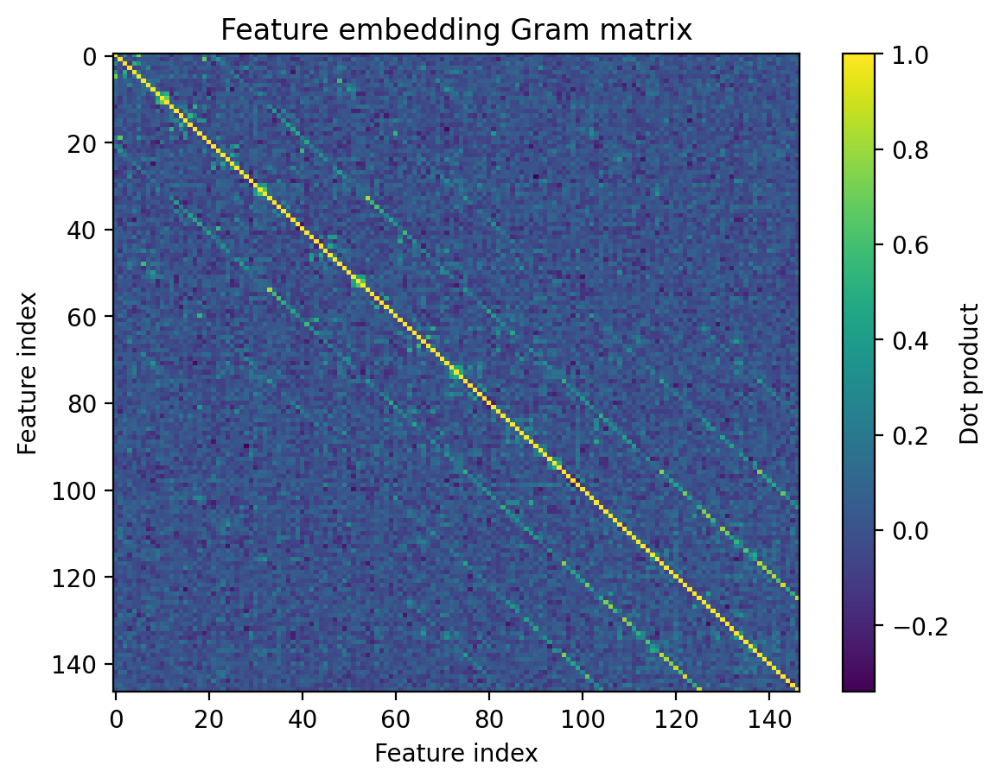

In [ ]:
G = Z @ Z.T     # Gram matrix
# Zero diagonal to see redundancy only
G_off = G - np.diag(np.diag(G))

print("Off-diagonal mean:", G_off[np.triu_indices_from(G_off, k=1)].mean())

plt.imshow(G, aspect='auto')
plt.colorbar(label="Dot product")
plt.title("Feature embedding Gram matrix")
plt.xlabel("Feature index")
plt.ylabel("Feature index")
plt.savefig("redun.png", dpi=600, bbox_inches="tight")
plt.show()


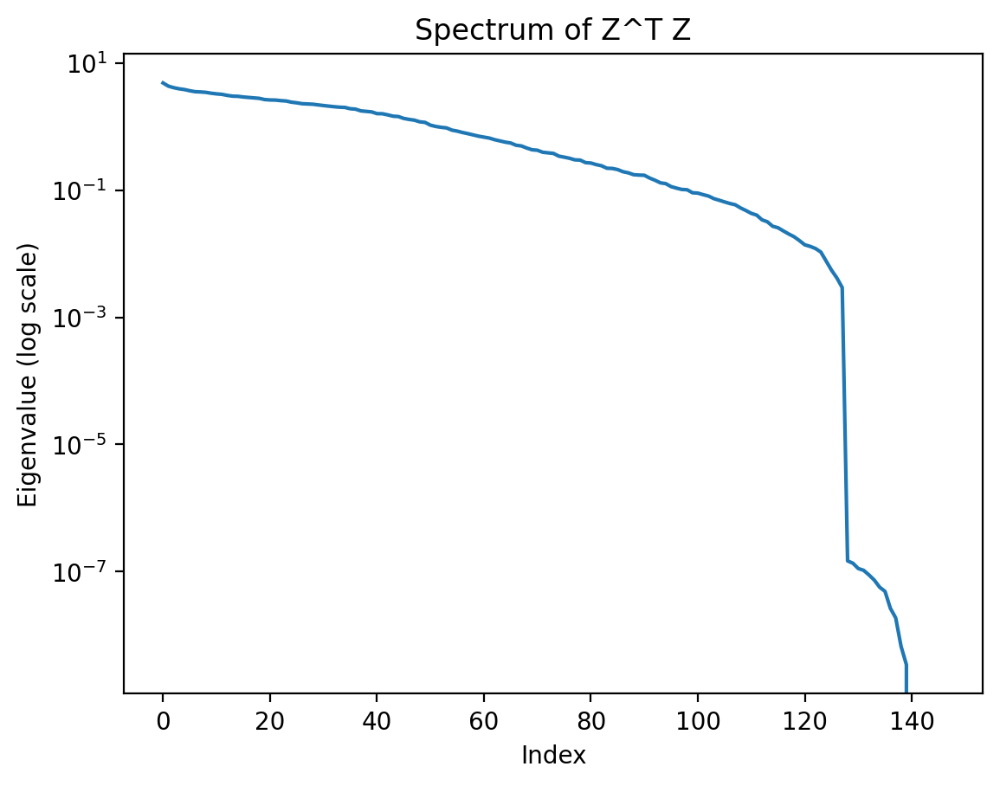

In [ ]:
eigvals = np.linalg.eigvalsh(G)
eigvals = np.sort(eigvals)[::-1]
plt.semilogy(eigvals)
plt.xlabel("Index")
plt.ylabel("Eigenvalue (log scale)")
plt.title("Spectrum of Z^T Z")
plt.savefig("eigen.png", dpi=600, bbox_inches="tight")
plt.show()


# Mini ablations around the best point (cheap sweeps)


>>> tau = 0.05
[ZAYAN-CL] Epoch 1/100 | Loss: 1007.2014
[ZAYAN-CL] Epoch 2/100 | Loss: 756.1068
[ZAYAN-CL] Epoch 3/100 | Loss: 720.1276
[ZAYAN-CL] Epoch 4/100 | Loss: 648.2086
[ZAYAN-CL] Epoch 5/100 | Loss: 599.0264
[ZAYAN-CL] Epoch 6/100 | Loss: 559.8781
[ZAYAN-CL] Epoch 7/100 | Loss: 524.4625
[ZAYAN-CL] Epoch 8/100 | Loss: 489.5411
[ZAYAN-CL] Epoch 9/100 | Loss: 460.8854
[ZAYAN-CL] Epoch 10/100 | Loss: 435.2070
[ZAYAN-CL] Epoch 11/100 | Loss: 413.5353
[ZAYAN-CL] Epoch 12/100 | Loss: 390.5428
[ZAYAN-CL] Epoch 13/100 | Loss: 373.6028
[ZAYAN-CL] Epoch 14/100 | Loss: 355.8481
[ZAYAN-CL] Epoch 15/100 | Loss: 335.4810
[ZAYAN-CL] Epoch 16/100 | Loss: 318.6569
[ZAYAN-CL] Epoch 17/100 | Loss: 301.1476
[ZAYAN-CL] Epoch 18/100 | Loss: 290.3273
[ZAYAN-CL] Epoch 19/100 | Loss: 277.0521
[ZAYAN-CL] Epoch 20/100 | Loss: 261.2240
[ZAYAN-CL] Epoch 21/100 | Loss: 257.4861
[ZAYAN-CL] Epoch 22/100 | Loss: 244.8675
[ZAYAN-CL] Epoch 23/100 | Loss: 237.0890
[ZAYAN-CL] Epoch 24/100 | Loss: 226.5025
[ZAYAN-C

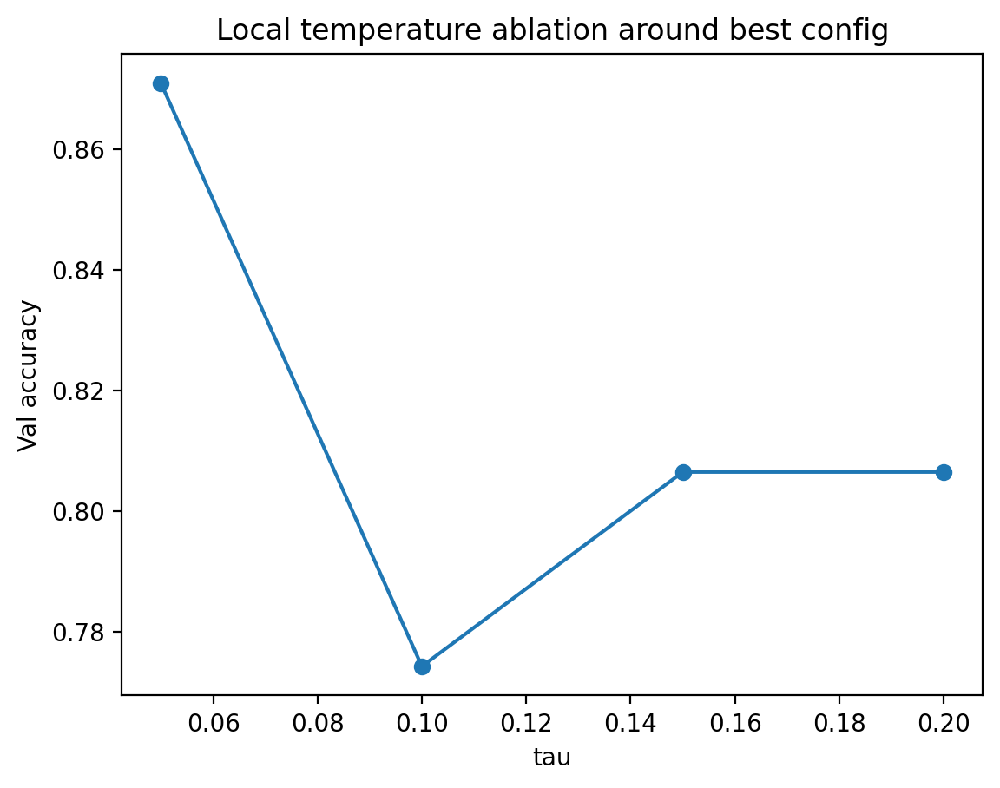

In [ ]:
def sweep_param(param_name, values):
    scores = []
    base = best_params.copy()
    for v in values:
        print(f"\n>>> {param_name} = {v}")
        base[param_name] = v

        model = ZAYAN(
            cl_params={
                'emb_dim':    base["emb_dim"],
                'hidden_dim': base["hidden_dim"],
                'tau':        base["tau"],
                'lambd':      base["lambd"],
                'sigma':      base["sigma"],
                'mask_prob':  base["mask_prob"],
                'dropout':    base["cl_dropout"],
            },
            t_params={
                'nhead':      base["nhead"],
                'num_layers': base["num_layers"],
                'gamma':      base["gamma"],
                'dropout':    base["t_dropout"],
            },
            classification_type='multiclass',
            num_classes=9,
            device=device,
        )

        res = model.fit(
            X_tr, y_tr,
            X_val=X_va, y_val=y_va,
            cl_epochs=100, cl_lr=base["cl_lr"],
            cl_weight_decay=base["cl_weight_decay"],
            t_epochs=100, t_lr=base["t_lr"],
            t_weight_decay=base["t_weight_decay"],
            batch_size=base["batch_size"],
        )
        acc = res["validation"]["accuracy"]
        scores.append(acc)
        print(f"Val acc: {acc:.4f}")
    return np.array(values), np.array(scores)

taus = [0.05, 0.10, 0.15, 0.20]
xs, ys = sweep_param("tau", taus)

plt.plot(xs, ys, marker="o")
plt.xlabel("tau")
plt.ylabel("Val accuracy")
plt.title("Local temperature ablation around best config")
plt.savefig("cheap.png", dpi=600, bbox_inches="tight")
plt.show()

# Gaussian Noise ablation


>>> sigma = 0.0
[ZAYAN-CL] Epoch 1/100 | Loss: 1125.7709
[ZAYAN-CL] Epoch 2/100 | Loss: 682.6719
[ZAYAN-CL] Epoch 3/100 | Loss: 817.0205
[ZAYAN-CL] Epoch 4/100 | Loss: 673.2740
[ZAYAN-CL] Epoch 5/100 | Loss: 593.1005
[ZAYAN-CL] Epoch 6/100 | Loss: 572.8177
[ZAYAN-CL] Epoch 7/100 | Loss: 546.6705
[ZAYAN-CL] Epoch 8/100 | Loss: 529.1616
[ZAYAN-CL] Epoch 9/100 | Loss: 502.2278
[ZAYAN-CL] Epoch 10/100 | Loss: 471.4420
[ZAYAN-CL] Epoch 11/100 | Loss: 442.7776
[ZAYAN-CL] Epoch 12/100 | Loss: 414.9675
[ZAYAN-CL] Epoch 13/100 | Loss: 397.7803
[ZAYAN-CL] Epoch 14/100 | Loss: 382.0662
[ZAYAN-CL] Epoch 15/100 | Loss: 366.2140
[ZAYAN-CL] Epoch 16/100 | Loss: 348.5840
[ZAYAN-CL] Epoch 17/100 | Loss: 338.1355
[ZAYAN-CL] Epoch 18/100 | Loss: 325.3006
[ZAYAN-CL] Epoch 19/100 | Loss: 309.6003
[ZAYAN-CL] Epoch 20/100 | Loss: 293.1490
[ZAYAN-CL] Epoch 21/100 | Loss: 274.9681
[ZAYAN-CL] Epoch 22/100 | Loss: 265.1675
[ZAYAN-CL] Epoch 23/100 | Loss: 260.0307
[ZAYAN-CL] Epoch 24/100 | Loss: 246.9366
[ZAYAN-

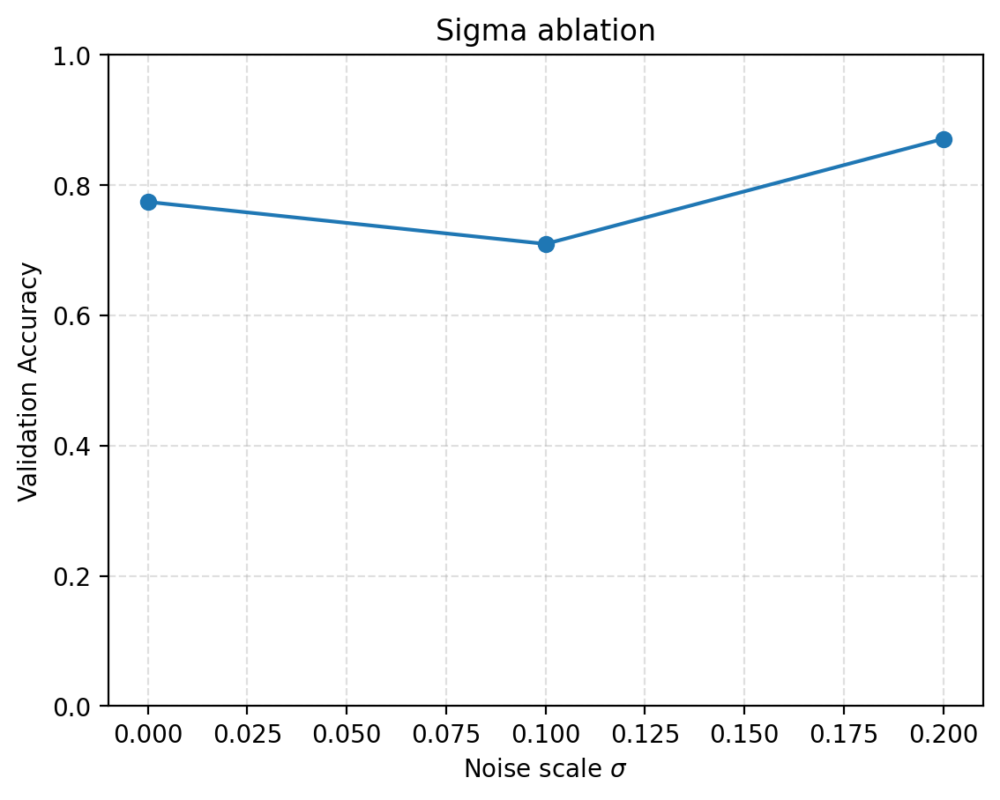

In [ ]:
sigma_vals = [0.0, 0.1, 0.2]
xs, ys = sweep_param("sigma", sigma_vals)

plt.figure()
plt.plot(xs, ys, marker="o")
plt.xlabel(r"Noise scale $\sigma$")
plt.ylabel("Validation Accuracy")
plt.title("Sigma ablation")
plt.ylim(0, 1.0)
plt.grid(True, linestyle="--", alpha=0.4)
plt.savefig("zayan_sigma_ablation.png", dpi=600, bbox_inches="tight")
plt.show()

# mask prob ablation


>>> mask_prob = 0.0
[ZAYAN-CL] Epoch 1/100 | Loss: 913.0005
[ZAYAN-CL] Epoch 2/100 | Loss: 763.8987
[ZAYAN-CL] Epoch 3/100 | Loss: 647.9525
[ZAYAN-CL] Epoch 4/100 | Loss: 619.3621
[ZAYAN-CL] Epoch 5/100 | Loss: 579.7706
[ZAYAN-CL] Epoch 6/100 | Loss: 519.1407
[ZAYAN-CL] Epoch 7/100 | Loss: 469.9015
[ZAYAN-CL] Epoch 8/100 | Loss: 441.6409
[ZAYAN-CL] Epoch 9/100 | Loss: 408.2079
[ZAYAN-CL] Epoch 10/100 | Loss: 383.9658
[ZAYAN-CL] Epoch 11/100 | Loss: 365.5307
[ZAYAN-CL] Epoch 12/100 | Loss: 343.1850
[ZAYAN-CL] Epoch 13/100 | Loss: 326.7073
[ZAYAN-CL] Epoch 14/100 | Loss: 312.2430
[ZAYAN-CL] Epoch 15/100 | Loss: 289.5104
[ZAYAN-CL] Epoch 16/100 | Loss: 276.2851
[ZAYAN-CL] Epoch 17/100 | Loss: 262.7122
[ZAYAN-CL] Epoch 18/100 | Loss: 253.6175
[ZAYAN-CL] Epoch 19/100 | Loss: 247.1291
[ZAYAN-CL] Epoch 20/100 | Loss: 233.7133
[ZAYAN-CL] Epoch 21/100 | Loss: 233.2477
[ZAYAN-CL] Epoch 22/100 | Loss: 219.9144
[ZAYAN-CL] Epoch 23/100 | Loss: 216.6398
[ZAYAN-CL] Epoch 24/100 | Loss: 210.3451
[ZAY

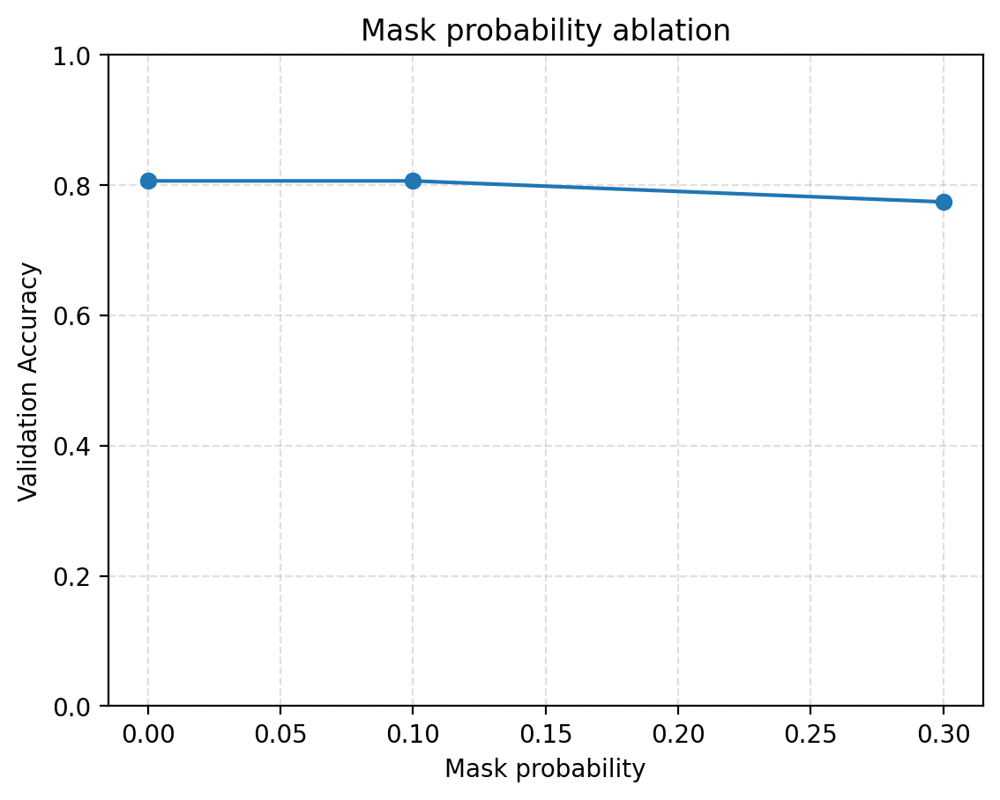

In [ ]:
mask_vals = [0.0, 0.1, 0.3]
xs, ys = sweep_param("mask_prob", mask_vals)

plt.figure()
plt.plot(xs, ys, marker="o")
plt.xlabel("Mask probability")
plt.ylabel("Validation Accuracy")
plt.title("Mask probability ablation")
plt.ylim(0, 1.0)
plt.grid(True, linestyle="--", alpha=0.4)
plt.savefig("zayan_maskprob_ablation.png", dpi=600, bbox_inches="tight")
plt.show()

# Preserve Loss Weight ablation


>>> gamma = 0.0
[ZAYAN-CL] Epoch 1/100 | Loss: 1082.3998
[ZAYAN-CL] Epoch 2/100 | Loss: 694.9836
[ZAYAN-CL] Epoch 3/100 | Loss: 820.8347
[ZAYAN-CL] Epoch 4/100 | Loss: 663.5701
[ZAYAN-CL] Epoch 5/100 | Loss: 592.8284
[ZAYAN-CL] Epoch 6/100 | Loss: 556.8139
[ZAYAN-CL] Epoch 7/100 | Loss: 538.5264
[ZAYAN-CL] Epoch 8/100 | Loss: 510.6670
[ZAYAN-CL] Epoch 9/100 | Loss: 484.6881
[ZAYAN-CL] Epoch 10/100 | Loss: 452.6830
[ZAYAN-CL] Epoch 11/100 | Loss: 429.3449
[ZAYAN-CL] Epoch 12/100 | Loss: 409.7595
[ZAYAN-CL] Epoch 13/100 | Loss: 385.9196
[ZAYAN-CL] Epoch 14/100 | Loss: 363.7930
[ZAYAN-CL] Epoch 15/100 | Loss: 351.3166
[ZAYAN-CL] Epoch 16/100 | Loss: 332.3439
[ZAYAN-CL] Epoch 17/100 | Loss: 317.1577
[ZAYAN-CL] Epoch 18/100 | Loss: 305.9094
[ZAYAN-CL] Epoch 19/100 | Loss: 292.9573
[ZAYAN-CL] Epoch 20/100 | Loss: 273.3016
[ZAYAN-CL] Epoch 21/100 | Loss: 264.5784
[ZAYAN-CL] Epoch 22/100 | Loss: 254.7977
[ZAYAN-CL] Epoch 23/100 | Loss: 247.1913
[ZAYAN-CL] Epoch 24/100 | Loss: 238.2619
[ZAYAN-

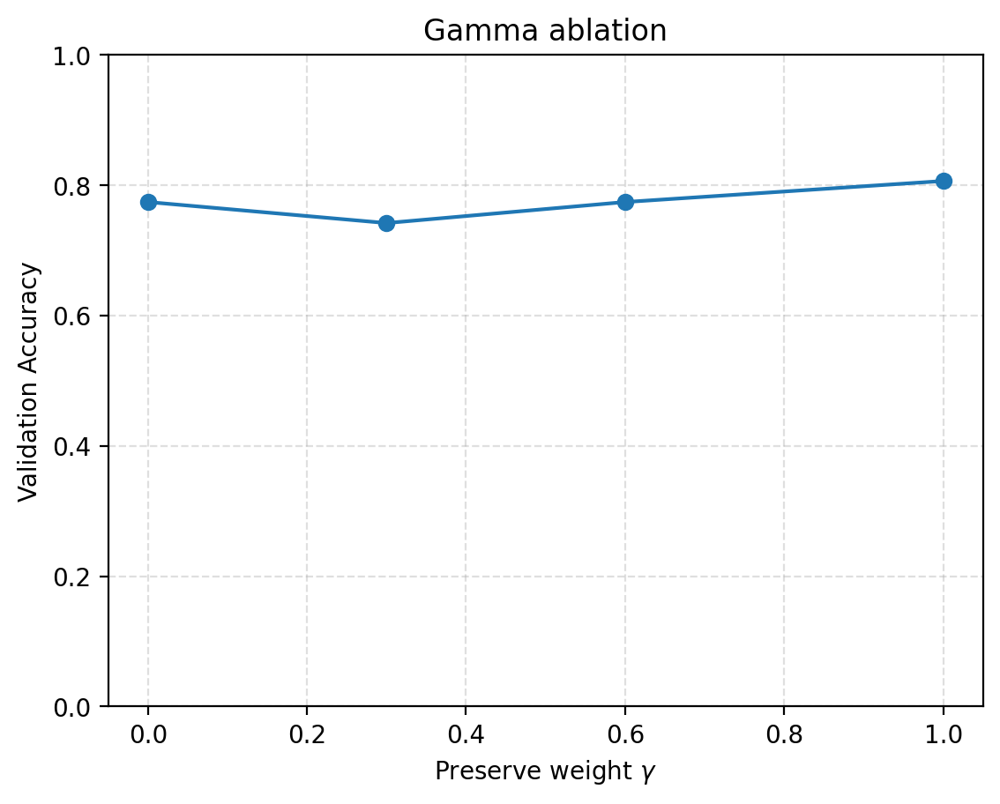

In [ ]:
gamma_vals = [0.0, 0.3, 0.6, 1.0]
xs, ys = sweep_param("gamma", gamma_vals)

plt.figure()
plt.plot(xs, ys, marker="o")
plt.xlabel(r"Preserve weight $\gamma$")
plt.ylabel("Validation Accuracy")
plt.title("Gamma ablation")
plt.ylim(0, 1.0)
plt.grid(True, linestyle="--", alpha=0.4)
plt.savefig("zayan_gamma_ablation.png", dpi=600, bbox_inches="tight")
plt.show()

# cl_dropout ablation (ZAYAN-CL)


>>> cl_dropout = 0.0
[ZAYAN-CL] Epoch 1/100 | Loss: 1371.3842
[ZAYAN-CL] Epoch 2/100 | Loss: 761.9090
[ZAYAN-CL] Epoch 3/100 | Loss: 1027.6665
[ZAYAN-CL] Epoch 4/100 | Loss: 793.0085
[ZAYAN-CL] Epoch 5/100 | Loss: 675.8665
[ZAYAN-CL] Epoch 6/100 | Loss: 637.1019
[ZAYAN-CL] Epoch 7/100 | Loss: 615.2603
[ZAYAN-CL] Epoch 8/100 | Loss: 589.1223
[ZAYAN-CL] Epoch 9/100 | Loss: 567.0950
[ZAYAN-CL] Epoch 10/100 | Loss: 540.3913
[ZAYAN-CL] Epoch 11/100 | Loss: 515.1562
[ZAYAN-CL] Epoch 12/100 | Loss: 490.7284
[ZAYAN-CL] Epoch 13/100 | Loss: 473.8922
[ZAYAN-CL] Epoch 14/100 | Loss: 458.8203
[ZAYAN-CL] Epoch 15/100 | Loss: 448.7246
[ZAYAN-CL] Epoch 16/100 | Loss: 436.6407
[ZAYAN-CL] Epoch 17/100 | Loss: 426.2909
[ZAYAN-CL] Epoch 18/100 | Loss: 415.3004
[ZAYAN-CL] Epoch 19/100 | Loss: 404.2384
[ZAYAN-CL] Epoch 20/100 | Loss: 393.0481
[ZAYAN-CL] Epoch 21/100 | Loss: 381.7490
[ZAYAN-CL] Epoch 22/100 | Loss: 372.5996
[ZAYAN-CL] Epoch 23/100 | Loss: 360.7471
[ZAYAN-CL] Epoch 24/100 | Loss: 351.3639
[

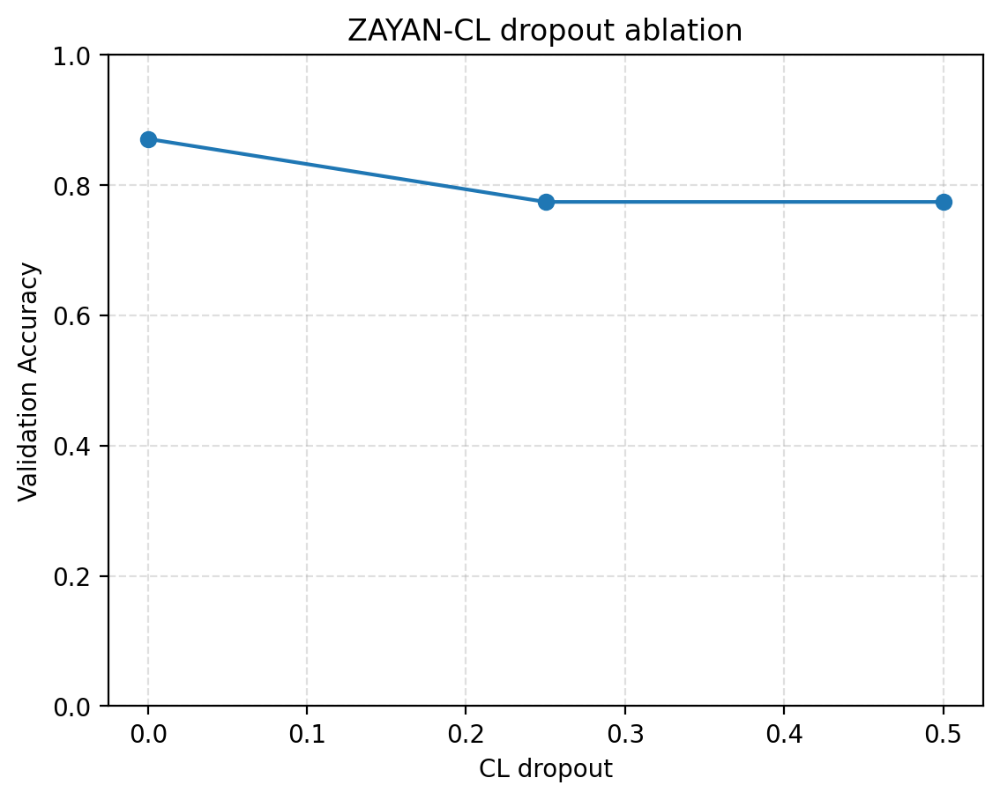

In [ ]:
cl_drop_vals = [0.0, 0.25, 0.5]
xs, ys = sweep_param("cl_dropout", cl_drop_vals)

plt.figure()
plt.plot(xs, ys, marker="o")
plt.xlabel("CL dropout")
plt.ylabel("Validation Accuracy")
plt.title("ZAYAN-CL dropout ablation")
plt.ylim(0, 1.0)
plt.grid(True, linestyle="--", alpha=0.4)
plt.savefig("zayan_cl_dropout_ablation.png", dpi=600, bbox_inches="tight")
plt.show()

# t_dropout ablation (transformer)


>>> t_dropout = 0.0
[ZAYAN-CL] Epoch 1/100 | Loss: 1002.6717
[ZAYAN-CL] Epoch 2/100 | Loss: 774.6023
[ZAYAN-CL] Epoch 3/100 | Loss: 763.6578
[ZAYAN-CL] Epoch 4/100 | Loss: 624.0906
[ZAYAN-CL] Epoch 5/100 | Loss: 561.6062
[ZAYAN-CL] Epoch 6/100 | Loss: 534.9697
[ZAYAN-CL] Epoch 7/100 | Loss: 504.6276
[ZAYAN-CL] Epoch 8/100 | Loss: 480.1844
[ZAYAN-CL] Epoch 9/100 | Loss: 444.8881
[ZAYAN-CL] Epoch 10/100 | Loss: 415.2203
[ZAYAN-CL] Epoch 11/100 | Loss: 394.2326
[ZAYAN-CL] Epoch 12/100 | Loss: 380.2205
[ZAYAN-CL] Epoch 13/100 | Loss: 359.8737
[ZAYAN-CL] Epoch 14/100 | Loss: 347.2322
[ZAYAN-CL] Epoch 15/100 | Loss: 331.0164
[ZAYAN-CL] Epoch 16/100 | Loss: 320.5450
[ZAYAN-CL] Epoch 17/100 | Loss: 297.1745
[ZAYAN-CL] Epoch 18/100 | Loss: 283.8484
[ZAYAN-CL] Epoch 19/100 | Loss: 268.8281
[ZAYAN-CL] Epoch 20/100 | Loss: 255.8472
[ZAYAN-CL] Epoch 21/100 | Loss: 246.1067
[ZAYAN-CL] Epoch 22/100 | Loss: 235.0856
[ZAYAN-CL] Epoch 23/100 | Loss: 228.9789
[ZAYAN-CL] Epoch 24/100 | Loss: 221.6425
[ZA

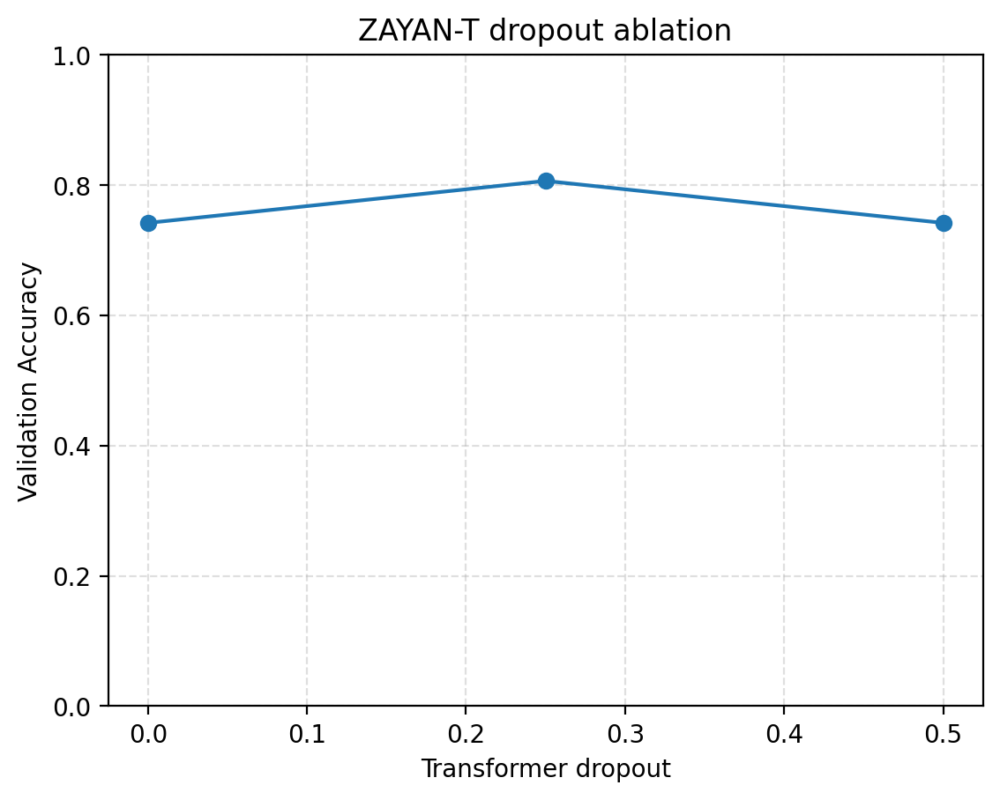

In [ ]:
t_drop_vals = [0.0, 0.25, 0.5]
xs, ys = sweep_param("t_dropout", t_drop_vals)

plt.figure()
plt.plot(xs, ys, marker="o")
plt.xlabel("Transformer dropout")
plt.ylabel("Validation Accuracy")
plt.title("ZAYAN-T dropout ablation")
plt.ylim(0, 1.0)
plt.grid(True, linestyle="--", alpha=0.4)
plt.savefig("zayan_t_dropout_ablation.png", dpi=600, bbox_inches="tight")
plt.show()

# num_layers ablation (Transformer depth)


>>> num_layers = 2
[ZAYAN-CL] Epoch 1/100 | Loss: 1118.7523
[ZAYAN-CL] Epoch 2/100 | Loss: 708.0413
[ZAYAN-CL] Epoch 3/100 | Loss: 807.9493
[ZAYAN-CL] Epoch 4/100 | Loss: 709.4893
[ZAYAN-CL] Epoch 5/100 | Loss: 635.0272
[ZAYAN-CL] Epoch 6/100 | Loss: 599.6292
[ZAYAN-CL] Epoch 7/100 | Loss: 569.5556
[ZAYAN-CL] Epoch 8/100 | Loss: 543.9824
[ZAYAN-CL] Epoch 9/100 | Loss: 515.9479
[ZAYAN-CL] Epoch 10/100 | Loss: 482.3870
[ZAYAN-CL] Epoch 11/100 | Loss: 454.0677
[ZAYAN-CL] Epoch 12/100 | Loss: 429.3636
[ZAYAN-CL] Epoch 13/100 | Loss: 406.6082
[ZAYAN-CL] Epoch 14/100 | Loss: 396.1742
[ZAYAN-CL] Epoch 15/100 | Loss: 376.0459
[ZAYAN-CL] Epoch 16/100 | Loss: 365.0746
[ZAYAN-CL] Epoch 17/100 | Loss: 350.8694
[ZAYAN-CL] Epoch 18/100 | Loss: 337.4305
[ZAYAN-CL] Epoch 19/100 | Loss: 317.6862
[ZAYAN-CL] Epoch 20/100 | Loss: 306.6712
[ZAYAN-CL] Epoch 21/100 | Loss: 291.4560
[ZAYAN-CL] Epoch 22/100 | Loss: 274.8393
[ZAYAN-CL] Epoch 23/100 | Loss: 264.1231
[ZAYAN-CL] Epoch 24/100 | Loss: 256.2417
[ZAY

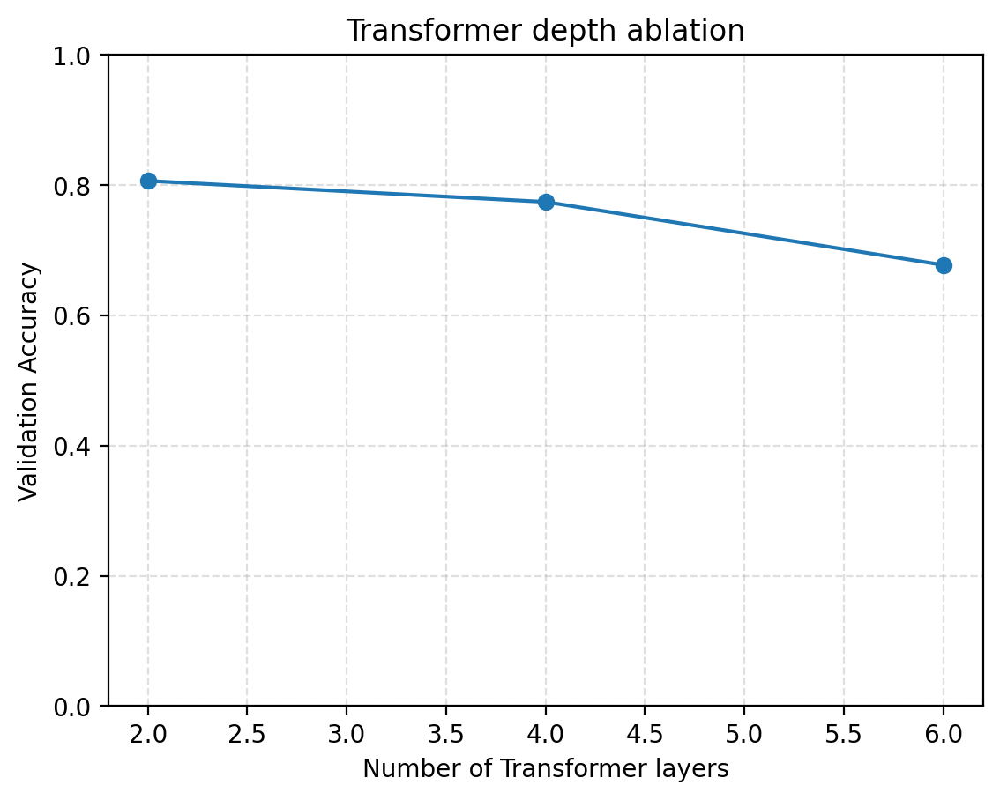

In [ ]:
layers_vals = [2, 4, 6]
xs, ys = sweep_param("num_layers", layers_vals)

plt.figure()
plt.plot(xs, ys, marker="o")
plt.xlabel("Number of Transformer layers")
plt.ylabel("Validation Accuracy")
plt.title("Transformer depth ablation")
plt.ylim(0, 1.0)
plt.grid(True, linestyle="--", alpha=0.4)
plt.savefig("zayan_layers_ablation.png", dpi=600, bbox_inches="tight")
plt.show()

# nhead ablation (attention heads)


>>> nhead = 4
[ZAYAN-CL] Epoch 1/100 | Loss: 1081.0931
[ZAYAN-CL] Epoch 2/100 | Loss: 704.4818
[ZAYAN-CL] Epoch 3/100 | Loss: 804.7007
[ZAYAN-CL] Epoch 4/100 | Loss: 638.1979
[ZAYAN-CL] Epoch 5/100 | Loss: 571.5895
[ZAYAN-CL] Epoch 6/100 | Loss: 545.2847
[ZAYAN-CL] Epoch 7/100 | Loss: 526.0996
[ZAYAN-CL] Epoch 8/100 | Loss: 501.9991
[ZAYAN-CL] Epoch 9/100 | Loss: 475.8932
[ZAYAN-CL] Epoch 10/100 | Loss: 441.9040
[ZAYAN-CL] Epoch 11/100 | Loss: 414.4225
[ZAYAN-CL] Epoch 12/100 | Loss: 394.4365
[ZAYAN-CL] Epoch 13/100 | Loss: 369.9977
[ZAYAN-CL] Epoch 14/100 | Loss: 357.9928
[ZAYAN-CL] Epoch 15/100 | Loss: 341.3988
[ZAYAN-CL] Epoch 16/100 | Loss: 328.3012
[ZAYAN-CL] Epoch 17/100 | Loss: 316.5709
[ZAYAN-CL] Epoch 18/100 | Loss: 303.8851
[ZAYAN-CL] Epoch 19/100 | Loss: 291.3268
[ZAYAN-CL] Epoch 20/100 | Loss: 276.8963
[ZAYAN-CL] Epoch 21/100 | Loss: 266.2110
[ZAYAN-CL] Epoch 22/100 | Loss: 252.1644
[ZAYAN-CL] Epoch 23/100 | Loss: 239.8988
[ZAYAN-CL] Epoch 24/100 | Loss: 238.5773
[ZAYAN-CL

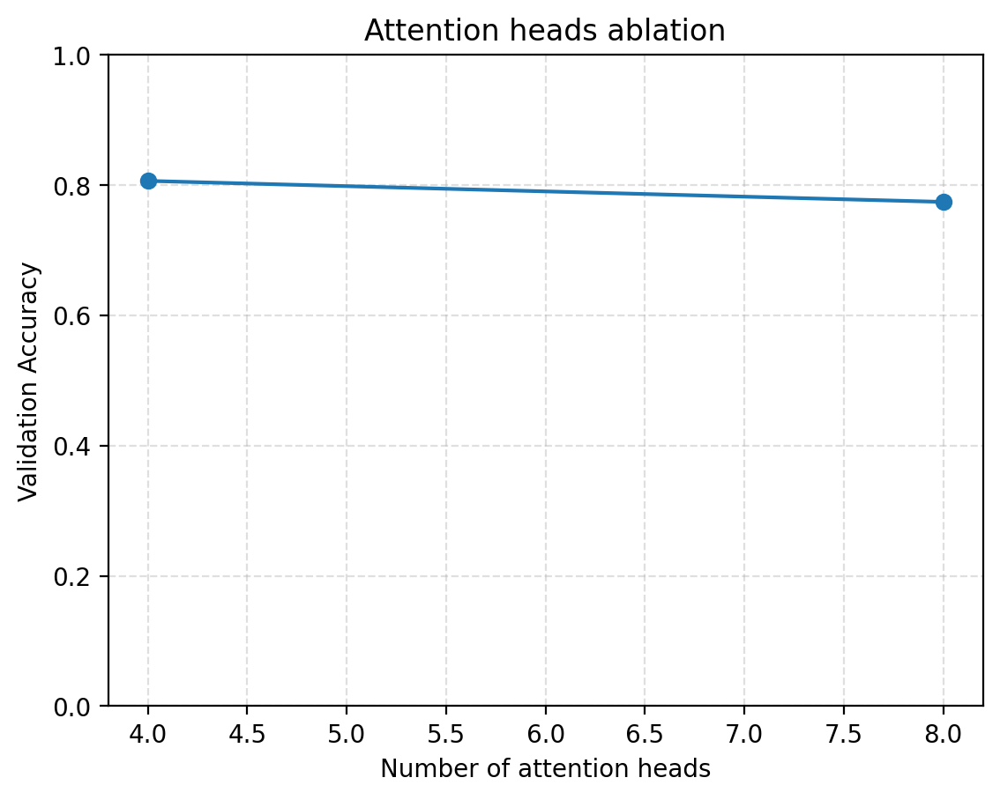

In [ ]:
nhead_vals = [4, 8]
xs, ys = sweep_param("nhead", nhead_vals)

plt.figure()
plt.plot(xs, ys, marker="o")
plt.xlabel("Number of attention heads")
plt.ylabel("Validation Accuracy")
plt.title("Attention heads ablation")
plt.ylim(0, 1.0)
plt.grid(True, linestyle="--", alpha=0.4)
plt.savefig("zayan_nhead_ablation.png", dpi=600, bbox_inches="tight")
plt.show()

# hidden_dim ablation (CL MLP Width)


>>> hidden_dim = 256
[ZAYAN-CL] Epoch 1/100 | Loss: 1204.6311
[ZAYAN-CL] Epoch 2/100 | Loss: 579.7131
[ZAYAN-CL] Epoch 3/100 | Loss: 516.1832
[ZAYAN-CL] Epoch 4/100 | Loss: 513.1741
[ZAYAN-CL] Epoch 5/100 | Loss: 453.9821
[ZAYAN-CL] Epoch 6/100 | Loss: 402.2172
[ZAYAN-CL] Epoch 7/100 | Loss: 374.3697
[ZAYAN-CL] Epoch 8/100 | Loss: 354.0190
[ZAYAN-CL] Epoch 9/100 | Loss: 328.9873
[ZAYAN-CL] Epoch 10/100 | Loss: 306.2741
[ZAYAN-CL] Epoch 11/100 | Loss: 283.7609
[ZAYAN-CL] Epoch 12/100 | Loss: 260.6210
[ZAYAN-CL] Epoch 13/100 | Loss: 240.9444
[ZAYAN-CL] Epoch 14/100 | Loss: 240.9527
[ZAYAN-CL] Epoch 15/100 | Loss: 227.6536
[ZAYAN-CL] Epoch 16/100 | Loss: 218.0223
[ZAYAN-CL] Epoch 17/100 | Loss: 205.3417
[ZAYAN-CL] Epoch 18/100 | Loss: 198.1403
[ZAYAN-CL] Epoch 19/100 | Loss: 193.0077
[ZAYAN-CL] Epoch 20/100 | Loss: 188.6677
[ZAYAN-CL] Epoch 21/100 | Loss: 180.2279
[ZAYAN-CL] Epoch 22/100 | Loss: 171.5581
[ZAYAN-CL] Epoch 23/100 | Loss: 168.6374
[ZAYAN-CL] Epoch 24/100 | Loss: 164.7265
[Z

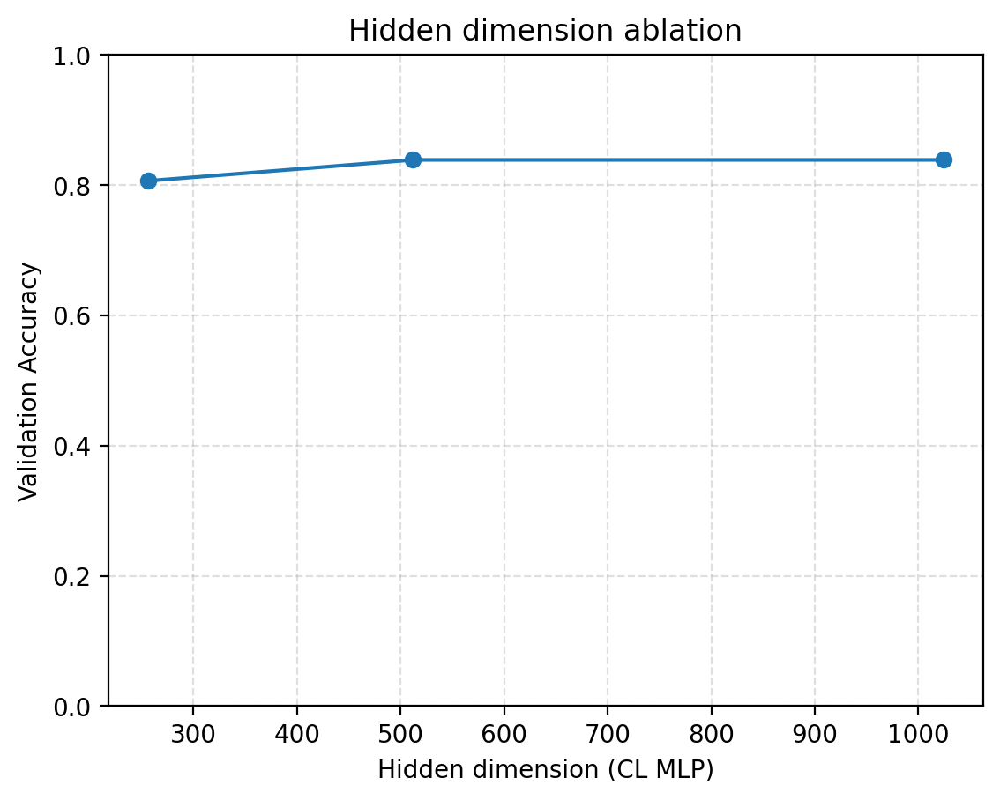

In [ ]:
hidden_vals = [256, 512, 1024]
xs, ys = sweep_param("hidden_dim", hidden_vals)

plt.figure()
plt.plot(xs, ys, marker="o")
plt.xlabel("Hidden dimension (CL MLP)")
plt.ylabel("Validation Accuracy")
plt.title("Hidden dimension ablation")
plt.ylim(0, 1.0)
plt.grid(True, linestyle="--", alpha=0.4)
plt.savefig("zayan_hidden_ablation.png", dpi=600, bbox_inches="tight")
plt.show()

# t-SNE of sample representations (ZAYAN-T)

[ZAYAN-CL] Epoch 1/100 | Loss: 798.3356
[ZAYAN-CL] Epoch 2/100 | Loss: 768.7902
[ZAYAN-CL] Epoch 3/100 | Loss: 630.1612
[ZAYAN-CL] Epoch 4/100 | Loss: 578.1154
[ZAYAN-CL] Epoch 5/100 | Loss: 540.6833
[ZAYAN-CL] Epoch 6/100 | Loss: 503.6295
[ZAYAN-CL] Epoch 7/100 | Loss: 464.2832
[ZAYAN-CL] Epoch 8/100 | Loss: 430.0835
[ZAYAN-CL] Epoch 9/100 | Loss: 407.2925
[ZAYAN-CL] Epoch 10/100 | Loss: 382.5215
[ZAYAN-CL] Epoch 11/100 | Loss: 356.7439
[ZAYAN-CL] Epoch 12/100 | Loss: 333.1532
[ZAYAN-CL] Epoch 13/100 | Loss: 316.6464
[ZAYAN-CL] Epoch 14/100 | Loss: 302.4837
[ZAYAN-CL] Epoch 15/100 | Loss: 286.3214
[ZAYAN-CL] Epoch 16/100 | Loss: 271.7788
[ZAYAN-CL] Epoch 17/100 | Loss: 258.4624
[ZAYAN-CL] Epoch 18/100 | Loss: 243.6199
[ZAYAN-CL] Epoch 19/100 | Loss: 233.9041
[ZAYAN-CL] Epoch 20/100 | Loss: 225.8598
[ZAYAN-CL] Epoch 21/100 | Loss: 217.7476
[ZAYAN-CL] Epoch 22/100 | Loss: 209.4484
[ZAYAN-CL] Epoch 23/100 | Loss: 200.0304
[ZAYAN-CL] Epoch 24/100 | Loss: 193.1634
[ZAYAN-CL] Epoch 25/100 |

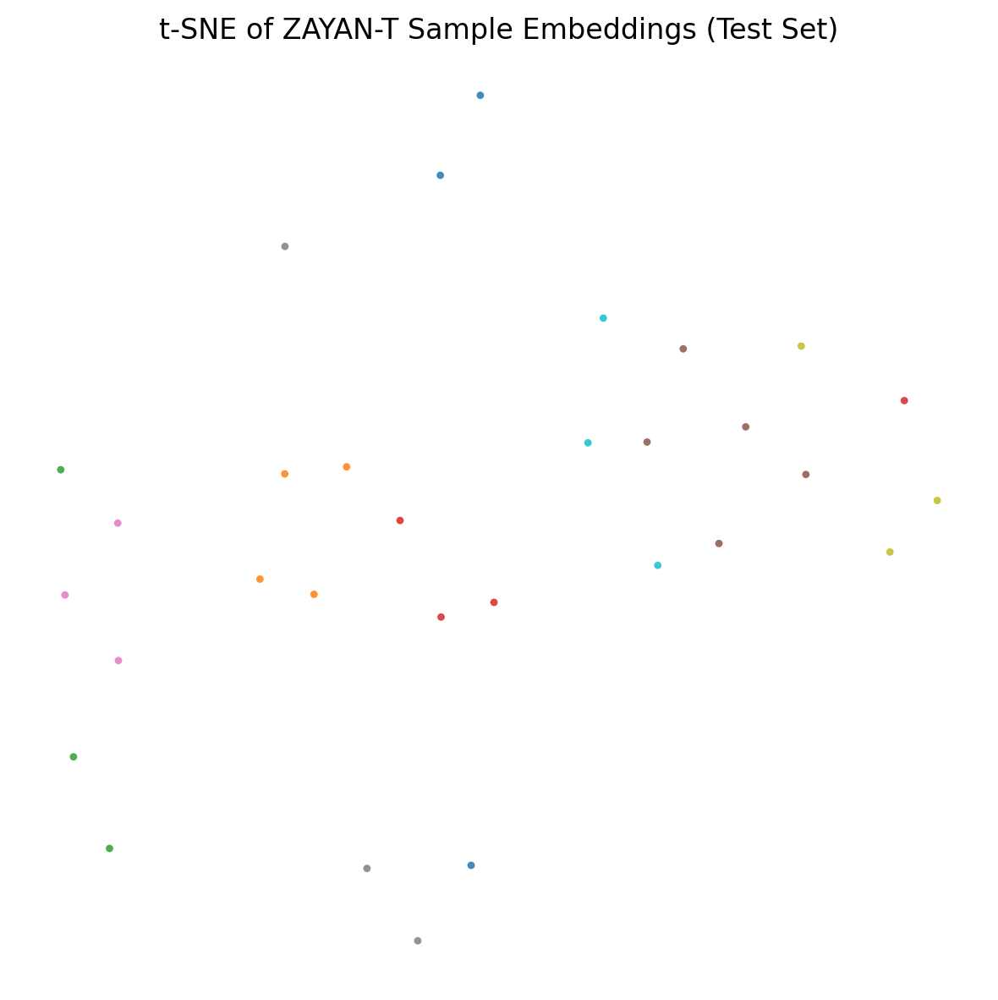

In [ ]:
from sklearn.model_selection import train_test_split

best_params = best_trial.params.copy()
device = "cuda" if torch.cuda.is_available() else "cpu"
n_classes = len(np.unique(y_train))

# Train / test split for visualization (like iStructTab test set)
X_tr, X_te, y_tr, y_te = train_test_split(
    X_train_scaled,
    y_train,
    test_size=0.2,
    stratify=y_train,
    random_state=42,
)

best_model = ZAYAN(
    cl_params={
        "emb_dim":    best_params["emb_dim"],
        "hidden_dim": best_params["hidden_dim"],
        "tau":        best_params["tau"],
        "lambd":      best_params["lambd"],
        "sigma":      best_params["sigma"],
        "mask_prob":  best_params["mask_prob"],
        "dropout":    best_params["cl_dropout"],
    },
    t_params={
        "nhead":      best_params["nhead"],
        "num_layers": best_params["num_layers"],
        "gamma":      best_params["gamma"],
        "dropout":    best_params["t_dropout"],
    },
    classification_type="multiclass",
    num_classes=n_classes,
    device=device,
)

_ = best_model.fit(
    X_tr, y_tr,
    X_val=X_te, y_val=y_te,   # you can also keep a separate val, but this is fine for viz
    X_test=None, y_test=None,
    cl_epochs=100,
    cl_lr=best_params["cl_lr"],
    cl_weight_decay=best_params["cl_weight_decay"],
    t_epochs=100,
    t_lr=best_params["t_lr"],
    t_weight_decay=best_params["t_weight_decay"],
    batch_size=best_params["batch_size"],
)

import numpy as np
import torch

def get_zayan_sample_reps(model, X):
    """
    Returns per-sample representations r_i from ZAYAN-T
    (pooled Transformer outputs, before the MLP).
    """
    model.zt.eval()
    Z = model.Z                      # (m, emb_dim)
    device = model.device

    if isinstance(X, pd.DataFrame):
        X_arr = X.values.astype(np.float32)
    else:
        X_arr = np.asarray(X, dtype=np.float32)

    Xt = torch.tensor(X_arr, dtype=torch.float32, device=device)

    with torch.no_grad():
        bs, m = Xt.shape
        H = Xt.unsqueeze(-1) * Z.unsqueeze(0)               # (bs, m, d)
        H = H + model.zt.pos_embed.unsqueeze(0)            # add pos enc
        H = model.zt.dropout(H)

        H = H.permute(1, 0, 2)                             # (m, bs, d)
        H_out = model.zt.transformer(H)
        H_out = H_out.permute(1, 0, 2)                     # (bs, m, d)

        reps = H_out.mean(dim=1)                           # (bs, d)

    return reps.cpu().numpy()


from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# --- get embeddings & labels for the "test" split ---
embs = get_zayan_sample_reps(best_model, X_te)  # (N_test, d)

if isinstance(y_te, pd.Series):
    labels = y_te.to_numpy()
else:
    labels = np.asarray(y_te)

print("Embeddings shape:", embs.shape, "| Labels shape:", labels.shape)

# --- choose a safe perplexity ---
n_samples = embs.shape[0]
# rule of thumb: <= n_samples / 3, and at least 5
perplexity = max(5, min(30, (n_samples - 1) // 3))
print(f"Using perplexity = {perplexity} for t-SNE (n_samples = {n_samples})")

tsne = TSNE(
    n_components=2,
    perplexity=perplexity,
    learning_rate=200,
    random_state=42,
    init="pca",
)
Z_2d = tsne.fit_transform(embs)

plt.figure(figsize=(6, 6))
scatter = plt.scatter(
    Z_2d[:, 0], Z_2d[:, 1],
    c=labels,
    cmap="tab10",
    s=10,
    alpha=0.85,
    edgecolors="none",
)
plt.axis("off")
plt.title("t-SNE of ZAYAN-T Sample Embeddings (Test Set)")
plt.tight_layout()
plt.savefig("tsne_zayan_test.png", dpi=600, bbox_inches="tight")
plt.savefig("tsne_zayan_test.pdf", bbox_inches="tight")
plt.show()

# ZAYAN-CL feature embeddings

ZAYAN-CL feature embeddings shape: (147, 128)
Using perplexity = 30 for t-SNE (m = 147)


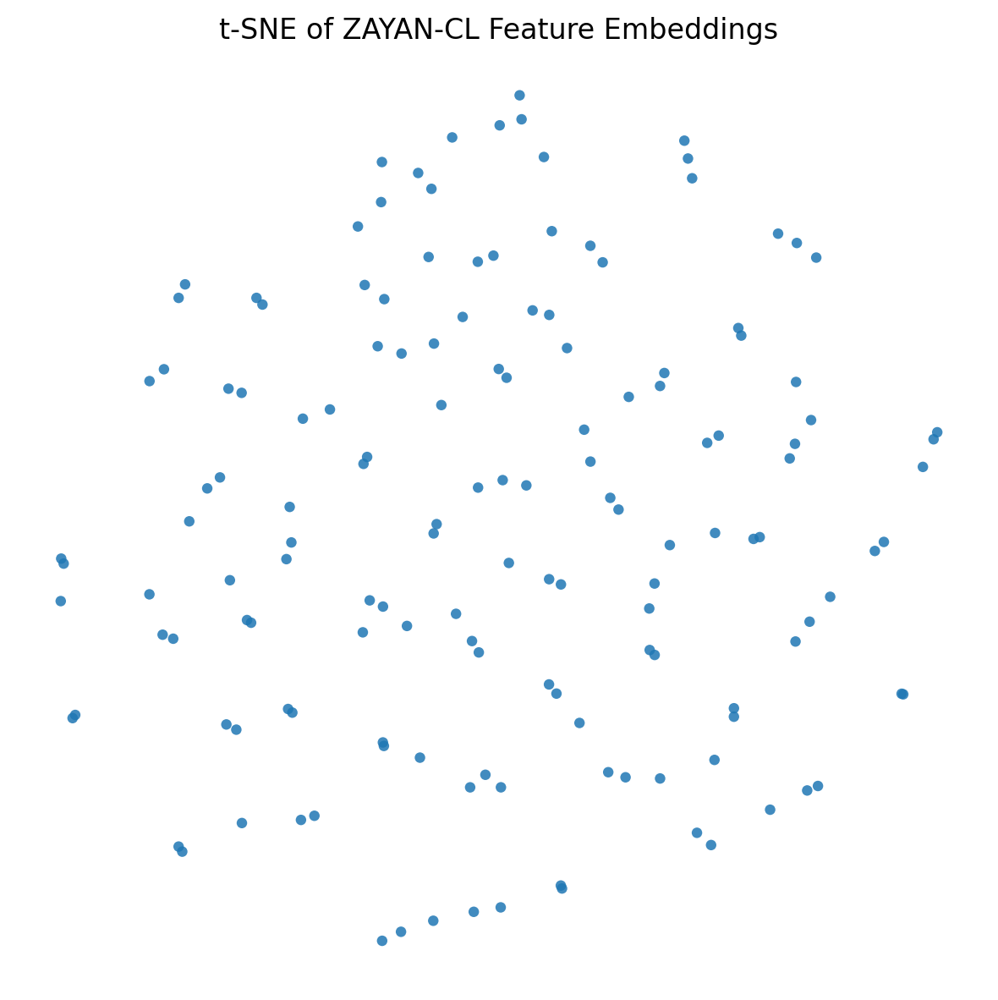

In [ ]:
import numpy as np
import torch
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# ---------------------------------------------------
# Get feature embeddings from ZAYAN-CL (shape: m × d)
# ---------------------------------------------------
Z = best_model.Z   # (m, emb_dim) from ZAYAN-CL
if isinstance(Z, torch.Tensor):
    embs = Z.detach().cpu().numpy()
else:
    embs = np.asarray(Z)

m, d = embs.shape
print("ZAYAN-CL feature embeddings shape:", embs.shape)

# ---------------------------------------------------
# Safe perplexity (must be < #features = m)
# ---------------------------------------------------
perplexity = max(5, min(30, (m - 1) // 3))
print(f"Using perplexity = {perplexity} for t-SNE (m = {m})")

tsne = TSNE(
    n_components=2,
    perplexity=perplexity,
    learning_rate=200,
    random_state=42,
    init="pca",
)
Z_2d = tsne.fit_transform(embs)   # (m, 2)

# ---------------------------------------------------
# Optional: feature names for annotating points
# ---------------------------------------------------
if isinstance(X_train_scaled, pd.DataFrame):
    feat_names = list(X_train_scaled.columns)
else:
    feat_names = [f"f{j}" for j in range(m)]

# ---------------------------------------------------
# Plot
# ---------------------------------------------------
plt.figure(figsize=(6, 6))
plt.scatter(
    Z_2d[:, 0], Z_2d[:, 1],
    s=20,
    alpha=0.85,
    edgecolors="none",
)

# If you want tiny labels on top of points:
# for j, name in enumerate(feat_names):
#     plt.text(Z_2d[j, 0], Z_2d[j, 1], name, fontsize=5, alpha=0.7)

plt.axis("off")
plt.title("t-SNE of ZAYAN-CL Feature Embeddings")
plt.tight_layout()
plt.savefig("tsne_zayan_cl_features.png", dpi=600, bbox_inches="tight")
plt.savefig("tsne_zayan_cl_features.pdf",  bbox_inches="tight")
plt.show()

# Inference Level Diagnostics: Robustness + Calibration

[INFO] Using ZAYAN model on device=cuda
[INFO] Test batches: 1


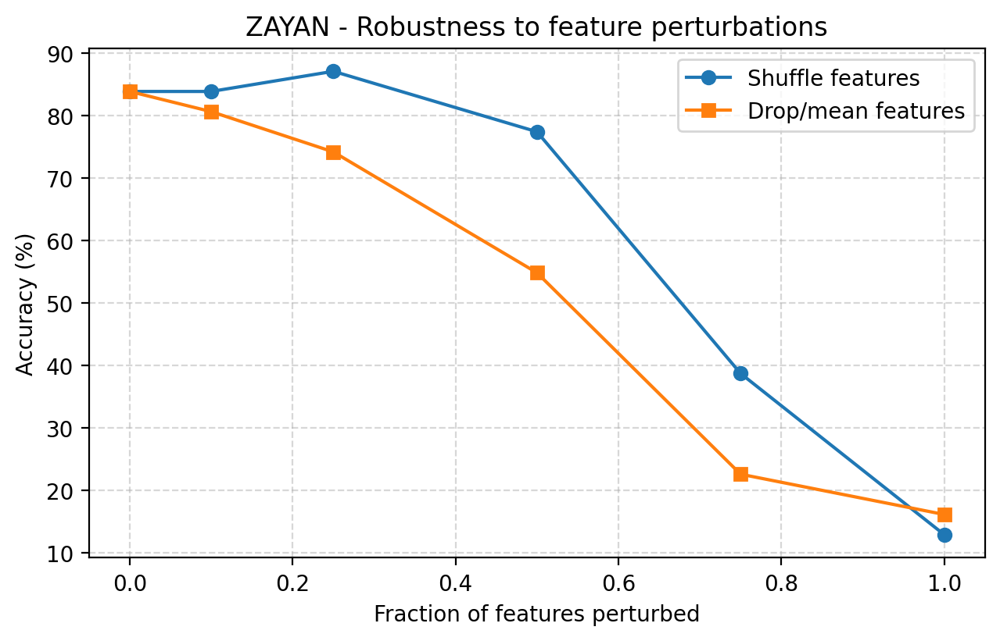

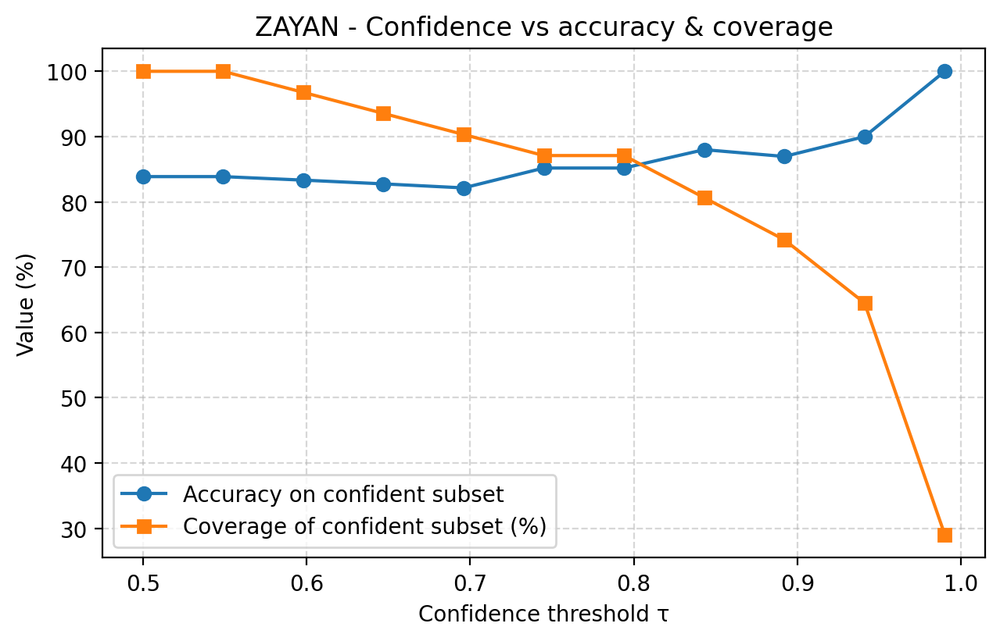

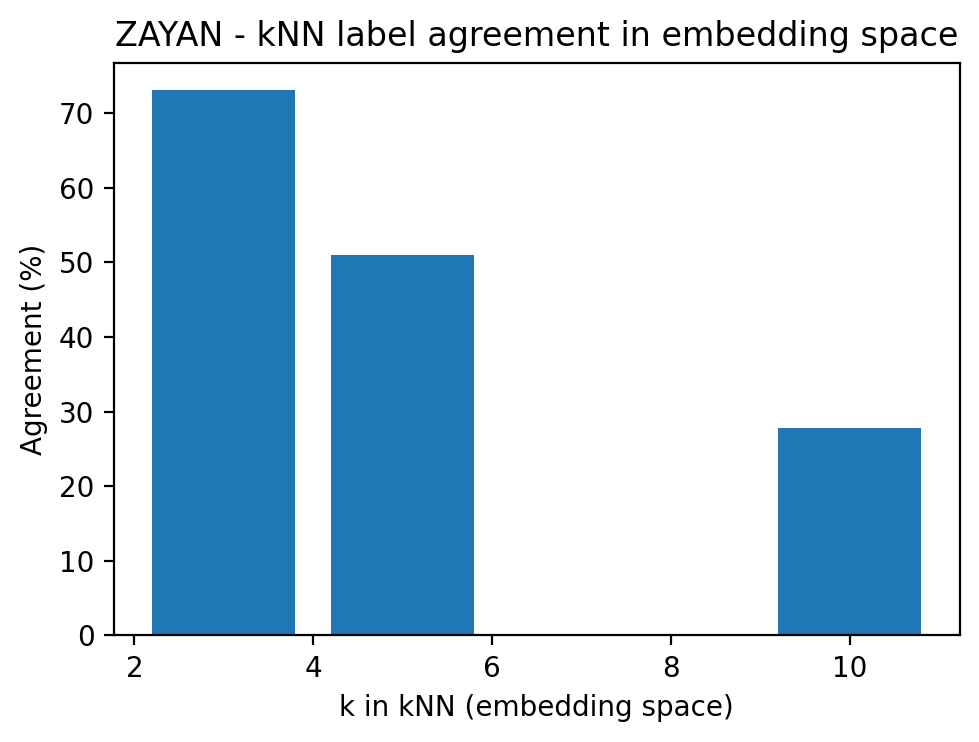

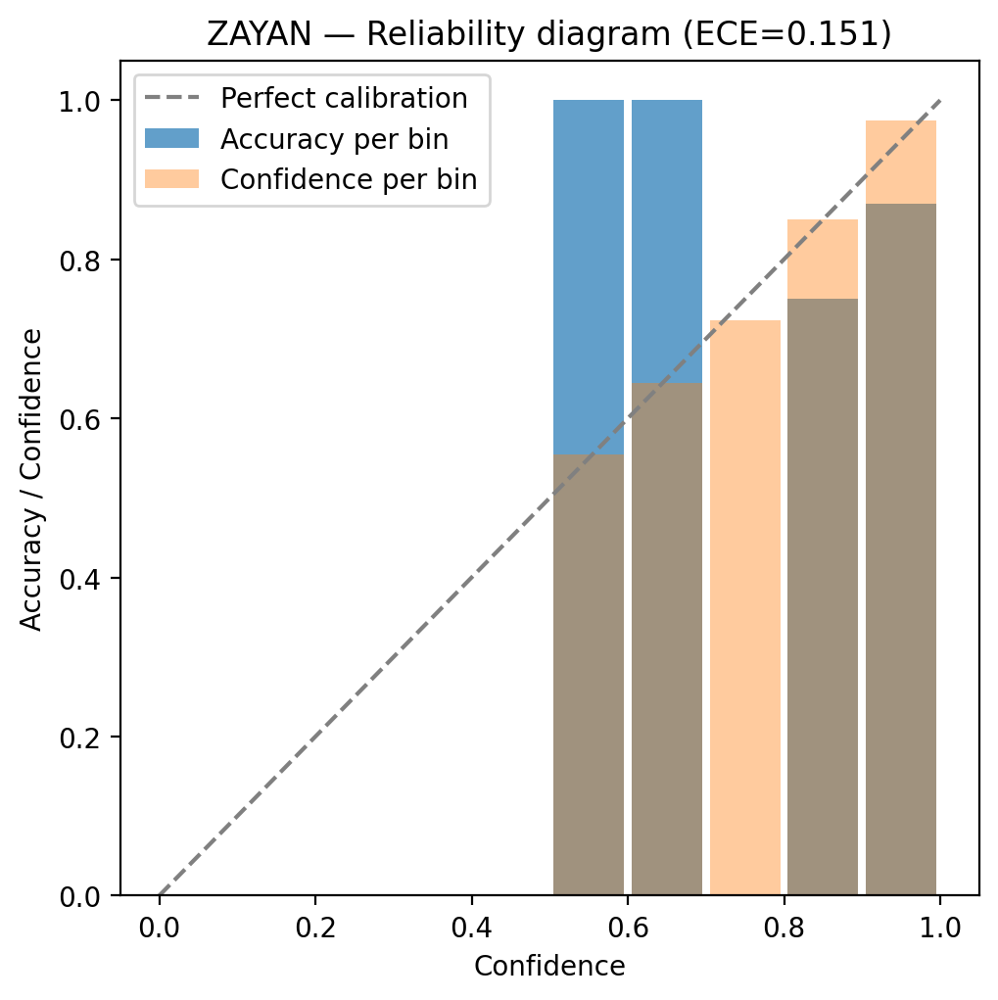


=== ZAYAN Inference Ablation Summary (Test Set) ===
      Tab Shuffle ↓  Tab Drop ↓  kNN-Agree@5 (%)
0.00          83.87       83.87            50.97
0.10          83.87       80.65            50.97
0.25          87.10       74.19            50.97
0.50          77.42       54.84            50.97
0.75          38.71       22.58            50.97
1.00          12.90       16.13            50.97

Expected Calibration Error (ECE): 0.151


In [ ]:
# ============================================================
# Inference-level diagnostics for ZAYAN (tabular only)
#  - Robustness to feature perturbations
#  - Confidence vs accuracy/coverage
#  - kNN consistency in embedding space
#  - Calibration (reliability diagram + ECE)
# Requires: best_model, X_te, y_te, best_params, device
# ============================================================
import time
import numpy as np
import torch
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score
from sklearn.neighbors import NearestNeighbors
from torch.utils.data import TensorDataset, DataLoader
import pandas as pd

plt.rcParams.update({"savefig.facecolor": "white", "figure.facecolor": "white"})

# -------------------- Build test DataLoader --------------------
if isinstance(X_te, pd.DataFrame):
    X_te_arr = X_te.values.astype(np.float32)
else:
    X_te_arr = np.asarray(X_te, dtype=np.float32)

if isinstance(y_te, pd.Series):
    y_te_arr = y_te.to_numpy().astype(int)
else:
    y_te_arr = np.asarray(y_te, dtype=int)

ds_test = TensorDataset(
    torch.tensor(X_te_arr, dtype=torch.float32),
    torch.tensor(y_te_arr, dtype=torch.long),
)

batch_size = best_params.get("batch_size", 32)
loader = DataLoader(ds_test, batch_size=batch_size, shuffle=False)

model = best_model      # just to mirror the iStructTab script naming
model.zt.eval()
Z_feat = model.Z.to(device)    # (m, emb_dim)
device = model.device

print(f"[INFO] Using ZAYAN model on device={device}")
print(f"[INFO] Test batches: {len(loader)}")


# -------------------- Core forward helper --------------------
@torch.no_grad()
def predict_loader(loader, perturb=None):
    """
    Run ZAYAN-T manually to get:
      - logits, probs, preds
      - labels y
      - sample embeddings (pooled Transformer outputs)
    """
    model.zt.eval()
    logits_all, probs_all, preds_all, y_all, embs_all = [], [], [], [], []

    for xb, yb in loader:
        xb = xb.to(device)
        yb = yb.to(device)

        if perturb is not None:
            xb = perturb(xb)

        # --- manual forward mirroring ZAYAN_T.forward ---
        bs, m = xb.shape
        H = xb.unsqueeze(-1) * Z_feat.unsqueeze(0)              # (bs, m, d)
        H = H + model.zt.pos_embed.unsqueeze(0)                 # add pos enc
        H = model.zt.dropout(H)

        H = H.permute(1, 0, 2)                                  # (m, bs, d)
        H_out = model.zt.transformer(H)
        H_out = H_out.permute(1, 0, 2)                          # (bs, m, d)

        rep = H_out.mean(dim=1)                                 # (bs, d)
        logits = model.zt.mlp(rep)                              # (bs, num_classes)
        probs  = torch.softmax(logits, dim=1)
        preds  = probs.argmax(dim=1)

        logits_all.append(logits.cpu())
        probs_all.append(probs.cpu())
        preds_all.append(preds.cpu())
        y_all.append(yb.cpu())
        embs_all.append(rep.cpu())    # use pooled rep as embedding

    logits = torch.cat(logits_all).numpy()
    probs  = torch.cat(probs_all).numpy()
    preds  = torch.cat(preds_all).numpy()
    y      = torch.cat(y_all).numpy()
    embs   = torch.cat(embs_all).numpy()   # (N, d)

    return logits, probs, preds, y, embs


# -------------------- Perturbations (tabular only) --------------------
def make_feature_shuffle_perturber(p):
    """
    Randomly permute a fraction p of feature columns across the batch.
    """
    def _perturb(xb):
        xb = xb.clone()
        B, m = xb.shape
        k = int(round(p * m))
        if k > 0:
            cols = np.random.choice(m, size=k, replace=False)
            for c in cols:
                perm = torch.randperm(B, device=xb.device)
                xb[:, c] = xb[perm, c]
        return xb
    return _perturb


def make_feature_drop_perturber(p):
    """
    Replace a fraction p of feature columns with their batch mean.
    """
    def _perturb(xb):
        xb = xb.clone()
        B, m = xb.shape
        k = int(round(p * m))
        if k > 0:
            cols = np.random.choice(m, size=k, replace=False)
            col_means = xb.mean(dim=0, keepdim=True)
            xb[:, cols] = col_means[:, cols]
        return xb
    return _perturb


# -------------------- 1. Robustness to feature perturbations --------------------
ps = [0.0, 0.1, 0.25, 0.5, 0.75, 1.0]

def eval_accuracy(loader, perturb=None):
    _, _, preds, y, _ = predict_loader(loader, perturb)
    return accuracy_score(y, preds) * 100.0

acc_shuffle = [eval_accuracy(loader, make_feature_shuffle_perturber(p)) for p in ps]
acc_drop    = [eval_accuracy(loader, make_feature_drop_perturber(p))    for p in ps]

plt.figure(figsize=(6.5, 4.2))
plt.plot(ps, acc_shuffle, '-o', label='Shuffle features')
plt.plot(ps, acc_drop,    '-s', label='Drop/mean features')
plt.xlabel("Fraction of features perturbed")
plt.ylabel("Accuracy (%)")
plt.title("ZAYAN - Robustness to feature perturbations")
plt.grid(True, ls='--', alpha=0.5)
plt.legend()
plt.tight_layout()
plt.savefig("zayan_robustness_tabular.png", dpi=600, bbox_inches='tight')
plt.show()


# -------------------- 2. Confidence vs accuracy / coverage + kNN agreement --------------------
logits, probs, preds, y, embs = predict_loader(loader)
conf = probs.max(axis=1)

taus = np.linspace(0.5, 0.99, 11)

idx_conf   = [np.where(conf >= t)[0] for t in taus]
acc_conf   = [
    accuracy_score(y[idx], preds[idx]) * 100.0 if len(idx) > 0 else np.nan
    for idx in idx_conf
]
ratio_conf = [len(idx) / len(y) * 100.0 for idx in idx_conf]

# kNN agreement in embedding space
nbrs = NearestNeighbors(n_neighbors=11, metric='euclidean').fit(embs)
neigh = nbrs.kneighbors(embs, return_distance=False)[:, 1:]  # exclude self

agree = []
for k in [3, 5, 10]:
    a = [(preds[neigh[i, :k]] == preds[i]).mean() for i in range(len(y))]
    agree.append(100.0 * np.mean(a))

plt.figure(figsize=(6.5, 4.2))
plt.plot(taus, acc_conf,   '-o', label='Accuracy on confident subset')
plt.plot(taus, ratio_conf, '-s', label='Coverage of confident subset (%)')
plt.xlabel("Confidence threshold τ")
plt.ylabel("Value (%)")
plt.title("ZAYAN - Confidence vs accuracy & coverage")
plt.grid(True, ls='--', alpha=0.5)
plt.legend()
plt.tight_layout()
plt.savefig("zayan_confidence_curve.png", dpi=600, bbox_inches='tight')
plt.show()

plt.figure(figsize=(5, 3.8))
plt.bar([3, 5, 10], agree, width=1.6)
plt.xlabel("k in kNN (embedding space)")
plt.ylabel("Agreement (%)")
plt.title("ZAYAN - kNN label agreement in embedding space")
plt.tight_layout()
plt.savefig("zayan_knn_agreement.png", dpi=600, bbox_inches='tight')
plt.show()


# -------------------- 3. Calibration: reliability diagram + ECE --------------------
bins    = np.linspace(0.0, 1.0, 11)
bin_ids = np.digitize(conf, bins) - 1

acc_bin, conf_bin, cnt_bin = [], [], []
for b in range(len(bins) - 1):
    idx = np.where(bin_ids == b)[0]
    if len(idx) == 0:
        acc_bin.append(0.0)
        conf_bin.append(0.0)
        cnt_bin.append(0)
    else:
        acc_bin.append(accuracy_score(y[idx], preds[idx]))
        conf_bin.append(conf[idx].mean())
        cnt_bin.append(len(idx))

acc_bin  = np.array(acc_bin)
conf_bin = np.array(conf_bin)
cnt_bin  = np.array(cnt_bin)

ece = np.sum(np.abs(acc_bin - conf_bin) * (cnt_bin / len(y)))

plt.figure(figsize=(5.2, 5.2))
plt.plot([0, 1], [0, 1], '--', color='gray', label='Perfect calibration')
plt.bar(bins[:-1] + 0.05, acc_bin,  width=0.09, alpha=0.7, label='Accuracy per bin')
plt.bar(bins[:-1] + 0.05, conf_bin, width=0.09, alpha=0.4, label='Confidence per bin')
plt.xlabel("Confidence")
plt.ylabel("Accuracy / Confidence")
plt.title(f"ZAYAN — Reliability diagram (ECE={ece:.3f})")
plt.legend()
plt.tight_layout()
plt.savefig("zayan_reliability.png", dpi=600, bbox_inches='tight')
plt.show()


# -------------------- 4. Summary table (optional, like iStructTab) --------------------
df_summary = pd.DataFrame({
    "Tab Shuffle ↓": acc_shuffle,
    "Tab Drop ↓":    acc_drop,
}, index=[f"{p:.2f}" for p in ps])

df_summary["kNN-Agree@5 (%)"] = agree[1]

print("\n=== ZAYAN Inference Ablation Summary (Test Set) ===")
print(df_summary.round(2))
print(f"\nExpected Calibration Error (ECE): {ece:.3f}")

# Sanity and Stress Diagnostics

[INFO] Extra tests using ZAYAN on device=cuda

[Mode: full]
  Accuracy =  83.87 %  (n=31)

[Mode: zero]
  Accuracy =  16.13 %  (n=31)

[Mode: mean]
  Accuracy =  16.13 %  (n=31)

[Mode: shuffle_rows]
  Accuracy =   3.23 %  (n=31)

[Mode: heavy_noise]
  Accuracy =  87.10 %  (n=31)


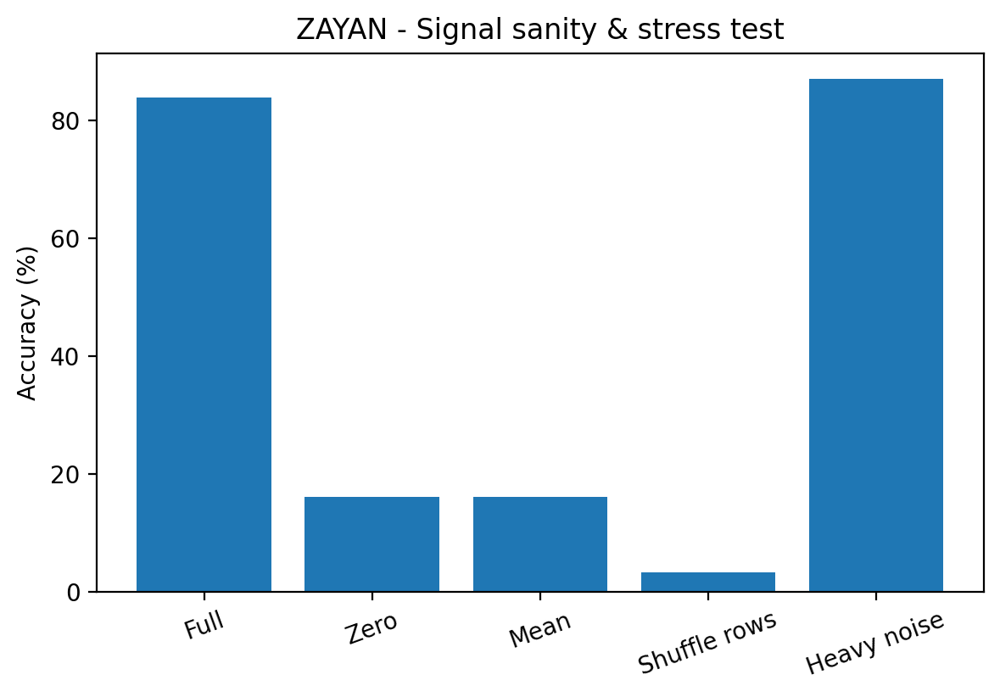


=== Augmentation consistency / stress (ZAYAN) ===
Base accuracy:  83.87 %
TTA majority-vote accuracy (n_aug=5):  77.42 %
Fraction of samples with any label change across aug:  12.90 %


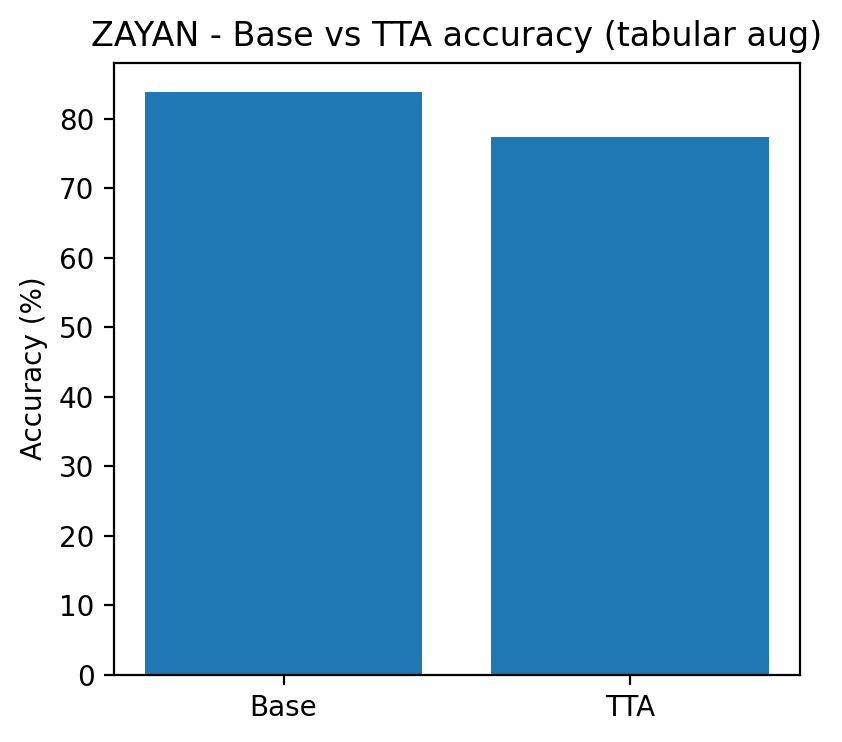


=== Per-class accuracy summary (ZAYAN, sorted by support) ===
   class_id  support  accuracy
4         4        5     80.00
1         1        4    100.00
3         3        4     75.00
0         0        3    100.00
2         2        3     66.67
5         5        3    100.00
6         6        3    100.00
7         7        3     66.67
8         8        3     66.67

=== Bucketed per-class accuracy (ZAYAN, by support) ===
        count   mean
bucket              
head        3  85.00
medium      6  83.33


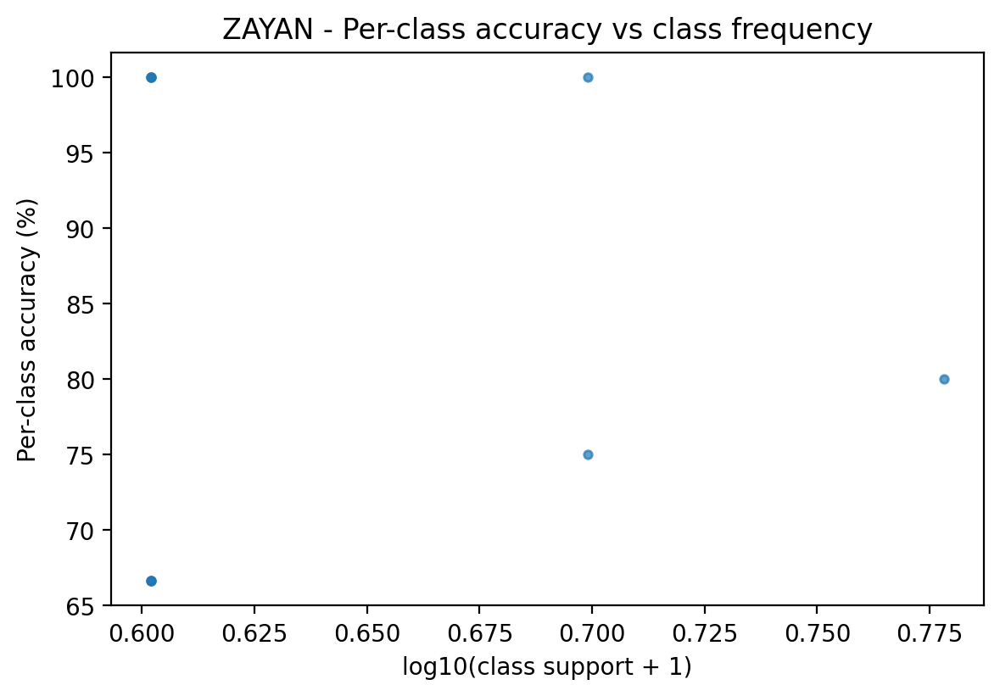


[Done] Extra sanity & stress tests (ZAYAN) complete.
Saved figures:
  - zayan_signal_sanity_stress.png
  - zayan_tta_accuracy.png
  - zayan_per_class_accuracy.png


In [ ]:
# ============================================================
# Extra sanity & stress diagnostics for ZAYAN (tabular only)
#   1) Signal sanity / stress modes (full vs degenerate inputs)
#   2) Augmentation consistency / TTA stress test
#   3) Per-class accuracy vs class frequency
# Requires:
#   - best_model as `model`
#   - loader : DataLoader over test split
#   - predict_loader(...) from previous ZAYAN diagnostics cell
# ============================================================
import numpy as np
import torch
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics import accuracy_score
from collections import Counter

plt.rcParams.update({"savefig.facecolor": "white", "figure.facecolor": "white"})

model = best_model
device = model.device
print(f"[INFO] Extra tests using ZAYAN on device={device}")

# Sanity check for predict_loader
try:
    _ = predict_loader
except NameError as e:
    raise RuntimeError(
        "predict_loader is not defined. Run the previous ZAYAN diagnostics cell first."
    ) from e


# -------------------------------------------------------------------
# 1. Signal sanity & stress tests (tabular-only analogue of modalities)
#    Modes:
#      - full        : original inputs
#      - zero        : all features zero (should go near chance)
#      - mean        : all features set to global mean
#      - shuffle_rows: permute rows (break X–y alignment)
#      - heavy_noise : add strong Gaussian noise
# -------------------------------------------------------------------
def make_signal_perturber(mode, X_stats=None):
    """
    mode ∈ {"full", "zero", "mean", "shuffle_rows", "heavy_noise"}.
    X_stats: optional dict with {"mean": tensor} computed once.
    """
    assert mode in {"full", "zero", "mean", "shuffle_rows", "heavy_noise"}

    def _perturb(xb):
        xb = xb.clone()
        B, m = xb.shape

        if mode == "full":
            return xb

        if mode == "zero":
            xb.zero_()
            return xb

        if mode == "mean":
            if X_stats is None or "mean" not in X_stats:
                raise ValueError("X_stats['mean'] required for 'mean' mode.")
            mean_vec = X_stats["mean"].to(xb.device)
            xb[:] = mean_vec
            return xb

        if mode == "shuffle_rows":
            perm = torch.randperm(B, device=xb.device)
            xb = xb[perm]
            return xb

        if mode == "heavy_noise":
            # Strong Gaussian noise relative to feature scale
            noise = torch.randn_like(xb) * 0.5
            xb = xb + noise
            return xb

        return xb

    return _perturb


# Compute global mean on test set once (for "mean" mode)
with torch.no_grad():
    all_x = []
    for xb, yb in loader:
        all_x.append(xb)
    all_x = torch.cat(all_x, dim=0)
    X_mean = all_x.mean(dim=0, keepdim=True)  # (1, m)
X_stats = {"mean": X_mean}

@torch.no_grad()
def eval_signal_modes(loader, modes, X_stats):
    results = {}
    for m in modes:
        print(f"\n[Mode: {m}]")
        _, _, preds, y, _ = predict_loader(loader, perturb=make_signal_perturber(m, X_stats))
        acc = accuracy_score(y, preds) * 100.0
        results[m] = acc
        print(f"  Accuracy = {acc:6.2f} %  (n={len(y)})")
    return results

modes = ["full", "zero", "mean", "shuffle_rows", "heavy_noise"]
signal_results = eval_signal_modes(loader, modes, X_stats)

# Plot as bar chart
plt.figure(figsize=(6.0, 4.2))
names = ["Full", "Zero", "Mean", "Shuffle rows", "Heavy noise"]
vals  = [signal_results[m] for m in modes]
plt.bar(range(len(names)), vals)
plt.xticks(range(len(names)), names, rotation=20)
plt.ylabel("Accuracy (%)")
plt.title("ZAYAN - Signal sanity & stress test")
plt.tight_layout()
plt.savefig("zayan_signal_sanity_stress.png", dpi=600, bbox_inches="tight")
plt.show()


# -------------------------------------------------------------------
# 2. Augmentation consistency / stress test (tabular TTA)
#    - Augment = mild noise + random feature dropout
#    - Compare base vs TTA majority-vote accuracy
#    - Measure fraction of samples whose prediction changes under aug
# -------------------------------------------------------------------
def random_tabular_augment_batch(xb, noise_std=0.05, drop_prob=0.1):
    """
    Simple tabular augmentation:
      - Add Gaussian noise with std=noise_std
      - Randomly zero out each feature with probability drop_prob
    """
    xb = xb.clone()
    noise = torch.randn_like(xb) * noise_std
    xb = xb + noise

    if drop_prob > 0.0:
        mask = (torch.rand_like(xb) > drop_prob).float()
        xb = xb * mask

    return xb

@torch.no_grad()
def predict_with_tab_aug(loader, n_aug=5, noise_std=0.05, drop_prob=0.1):
    # Base predictions
    _, probs_base, preds_base, y, _ = predict_loader(loader, perturb=None)
    preds_base = preds_base
    y = y

    # Augmented predictions
    all_aug_preds = []

    for j in range(n_aug):
        preds_all = []
        for xb, yb in loader:
            xb = xb.to(device)
            xb_aug = random_tabular_augment_batch(xb, noise_std=noise_std, drop_prob=drop_prob)

            # Manual ZAYAN-T forward (same as in predict_loader)
            bs, m = xb_aug.shape
            H = xb_aug.unsqueeze(-1) * model.Z.unsqueeze(0)            # (bs, m, d)
            H = H + model.zt.pos_embed.unsqueeze(0)
            H = model.zt.dropout(H)
            H = H.permute(1, 0, 2)
            H_out = model.zt.transformer(H)
            H_out = H_out.permute(1, 0, 2)
            rep = H_out.mean(dim=1)
            logits = model.zt.mlp(rep)
            probs = torch.softmax(logits, dim=1)
            preds = probs.argmax(1)
            preds_all.append(preds.cpu())
        preds_all = torch.cat(preds_all).numpy()
        all_aug_preds.append(preds_all)

    all_aug_preds = np.stack(all_aug_preds, axis=1)  # [N, n_aug]

    # Majority-vote across augmentations
    maj_preds = []
    for i in range(all_aug_preds.shape[0]):
        vals, counts = np.unique(all_aug_preds[i], return_counts=True)
        maj_preds.append(vals[counts.argmax()])
    maj_preds = np.array(maj_preds)

    # Metrics
    base_acc     = accuracy_score(y, preds_base) * 100.0
    tta_acc      = accuracy_score(y, maj_preds) * 100.0
    change_mask  = (all_aug_preds != preds_base[:, None]).any(axis=1)
    frac_changed = change_mask.mean() * 100.0

    print("\n=== Augmentation consistency / stress (ZAYAN) ===")
    print(f"Base accuracy: {base_acc:6.2f} %")
    print(f"TTA majority-vote accuracy (n_aug={n_aug}): {tta_acc:6.2f} %")
    print(f"Fraction of samples with any label change across aug: {frac_changed:6.2f} %")

    return {
        "base_acc": base_acc,
        "tta_acc": tta_acc,
        "frac_changed": frac_changed,
        "y": y,
        "preds_base": preds_base,
        "maj_preds": maj_preds,
        "all_aug_preds": all_aug_preds,
    }

aug_results = predict_with_tab_aug(loader, n_aug=5, noise_std=0.05, drop_prob=0.1)

# Base vs TTA accuracy plot
plt.figure(figsize=(4.2, 3.8))
plt.bar([0, 1], [aug_results["base_acc"], aug_results["tta_acc"]])
plt.xticks([0, 1], ["Base", "TTA"])
plt.ylabel("Accuracy (%)")
plt.title("ZAYAN - Base vs TTA accuracy (tabular aug)")
plt.tight_layout()
plt.savefig("zayan_tta_accuracy.png", dpi=600, bbox_inches="tight")
plt.show()


# -------------------------------------------------------------------
# 3. Per-class accuracy vs class frequency
# -------------------------------------------------------------------
_, _, preds_full, y_full, _ = predict_loader(loader, perturb=None)
labels = y_full
preds  = preds_full

classes = np.unique(labels)
per_class_acc = []
per_class_cnt = []

for c in classes:
    idx = np.where(labels == c)[0]
    per_class_cnt.append(len(idx))
    if len(idx) > 0:
        per_class_acc.append(accuracy_score(labels[idx], preds[idx]) * 100.0)
    else:
        per_class_acc.append(np.nan)

per_class_acc = np.array(per_class_acc)
per_class_cnt = np.array(per_class_cnt)

df_pc = pd.DataFrame({
    "class_id": classes,
    "support": per_class_cnt,
    "accuracy": per_class_acc,
})
df_pc = df_pc.sort_values("support", ascending=False)

print("\n=== Per-class accuracy summary (ZAYAN, sorted by support) ===")
print(df_pc.round(2))

# Bucket head/medium/tail by support quantiles
quantiles = df_pc["support"].quantile([0.33, 0.67]).values
q1, q2 = quantiles[0], quantiles[1]

def _bucket(s):
    if s >= q2: return "head"
    if s >= q1: return "medium"
    return "tail"

df_pc["bucket"] = df_pc["support"].apply(_bucket)
bucket_summary = df_pc.groupby("bucket")["accuracy"].agg(["count", "mean"])

print("\n=== Bucketed per-class accuracy (ZAYAN, by support) ===")
print(bucket_summary.round(2))

# Scatter: log10 support vs accuracy
plt.figure(figsize=(6.0, 4.2))
x = np.log10(df_pc["support"] + 1)
y_sc = df_pc["accuracy"]
plt.scatter(x, y_sc, s=12, alpha=0.7)
plt.xlabel("log10(class support + 1)")
plt.ylabel("Per-class accuracy (%)")
plt.title("ZAYAN - Per-class accuracy vs class frequency")
plt.tight_layout()
plt.savefig("zayan_per_class_accuracy.png", dpi=600, bbox_inches="tight")
plt.show()

print("\n[Done] Extra sanity & stress tests (ZAYAN) complete.")
print("Saved figures:")
print("  - zayan_signal_sanity_stress.png")
print("  - zayan_tta_accuracy.png")
print("  - zayan_per_class_accuracy.png")

# Additional Reliability and Interpretibility Diagnostics

[INFO] Built ZAYAN test DataLoader: 1 batches, batch_size=32
[INFO] X_te shape: (31, 147), y_te shape: (31,)
[INFO] Diagnostics using ZAYAN on device=cuda
Base accuracy on test loader: 83.87% (N=31)


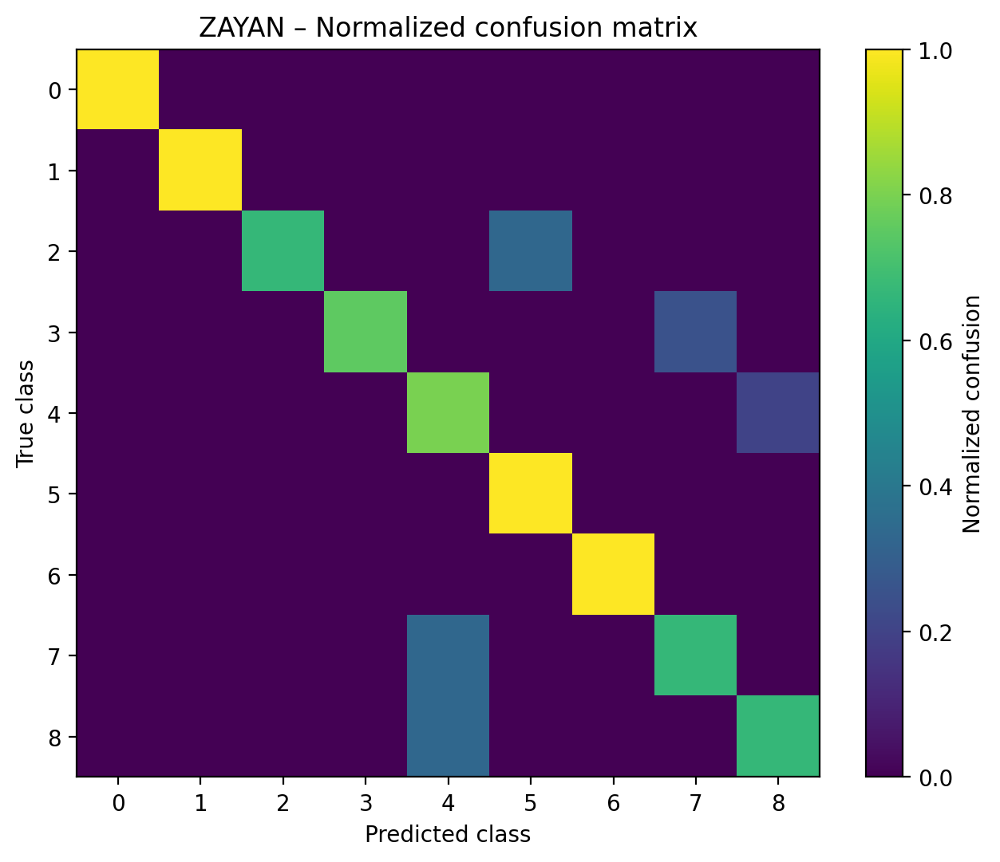


=== Top-10 most frequent confusions (true → predicted) ===
 1. true=8 → pred=4 | count=1
 2. true=7 → pred=4 | count=1
 3. true=4 → pred=8 | count=1
 4. true=3 → pred=7 | count=1
 5. true=2 → pred=5 | count=1
Top-1 accuracy: 83.87%
Top-2 accuracy: 96.77%
Top-3 accuracy: 100.00%
Top-5 accuracy: 100.00%


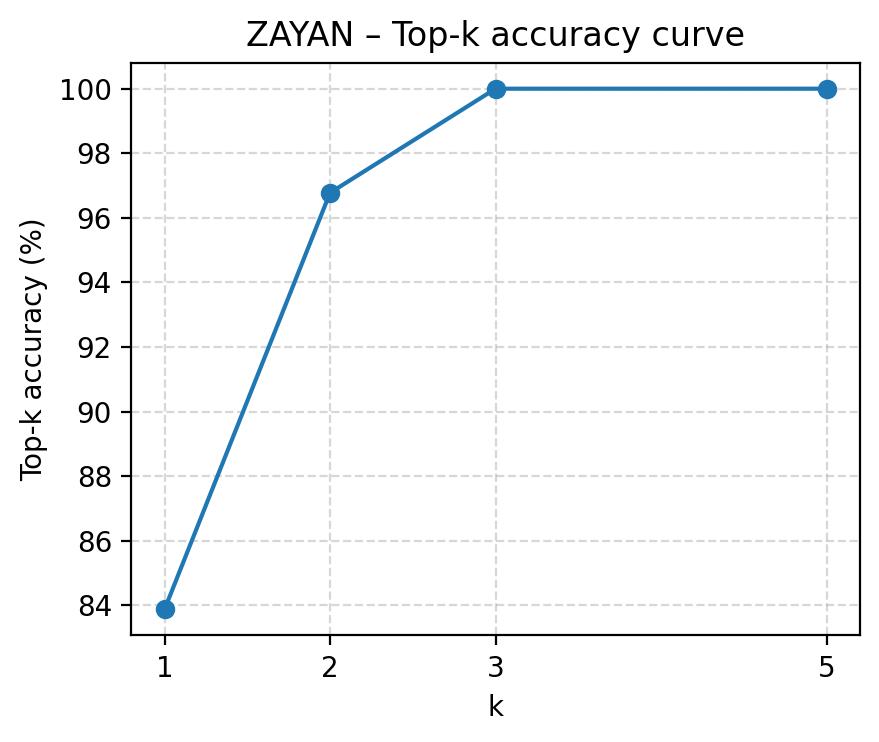


Mean margin (correct): 0.858
Mean margin (wrong)  : 0.769


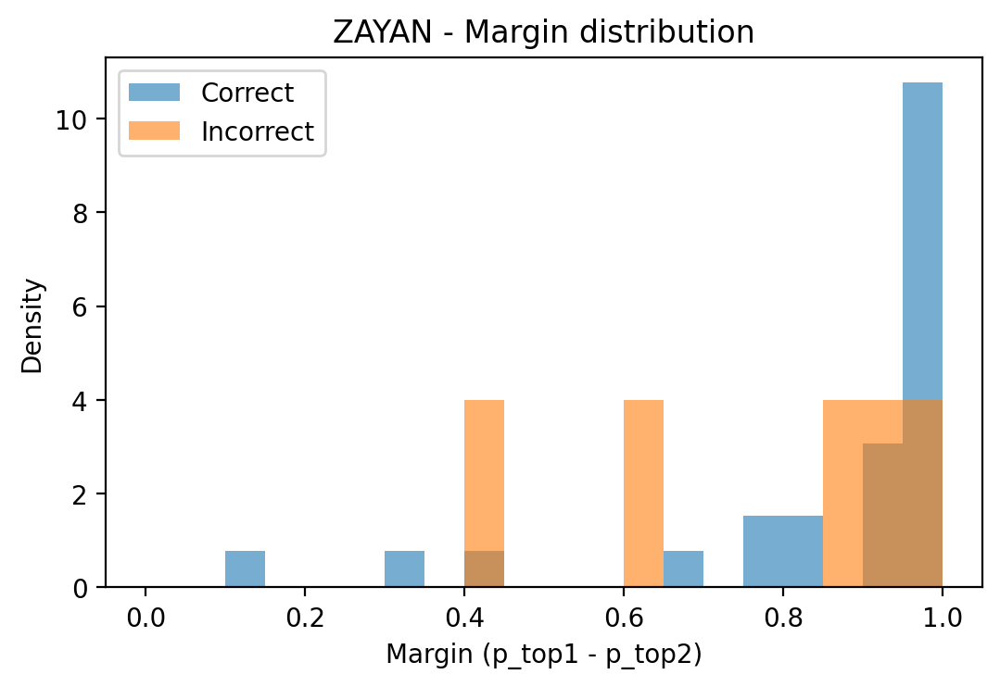


Detected tabular features: m = 147

=== Per-feature permutation importance (accuracy drop, % points) ===
Baseline accuracy: 83.87%
BrdIndx              | acc= 83.87% | drop=  0.00 pts
Area                 | acc= 83.87% | drop=  0.00 pts
Round                | acc= 83.87% | drop=  0.00 pts
Bright               | acc= 80.65% | drop=  3.23 pts
Compact              | acc= 83.87% | drop=  0.00 pts
ShpIndx              | acc= 83.87% | drop=  0.00 pts
Mean_NIR             | acc= 80.65% | drop=  3.23 pts
Mean_R               | acc= 83.87% | drop=  0.00 pts
Mean_G               | acc= 83.87% | drop=  0.00 pts
SD_NIR               | acc= 80.65% | drop=  3.23 pts
SD_R                 | acc= 83.87% | drop=  0.00 pts
SD_G                 | acc= 83.87% | drop=  0.00 pts
LW                   | acc= 80.65% | drop=  3.23 pts
GLCM1                | acc= 80.65% | drop=  3.23 pts
Rect                 | acc= 83.87% | drop=  0.00 pts
GLCM2                | acc= 83.87% | drop=  0.00 pts
Dens                

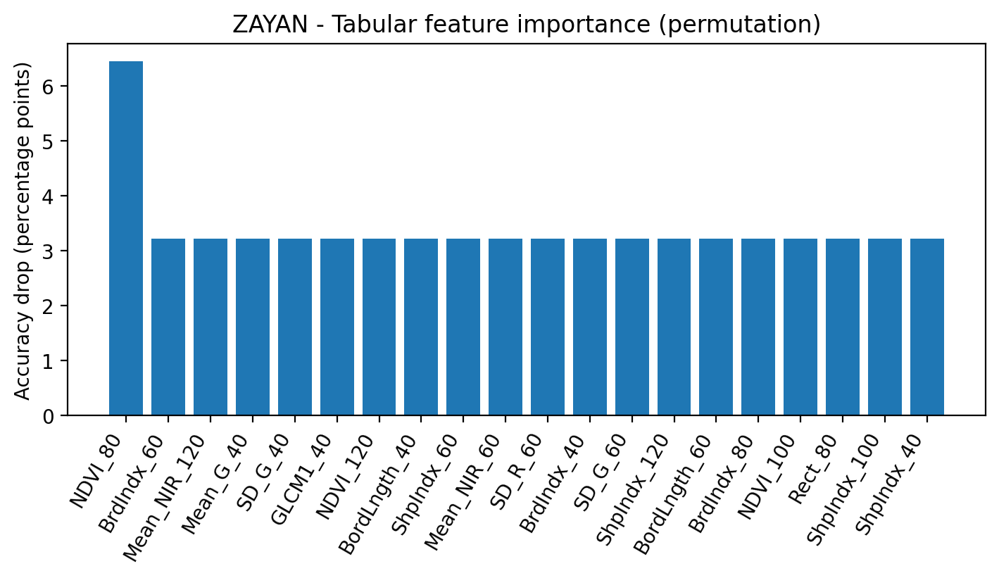


[Done] Extra diagnostics pack (ZAYAN) finished.
Saved figures:
  - zayan_confusion_matrix_norm.png
  - zayan_topk_accuracy.png
  - zayan_margin_hist.png
  - zayan_tab_feature_importance.png


In [ ]:
# ===================== Extra diagnostics pack (ZAYAN) =====================
import numpy as np
import torch
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics import confusion_matrix, accuracy_score, top_k_accuracy_score
from torch.utils.data import TensorDataset, DataLoader

plt.rcParams.update({"savefig.facecolor": "white", "figure.facecolor": "white"})

# -------------------------------------------------------------------
# 0. Build test DataLoader for ZAYAN
# -------------------------------------------------------------------
device = best_model.device

# X_te, y_te should come from your earlier train_test_split
if isinstance(X_te, pd.DataFrame):
    X_te_arr = X_te.values.astype(np.float32)
else:
    X_te_arr = np.asarray(X_te, dtype=np.float32)

if isinstance(y_te, pd.Series):
    y_te_arr = y_te.to_numpy()
else:
    y_te_arr = np.asarray(y_te)

X_te_t = torch.tensor(X_te_arr, dtype=torch.float32)
y_te_t = torch.tensor(y_te_arr, dtype=torch.long)

batch_size = best_params.get("batch_size", 32)
te_ds     = TensorDataset(X_te_t, y_te_t)
te_loader = DataLoader(te_ds, batch_size=batch_size, shuffle=False)

print(f"[INFO] Built ZAYAN test DataLoader: {len(te_loader)} batches, batch_size={batch_size}")
print(f"[INFO] X_te shape: {X_te_arr.shape}, y_te shape: {y_te_arr.shape}")

# -------------------------------------------------------------------
# 1. Helper: predict_loader for ZAYAN (logits, probs, preds, y, embeddings)
# -------------------------------------------------------------------
@torch.no_grad()
def predict_loader(loader, perturb=None):
    """
    Runs the ZAYAN transformer (ZAYAN-T) on a DataLoader of (xb, yb).

    Returns:
        logits: (N, C)
        probs:  (N, C)
        preds:  (N,)
        y:      (N,)
        embs:   (N, d)  pooled representations before MLP
    """
    model = best_model
    model.zt.eval()

    Z = model.Z.to(device)   # (m, emb_dim) feature embeddings from CL

    logits_all, probs_all, preds_all, y_all, embs_all = [], [], [], [], []

    for xb, yb in loader:
        xb = xb.to(device)      # (B, m)
        yb = yb.to(device)

        if perturb is not None:
            xb = perturb(xb)

        # ----- replicate ZAYAN_T forward up to pooled rep -----
        bs, m = xb.shape
        H = xb.unsqueeze(-1) * Z.unsqueeze(0)             # (bs, m, d)
        H = H + model.zt.pos_embed.unsqueeze(0)           # add positional enc
        H = model.zt.dropout(H)

        H = H.permute(1, 0, 2)                            # (m, bs, d)
        H_out = model.zt.transformer(H)
        H_out = H_out.permute(1, 0, 2)                    # (bs, m, d)

        rep = H_out.mean(dim=1)                           # (bs, d) pooled reps
        logits = model.zt.mlp(rep)                        # (bs, C)
        probs  = torch.softmax(logits, dim=1)
        preds  = probs.argmax(dim=1)

        logits_all.append(logits.cpu())
        probs_all.append(probs.cpu())
        preds_all.append(preds.cpu())
        y_all.append(yb.cpu())
        embs_all.append(rep.cpu())

    logits = torch.cat(logits_all).numpy()
    probs  = torch.cat(probs_all).numpy()
    preds  = torch.cat(preds_all).numpy()
    y      = torch.cat(y_all).numpy()
    embs   = torch.cat(embs_all).numpy()
    return logits, probs, preds, y, embs


# -------------------------------------------------------------------
# 2. Run base forward pass
# -------------------------------------------------------------------
print(f"[INFO] Diagnostics using ZAYAN on device={device}")
logits, probs, preds, y, embs = predict_loader(te_loader, perturb=None)

num_classes = len(np.unique(y))
base_acc = accuracy_score(y, preds) * 100
print(f"Base accuracy on test loader: {base_acc:.2f}% (N={len(y)})")

# -------------------------------------------------------------------
# 3. Confusion matrix + normalized confusion
# -------------------------------------------------------------------
cm = confusion_matrix(y, preds, labels=np.arange(num_classes))
with np.errstate(divide="ignore", invalid="ignore"):
    cm_norm = cm.astype(float) / cm.sum(axis=1, keepdims=True)
    cm_norm[np.isnan(cm_norm)] = 0.0

plt.figure(figsize=(6.5, 5.5))
plt.imshow(cm_norm, interpolation="nearest", aspect="auto")
plt.colorbar(label="Normalized confusion")
plt.xlabel("Predicted class")
plt.ylabel("True class")
plt.title("ZAYAN – Normalized confusion matrix")
plt.tight_layout()
plt.savefig("zayan_confusion_matrix_norm.png", dpi=600, bbox_inches="tight")
plt.show()

# Top-10 confusion pairs
conf_pairs = []
for i in range(num_classes):
    for j in range(num_classes):
        if i == j:
            continue
        if cm[i, j] > 0:
            conf_pairs.append((cm[i, j], i, j))
conf_pairs.sort(reverse=True)

print("\n=== Top-10 most frequent confusions (true → predicted) ===")
for k in range(min(10, len(conf_pairs))):
    c, i, j = conf_pairs[k]
    print(f"{k+1:2d}. true={i} → pred={j} | count={c}")

# -------------------------------------------------------------------
# 4. Top-k accuracy curve (k = 1..5)
# -------------------------------------------------------------------
ks = [1, 2, 3, 5]
topk_accs = []
for k in ks:
    acc_k = top_k_accuracy_score(y, probs, k=k) * 100
    topk_accs.append(acc_k)
    print(f"Top-{k} accuracy: {acc_k:.2f}%")

plt.figure(figsize=(4.5, 3.8))
plt.plot(ks, topk_accs, "-o")
plt.xticks(ks)
plt.xlabel("k")
plt.ylabel("Top-k accuracy (%)")
plt.title("ZAYAN – Top-k accuracy curve")
plt.grid(True, ls="--", alpha=0.5)
plt.tight_layout()
plt.savefig("zayan_topk_accuracy.png", dpi=600, bbox_inches="tight")
plt.show()

# -------------------------------------------------------------------
# 5. Margin / confidence separation
#    margin = p_top1 - p_top2, compare distribution for correct vs wrong
# -------------------------------------------------------------------
sorted_probs = np.sort(probs, axis=1)[:, ::-1]
top1 = sorted_probs[:, 0]
top2 = sorted_probs[:, 1] if sorted_probs.shape[1] > 1 else np.zeros_like(top1)
margins = top1 - top2

correct = (preds == y)
margins_correct = margins[correct]
margins_wrong   = margins[~correct]

print(f"\nMean margin (correct): {margins_correct.mean():.3f}")
print(f"Mean margin (wrong)  : {margins_wrong.mean():.3f}")

plt.figure(figsize=(5.5, 3.8))
bins = np.linspace(0.0, 1.0, 21)
plt.hist(margins_correct, bins=bins, alpha=0.6, label="Correct", density=True)
plt.hist(margins_wrong,   bins=bins, alpha=0.6, label="Incorrect", density=True)
plt.xlabel("Margin (p_top1 - p_top2)")
plt.ylabel("Density")
plt.title("ZAYAN - Margin distribution")
plt.legend()
plt.tight_layout()
plt.savefig("zayan_margin_hist.png", dpi=600, bbox_inches="tight")
plt.show()

# -------------------------------------------------------------------
# 6. Per-feature permutation importance (tabular accuracy drop)
#    - accuracy drop when shuffling ONE feature column across samples
# -------------------------------------------------------------------
# Get number of features from a single batch
xb0, yb0 = next(iter(te_loader))
m_features = xb0.shape[1]
print(f"\nDetected tabular features: m = {m_features}")

# Try to use real feature names from X_train_scaled if available
feature_names = None
if "X_train_scaled" in globals():
    if isinstance(X_train_scaled, pd.DataFrame):
        feature_names = list(X_train_scaled.columns)
        if len(feature_names) != m_features:
            print("[WARN] X_train_scaled.columns length != m_features, ignoring names.")
            feature_names = None

def make_single_feature_shuffler(idx):
    """
    Returns a perturb(xb) function that shuffles column idx across the batch.
    xb: (B, m)
    """
    def _perturb(xb):
        xb = xb.clone()
        B = xb.shape[0]
        perm = torch.randperm(B, device=xb.device)
        xb[:, idx] = xb[perm, idx]
        return xb
    return _perturb

def eval_accuracy(loader, perturb=None):
    _, _, p, yy, _ = predict_loader(loader, perturb=perturb)
    return accuracy_score(yy, p) * 100

print("\n=== Per-feature permutation importance (accuracy drop, % points) ===")
print(f"Baseline accuracy: {base_acc:.2f}%")

drops = []
for i in range(m_features):
    acc_i = eval_accuracy(te_loader, perturb=make_single_feature_shuffler(i))
    drop = base_acc - acc_i
    if feature_names is not None and i < len(feature_names):
        fname = feature_names[i]
    else:
        fname = f"feat_{i}"
    drops.append((i, drop, fname))
    print(f"{fname:20s} | acc={acc_i:6.2f}% | drop={drop:6.2f} pts")

df_imp = pd.DataFrame(drops, columns=["idx", "acc_drop", "feat"])
df_imp = df_imp.sort_values("acc_drop", ascending=False)

print("\nTop-15 most important features (by accuracy drop):")
print(df_imp.head(15).round(2))

# Bar plot for the top-K features
K = min(20, len(df_imp))
top_df = df_imp.head(K)

plt.figure(figsize=(7.2, 4.2))
plt.bar(range(K), top_df["acc_drop"])
plt.xticks(range(K), top_df["feat"], rotation=60, ha="right")
plt.ylabel("Accuracy drop (percentage points)")
plt.title("ZAYAN - Tabular feature importance (permutation)")
plt.tight_layout()
plt.savefig("zayan_tab_feature_importance.png", dpi=600, bbox_inches="tight")
plt.show()

print("\n[Done] Extra diagnostics pack (ZAYAN) finished.")
print("Saved figures:")
print("  - zayan_confusion_matrix_norm.png")
print("  - zayan_topk_accuracy.png")
print("  - zayan_margin_hist.png")
print("  - zayan_tab_feature_importance.png")

# Theory-Inspired Representation Diagnostics

[INFO] Theory-ish diagnostics using ZAYAN on device=cuda
[INFO] Using existing te_loader
[INFO] Using existing predict_loader
[Info] N=31 samples, embedding dim=128
[Info] Base top-1 accuracy: 83.87%

[Geom] Effective dimension (participation ratio): 4.9

[Geom] Components needed for target variance:
   target_var  k_components
0        0.50             2
1        0.80             4
2        0.90             5
3        0.95             6
4        0.99             8
[kNN] Leave-one-out kNN accuracy (k=1): 70.97%
[kNN] Leave-one-out kNN accuracy (k=3): 64.52%
[kNN] Leave-one-out kNN accuracy (k=5): 38.71%
[kNN] Leave-one-out kNN accuracy (k=10): 32.26%
[kNN] Leave-one-out kNN accuracy (k=20): 6.45%

[Margin] Mean normalized margin (correct):  0.4028
[Margin] Mean normalized margin (incorrect): -0.2879

[Done] Theory-ish diagnostics (ZAYAN) complete.
Saved figures:
  - zayan_embedding_spectrum.png
  - zayan_embedding_cumulative_variance.png
  - zayan_knn_vs_head.png
  - zayan_margin_condi

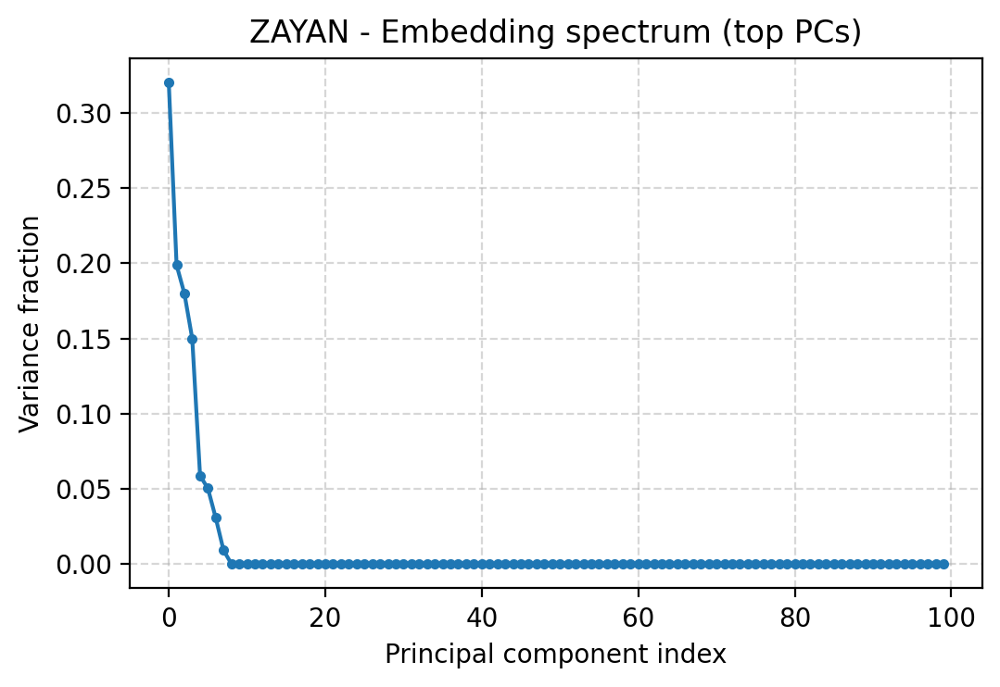

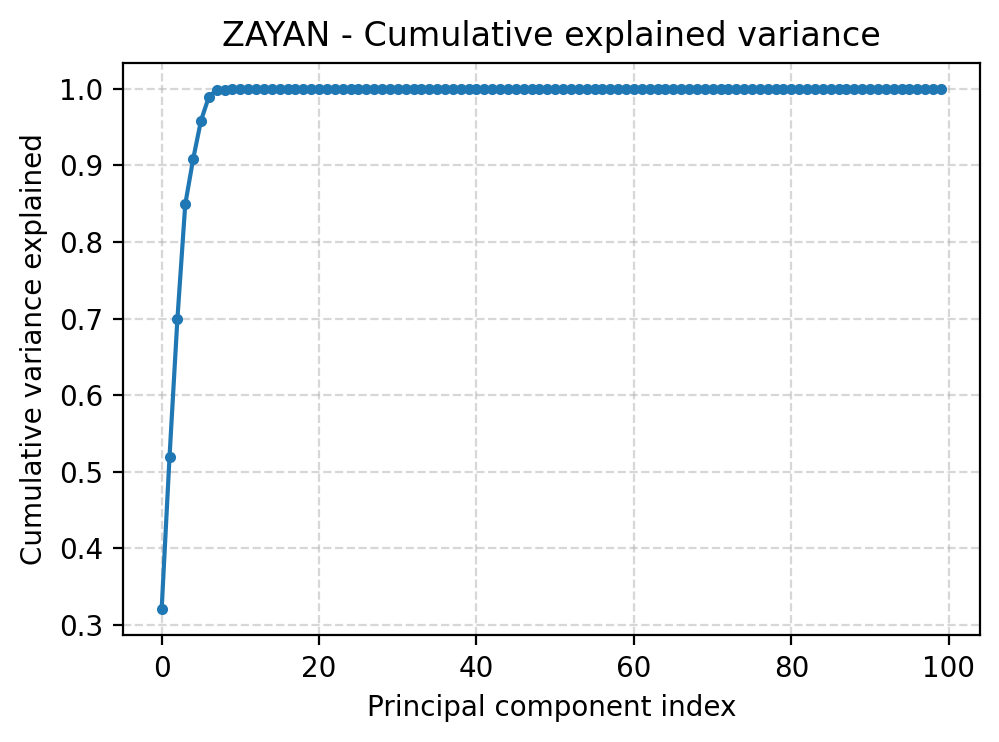

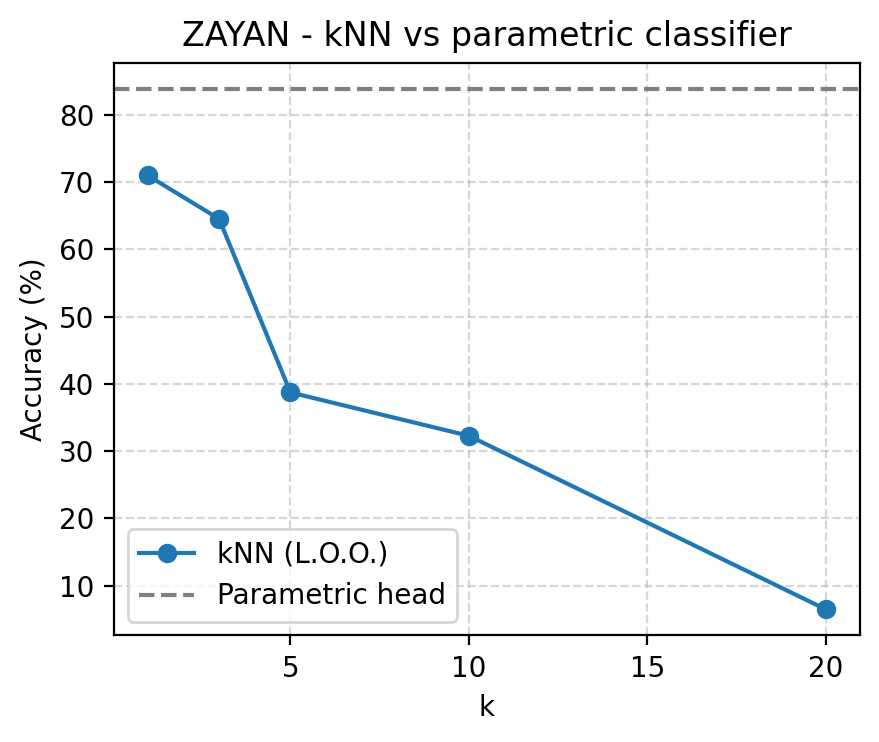

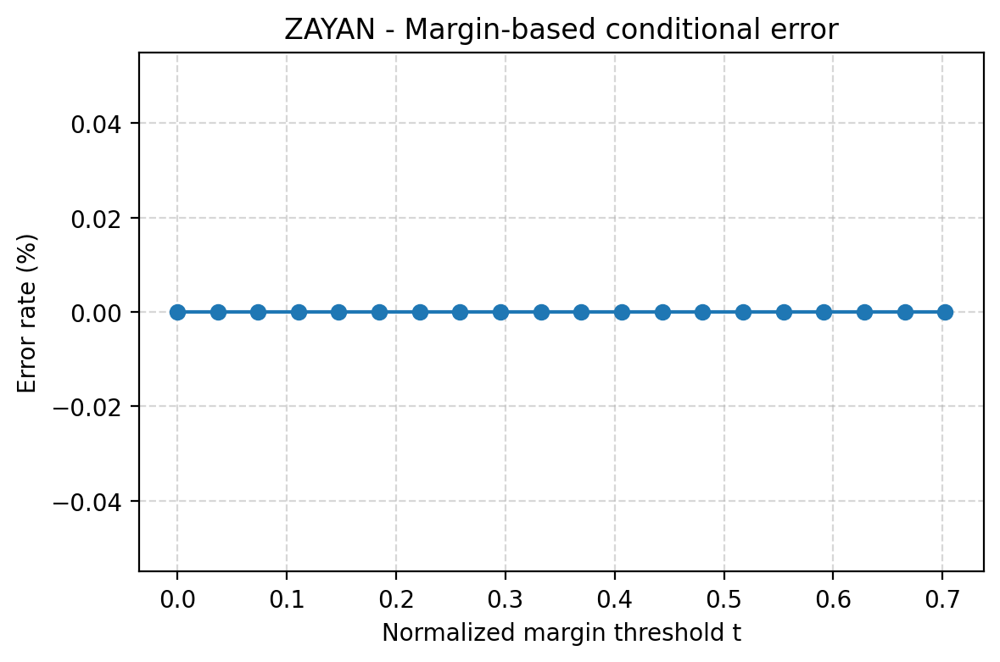

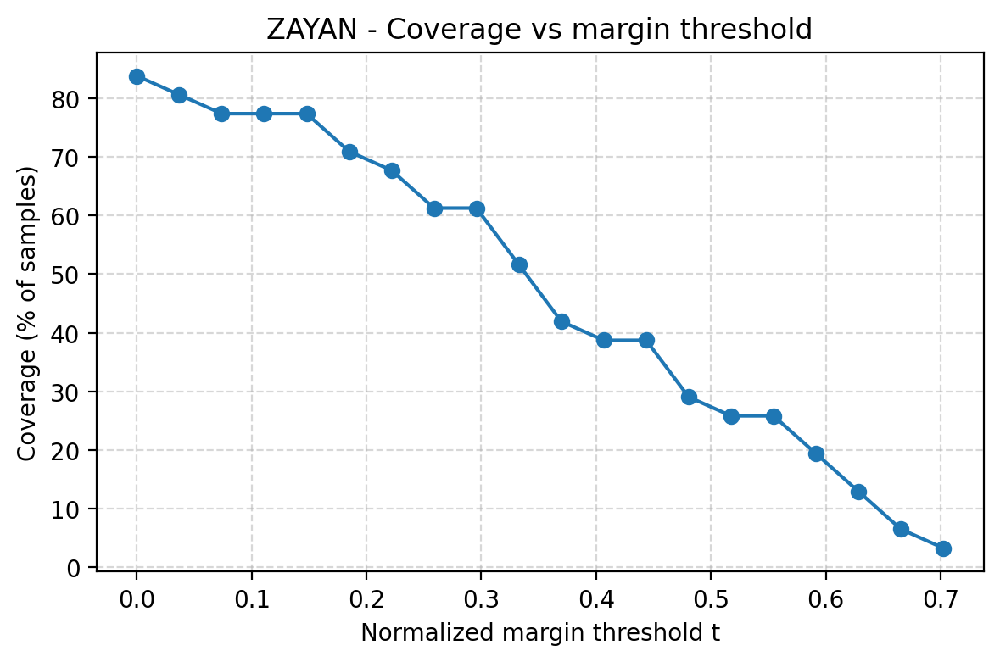

In [ ]:
# ============= Theory-ish diagnostics: geometry, kNN, margins (ZAYAN) =============
import numpy as np
import torch
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

plt.rcParams.update({"savefig.facecolor": "white", "figure.facecolor": "white"})

# -------------------------------------------------------------------
# 0. Hook ZAYAN model + test loader + predict_loader
# -------------------------------------------------------------------
model = best_model  # ZAYAN wrapper
device = model.device
print(f"[INFO] Theory-ish diagnostics using ZAYAN on device={device}")

# Build te_loader if not already defined
from torch.utils.data import TensorDataset, DataLoader

if "te_loader" not in globals():
    print("[INFO] te_loader not found in globals; rebuilding from X_te / y_te ...")
    if isinstance(X_te, pd.DataFrame):
        X_te_arr = X_te.values.astype(np.float32)
    else:
        X_te_arr = np.asarray(X_te, dtype=np.float32)

    if isinstance(y_te, pd.Series):
        y_te_arr = y_te.to_numpy()
    else:
        y_te_arr = np.asarray(y_te)

    X_te_t = torch.tensor(X_te_arr, dtype=torch.float32)
    y_te_t = torch.tensor(y_te_arr, dtype=torch.long)

    batch_size = best_params.get("batch_size", 32)
    te_ds     = TensorDataset(X_te_t, y_te_t)
    te_loader = DataLoader(te_ds, batch_size=batch_size, shuffle=False)

    print(f"[INFO] Built ZAYAN test DataLoader: {len(te_loader)} batches, batch_size={batch_size}")
else:
    print("[INFO] Using existing te_loader")

# Define predict_loader for ZAYAN if missing
if "predict_loader" not in globals():
    print("[INFO] predict_loader not found; defining for ZAYAN...")

    @torch.no_grad()
    def predict_loader(loader, perturb=None):
        """
        Runs ZAYAN-T on a DataLoader of (xb, yb).

        Returns:
            logits: (N, C)
            probs:  (N, C)
            preds:  (N,)
            y:      (N,)
            embs:   (N, d)  pooled representations before MLP
        """
        model.zt.eval()
        Z = model.Z.to(device)   # (m, emb_dim)

        logits_all, probs_all, preds_all, y_all, embs_all = [], [], [], [], []

        for xb, yb in loader:
            xb = xb.to(device)
            yb = yb.to(device)

            if perturb is not None:
                xb = perturb(xb)

            # replicate ZAYAN_T forward up to pooled rep
            bs, m = xb.shape
            H = xb.unsqueeze(-1) * Z.unsqueeze(0)             # (bs, m, d)
            H = H + model.zt.pos_embed.unsqueeze(0)
            H = model.zt.dropout(H)

            H = H.permute(1, 0, 2)                            # (m, bs, d)
            H_out = model.zt.transformer(H)
            H_out = H_out.permute(1, 0, 2)                    # (bs, m, d)

            rep = H_out.mean(dim=1)                           # (bs, d)
            logits = model.zt.mlp(rep)                        # (bs, C)
            probs  = torch.softmax(logits, dim=1)
            preds  = probs.argmax(dim=1)

            logits_all.append(logits.cpu())
            probs_all.append(probs.cpu())
            preds_all.append(preds.cpu())
            y_all.append(yb.cpu())
            embs_all.append(rep.cpu())

        logits = torch.cat(logits_all).numpy()
        probs  = torch.cat(probs_all).numpy()
        preds  = torch.cat(preds_all).numpy()
        y      = torch.cat(y_all).numpy()
        embs   = torch.cat(embs_all).numpy()
        return logits, probs, preds, y, embs
else:
    print("[INFO] Using existing predict_loader")

# ---------- 1. Get cached predictions & embeddings ----------
logits, probs, preds, y, embs = predict_loader(te_loader, perturb=None)
y     = np.asarray(y)
preds = np.asarray(preds)
N, D  = embs.shape
print(f"[Info] N={N} samples, embedding dim={D}")
base_acc = accuracy_score(y, preds) * 100
print(f"[Info] Base top-1 accuracy: {base_acc:.2f}%")

# ---------- 2. Representation spectrum & effective dimension ----------
# Center embeddings
embs_c = embs - embs.mean(axis=0, keepdims=True)

# Covariance in embedding space (D x D)
cov = np.cov(embs_c, rowvar=False)  # shape (D, D)

# Eigenvalues of covariance (variance along PCs)
evals, _ = np.linalg.eigh(cov)
evals = np.sort(np.maximum(evals, 0))[::-1]  # descending, clamp negatives

total_var = evals.sum() + 1e-12
explained = evals / total_var
cum_expl  = np.cumsum(explained)

# Effective dimension (participation ratio)
eff_dim = (total_var**2) / (np.sum(evals**2) + 1e-12)
print(f"\n[Geom] Effective dimension (participation ratio): {eff_dim:.1f}")

plt.figure(figsize=(5.5, 3.8))
plt.plot(explained[: min(100, D)], "-o", markersize=3)
plt.xlabel("Principal component index")
plt.ylabel("Variance fraction")
plt.title("ZAYAN - Embedding spectrum (top PCs)")
plt.grid(True, ls="--", alpha=0.5)
plt.tight_layout()
plt.savefig("zayan_embedding_spectrum.png", dpi=600, bbox_inches="tight")

plt.figure(figsize=(5.1, 3.8))
plt.plot(cum_expl[: min(100, D)], "-o", markersize=3)
plt.xlabel("Principal component index")
plt.ylabel("Cumulative variance explained")
plt.title("ZAYAN - Cumulative explained variance")
plt.grid(True, ls="--", alpha=0.5)
plt.tight_layout()
plt.savefig("zayan_embedding_cumulative_variance.png", dpi=600, bbox_inches="tight")

# How many components to reach target variance levels?
targets = [0.5, 0.8, 0.9, 0.95, 0.99]
rows = []
for t in targets:
    k = int(np.searchsorted(cum_expl, t) + 1)
    rows.append({"target_var": t, "k_components": k})
df_var = pd.DataFrame(rows)
print("\n[Geom] Components needed for target variance:")
print(df_var)

# ---------- 3. kNN classifier vs parametric head ----------
ks = [1, 3, 5, 10, 20]
knn_accs = []

nbrs = KNeighborsClassifier(n_neighbors=max(ks) + 1, metric="euclidean")
nbrs.fit(embs, y)
dist, neigh_idx = nbrs.kneighbors(embs, return_distance=True)  # (N, maxk+1)

for k in ks:
    # For each sample, drop self index (usually first neighbor)
    neigh_k = neigh_idx[:, 1 : k + 1]
    y_pred_knn = []
    for i in range(N):
        neigh_labels = y[neigh_k[i]]
        vals, counts = np.unique(neigh_labels, return_counts=True)
        y_pred_knn.append(vals[counts.argmax()])
    y_pred_knn = np.array(y_pred_knn)
    acc_k = accuracy_score(y, y_pred_knn) * 100
    knn_accs.append(acc_k)
    print(f"[kNN] Leave-one-out kNN accuracy (k={k}): {acc_k:.2f}%")

plt.figure(figsize=(4.5, 3.8))
plt.plot(ks, knn_accs, "-o", label="kNN (L.O.O.)")
plt.axhline(base_acc, color="gray", linestyle="--", label="Parametric head")
plt.xlabel("k")
plt.ylabel("Accuracy (%)")
plt.title("ZAYAN - kNN vs parametric classifier")
plt.grid(True, ls="--", alpha=0.5)
plt.legend()
plt.tight_layout()
plt.savefig("zayan_knn_vs_head.png", dpi=600, bbox_inches="tight")

# ---------- 4. Margin-based view ----------
# Margin: f_y(x) - max_{j≠y} f_j(x), using logits
logits_np   = np.asarray(logits)
true_logits = logits_np[np.arange(N), y]

# set true class logit to a very low value temporarily to get second-best
tmp = logits_np.copy()
tmp[np.arange(N), y] = -1e9
second_best = tmp.max(axis=1)
margins = true_logits - second_best  # raw logit margin

# Normalize by L2 norm of logit vector
logit_norm   = np.linalg.norm(logits_np, axis=1) + 1e-12
norm_margins = margins / logit_norm

correct = (preds == y)
m_corr  = norm_margins[correct]
m_wrong = norm_margins[~correct]

print(f"\n[Margin] Mean normalized margin (correct):  {m_corr.mean():.4f}")
print(f"[Margin] Mean normalized margin (incorrect): {m_wrong.mean():.4f}")

# Margin-thresholded error rate & coverage
ths = np.linspace(0.0, np.percentile(norm_margins, 99), 20)
err_cond = []
cov_cond = []
for t in ths:
    idx = np.where(norm_margins >= t)[0]
    if len(idx) == 0:
        err_cond.append(np.nan)
        cov_cond.append(0.0)
    else:
        err_cond.append(1.0 - accuracy_score(y[idx], preds[idx]))
        cov_cond.append(len(idx) / N)

err_cond = np.array(err_cond) * 100  # %
cov_cond = np.array(cov_cond) * 100  # %

plt.figure(figsize=(6.0, 4.0))
plt.plot(ths, err_cond, "-o")
plt.xlabel("Normalized margin threshold t")
plt.ylabel("Error rate (%)")
plt.title("ZAYAN - Margin-based conditional error")
plt.grid(True, ls="--", alpha=0.5)
plt.tight_layout()
plt.savefig("zayan_margin_conditional_error.png", dpi=600, bbox_inches="tight")

plt.figure(figsize=(6.0, 4.0))
plt.plot(ths, cov_cond, "-o")
plt.xlabel("Normalized margin threshold t")
plt.ylabel("Coverage (% of samples)")
plt.title("ZAYAN - Coverage vs margin threshold")
plt.grid(True, ls="--", alpha=0.5)
plt.tight_layout()
plt.savefig("zayan_margin_coverage.png", dpi=600, bbox_inches="tight")

print("\n[Done] Theory-ish diagnostics (ZAYAN) complete.")
print("Saved figures:")
print("  - zayan_embedding_spectrum.png")
print("  - zayan_embedding_cumulative_variance.png")
print("  - zayan_knn_vs_head.png")
print("  - zayan_margin_conditional_error.png")
print("  - zayan_margin_coverage.png")

# Turning-Style Human-Model Evaluation

In [ ]:
# ============================ Turing-test kit for ZAYAN (tabular) ============================
import os, math, random
from pathlib import Path

import numpy as np
import torch
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score
from torch.utils.data import TensorDataset, DataLoader

plt.rcParams.update({"savefig.facecolor": "white", "figure.facecolor": "white"})

# ------------ Use ZAYAN model + test loader ------------
model = best_model          # ZAYAN wrapper (has .zt and .Z and .device)
device = model.device
print(f"[INFO] Turing-test kit using ZAYAN on device={device}")

# ------------ Config ------------
SAMPLE_N   = 60                              # how many samples you want in the Turing test
OUT_DIR    = Path("zayan_turing_test")
CSV_PATH   = OUT_DIR / "zayan_turing_sheet.csv"

OUT_DIR.mkdir(parents=True, exist_ok=True)

# ------------ 1. Build test DataLoader ------------
if isinstance(X_te, pd.DataFrame):
    X_te_arr = X_te.values.astype(np.float32)
else:
    X_te_arr = np.asarray(X_te, dtype=np.float32)

if isinstance(y_te, pd.Series):
    y_te_arr = y_te.to_numpy()
else:
    y_te_arr = np.asarray(y_te)

X_te_t = torch.tensor(X_te_arr, dtype=torch.float32)
y_te_t = torch.tensor(y_te_arr, dtype=torch.long)

batch_size = best_params.get("batch_size", 32)
te_ds      = TensorDataset(X_te_t, y_te_t)
te_loader  = DataLoader(te_ds, batch_size=batch_size, shuffle=False)

print(f"[INFO] Built ZAYAN test DataLoader: {len(te_loader)} batches, batch_size={batch_size}")

# ------------ 2. ZAYAN predict_loader (tabular only) ------------
@torch.no_grad()
def predict_loader(loader, perturb=None):
    """
    Runs ZAYAN-T on a DataLoader of (xb, yb).

    Returns:
        logits: (N, C)
        probs:  (N, C)
        preds:  (N,)
        y:      (N,)
        embs:   (N, d)  pooled representations before MLP
    """
    model.zt.eval()
    Z = model.Z.to(device)   # (m, emb_dim)

    logits_all, probs_all, preds_all, y_all, embs_all = [], [], [], [], []

    for xb, yb in loader:
        xb = xb.to(device)
        yb = yb.to(device)

        if perturb is not None:
            xb = perturb(xb)

        bs, m = xb.shape
        H = xb.unsqueeze(-1) * Z.unsqueeze(0)             # (bs, m, d)
        H = H + model.zt.pos_embed.unsqueeze(0)
        H = model.zt.dropout(H)

        H = H.permute(1, 0, 2)                            # (m, bs, d)
        H_out = model.zt.transformer(H)
        H_out = H_out.permute(1, 0, 2)                    # (bs, m, d)

        rep = H_out.mean(dim=1)                           # (bs, d)
        logits = model.zt.mlp(rep)                        # (bs, C)
        probs  = torch.softmax(logits, dim=1)
        preds  = probs.argmax(dim=1)

        logits_all.append(logits.cpu())
        probs_all.append(probs.cpu())
        preds_all.append(preds.cpu())
        y_all.append(yb.cpu())
        embs_all.append(rep.cpu())

    logits = torch.cat(logits_all).numpy()
    probs  = torch.cat(probs_all).numpy()
    preds  = torch.cat(preds_all).numpy()
    y      = torch.cat(y_all).numpy()
    embs   = torch.cat(embs_all).numpy()
    return logits, probs, preds, y, embs

# ------------ 3. Run model once to get predictions ------------
logits, probs, preds, y, embs = predict_loader(te_loader, perturb=None)
y     = np.asarray(y)
preds = np.asarray(preds)
probs = np.asarray(probs)
conf  = probs.max(axis=1)

N = len(y)
print(f"[Info] Turing kit on N={N} test samples")

# ------------ 4. Class-name helper (simple class_k) ------------
num_classes = len(np.unique(y))
class_names = [f"class_{k}" for k in range(num_classes)]

def idx_to_name(idx: int) -> str:
    if 0 <= idx < len(class_names):
        return class_names[idx]
    return f"class_{idx}"

# ------------ 5. Sample a subset of indices ------------
indices = np.arange(N)
np.random.shuffle(indices)
indices = indices[:SAMPLE_N]
indices = np.sort(indices)

print(f"[Info] Sampling {SAMPLE_N} indices for Turing test:", indices[:10], "...")

# ------------ 6. Build answer sheet DataFrame with features ------------
# Subset features
if isinstance(X_te, pd.DataFrame):
    feat_df = X_te.iloc[indices].reset_index(drop=True)
    feat_cols = list(feat_df.columns)
else:
    feat_cols = [f"feat_{j}" for j in range(X_te_arr.shape[1])]
    feat_df = pd.DataFrame(X_te_arr[indices, :], columns=feat_cols)

rows_meta = []
for rank, idx in enumerate(indices):
    true_id   = int(y[idx])
    pred_id   = int(preds[idx])
    pred_conf = float(conf[idx])

    true_name = idx_to_name(true_id)
    pred_name = idx_to_name(pred_id)

    rows_meta.append({
        "global_index": idx,          # index within the full test set
        "true_label_id": true_id,
        "true_label_name": true_name,
        "model_pred_id": pred_id,
        "model_pred_name": pred_name,
        "model_confidence": pred_conf,
        # fields for human(s) to fill in later:
        "human_label_name": "",
        "human_label_id": "",
        "human_notes": ""
    })

meta_df = pd.DataFrame(rows_meta)

# Concatenate meta + features
sheet_df = pd.concat([meta_df, feat_df], axis=1)
sheet_df.to_csv(CSV_PATH, index=False)

print(f"\n[Done] Turing-test kit created (ZAYAN).")
print(f"  Answer sheet CSV (includes features): {CSV_PATH}")

print("\nHow to use:")
print("  1) Open the CSV and hide the `model_pred_*` columns from the human if you want.")
print("  2) Ask them to fill 'human_label_name' or 'human_label_id' for each row.")
print("  3) Save the filled CSV and then run the scoring block.")

[INFO] Turing-test kit using ZAYAN on device=cuda
[INFO] Built ZAYAN test DataLoader: 1 batches, batch_size=32
[Info] Turing kit on N=31 test samples
[Info] Sampling 60 indices for Turing test: [0 1 2 3 4 5 6 7 8 9] ...

[Done] Turing-test kit created (ZAYAN).
  Answer sheet CSV (includes features): zayan_turing_test/zayan_turing_sheet.csv

How to use:
  1) Open the CSV and hide the `model_pred_*` columns from the human if you want.
  2) Ask them to fill 'human_label_name' or 'human_label_id' for each row.
  3) Save the filled CSV and then run the scoring block.


In [ ]:
# ======================= Score human vs model (Turing-style, ZAYAN) =======================
from pathlib import Path
import numpy as np
import pandas as pd
from sklearn.metrics import accuracy_score

CSV_PATH = Path("zayan_turing_test") / "zayan_turing_sheet.csv"

if not CSV_PATH.exists():
    raise FileNotFoundError(
        f"{CSV_PATH} not found.\n"
        "Run the ZAYAN Turing-test kit creation cell first, then fill in the human labels,"
        " and re-run this scoring cell."
    )

df = pd.read_csv(CSV_PATH)

# 1) Model accuracy on this subset
y_true  = df["true_label_id"].to_numpy()
y_model = df["model_pred_id"].to_numpy()
acc_model = accuracy_score(y_true, y_model) * 100
print(f"\nModel accuracy on Turing subset: {acc_model:.2f}% (N={len(df)})")

# 2) Human accuracy (Option A: numeric IDs)
if "human_label_id" in df and df["human_label_id"].notna().any():
    human_ids = []
    for v in df["human_label_id"]:
        v_str = str(v).strip()
        if v_str == "" or v_str.lower() in {"nan", "none"}:
            human_ids.append(-1)
        else:
            try:
                human_ids.append(int(v_str))
            except Exception:
                human_ids.append(-1)
    human_ids = np.array(human_ids)
    valid_mask = human_ids >= 0
    if valid_mask.any():
        acc_human = accuracy_score(y_true[valid_mask], human_ids[valid_mask]) * 100
        print(f"Human accuracy (ID-based, valid answers only): {acc_human:.2f}% (n={valid_mask.sum()})")
    else:
        print("No valid human_label_id entries found; skipping ID-based accuracy.")
else:
    print("Column 'human_label_id' not present or all NaN; skipping ID-based accuracy.")

# 3) Human accuracy (Option B: names, assuming they match our true_label_name)
if "human_label_name" in df and df["human_label_name"].notna().any():
    true_names  = df["true_label_name"].astype(str).str.strip()
    human_names = df["human_label_name"].astype(str).str.strip()

    nonempty_mask = human_names != ""
    if nonempty_mask.any():
        true_sel  = true_names[nonempty_mask].to_list()
        human_sel = human_names[nonempty_mask].to_list()
        acc_human_name = accuracy_score(true_sel, human_sel) * 100
        print(f"Human accuracy (name-based, nonempty answers): {acc_human_name:.2f}% (n={len(true_sel)})")
    else:
        print("No non-empty human_label_name entries; skipping name-based accuracy.")
else:
    print("Column 'human_label_name' not present or all NaN; skipping name-based accuracy.")

# 4) Quick human–model disagreement summary
if "human_label_name" in df:
    human_names  = df["human_label_name"].astype(str).str.strip()
    model_names  = df["model_pred_name"].astype(str).str.strip()
    nonempty_mask = human_names != ""

    if nonempty_mask.any():
        disagree_mask = nonempty_mask & (human_names != model_names)
        num_nonempty  = nonempty_mask.sum()
        num_disagree  = disagree_mask.sum()
        print(f"\nCases where human and model disagree: {num_disagree}/{num_nonempty} (rows with human answers)")

        if num_disagree > 0:
            cols_to_show = [
                "global_index",
                "true_label_name",
                "model_pred_name",
                "model_confidence",
                "human_label_name",
            ]
            # Add first few feature columns for context
            feat_cols = [c for c in df.columns if c not in cols_to_show and c not in
                         ["true_label_id", "model_pred_id", "human_label_id", "human_notes"]]
            cols_to_show += feat_cols[:5]  # show first 5 features
            print("\nExample disagreements:\n")
            print(df.loc[disagree_mask, cols_to_show].head(10))
    else:
        print("\nNo human_label_name filled yet; skipping human–model disagreement stats.")


Model accuracy on Turing subset: 83.87% (N=31)
Column 'human_label_id' not present or all NaN; skipping ID-based accuracy.
Column 'human_label_name' not present or all NaN; skipping name-based accuracy.

Cases where human and model disagree: 31/31 (rows with human answers)

Example disagreements:

   global_index true_label_name model_pred_name  model_confidence  \
0             0         class_1         class_1          0.993886   
1             1         class_5         class_5          0.993891   
2             2         class_7         class_4          0.924241   
3             3         class_7         class_7          0.974831   
4             4         class_4         class_8          0.722695   
5             5         class_2         class_2          0.885395   
6             6         class_4         class_4          0.988294   
7             7         class_3         class_3          0.900777   
8             8         class_3         class_3          0.628530   
9         

# OOD and Local Sensitivity Diagnostics

[INFO] OOD + sensitivity diagnostics with ZAYAN on device=cuda
[Data] Test shape: N=31, M=147 features
[ID] N=31, accuracy=83.87%
[ID] mean(max_conf)=0.915, mean(entropy)=0.256
[Noise] mean(max_conf)=0.850, mean(entropy)=0.491
[Perm ] mean(max_conf)=0.815,  mean(entropy)=0.537
[Const] mean(max_conf)=0.955, mean(entropy)=0.218

[Local sensitivity] tab eps=0.10, mean ratio=0.002, median=0.001

[Done] OOD + sensitivity diagnostics (ZAYAN) complete.
Saved figures:
  - zayan_conf_id_vs_noise_const.png
  - zayan_entropy_id_vs_noise_const.png
  - zayan_local_sensitivity_tab.png


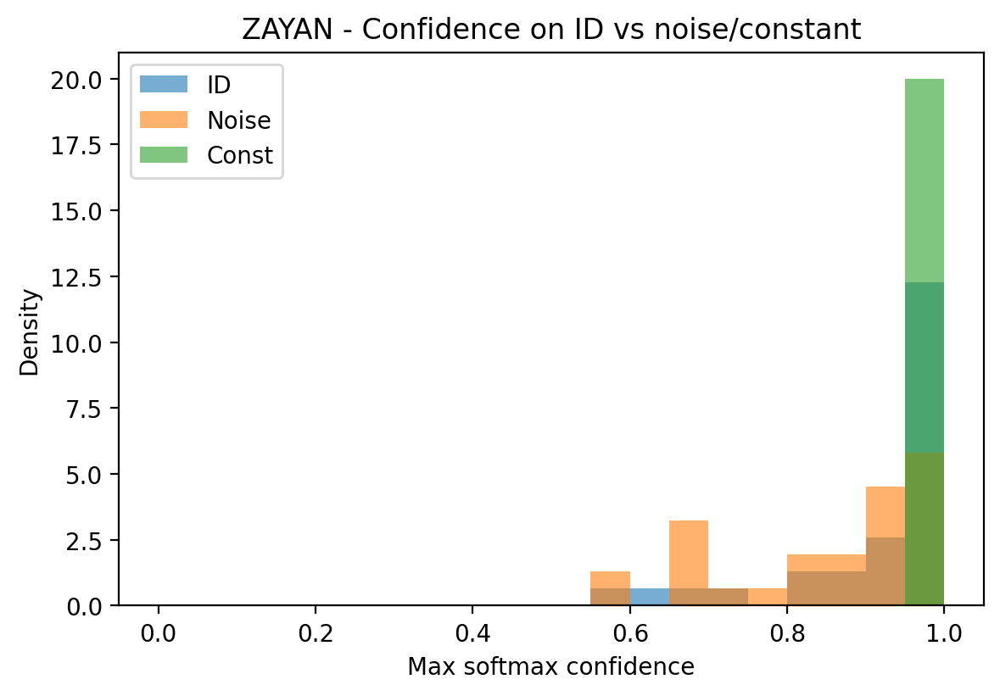

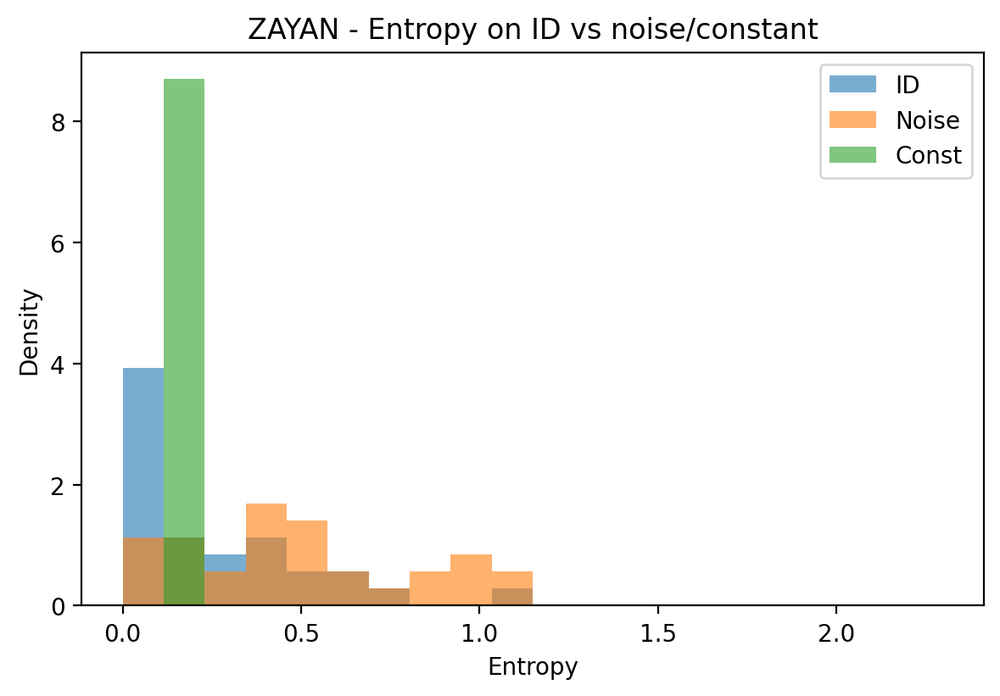

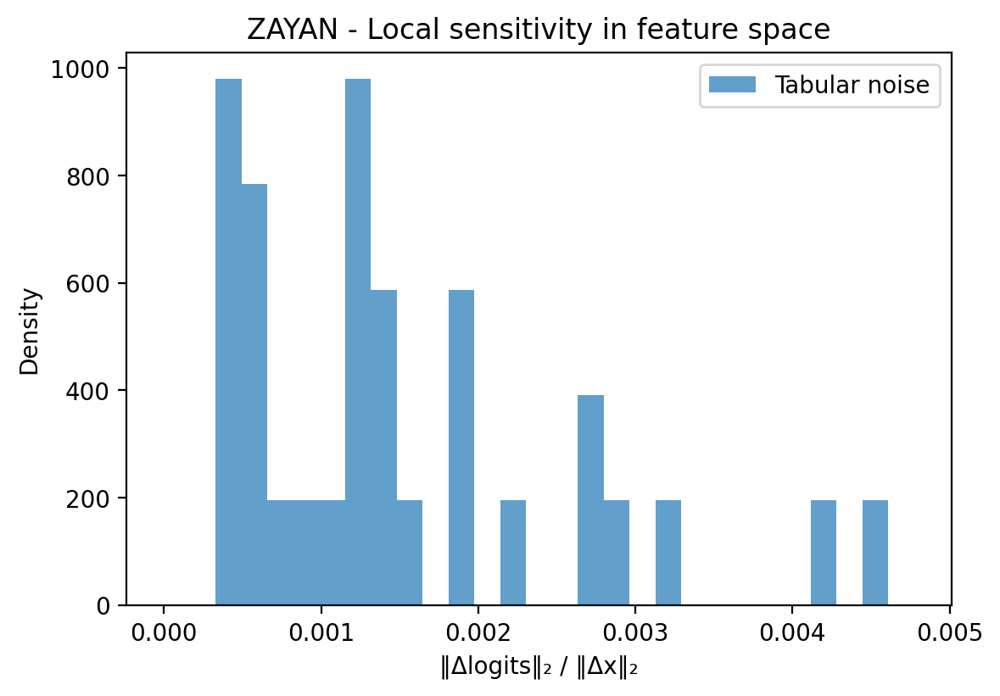

In [ ]:
# ===================== OOD + sensitivity diagnostics (ZAYAN, tabular) =====================
import numpy as np
import torch
import matplotlib.pyplot as plt
from pathlib import Path
import pandas as pd
from torch.utils.data import TensorDataset, DataLoader
from sklearn.metrics import accuracy_score

plt.rcParams.update({"savefig.facecolor": "white", "figure.facecolor": "white"})

# ---- Use ZAYAN best model + tabular test split ----
model = best_model          # ZAYAN wrapper (has .zt, .Z, .device)
device = model.device
print(f"[INFO] OOD + sensitivity diagnostics with ZAYAN on device={device}")

# ---- Build test matrix (ID data) ----
if isinstance(X_te, pd.DataFrame):
    X_te_arr = X_te.values.astype(np.float32)
else:
    X_te_arr = np.asarray(X_te, dtype=np.float32)

if isinstance(y_te, pd.Series):
    y_te_arr = y_te.to_numpy()
else:
    y_te_arr = np.asarray(y_te)

N, M = X_te_arr.shape
print(f"[Data] Test shape: N={N}, M={M} features")

# ---- Small DataLoader for reuse (if needed) ----
batch_size = best_params.get("batch_size", 32)
X_te_t = torch.tensor(X_te_arr, dtype=torch.float32)
y_te_t = torch.tensor(y_te_arr, dtype=torch.long)
test_ds = TensorDataset(X_te_t, y_te_t)
test_loader_z = DataLoader(test_ds, batch_size=batch_size, shuffle=False)

# ---------- Helper: forward pass on a DataLoader ----------
@torch.no_grad()
def predict_loader_zayan(loader):
    """
    Runs ZAYAN-T on a DataLoader of (xb, yb).

    Returns:
        logits: (N, C)
        probs:  (N, C)
        preds:  (N,)
        y:      (N,)
        embs:   (N, d)  pooled representations before MLP
    """
    model.zt.eval()
    Z = model.Z.to(device)   # (m, emb_dim)

    logits_all, probs_all, preds_all, y_all, embs_all = [], [], [], [], []

    for xb, yb in loader:
        xb = xb.to(device)
        yb = yb.to(device)

        bs, m = xb.shape
        H = xb.unsqueeze(-1) * Z.unsqueeze(0)             # (bs, m, d)
        H = H + model.zt.pos_embed.unsqueeze(0)
        H = model.zt.dropout(H)

        H = H.permute(1, 0, 2)                            # (m, bs, d)
        H_out = model.zt.transformer(H)
        H_out = H_out.permute(1, 0, 2)                    # (bs, m, d)

        rep = H_out.mean(dim=1)                           # (bs, d)
        logits = model.zt.mlp(rep)                        # (bs, C)
        probs  = torch.softmax(logits, dim=1)
        preds  = probs.argmax(dim=1)

        logits_all.append(logits.cpu())
        probs_all.append(probs.cpu())
        preds_all.append(preds.cpu())
        y_all.append(yb.cpu())
        embs_all.append(rep.cpu())

    logits = torch.cat(logits_all).numpy()
    probs  = torch.cat(probs_all).numpy()
    preds  = torch.cat(preds_all).numpy()
    y      = torch.cat(y_all).numpy()
    embs   = torch.cat(embs_all).numpy()
    return logits, probs, preds, y, embs

# ---------- Helper: run directly on a NumPy array X_arr ----------
@torch.no_grad()
def run_on_array_zayan(X_arr, batch_size=64):
    """
    X_arr: (N, M) float32
    Returns:
        logits, probs, max_conf, entropy
    """
    model.zt.eval()
    Z = model.Z.to(device)

    X_arr_t = torch.tensor(X_arr, dtype=torch.float32)
    logits_all, probs_all = [], []

    for i in range(0, X_arr_t.shape[0], batch_size):
        xb = X_arr_t[i:i+batch_size].to(device)
        bs, m = xb.shape

        H = xb.unsqueeze(-1) * Z.unsqueeze(0)             # (bs, m, d)
        H = H + model.zt.pos_embed.unsqueeze(0)
        H = model.zt.dropout(H)

        H = H.permute(1, 0, 2)                            # (m, bs, d)
        H_out = model.zt.transformer(H)
        H_out = H_out.permute(1, 0, 2)                    # (bs, m, d)

        rep = H_out.mean(dim=1)                           # (bs, d)
        logits = model.zt.mlp(rep)                        # (bs, C)
        probs = torch.softmax(logits, dim=1)

        logits_all.append(logits.cpu())
        probs_all.append(probs.cpu())

    logits = torch.cat(logits_all).numpy()
    probs  = torch.cat(probs_all).numpy()
    maxconf = probs.max(axis=1)
    entropy = -(probs * np.log(probs + 1e-12)).sum(axis=1)
    return logits, probs, maxconf, entropy

# ---------- 0. ID baseline stats ----------
logits_id, probs_id, preds_id, y_id, embs_id = predict_loader_zayan(test_loader_z)
probs_id = np.asarray(probs_id)
y_id     = np.asarray(y_id)
preds_id = np.asarray(preds_id)

maxconf_id = probs_id.max(axis=1)
entropy_id = -(probs_id * np.log(probs_id + 1e-12)).sum(axis=1)

print(f"[ID] N={len(y_id)}, accuracy={ (preds_id==y_id).mean()*100:.2f}%")
print(f"[ID] mean(max_conf)={maxconf_id.mean():.3f}, mean(entropy)={entropy_id.mean():.3f}")

# ---------- 1. Build OOD-ish tabular inputs ----------

# 1a) Gaussian noise features (same shape, ~N(0,1))
np.random.seed(0)
X_noise = np.random.normal(loc=0.0, scale=1.0, size=X_te_arr.shape).astype(np.float32)

# 1b) Column-shuffled features (break joint structure)
X_perm = X_te_arr.copy()
rng = np.random.default_rng(1)
for j in range(M):
    perm = rng.permutation(N)
    X_perm[:, j] = X_perm[perm, j]

# 1c) Constant "blank" features: dataset-wise mean per column
X_const = np.tile(X_te_arr.mean(axis=0, keepdims=True), (N, 1)).astype(np.float32)

# ---------- 1'. Run ZAYAN on OOD sets ----------
_, probs_noise, maxconf_noise, entropy_noise = run_on_array_zayan(X_noise, batch_size=batch_size)
_, probs_perm,  maxconf_perm,  entropy_perm  = run_on_array_zayan(X_perm,  batch_size=batch_size)
_, probs_const, maxconf_const, entropy_const = run_on_array_zayan(X_const, batch_size=batch_size)

print(f"[Noise] mean(max_conf)={maxconf_noise.mean():.3f}, mean(entropy)={entropy_noise.mean():.3f}")
print(f"[Perm ] mean(max_conf)={maxconf_perm.mean():.3f},  mean(entropy)={entropy_perm.mean():.3f}")
print(f"[Const] mean(max_conf)={maxconf_const.mean():.3f}, mean(entropy)={entropy_const.mean():.3f}")

# ---------- 2. Confidence & entropy histograms ----------
bins_conf = np.linspace(0.0, 1.0, 21)

plt.figure(figsize=(6.0, 4.2))
plt.hist(maxconf_id,    bins=bins_conf, alpha=0.6, label="ID",    density=True)
plt.hist(maxconf_noise, bins=bins_conf, alpha=0.6, label="Noise", density=True)
plt.hist(maxconf_const, bins=bins_conf, alpha=0.6, label="Const", density=True)
plt.xlabel("Max softmax confidence")
plt.ylabel("Density")
plt.title("ZAYAN - Confidence on ID vs noise/constant")
plt.legend()
plt.tight_layout()
plt.savefig("zayan_conf_id_vs_noise_const.png", dpi=600, bbox_inches="tight")

bins_ent = np.linspace(0.0, np.log(probs_id.shape[1]) + 0.1, 21)

plt.figure(figsize=(6.0, 4.2))
plt.hist(entropy_id,    bins=bins_ent, alpha=0.6, label="ID",    density=True)
plt.hist(entropy_noise, bins=bins_ent, alpha=0.6, label="Noise", density=True)
plt.hist(entropy_const, bins=bins_ent, alpha=0.6, label="Const", density=True)
plt.xlabel("Entropy")
plt.ylabel("Density")
plt.title("ZAYAN - Entropy on ID vs noise/constant")
plt.legend()
plt.tight_layout()
plt.savefig("zayan_entropy_id_vs_noise_const.png", dpi=600, bbox_inches="tight")

# ---------- 3. Local sensitivity (Lipschitz-ish in feature space) ----------
@torch.no_grad()
def local_sensitivity_zayan(X_arr, eps=0.10, n_samples=200, batch_size=32):
    """
    Approximate local Lipschitz constant:
        ratio = ||Δlogits||_2 / ||Δx||_2
    where Δx is small random L2-normalized noise in feature space.
    """
    model.zt.eval()
    Z = model.Z.to(device)

    X_arr_t = torch.tensor(X_arr, dtype=torch.float32)
    N_local = X_arr_t.shape[0]
    idx = np.random.choice(N_local, size=min(n_samples, N_local), replace=False)

    ratios = []
    for start in range(0, len(idx), batch_size):
        batch_idx = idx[start:start+batch_size]
        if len(batch_idx) == 0:
            break

        xb = X_arr_t[batch_idx].to(device)      # (B, M)
        bs, m = xb.shape

        # Base logits
        H = xb.unsqueeze(-1) * Z.unsqueeze(0)
        H = H + model.zt.pos_embed.unsqueeze(0)
        H = model.zt.dropout(H)
        Ht = H.permute(1, 0, 2)
        H_out = model.zt.transformer(Ht)
        H_out = H_out.permute(1, 0, 2)
        rep_base = H_out.mean(dim=1)
        logits_base = model.zt.mlp(rep_base)    # (B, C)

        # Random L2-normalized noise in feature space
        noise = torch.randn_like(xb)
        noise_flat = noise.view(noise.size(0), -1)
        norm = torch.norm(noise_flat, dim=1, keepdim=True) + 1e-12
        noise = noise / norm * eps
        xb_pert = xb + noise

        # Perturbed logits
        H2 = xb_pert.unsqueeze(-1) * Z.unsqueeze(0)
        H2 = H2 + model.zt.pos_embed.unsqueeze(0)
        H2 = model.zt.dropout(H2)
        H2t = H2.permute(1, 0, 2)
        H2_out = model.zt.transformer(H2t)
        H2_out = H2_out.permute(1, 0, 2)
        rep_pert = H2_out.mean(dim=1)
        logits_pert = model.zt.mlp(rep_pert)

        diff = logits_pert - logits_base
        diff_norm = diff.view(diff.size(0), -1).norm(dim=1)
        inp_norm  = noise_flat.norm(dim=1)      # ~eps * sqrt(M)

        ratios.extend((diff_norm / (inp_norm + 1e-12)).cpu().numpy())

    return np.array(ratios)

sens_tab = local_sensitivity_zayan(X_te_arr, eps=0.10, n_samples=200, batch_size=batch_size)

print(f"\n[Local sensitivity] tab eps=0.10, mean ratio={sens_tab.mean():.3f}, median={np.median(sens_tab):.3f}")

plt.figure(figsize=(6.0, 4.2))
bins_s = np.linspace(0.0, sens_tab.max() * 1.05, 30)
plt.hist(sens_tab, bins=bins_s, alpha=0.7, label="Tabular noise", density=True)
plt.xlabel("‖Δlogits‖₂ / ‖Δx‖₂")
plt.ylabel("Density")
plt.title("ZAYAN - Local sensitivity in feature space")
plt.legend()
plt.tight_layout()
plt.savefig("zayan_local_sensitivity_tab.png", dpi=600, bbox_inches="tight")

print("\n[Done] OOD + sensitivity diagnostics (ZAYAN) complete.")
print("Saved figures:")
print("  - zayan_conf_id_vs_noise_const.png")
print("  - zayan_entropy_id_vs_noise_const.png")
print("  - zayan_local_sensitivity_tab.png")

# Deployment-Oriented Triage Diagnostics

[INFO] Deployment-style diagnostics with ZAYAN on device=cuda
[Data] Test shape: N=31, M=147
[Info] N=31, num_classes=9
[Info] Base multiclass accuracy: 83.87%

[Triage] Using class 0 as positive vs others.
[Triage] Binary AUC (class 0 vs rest) = 1.000
[Triage] Chosen threshold th* = 0.5544 with sensitivity=1.000, specificity=1.000

[Triage] Confusion matrix at th* (rows=true, cols=pred):
          pred=0        pred=1
true=0         28           0
true=1          0           3

[Triage] Acc=100.00%, Prec=100.00%, Recall=100.00%

[Fairness] No `group_dict` found in globals; skipping fairness analysis.

[Reliability] Latency stats over 20 batches (ZAYAN):
  mean = 5.36 ms/batch
  p50  = 5.36 ms/batch
  p90  = 5.36 ms/batch
  p99  = 5.36 ms/batch

[Done] Deployment-style diagnostics (triage + fairness + latency, ZAYAN) complete.
If ROC ran, saved: zayan_triage_roc.png


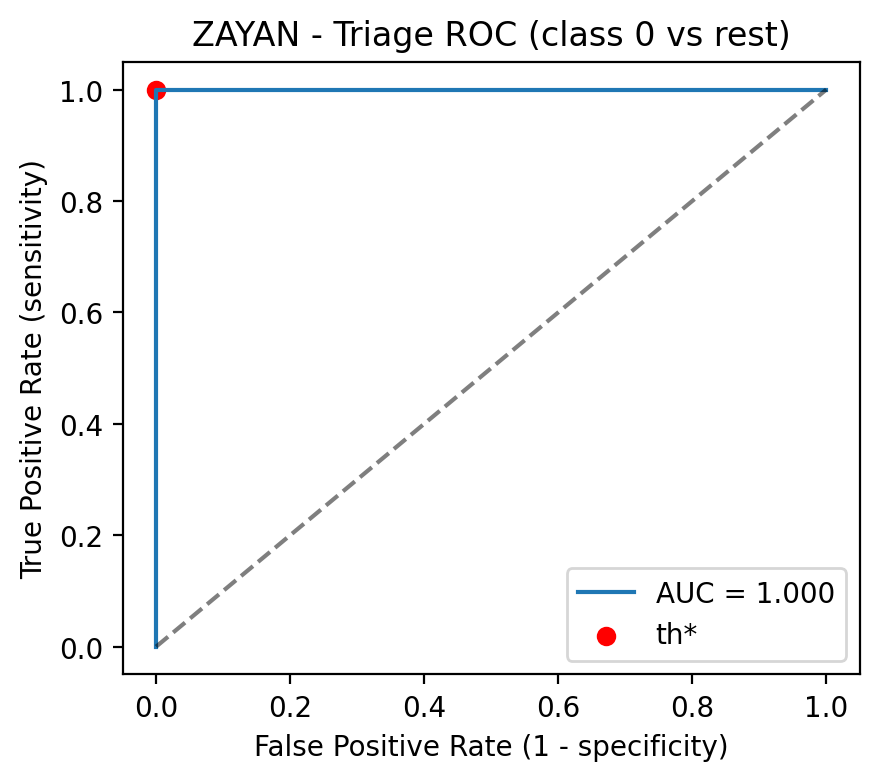

In [ ]:
# ============== Deployment-style diagnostics: triage & fairness & latency (ZAYAN) ==============
import numpy as np
import torch
import pandas as pd
import matplotlib.pyplot as plt
import time

from torch.utils.data import TensorDataset, DataLoader
from sklearn.metrics import (
    roc_curve, auc, confusion_matrix,
    accuracy_score, precision_score, recall_score
)

plt.rcParams.update({"savefig.facecolor": "white", "figure.facecolor": "white"})

# ----------------- 0) Hook ZAYAN model + test split -----------------
model = best_model            # trained ZAYAN wrapper
device = torch.device(model.device)  # FIX: make it a torch.device
print(f"[INFO] Deployment-style diagnostics with ZAYAN on device={device}")

# Build test arrays
if isinstance(X_te, pd.DataFrame):
    X_te_arr = X_te.values.astype(np.float32)
else:
    X_te_arr = np.asarray(X_te, dtype=np.float32)

if isinstance(y_te, pd.Series):
    y_te_arr = y_te.to_numpy()
else:
    y_te_arr = np.asarray(y_te)

N, M = X_te_arr.shape
print(f"[Data] Test shape: N={N}, M={M}")

batch_size = best_params.get("batch_size", 32)
X_te_t = torch.tensor(X_te_arr, dtype=torch.float32)
y_te_t = torch.tensor(y_te_arr, dtype=torch.long)
test_ds = TensorDataset(X_te_t, y_te_t)
test_loader_z = DataLoader(test_ds, batch_size=batch_size, shuffle=False)

# ----------------- 1) Helper: forward pass for ZAYAN -----------------
@torch.no_grad()
def predict_loader_zayan(loader):
    """
    Runs ZAYAN-T on a DataLoader of (xb, yb).

    Returns:
        logits: (N, C)
        probs:  (N, C)
        preds:  (N,)
        y:      (N,)
        embs:   (N, d)  pooled representations before MLP
    """
    model.zt.eval()
    Z = model.Z.to(device)  # (m, emb_dim)

    logits_all, probs_all, preds_all, y_all, embs_all = [], [], [], [], []

    for xb, yb in loader:
        xb = xb.to(device)
        yb = yb.to(device)

        bs, m = xb.shape
        # same pipeline as in ZAYAN_T.forward, but we stop at pooled rep
        H = xb.unsqueeze(-1) * Z.unsqueeze(0)              # (bs, m, d)
        H = H + model.zt.pos_embed.unsqueeze(0)
        H = model.zt.dropout(H)

        H = H.permute(1, 0, 2)                             # (m, bs, d)
        H_out = model.zt.transformer(H)
        H_out = H_out.permute(1, 0, 2)                     # (bs, m, d)

        rep = H_out.mean(dim=1)                            # (bs, d)
        logits = model.zt.mlp(rep)                         # (bs, C)
        probs  = torch.softmax(logits, dim=1)
        preds  = probs.argmax(dim=1)

        logits_all.append(logits.cpu())
        probs_all.append(probs.cpu())
        preds_all.append(preds.cpu())
        y_all.append(yb.cpu())
        embs_all.append(rep.cpu())

    logits = torch.cat(logits_all).numpy()
    probs  = torch.cat(probs_all).numpy()
    preds  = torch.cat(preds_all).numpy()
    y      = torch.cat(y_all).numpy()
    embs   = torch.cat(embs_all).numpy()
    return logits, probs, preds, y, embs

# ----------------- 2) Get base predictions -----------------
logits, probs, preds, y, embs = predict_loader_zayan(test_loader_z)
logits = np.asarray(logits)
probs  = np.asarray(probs)
preds  = np.asarray(preds)
y      = np.asarray(y)

num_classes = probs.shape[1]
N = len(y)
print(f"[Info] N={N}, num_classes={num_classes}")
print(f"[Info] Base multiclass accuracy: {accuracy_score(y, preds)*100:.2f}%")

# ----------------- 3) Triage-style binary task -----------------
# Decide which class is considered "high risk" for triage
# You can change this to whichever class index you care about.
POSITIVE_CLASS_ID = 0   #  CHANGE if needed

if POSITIVE_CLASS_ID < 0 or POSITIVE_CLASS_ID >= num_classes:
    raise ValueError(f"POSITIVE_CLASS_ID={POSITIVE_CLASS_ID} is out of range for {num_classes} classes.")

print(f"\n[Triage] Using class {POSITIVE_CLASS_ID} as positive vs others.")

# Binary labels: y_bin = 1 if class == POSITIVE_CLASS_ID, else 0
y_bin = (y == POSITIVE_CLASS_ID).astype(int)

# Probability of positive class
pos_prob = probs[:, POSITIVE_CLASS_ID]

# Degenerate case: all 0 or all 1
if np.unique(y_bin).size < 2:
    print("\n[Triage] Warning: test split has only one binary class "
          "(all positive or all negative). ROC/AUC is undefined.")
else:
    fpr, tpr, ths = roc_curve(y_bin, pos_prob)
    roc_auc = auc(fpr, tpr)
    print(f"[Triage] Binary AUC (class {POSITIVE_CLASS_ID} vs rest) = {roc_auc:.3f}")

    # Target sensitivity (e.g., 95%)
    TARGET_SENS = 0.95
    sens = tpr
    spec = 1 - fpr

    valid_idx = np.where(sens >= TARGET_SENS)[0]
    if len(valid_idx) == 0:
        print(f"[Triage] No threshold achieves sensitivity ≥ {TARGET_SENS:.2f}; "
              f"taking max sensitivity point instead.")
        best_idx = np.argmax(sens)
    else:
        # Among thresholds with desired sensitivity, pick one with highest specificity
        best_idx = valid_idx[np.argmax(spec[valid_idx])]

    th_star   = ths[best_idx]
    sens_star = sens[best_idx]
    spec_star = spec[best_idx]
    print(f"[Triage] Chosen threshold th* = {th_star:.4f} "
          f"with sensitivity={sens_star:.3f}, specificity={spec_star:.3f}")

    # Confusion matrix at th*
    y_hat_bin = (pos_prob >= th_star).astype(int)
    cm = confusion_matrix(y_bin, y_hat_bin, labels=[0, 1])
    tn, fp, fn, tp = cm.ravel()
    print("\n[Triage] Confusion matrix at th* (rows=true, cols=pred):")
    print("          pred=0        pred=1")
    print(f"true=0     {tn:6d}      {fp:6d}")
    print(f"true=1     {fn:6d}      {tp:6d}")

    def bin_metrics(y_true, y_pred):
        acc  = accuracy_score(y_true, y_pred)
        prec = precision_score(y_true, y_pred, zero_division=0)
        rec  = recall_score(y_true, y_pred, zero_division=0)
        return acc, prec, rec

    acc_star, prec_star, rec_star = bin_metrics(y_bin, y_hat_bin)
    print(f"\n[Triage] Acc={acc_star*100:.2f}%, "
          f"Prec={prec_star*100:.2f}%, Recall={rec_star*100:.2f}%")

    # ROC plot
    plt.figure(figsize=(4.5, 4.0))
    plt.plot(fpr, tpr, label=f"AUC = {roc_auc:.3f}")
    plt.plot([0, 1], [0, 1], "k--", alpha=0.5)
    plt.scatter(fpr[best_idx], tpr[best_idx], c="red", label="th*")
    plt.xlabel("False Positive Rate (1 - specificity)")
    plt.ylabel("True Positive Rate (sensitivity)")
    plt.title(f"ZAYAN - Triage ROC (class {POSITIVE_CLASS_ID} vs rest)")
    plt.legend()
    plt.tight_layout()
    plt.savefig("zayan_triage_roc.png", dpi=600, bbox_inches="tight")

# ----------------- 4) Fairness-style slices (generic) -----------------
# If you have group metadata aligned with X_te / y_te, create:
#   group_dict = {
#       "sex": np.array([...]),
#       "age_bucket": np.array([...]),
#       ...
#   }
# and run this cell. Otherwise fairness is skipped gracefully.

if "group_dict" not in globals():
    print("\n[Fairness] No `group_dict` found in globals; skipping fairness analysis.")
else:
    group_dict_local = group_dict   # just alias

    print("\n[Fairness] Running slices on triage task for groups in group_dict.")

    def show_slice_metrics(mask, name, y_bin, y_hat_bin):
        if mask.sum() == 0:
            print(f"[Fairness] {name}: no samples.")
            return
        y_true_bin = y_bin[mask]
        y_pred_bin = y_hat_bin[mask]

        cm = confusion_matrix(y_true_bin, y_pred_bin, labels=[0, 1])
        tn, fp, fn, tp = cm.ravel()
        sens = tp / (tp + fn + 1e-12)
        spec = tn / (tn + fp + 1e-12)
        acc  = accuracy_score(y_true_bin, y_pred_bin)
        print(f"[Fairness] {name}: n={mask.sum()}, "
              f"Acc={acc*100:.2f}%, Sens={sens*100:.2f}%, Spec={spec*100:.2f}%")

    if np.unique(y_bin).size < 2:
        print("[Fairness] Binary labels degenerate; fairness on triage not meaningful.")
    else:
        # If triage ROC ran, we have y_hat_bin. If not, default threshold 0.5.
        if "y_hat_bin" not in globals():
            print("[Fairness] y_hat_bin not defined from triage ROC; using threshold 0.5.")
            y_hat_bin = (pos_prob >= 0.5).astype(int)

        for attr_name, g_arr in group_dict_local.items():
            g_arr = np.asarray(g_arr)
            if g_arr.shape[0] != N:
                print(f"[Fairness] Skipping {attr_name}: length {len(g_arr)} != N={N}")
                continue

            print(f"\n[Fairness] Attribute: {attr_name} (values={np.unique(g_arr)})")
            for v in np.unique(g_arr):
                mask = (g_arr == v)
                show_slice_metrics(mask, f"{attr_name}={v}", y_bin, y_hat_bin)

# ----------------- 5) Latency stats on this hardware -----------------
def measure_latency_zayan(loader, num_batches=10):
    times = []
    model.zt.eval()
    Z = model.Z.to(device)

    with torch.no_grad():
        for bi, (xb, yb) in enumerate(loader):
            if bi >= num_batches:
                break
            xb = xb.to(device)

            if device.type == "cuda":
                torch.cuda.synchronize(device)
            t0 = time.time()

            # forward through ZAYAN-T (same as predict_loader_zayan)
            bs, m = xb.shape
            H = xb.unsqueeze(-1) * Z.unsqueeze(0)
            H = H + model.zt.pos_embed.unsqueeze(0)
            H = model.zt.dropout(H)
            Ht = H.permute(1, 0, 2)
            H_out = model.zt.transformer(Ht)
            H_out = H_out.permute(1, 0, 2)
            rep = H_out.mean(dim=1)
            _ = model.zt.mlp(rep)

            if device.type == "cuda":
                torch.cuda.synchronize(device)
            t1 = time.time()
            times.append(t1 - t0)
    return np.array(times)

lat = measure_latency_zayan(test_loader_z, num_batches=20)
if len(lat) > 0:
    print("\n[Reliability] Latency stats over 20 batches (ZAYAN):")
    print(f"  mean = {lat.mean()*1000:.2f} ms/batch")
    print(f"  p50  = {np.percentile(lat, 50)*1000:.2f} ms/batch")
    print(f"  p90  = {np.percentile(lat, 90)*1000:.2f} ms/batch")
    print(f"  p99  = {np.percentile(lat, 99)*1000:.2f} ms/batch")
else:
    print("\n[Reliability] Not enough batches for latency measurement.")

print("\n[Done] Deployment-style diagnostics (triage + fairness + latency, ZAYAN) complete.")
print("If ROC ran, saved: zayan_triage_roc.png")